In [7]:
#!pip install pdpbox
from time import time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import QuantileTransformer
from sklearn.pipeline import make_pipeline
from sklearn.ensemble import RandomForestClassifier
from xgboost import plot_importance
from sklearn.feature_selection import SelectKBest
from sklearn.inspection import partial_dependence
from sklearn.inspection import plot_partial_dependence
#path="../../data/"
path="../../../ukb/data/"

In [8]:
from boruta import BorutaPy

In [9]:
from utils import *
from MLModels import *
from DataProcessing import *

In [10]:

config = dict(scale_pos_weight = 6,subsample = 1, min_child_weight = 5, max_depth = 5, gamma= 2, 
              colsample_bytree= 0.6,smote=1)

config_rebal = dict(scale_pos_weight = 1,subsample = 1, min_child_weight = 5, max_depth = 5, gamma= 2, 
              colsample_bytree= 0.6,smote=1)


mod_xgb=XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
           colsample_bynode=1, learning_rate=0.1,
           max_delta_step=0,  missing=None,
           n_estimators=60, n_jobs=4, nthread=4, objective='binary:logistic',
           random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=config['scale_pos_weight'],
           min_child_weight=config['min_child_weight'],
           gamma=config['gamma'], colsample_bytree=config['colsample_bytree'],max_depth=config['max_depth'],
           seed=42, silent=None, subsample=1, verbosity=1)

mod_xgb_rebal=XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
           colsample_bynode=1, learning_rate=0.1,
           max_delta_step=0,  missing=None,
           n_estimators=60, n_jobs=4, nthread=4, objective='binary:logistic',
           random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=config_rebal['scale_pos_weight'],
           min_child_weight=config_rebal['min_child_weight'],
           gamma=config_rebal['gamma'], colsample_bytree=config_rebal['colsample_bytree'],max_depth=config_rebal['max_depth'],
           seed=42, silent=None, subsample=1, verbosity=1)

mod_rf = RandomForestClassifier(max_depth=5, random_state=0)

In [39]:



drvarsdef=['DIAB','CERVASC','PD','CERVASC','EPIL','eid','AUD']

drpvarAUD='date|year_of_birth|age|hospital_episode_type|AUD_bef|alcohol'

genos=[
 'Genotype_e1/e4',
 'Genotype_e2/e2',
 'Genotype_e2/e3',
 'Genotype_e2/e4',
 'Genotype_e3/e3',
 'Genotype_e3/e4',
 'Genotype_e4/e4']

genotypes=['Genotype_e1/e2',"Genotype_e2/e2","Genotype_e2/e3","Genotype_e3/e3","Genotype_e2/e4","Genotype_e1/e4",
          "Genotype_e3/e4","Genotype_e4/e4"]

gen_lkup={'Genotype_e2/e2':1,"Genotype_e1/e2":2,"Genotype_e2/e3":3,"Genotype_e3/e3":4,
          "Genotype_e2/e4":5,"Genotype_e1/e4":6,"Genotype_e3/e4":7,"Genotype_e4/e4":8}

gen_lkup_rev={1:'Genotype_e2/e2',2:"Genotype_e1/e2",3:"Genotype_e2/e3",4:"Genotype_e3/e3",
          5:"Genotype_e2/e4",6:"Genotype_e1/e4",7:"Genotype_e3/e4",8:"Genotype_e4/e4"}

def traintest_df(df,rat=0.7):
    maskAD=(df['AD']==1)
    
    sizeAD=len(df[maskAD])
    sizenoAD=len(df[~maskAD])
    sizeAD_tr=round(rat*sizeAD)
    sizenoAD_tr=round(rat*sizenoAD)
    
    train=pd.concat([df[maskAD].sample(sizeAD_tr),df[~maskAD].sample(sizenoAD_tr)],axis=0)
    test=df[~(df['eid'].isin(train['eid']))]
    return train,test

def score_df(df_train,df_val,dropcols,model,dropcolyn=1):
    if dropcolyn!=1:
        dropcols='AD'
        
    X_train=df_train.drop(columns=dropcols)
    y_train=df_train['AD']
    
    model_train=model.fit(X_train,y_train)
    
    X_test=df_val.drop(columns=dropcols)
    df_valout=df_val.copy()
    
    df_valout['risk']=model.predict_proba(X_test)[:, 1]
    return df_valout


       
def int_vars(df,var1,vars=genos):
    for var in vars:
        df[str(var1)+" "+var]=df[var]*df[var1]
    return df

def newfeats(df,shapsum,depvar='AD',feats=30):
    
    if feats==max:
        cols=[col for col in df if col in np.asarray(shapsum['column_name'])]
    
    else:
        cols=[col for col in df if col in np.asarray(shapsum.head(feats)['column_name'])]
    
    if 'eid' in cols:
        df_out=df[np.append(['AD'],cols)]   
    else:
        df_out=df[np.append(['AD','eid'],cols)]
    return df_out

def cleandf(df,alm=1):
    df=replacenullsmean(df)
    
    if alm==1:
        df['AST_ALT_ratio']=round((df['aspartate_aminotransferase_f30650']\
                                          /df['alanine_aminotransferase_f30620']),1)

    #change to any of the pollution metrics in the top 40%
        
        mask_sleep_mr=(df['sleep_duration_f1160'].between(6,8))
        mask_sleep_high=(df['sleep_duration_f1160']>8)
        
        df['sleep']=0
        df['sleep'][mask_sleep_mr]=1
        df['sleep'][mask_sleep_high]=2
        
        #pollution
        df['polluted']=0
        df['polluted'][(df['particulate_matter_air_pollution_pm25_absorbance_2010_f24007']>9)]=1


    df=col_spec_chars(df)
    #df=replace_genotype(df,gen_lkup,genotypes)
    return df

def maskapoedf(df,apoe=1):
    apoemask=(df['Genotype_e3/e4']==1)|(df['Genotype_e4/e4']==1)|\
    (df['Genotype_e2/e4']==1)|(df['Genotype_e1/e4']==1)
    non_apoemask=(df['Genotype_e2/e3']==1)|(df['Genotype_e3/e3']==1)|\
    (df['Genotype_e1/e2']==1)|(df['Genotype_e2/e2']==1)

    if apoe==2:
        return df[apoemask|non_apoemask]
    elif apoe==1:  
        return df[apoemask]
    elif apoe==0:  
        return df[non_apoemask]
    

def summarise_score_data(df):
    df=pd.DataFrame(df.groupby(['eid']).agg({'AD':'max','risk':['mean','std']})).reset_index()
    df.columns=['eid','AD','risk','std_risk']   
    return df

def runmodel(df,dropcols,reps,splits,model):
    
    dropcols=[col for col in dropcols if 'AD' not in dropcols]
    df_out=df.drop(columns=dropcols)
    df_test_out=pd.DataFrame([])
    for reps in range(reps):
        if reps-round(reps/5)*5==0:
            print(reps)
        kf = KFold(n_splits=splits,shuffle=True)

        for train_index, test_index in kf.split(df_out):
            df_train, df_test = df_out.iloc[train_index,: ], df_out.iloc[test_index, :]
            
            df_score=df_test[['eid','AD']]

            X_train, X_test = df_train.drop(columns='AD'), df_test.drop(columns='AD')
            y_train, y_test = df_train['AD'], df_test['AD']

            model.fit(X_train,y_train)   
            #plot_importance(model,max_num_features=10)
            
            boruta_selector = BorutaPy(model, n_estimators='auto', verbose = 2)

            boruta_selector.fit(np.array(X_train), np.array(y_train))
            
            df_score['risk']=model.predict_proba(X_test)[:, 1]
            df_test_out=pd.concat([df_test_out,df_score])
    df_test_out=summarise_score_data(df_test_out)
    print(df_test_out.shape)
    return df_test_out




def plot_ROCAUC_mult(y_test, y_score,y_test1,y_score1,y_test2,y_score2,title,l1,l2,l3):
    
    
    fpr, tpr, _ = roc_curve(y_test,y_score)
    fpr1, tpr1, _ = roc_curve(y_test1,y_score1)
    fpr2, tpr2, _ = roc_curve(y_test2,y_score2)
    
    colors = ['darksalmon', 'gold', 'royalblue', 'mediumseagreen', 'violet'] 
    
    mean_auc = auc(fpr, tpr)
    mean_auc1 = auc(fpr1, tpr1)
    mean_auc2 = auc(fpr2, tpr2)
   
    
    print ("AUC Score (Train): %f" % metrics.roc_auc_score(y_test, y_score))


    plt.plot(fpr, tpr, 'b', alpha = 0.8,
             label=r'%s (AUC = %0.2f)' % (l1,mean_auc))
    plt.plot(fpr1, tpr1, 'c', alpha = 0.8,
             label=r'%s apoe (AUC = %0.2f)' % (l2,mean_auc1))
    plt.plot(fpr2, tpr2, 'm', alpha = 0.8,
             label=r'%s non apoe (AUC = %0.2f)' % (l3,mean_auc2))

    plt.plot([0, 1], [0, 1], linestyle = '--', lw = 2, color = 'r', label = 'Luck', alpha= 0.8)
    plt.xlim([-0.01, 1.01])
    plt.ylim([-0.01, 1.01])
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.legend(loc="lower right")
    plt.title(title)
    #plt.axes().set_aspect('equal', 'datalim')
    plt.show()


In [25]:
AUD_model_full=pd.read_pickle('%s%s' % (path,'AUD_model_full.p'))



In [27]:
AUD_model_full

,sex_f31_Female,sex_f31_Male,sex_f31_Unknown,birth_weight_known_f120_No,birth_weight_known_f120_Unknown,birth_weight_known_f120_Yes - Kilograms,birth_weight_known_f120_Yes - pounds and ounces,number_of_selfreported_cancers_f134_0.0,number_of_selfreported_cancers_f134_1.0,number_of_selfreported_cancers_f134_2.0,...,CERVASC_bef,CERVASCALL_bef,STROKE_bef,AD,EPIL,DIAB,CERVASC,CELIAC,PD,AUD
0,1,0,0,1,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1,0,0,0,0,0,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
432602,1,0,0,1,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
432603,1,0,0,0,0,0,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0
432604,1,0,0,0,0,0,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0
432605,1,0,0,0,0,0,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0


In [28]:
AUD_model_full=cleandf(AUD_model_full,alm=1)


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [40]:
dropvars_AUD=varstodrop(AUD_model_full,drpvarAUD,drvarsdef)

iteration: 0
Accuracy : 0.986
2605.0
AUC Score (Train): 0.859974


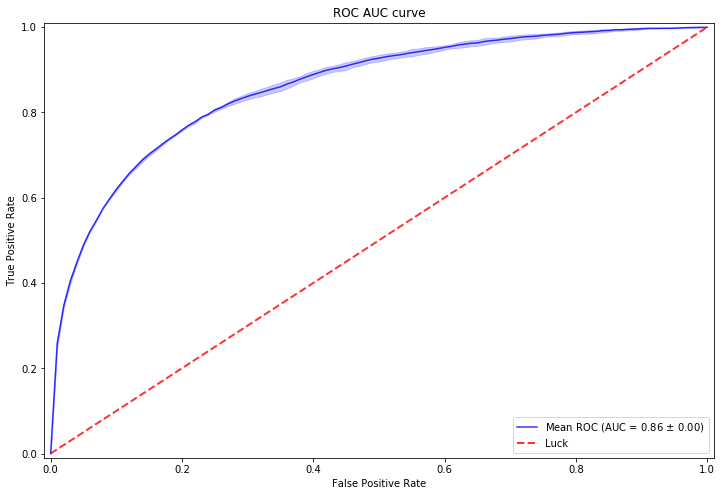

SHAP summary dot plot for selected feature number


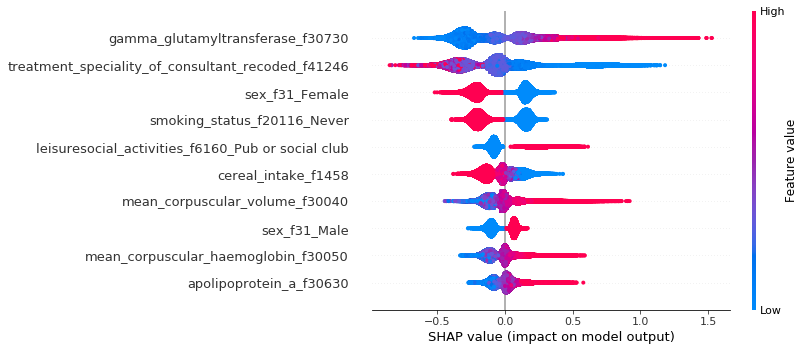

SHAP summary dot plot for 35 features


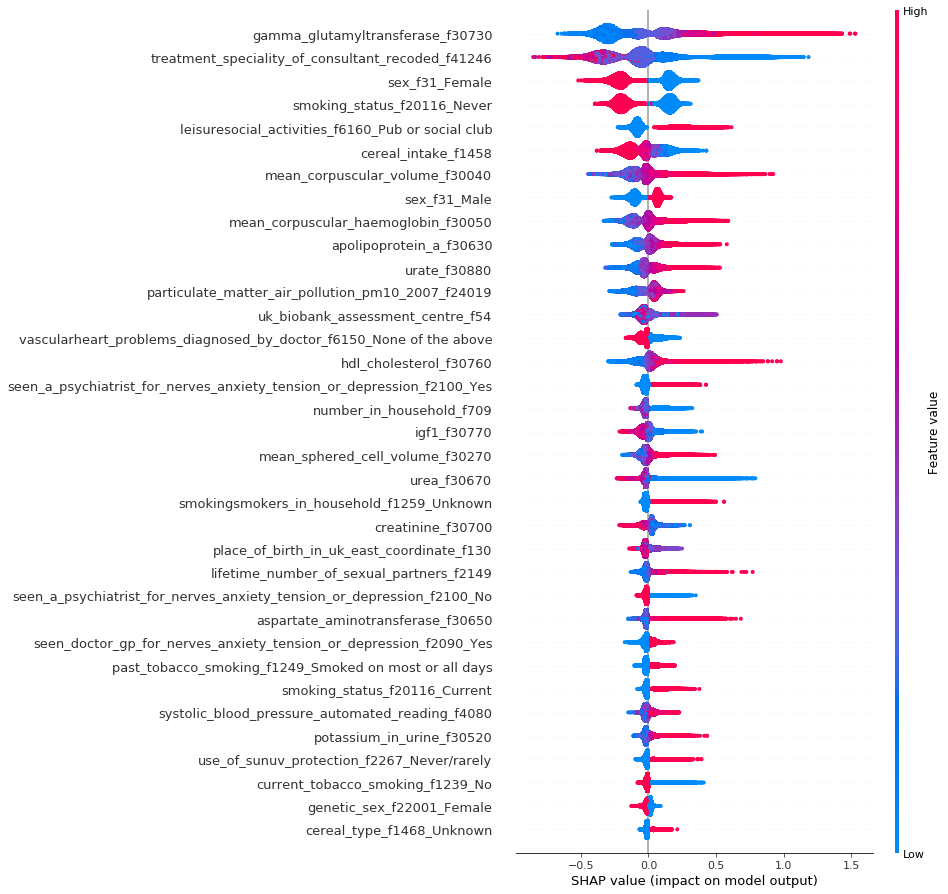

(                                            column_name  mean_shap_imp  \
 492                    gamma_glutamyltransferase_f30730       0.250932   
 1344  treatment_speciality_of_consultant_recoded_f41246       0.223233   
 1218                                     sex_f31_Female       0.196900   
 1252                        smoking_status_f20116_Never       0.175529   
 696   leisuresocial_activities_f6160_Pub or social club       0.116224   
 ...                                                 ...            ...   
 559   haemoglobin_concentration_freezethaw_cycles_f3...       0.000000   
 557   haemoglobin_concentration_device_id_f30023_Unk...       0.000000   
 556   haemoglobin_concentration_device_id_f30023_AK3...       0.000000   
 555   haemoglobin_concentration_device_id_f30023_AK2...       0.000000   
 1492       worry_too_long_after_embarrassment_f2000_Yes       0.000000   
 
       std_shap_imp  min_rank  max_rank    mean_rank  median_rank    std_rank  
 492       0.01518

In [42]:
newmodelrun(AUD_model_full,dropvars=dropvars_AUD,model=mod_xgb,depvar='AUD',
                    reps=1,splits=3,rebalance=0,max_display=10,plot_type="dot",shap=1,plots=1)


#### Data Cleaning

In [104]:
AD_model_full70=cleandf(AD_model_full70,alm=1)
AD_model_full_modify=cleandf(AD_model_full_modify,alm=0)
AD_model_full_gfilt=maskapoedf(AD_model_full70,apoe=2)
AD_model_full_modify=maskapoedf(AD_model_full_modify,apoe=2)


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [105]:
AD_model_full_gfilt_apoe=maskapoedf(AD_model_full_gfilt,apoe=1)
AD_model_full_gfilt_nonapoe=maskapoedf(AD_model_full_gfilt,apoe=0)

AD_model_full_mod_apoe=maskapoedf(AD_model_full_modify,apoe=1)
AD_model_full_mod_nonapoe=maskapoedf(AD_model_full_modify,apoe=0)

In [113]:
dropvars_modify=varstodrop(AD_model_full_modify,drpvars_mod,drvarsdef)
dropvars_gfilt=varstodrop(AD_model_full_gfilt,drpvars1,drvarsdef)

In [108]:
dropvars_gfilt

array(['sex_f31_Unknown', 'birth_weight_known_f120_Unknown',
       'number_of_selfreported_cancers_f134_Unknown',
       'type_of_accommodation_lived_in_f670_Unknown',
       'own_or_rent_accommodation_lived_in_f680_Unknown',
       'average_total_household_income_before_tax_f738_Unknown',
       'usual_walking_pace_f924_Unknown',
       'frequency_of_stair_climbing_in_last_4_weeks_f943_Unknown',
       'drive_faster_than_motorway_speed_limit_f1100_Unknown',
       'length_of_mobile_phone_use_f1110_Unknown',
       'weekly_usage_of_mobile_phone_in_last_3_months_f1120_Unknown',
       'handsfree_devicespeakerphone_use_with_mobile_phone_in_last_3_month_f1130_Unknown',
       'difference_in_mobile_phone_use_compared_to_two_years_previously_f1140_Unknown',
       'usual_side_of_head_for_mobile_phone_use_f1150_Unknown',
       'getting_up_in_morning_f1170_Unknown',
       'morningevening_person_chronotype_f1180_Unknown',
       'nap_during_day_f1190_Unknown',
       'sleeplessness_insomnia

#### Run Models

iteration: 0



Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#deprecate-loc-reindex-listlike


Accuracy : 0.9896
1090.0
AUC Score (Train): 0.784468


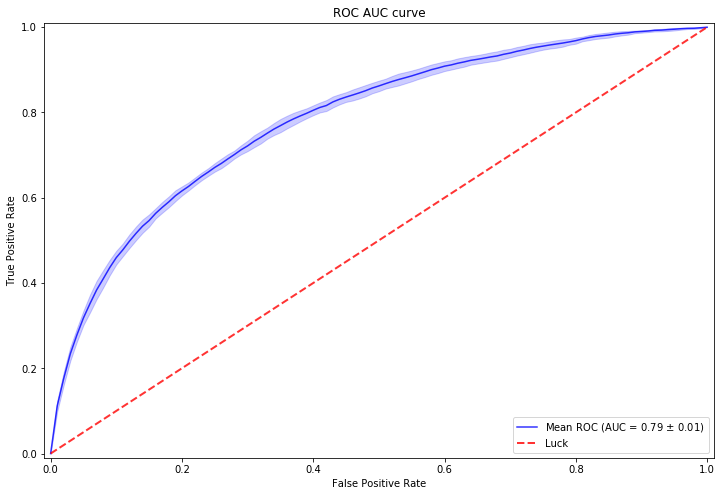

SHAP summary dot plot for selected feature number


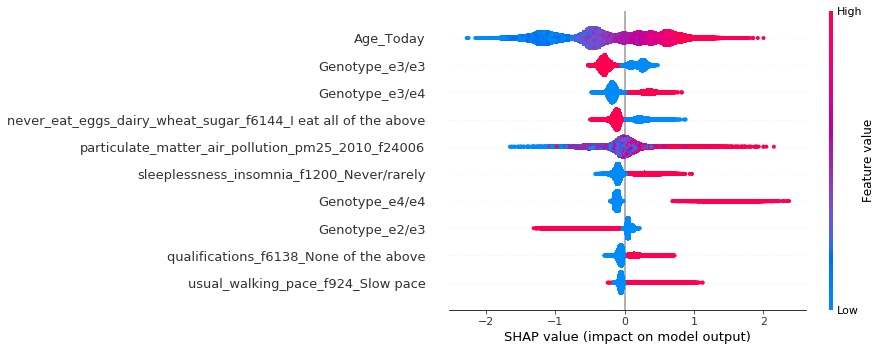

SHAP summary dot plot for 35 features


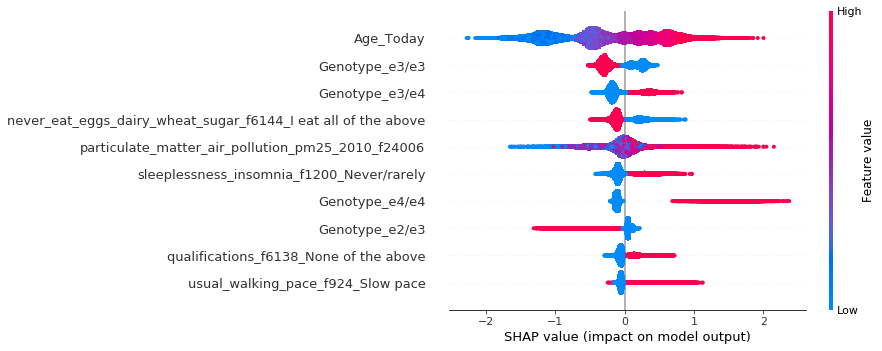

iteration: 0



Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#deprecate-loc-reindex-listlike


iteration: 1
iteration: 2
iteration: 3
iteration: 4
Accuracy : 0.9754
1174.0
AUC Score (Train): 0.744614


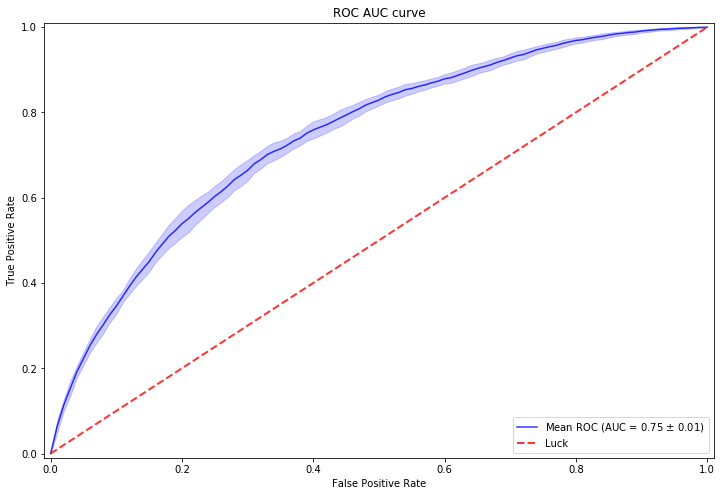

SHAP summary dot plot for selected feature number


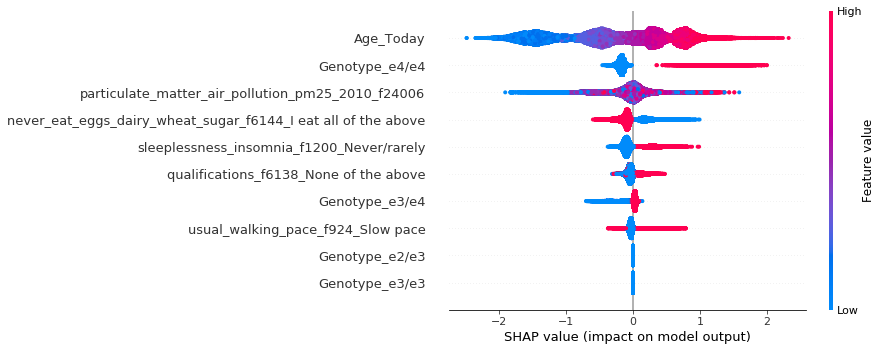

SHAP summary dot plot for 35 features


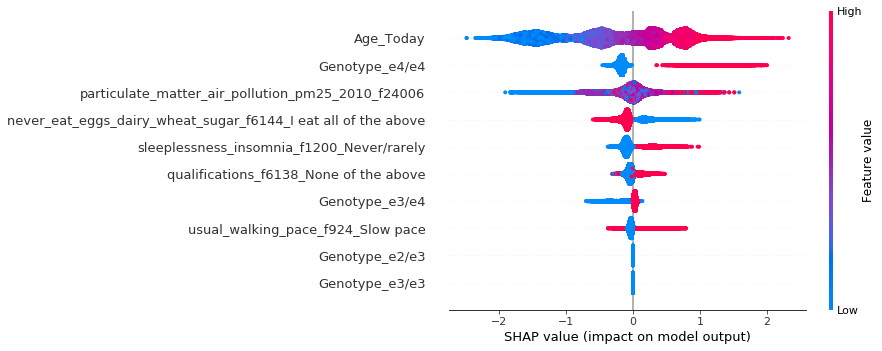

iteration: 0



Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#deprecate-loc-reindex-listlike


iteration: 1
iteration: 2
iteration: 3
iteration: 4
Accuracy : 0.9951
20.0
AUC Score (Train): 0.684679


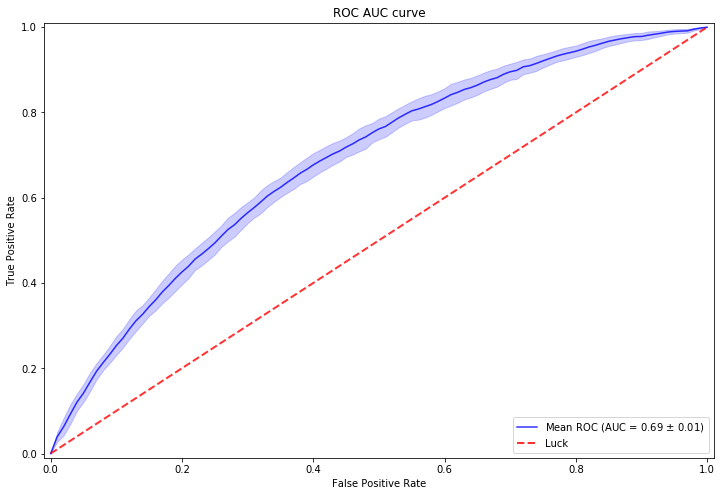

SHAP summary dot plot for selected feature number


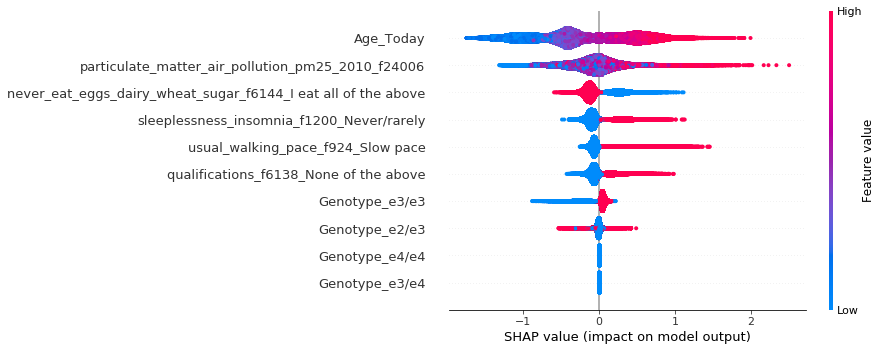

SHAP summary dot plot for 35 features


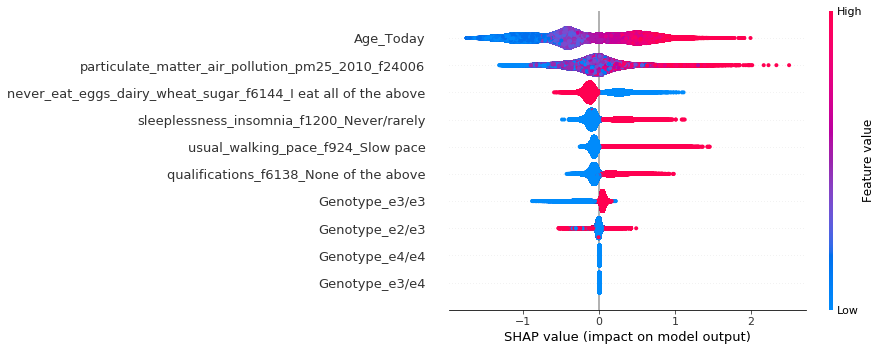

(                                         column_name  mean_shap_imp  \
 0                                          Age_Today       0.563988   
 6  particulate_matter_air_pollution_pm25_2010_f24006       0.223409   
 5  never_eat_eggs_dairy_wheat_sugar_f6144_I eat a...       0.171918   
 8          sleeplessness_insomnia_f1200_Never/rarely       0.149785   
 9                  usual_walking_pace_f924_Slow pace       0.110794   
 7             qualifications_f6138_None of the above       0.104842   
 2                                     Genotype_e3/e3       0.082675   
 1                                     Genotype_e2/e3       0.030247   
 3                                     Genotype_e3/e4       0.000000   
 4                                     Genotype_e4/e4       0.000000   
 
    std_shap_imp  min_rank  max_rank  mean_rank  median_rank  std_rank  
 0      0.037055         0         0   0.000000            0  0.000000  
 6      0.022492         1         2   1.066667            1

In [45]:
keepvars=['AD','eid','Age_Today','Genotype_e3/e3','Genotype_e3/e4','Genotype_e4/e4','Genotype_e2/e3',
         'particulate_matter_air_pollution_pm25_2010_f24006',
          'never_eat_eggs_dairy_wheat_sugar_f6144_I eat all of the above',
         'usual_walking_pace_f924_Slow pace',
          'qualifications_f6138_None of the above','sleeplessness_insomnia_f1200_Never/rarely']
newmodelrun(AD_model_full_gfilt[keepvars],dropvars=['AD','eid'],model=mod_xgb,depvar='AD',
                    reps=5,splits=3,rebalance=0,max_display=10,plot_type="dot",shap=1,plots=1)

newmodelrun(AD_model_full_gfilt_apoe[keepvars],dropvars=['AD','eid'],model=mod_xgb,depvar='AD',
                    reps=5,splits=3,rebalance=0,max_display=10,plot_type="dot",shap=1,plots=1)
newmodelrun(AD_model_full_gfilt_nonapoe[keepvars],dropvars=['AD','eid'],model=mod_xgb,depvar='AD',
                    reps=5,splits=3,rebalance=0,max_display=10,plot_type="dot",shap=1,plots=1)

iteration: 0
iteration: 1
iteration: 2
iteration: 3
iteration: 4
Accuracy : 0.9903
512.0
AUC Score (Train): 0.811767


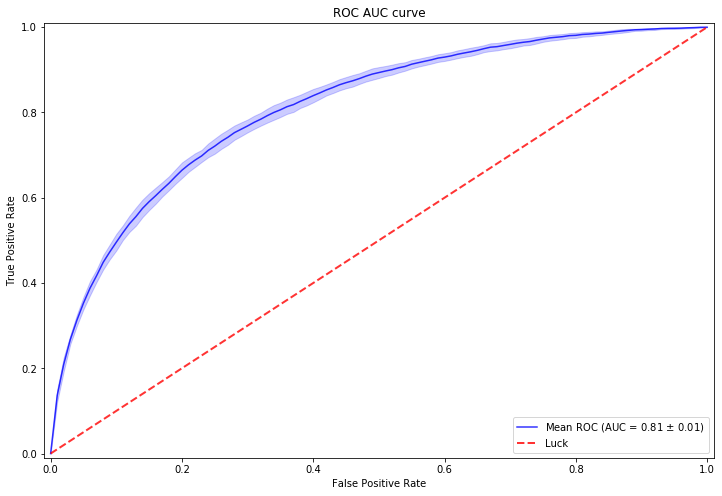

SHAP summary dot plot for selected feature number


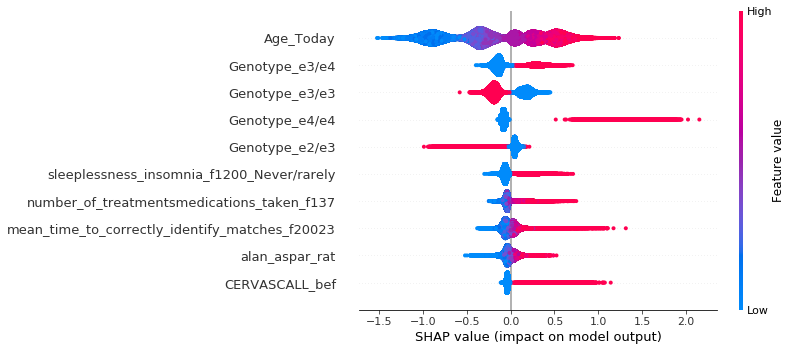

SHAP summary dot plot for 35 features


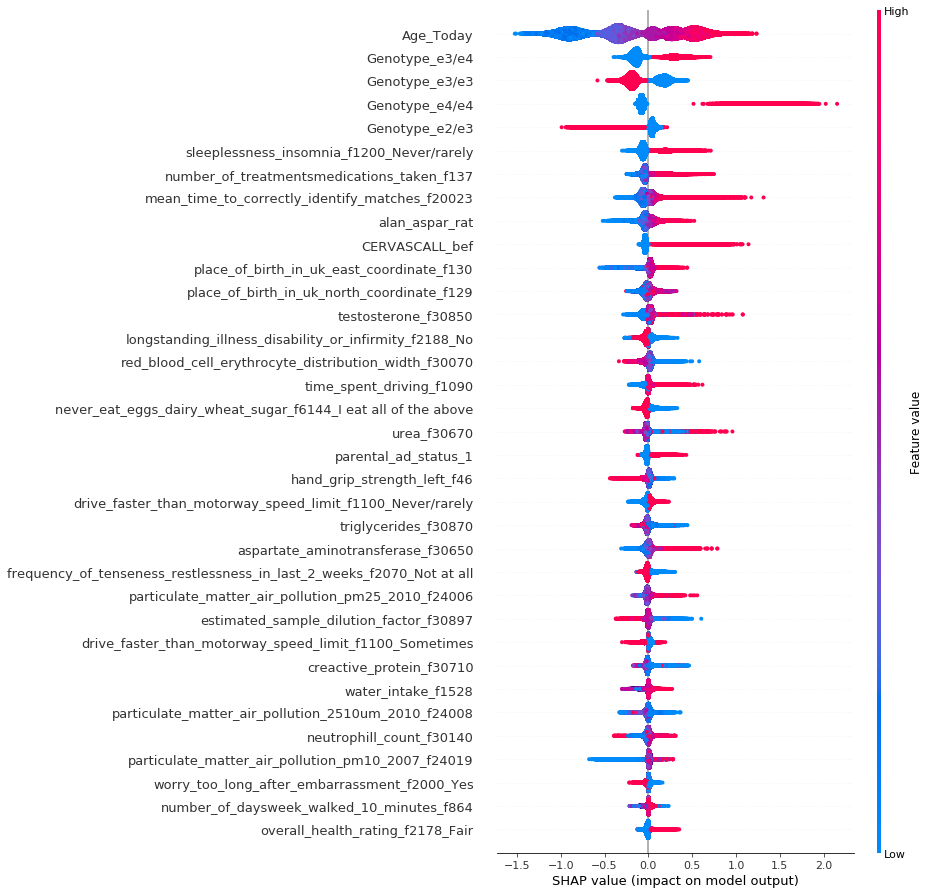

In [37]:
s_g,score_g=newmodelrun(AD_model_full_gfilt,dropvars=dropvars_gfilt,model=mod_xgb,depvar='AD',
                    reps=5,splits=3,rebalance=0,max_display=10,plot_type="dot",shap=1,plots=1)

iteration: 0



Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#deprecate-loc-reindex-listlike


Accuracy : 0.9903
82.0
AUC Score (Train): 0.806408


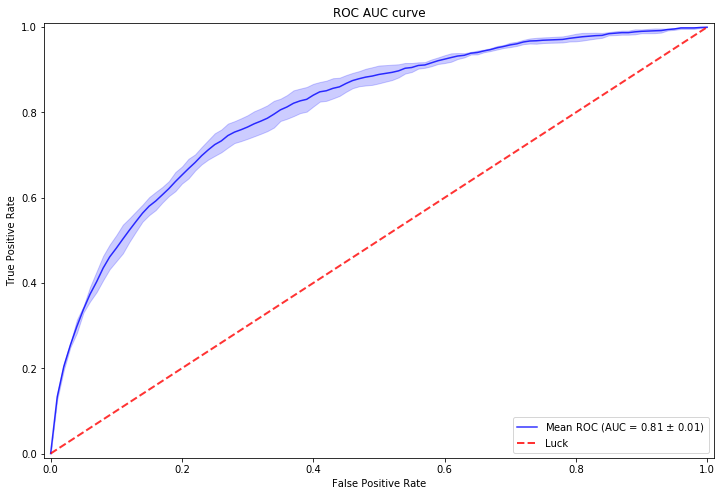

SHAP summary dot plot for selected feature number


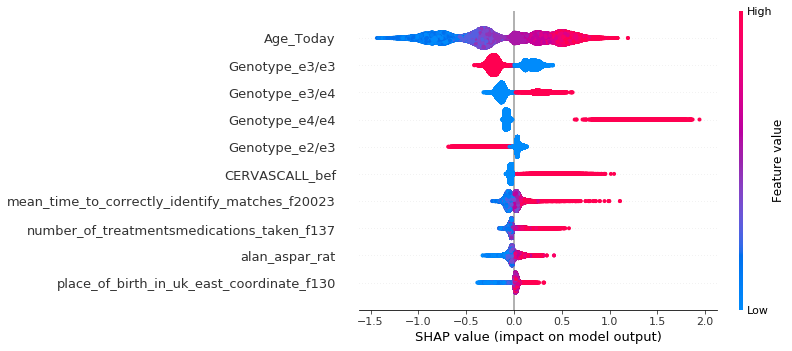

SHAP summary dot plot for 35 features


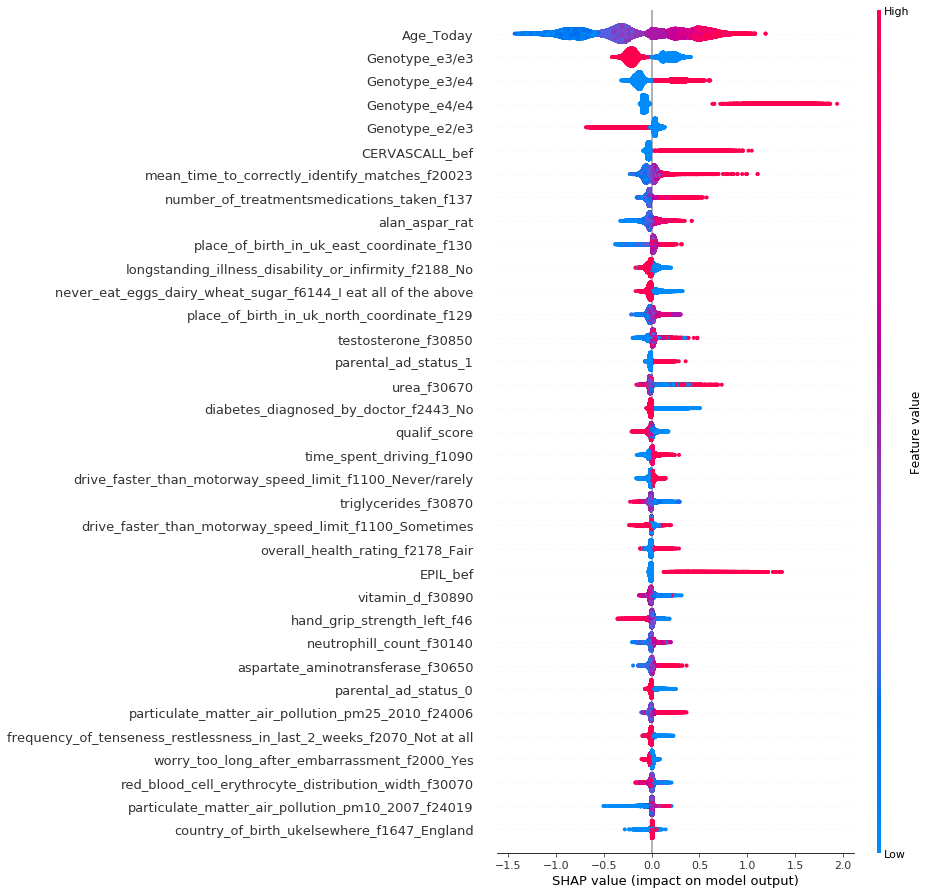

In [74]:
dropvars_gfilt_nosleep=varstodrop(AD_model_full_gfilt,drpvars1+'|sleepless|qualif_score_|qualifications',drvarsdef)
s_g,score_g=newmodelrun(AD_model_full_gfilt,dropvars=dropvars_gfilt_nosleep,model=mod_xgb,depvar='AD',
                    reps=1,splits=5,rebalance=0,max_display=10,plot_type="dot",shap=1,plots=1)


iteration: 0



Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#deprecate-loc-reindex-listlike


Accuracy : 0.991
243.0
AUC Score (Train): 0.853439


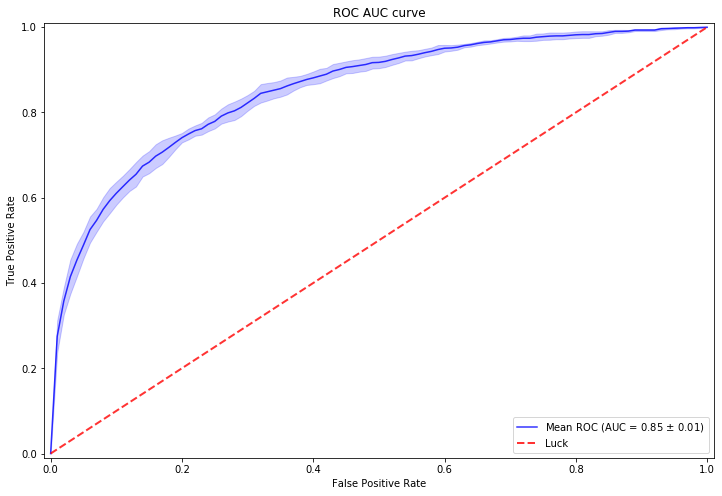

SHAP summary dot plot for selected feature number


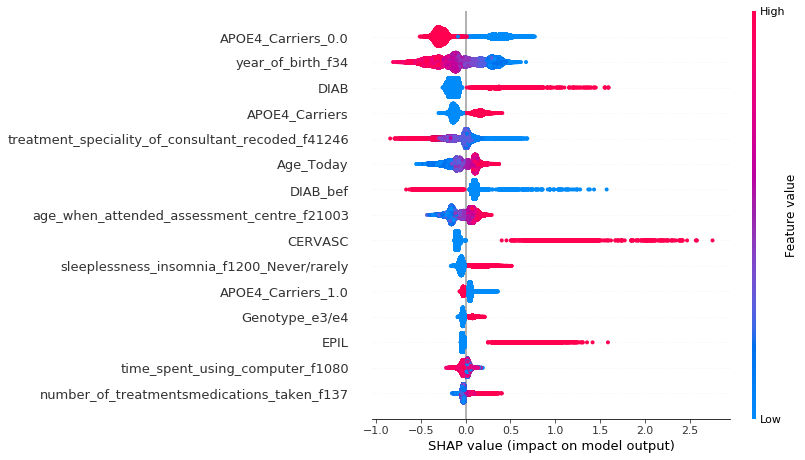

SHAP summary dot plot for 35 features


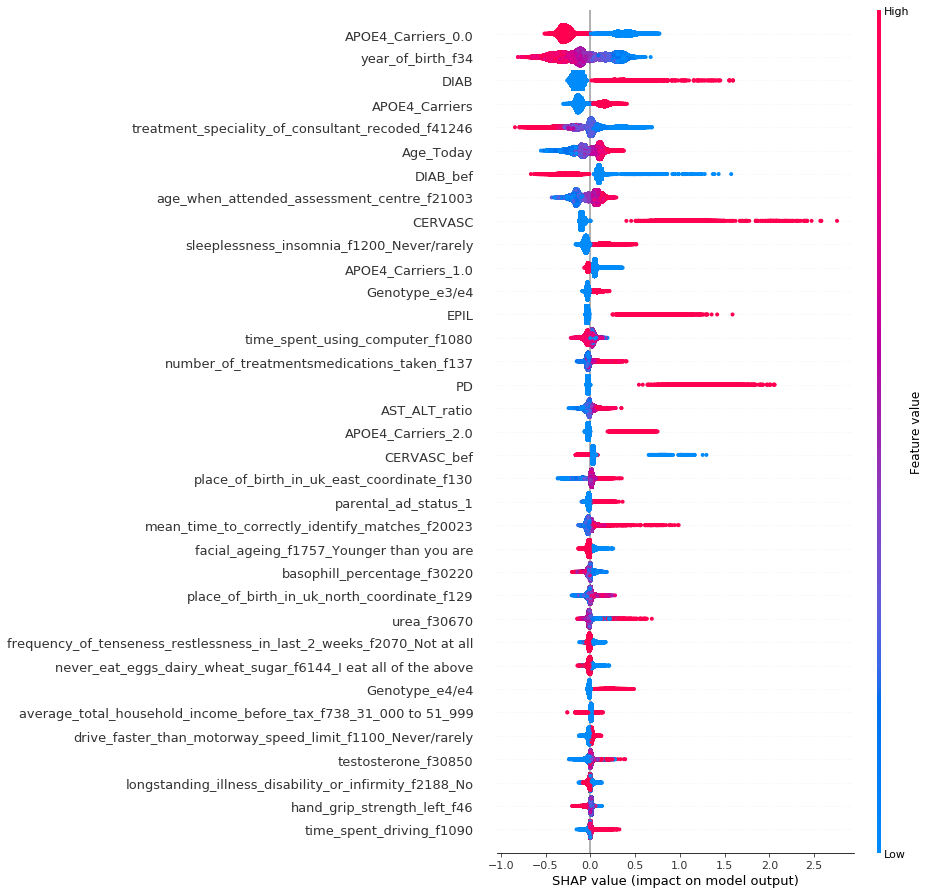

In [111]:
s_g2,score_g2=newmodelrun(AD_model_full_gfilt,dropvars=['AD','death'],model=mod_xgb,depvar='AD',
                    reps=1,splits=5,rebalance=0,max_display=15,plot_type="dot",shap=1,plots=1)


iteration: 0



Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#deprecate-loc-reindex-listlike


iteration: 1
iteration: 2
iteration: 3
iteration: 4
Accuracy : 0.9904
300.0
AUC Score (Train): 0.812171


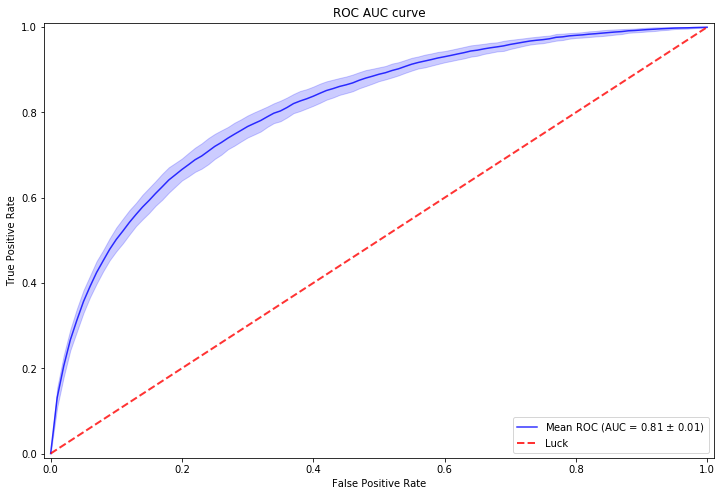

SHAP summary dot plot for selected feature number


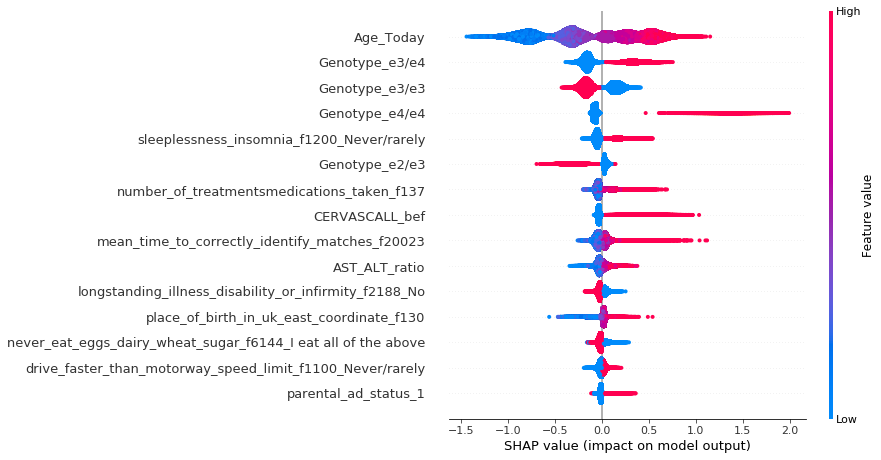

SHAP summary dot plot for 35 features


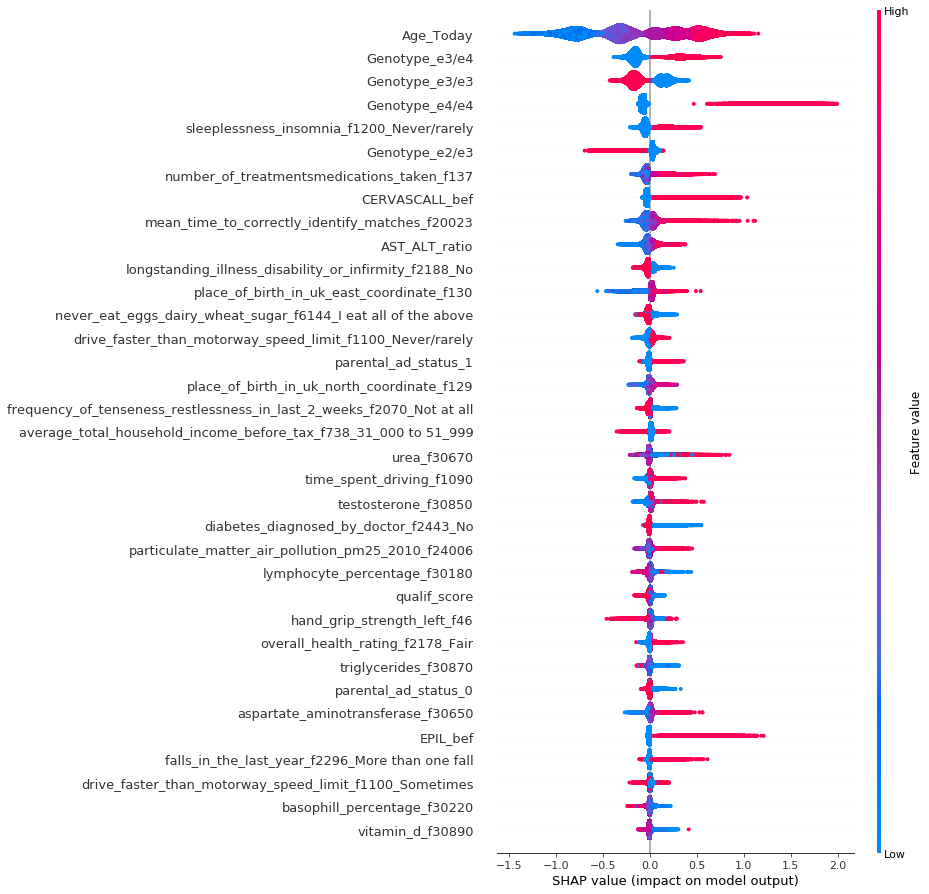

iteration: 0



Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#deprecate-loc-reindex-listlike


iteration: 1
iteration: 2
iteration: 3
iteration: 4
Accuracy : 0.9785
277.0
AUC Score (Train): 0.767221


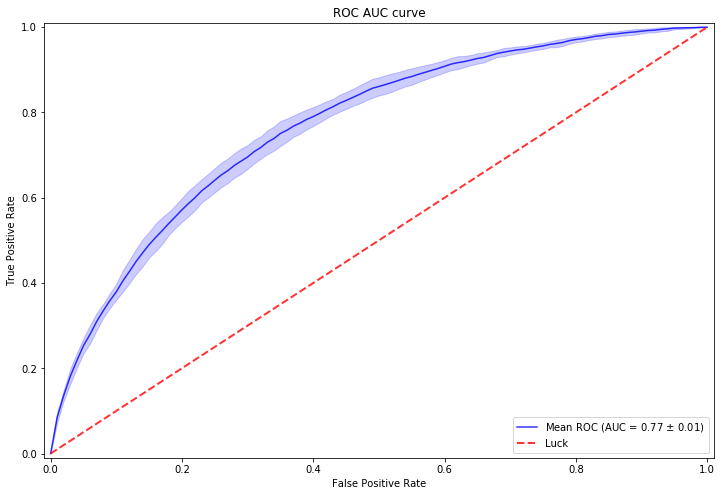

SHAP summary dot plot for selected feature number


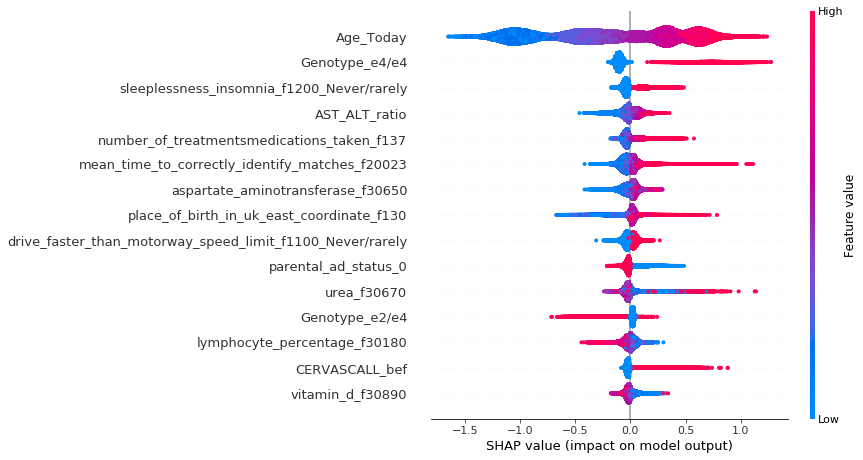

SHAP summary dot plot for 35 features


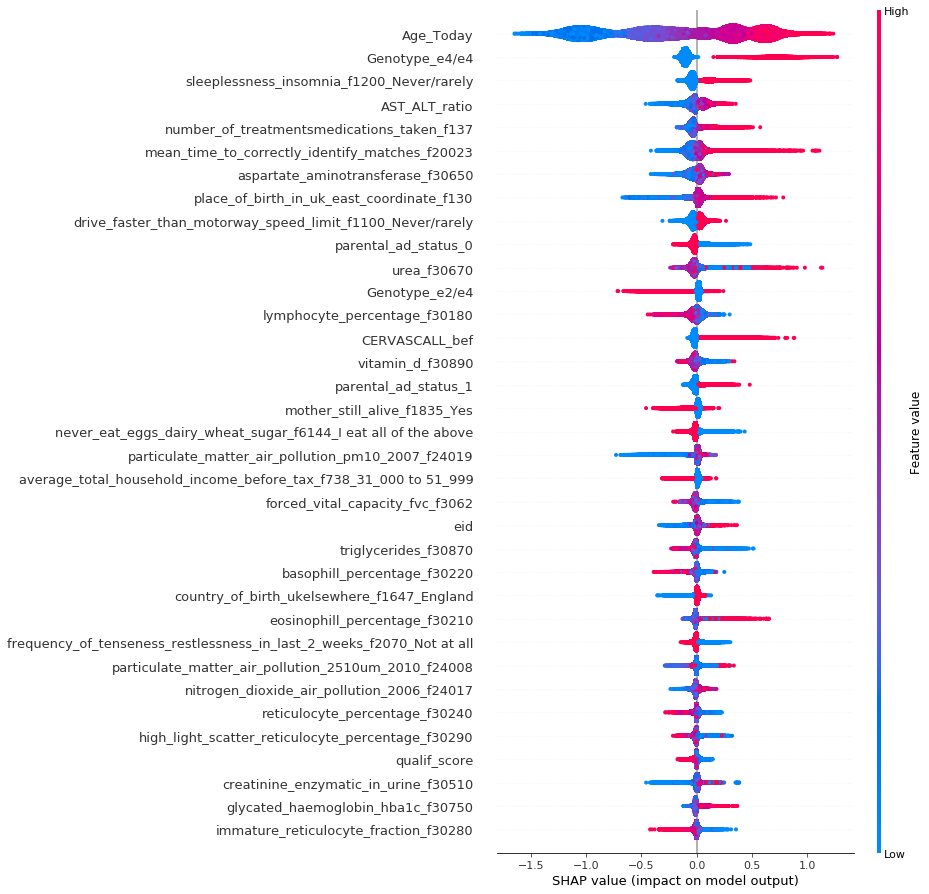

iteration: 0



Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#deprecate-loc-reindex-listlike


iteration: 1
iteration: 2
iteration: 3
iteration: 4
Accuracy : 0.9951
1.0
AUC Score (Train): 0.729894


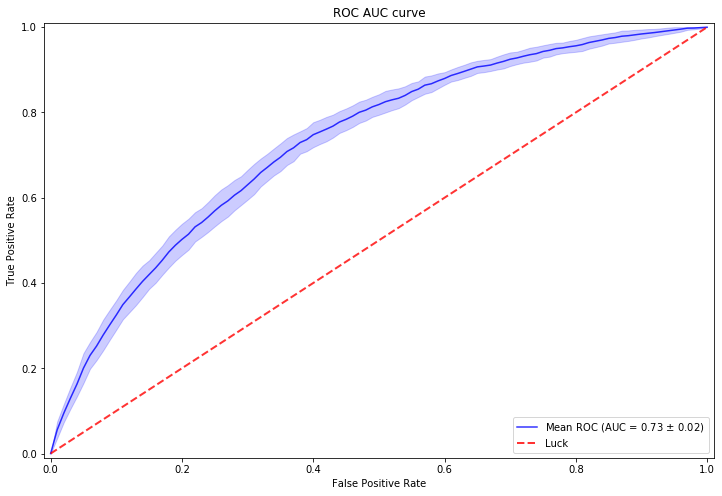

SHAP summary dot plot for selected feature number


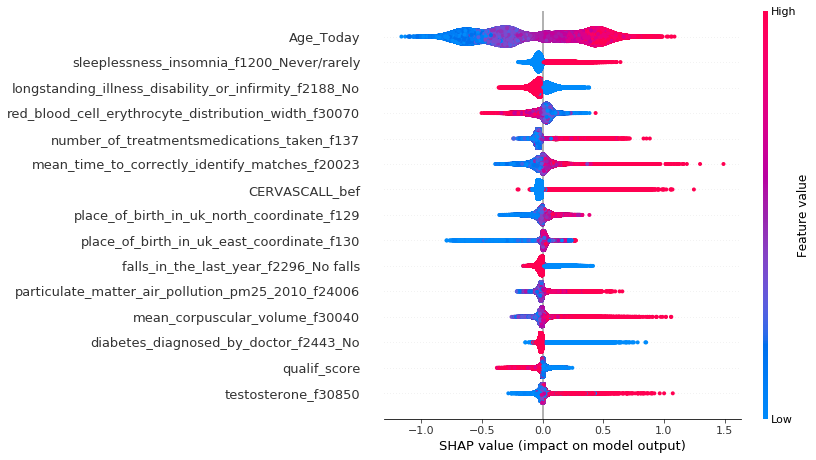

SHAP summary dot plot for 35 features


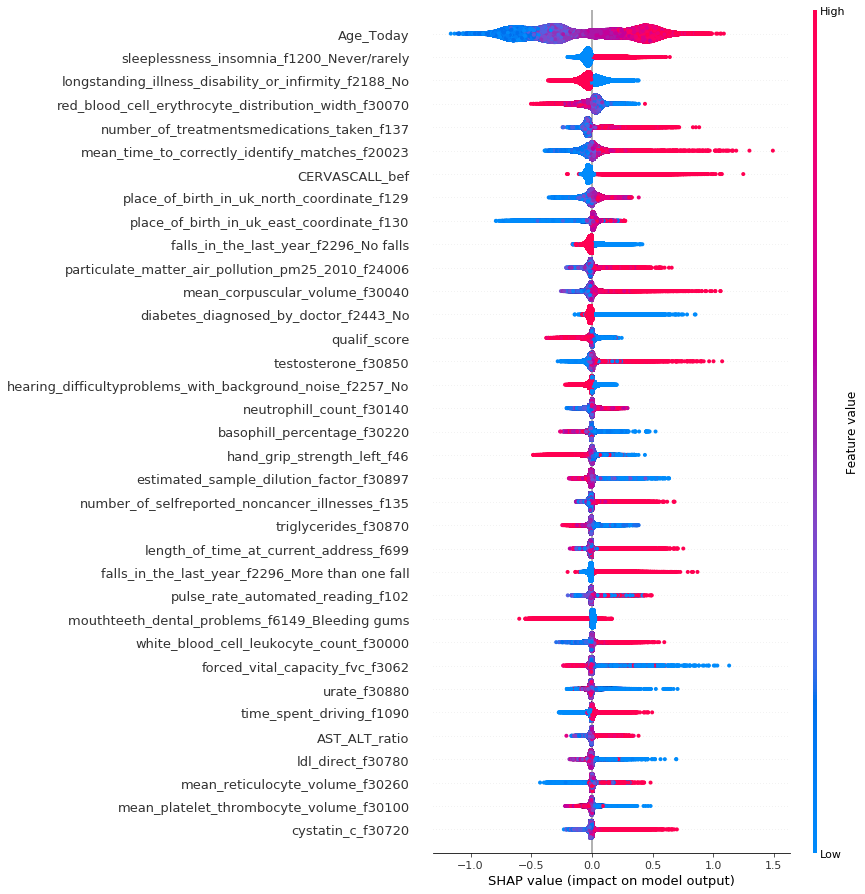

In [114]:
s_g2,score_g2=newmodelrun(AD_model_full_gfilt,dropvars=dropvars_gfilt,model=mod_xgb,depvar='AD',
                    reps=5,splits=5,rebalance=0,max_display=15,plot_type="dot",shap=1,plots=1)
s_apoe_g2,score_apoe_g2=newmodelrun(AD_model_full_gfilt_apoe,dropvars=dropvars_gfilt,model=mod_xgb,depvar='AD',
                    reps=5,splits=3,rebalance=0,max_display=15,plot_type="dot",shap=1,plots=1)
s_napoe_g2,score_napoe_g2=newmodelrun(AD_model_full_gfilt_nonapoe,dropvars=dropvars_gfilt,model=mod_xgb,depvar='AD',
                    reps=5,splits=3,rebalance=0,max_display=15,plot_type="dot",shap=1,plots=1)

iteration: 0



Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#deprecate-loc-reindex-listlike


iteration: 1
iteration: 2
iteration: 3
iteration: 4
iteration: 5
iteration: 6
iteration: 7
iteration: 8
iteration: 9
iteration: 10
iteration: 11
iteration: 12
iteration: 13
iteration: 14
iteration: 15
iteration: 16
iteration: 17
iteration: 18
iteration: 19
Accuracy : 0.9903
1647.0
AUC Score (Train): 0.812141


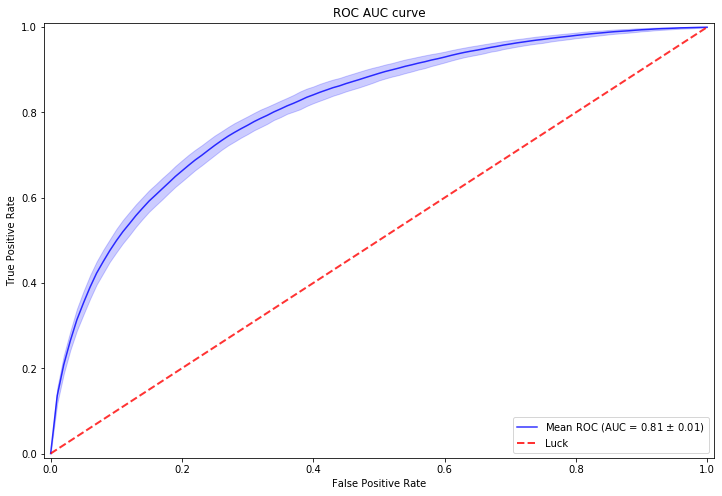

SHAP summary dot plot for selected feature number


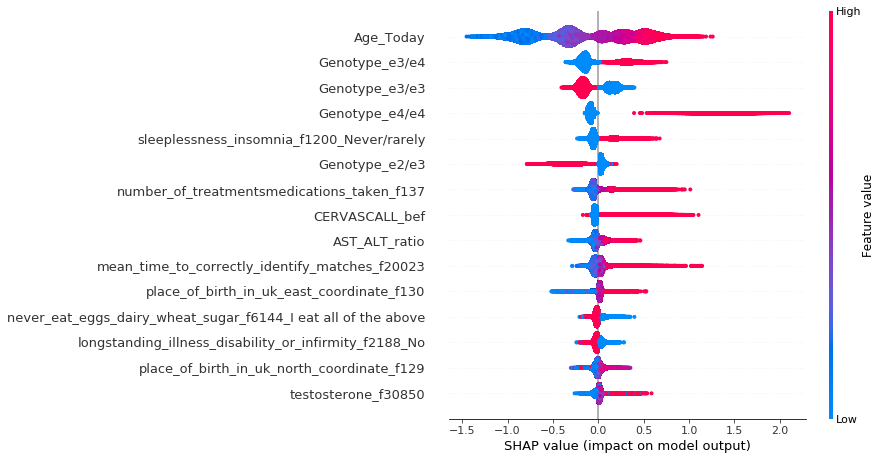

SHAP summary dot plot for 35 features


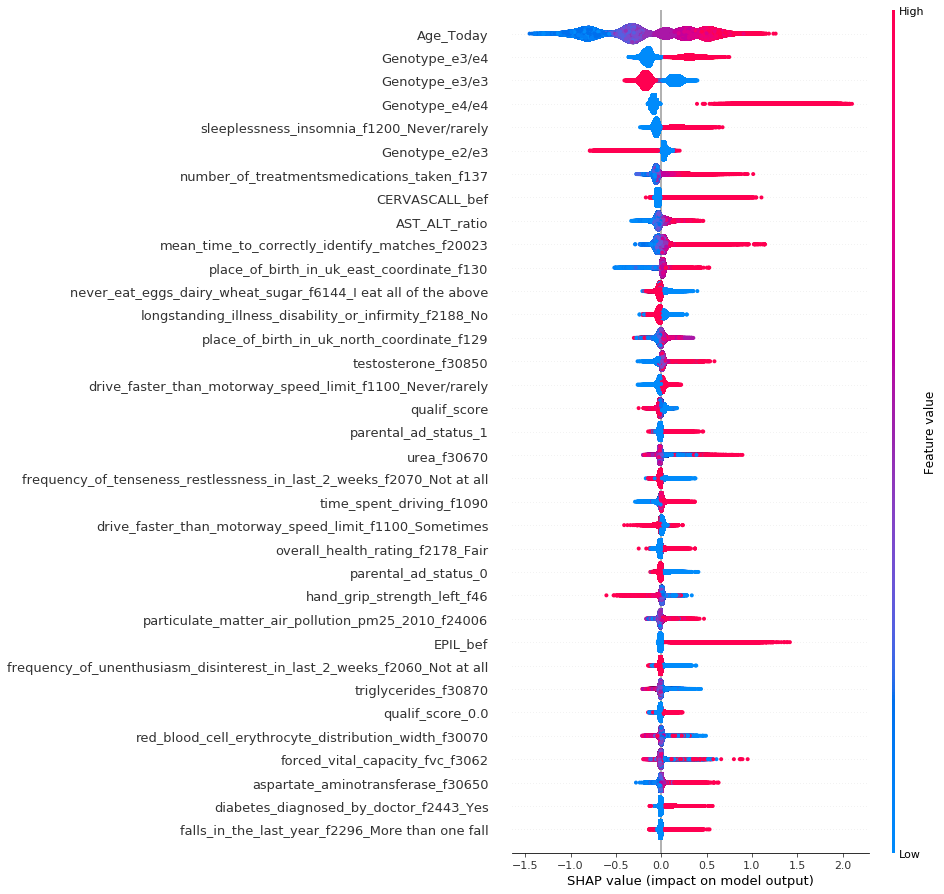

iteration: 0



Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#deprecate-loc-reindex-listlike


iteration: 1
iteration: 2
iteration: 3
iteration: 4
iteration: 5
iteration: 6
iteration: 7
iteration: 8
iteration: 9
iteration: 10
iteration: 11
iteration: 12
iteration: 13
iteration: 14
iteration: 15
iteration: 16
iteration: 17
iteration: 18
iteration: 19
Accuracy : 0.9784
1056.0
AUC Score (Train): 0.764083


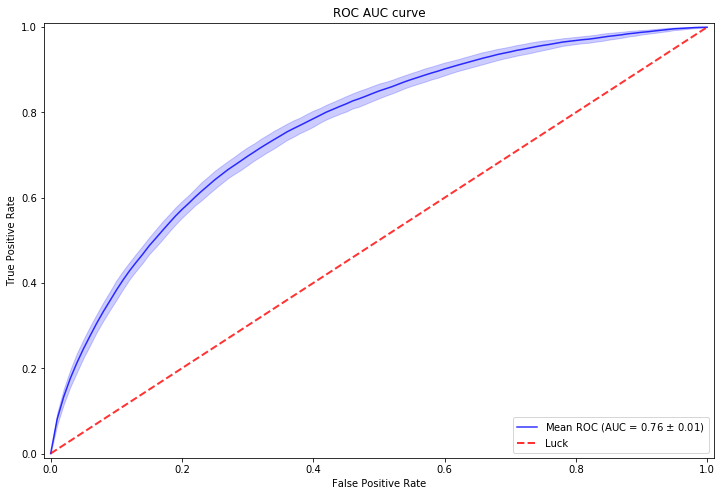

SHAP summary dot plot for selected feature number


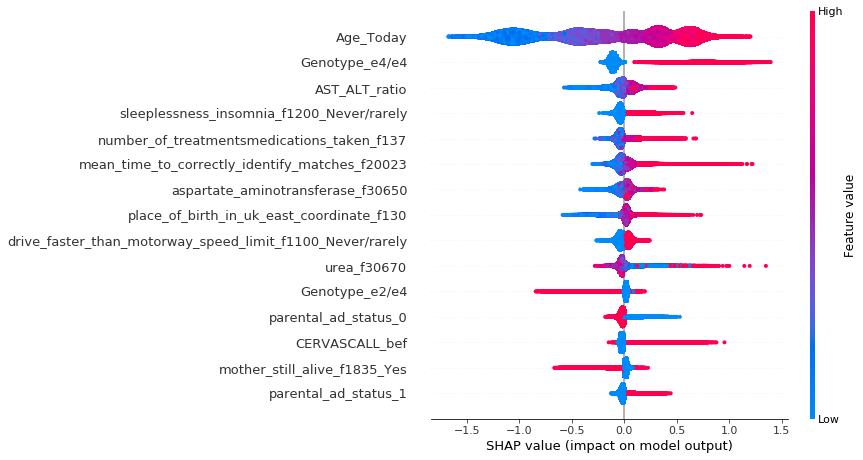

SHAP summary dot plot for 35 features


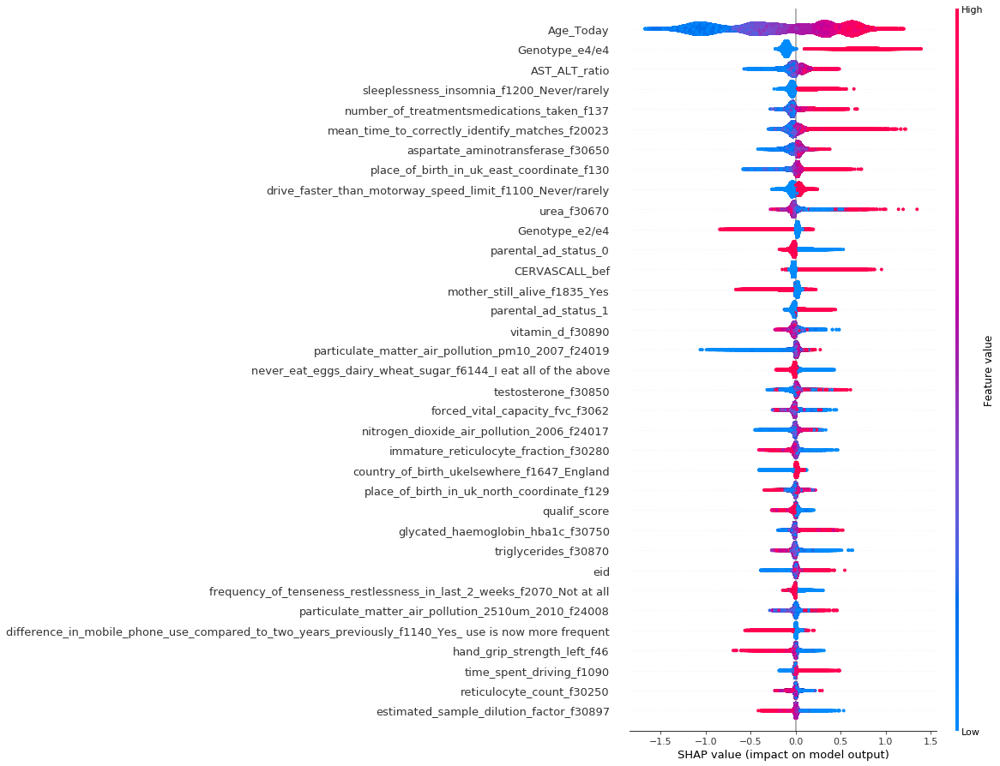

iteration: 0



Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#deprecate-loc-reindex-listlike


iteration: 1
iteration: 2
iteration: 3
iteration: 4
iteration: 5
iteration: 6
iteration: 7
iteration: 8
iteration: 9
iteration: 10
iteration: 11
iteration: 12
iteration: 13
iteration: 14
iteration: 15
iteration: 16
iteration: 17
iteration: 18
iteration: 19
Accuracy : 0.9951
13.0
AUC Score (Train): 0.734084


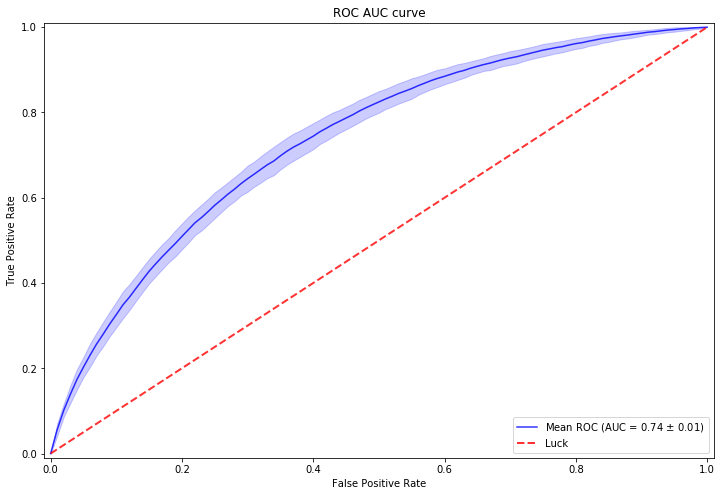

SHAP summary dot plot for selected feature number


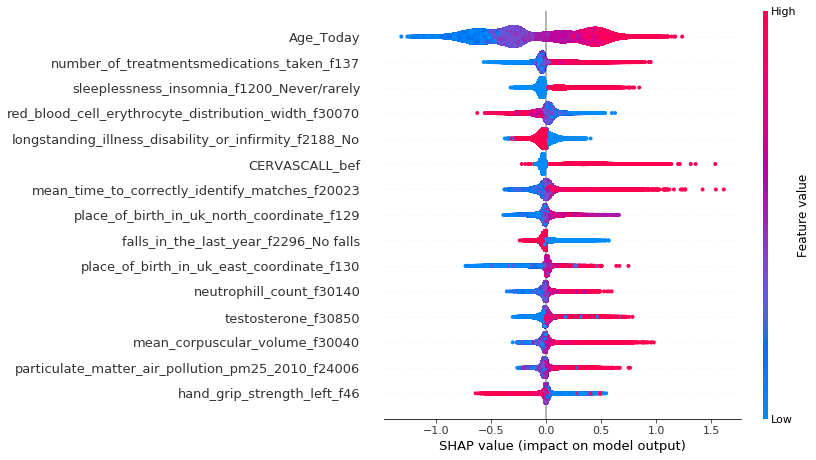

SHAP summary dot plot for 35 features


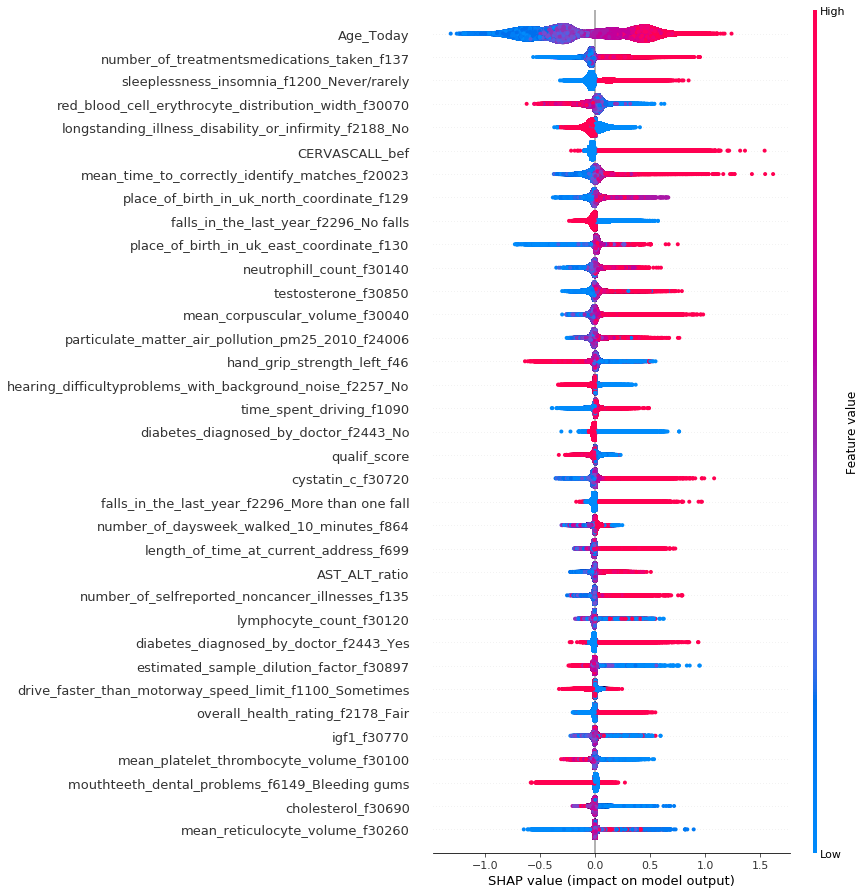

In [96]:
s_g,score_g=newmodelrun(AD_model_full_gfilt,dropvars=dropvars_gfilt,model=mod_xgb,depvar='AD',
                    reps=20,splits=5,rebalance=0,max_display=15,plot_type="dot",shap=1,plots=1)
s_apoe_g,score_apoe_g=newmodelrun(AD_model_full_gfilt_apoe,dropvars=dropvars_gfilt,model=mod_xgb,depvar='AD',
                    reps=20,splits=3,rebalance=0,max_display=15,plot_type="dot",shap=1,plots=1)
s_napoe_g,score_napoe_g=newmodelrun(AD_model_full_gfilt_nonapoe,dropvars=dropvars_gfilt,model=mod_xgb,depvar='AD',
                    reps=20,splits=3,rebalance=0,max_display=15,plot_type="dot",shap=1,plots=1)

In [35]:
s_g

NameError: name 's_g' is not defined

AUC Score (Train): 0.818764


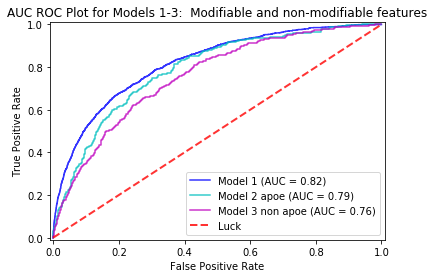

In [47]:
plot_ROCAUC_mult(score_g['actual'], score_g['mean_score'],score_apoe_g['actual'],
                 score_apoe_g['mean_score'],
                 score_napoe_g['actual'],
                 score_napoe_g['mean_score'],title='AUC ROC Plot for Models 1-3:  Modifiable and non-modifiable features',
                 l1='Model 1',l2='Model 2',l3='Model 3')

iteration: 0



Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#deprecate-loc-reindex-listlike


iteration: 1
iteration: 2
iteration: 3
iteration: 4
Accuracy : 0.9903
416.0
AUC Score (Train): 0.793028


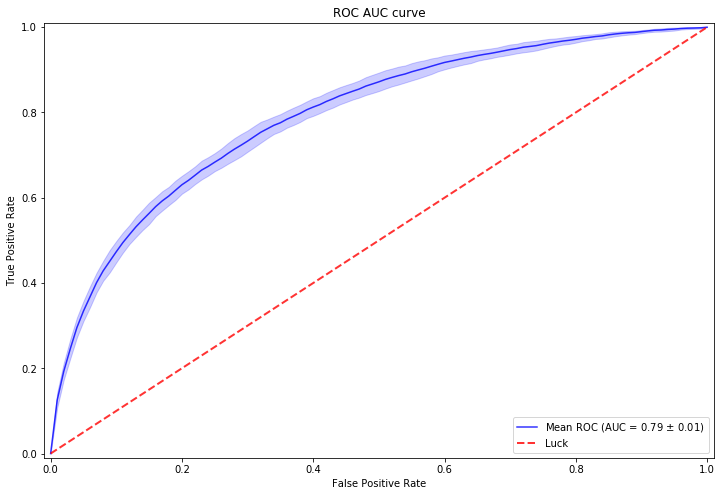

SHAP summary dot plot for selected feature number


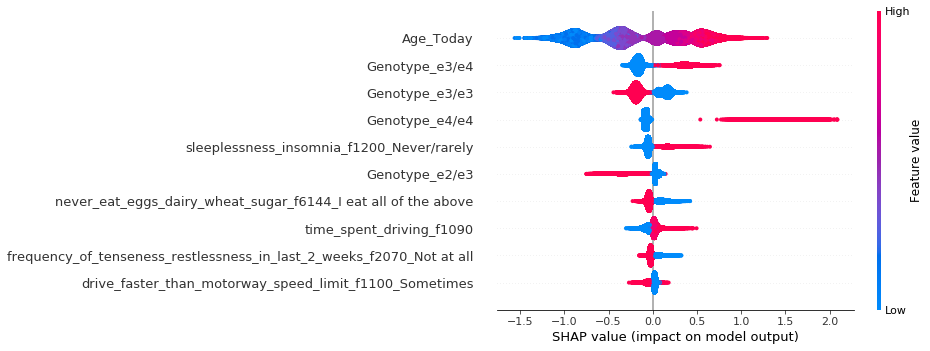

SHAP summary dot plot for 35 features


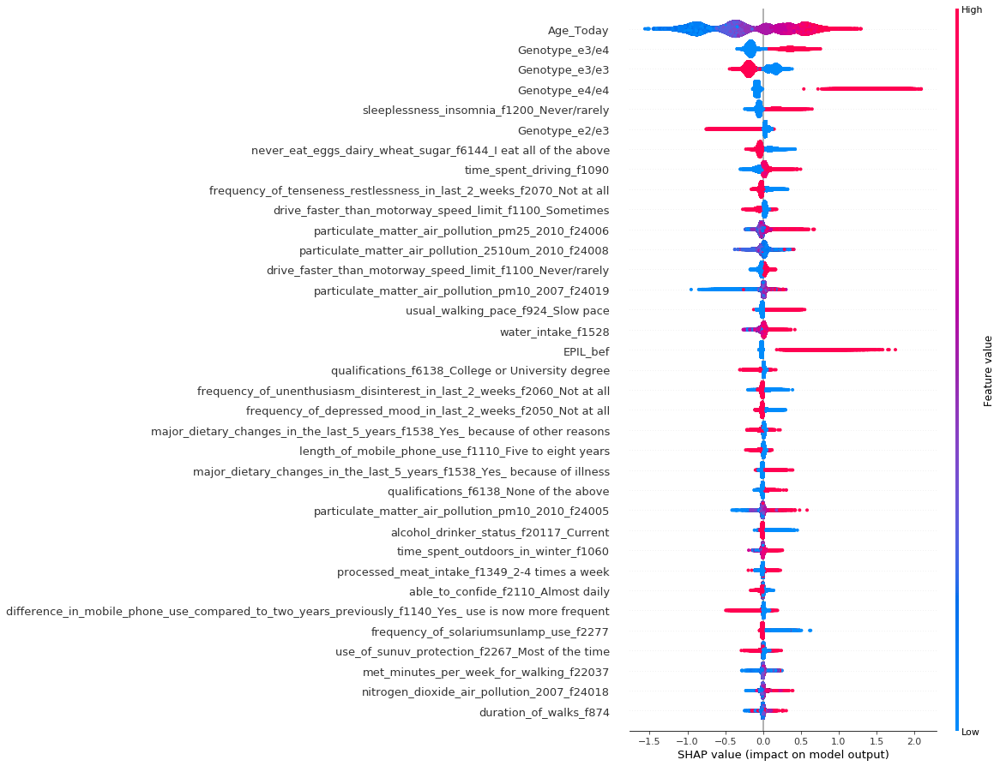

iteration: 0



Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#deprecate-loc-reindex-listlike


iteration: 1
iteration: 2
iteration: 3
iteration: 4
Accuracy : 0.978
449.0
AUC Score (Train): 0.753786


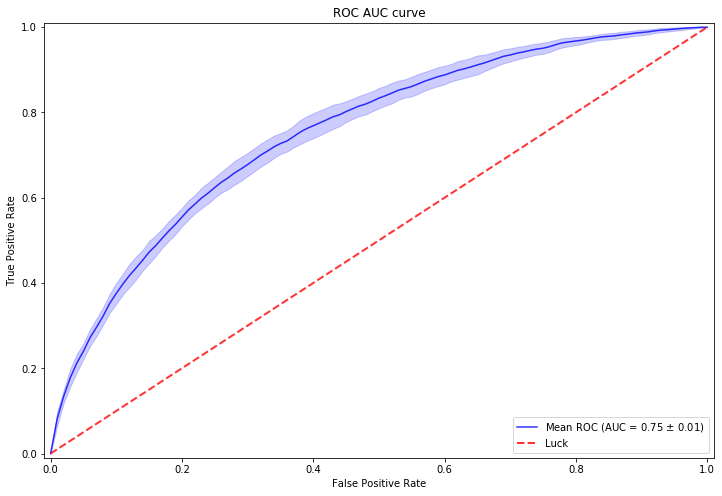

SHAP summary dot plot for selected feature number


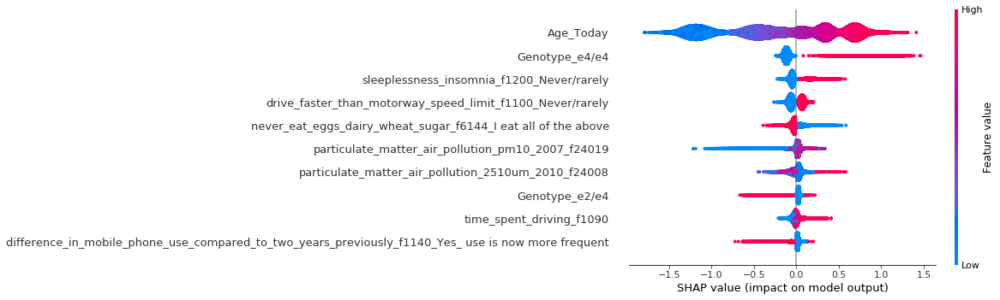

SHAP summary dot plot for 35 features


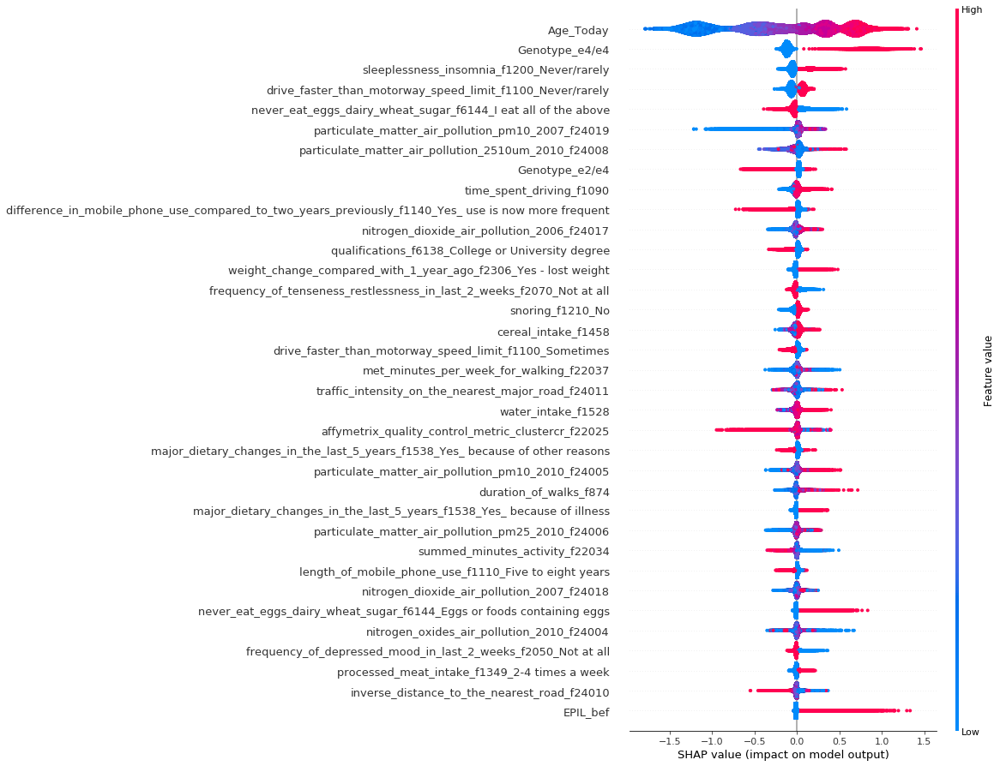

iteration: 0



Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#deprecate-loc-reindex-listlike


iteration: 1
iteration: 2
iteration: 3
iteration: 4


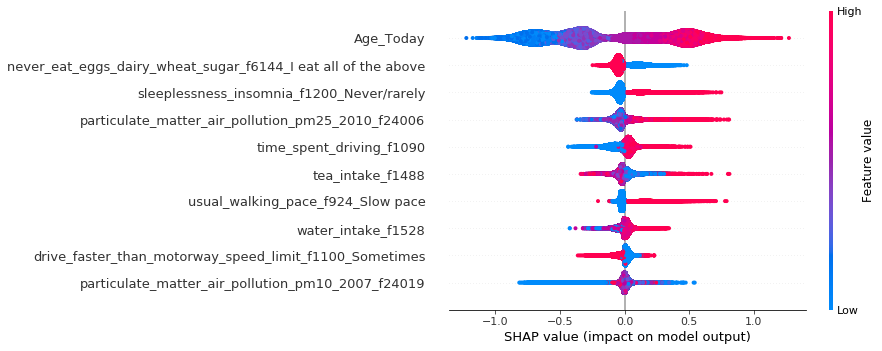

SHAP summary dot plot for 35 features


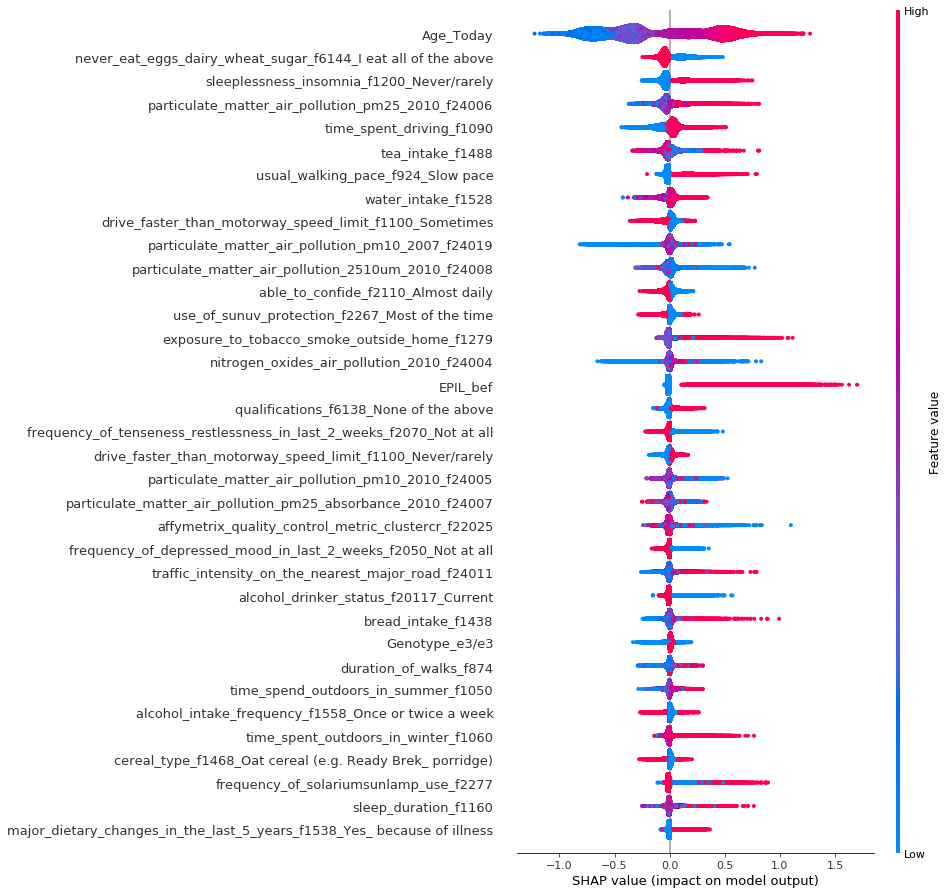

In [10]:
s_mod,score_mod=newmodelrun(AD_model_full_modify,dropvars=dropvars_modify,model=mod_xgb,depvar='AD',
                    reps=5,splits=5,rebalance=0,max_display=10,plot_type="dot",shap=1,plots=1)
s_apoe_mod,score_apoe_mod=newmodelrun(AD_model_full_mod_apoe,dropvars=dropvars_modify,model=mod_xgb,depvar='AD',
                    reps=5,splits=5,rebalance=0,max_display=10,plot_type="dot",shap=1,plots=1)
s_napoe_mod,score_napoe_mod=newmodelrun(AD_model_full_mod_nonapoe,dropvars=dropvars_modify,model=mod_xgb,depvar='AD',
                    reps=5,splits=5,rebalance=0,max_display=10,plot_type="dot",shap=1,plots=1)

In [14]:
s_apoe_mod['std_err_shap_imp']=s_apoe_mod['std_shap_imp']/s_apoe_mod['mean_shap_imp']
mask_sterr=(s_apoe_mod['std_err_shap_imp']<1)
s_apoe_mod[mask_sterr].head(20)

,column_name,mean_shap_imp,std_shap_imp,min_rank,max_rank,mean_rank,median_rank,std_rank,std_err_shap_imp
0,Age_Today,0.607511,0.019907,0,0,0.00,0,0.000000,0.032768
10,Genotype_e4/e4,0.175618,0.012705,1,1,1.00,1,0.000000,0.072345
318,sleeplessness_insomnia_f1200_Never/rarely,0.080610,0.010161,2,4,2.32,2,0.556776,0.126045
85,drive_faster_than_motorway_speed_limit_f1100_N...,0.067439,0.010755,2,5,3.44,3,0.916515,0.159477
212,never_eat_eggs_dairy_wheat_sugar_f6144_I eat a...,0.057796,0.015541,2,22,5.52,4,4.360046,0.268899
258,particulate_matter_air_pollution_pm10_2007_f24019,0.046248,0.008633,4,15,7.36,7,2.899425,0.186676
257,particulate_matter_air_pollution_2510um_2010_f...,0.046084,0.012086,3,16,7.64,7,3.784618,0.262254
7,Genotype_e2/e4,0.045241,0.007683,3,14,7.16,6,2.687626,0.169820
346,time_spent_driving_f1090,0.034081,0.010825,5,48,14.76,12,9.417537,0.317635
81,difference_in_mobile_phone_use_compared_to_two...,0.033917,0.012736,4,37,14.76,12,8.407735,0.375513


AUC Score (Train): 0.800022


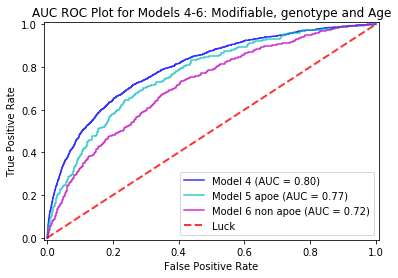

In [48]:
plot_ROCAUC_mult(score_mod['actual'], score_mod['mean_score'],score_apoe_mod['actual'],
                 score_apoe_mod['mean_score'],
                 score_napoe_mod['actual'],
                 score_napoe_mod['mean_score'],title='AUC ROC Plot for Models 4-6: Modifiable, genotype and Age',
                 l1='Model 4',l2='Model 5',l3='Model 6')

In [26]:
score_mod.head()

,eid,mean_score,std_score,actual,predicted
0,1000014.0,0.013825,0.002112,0.0,0.0
1,1000030.0,0.019318,0.002428,0.0,0.0
2,1000041.0,0.057816,0.017850,0.0,0.0
3,1000113.0,0.080489,0.020706,0.0,0.0
4,1000146.0,0.084424,0.019467,0.0,0.0


iteration: 0



Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#deprecate-loc-reindex-listlike
using a dict on a Series for aggregation
is deprecated and will be removed in a future version. Use                 named aggregation instead.

    >>> grouper.agg(name_1=func_1, name_2=func_2)



iteration: 1
iteration: 2
iteration: 3
iteration: 4
iteration: 5
iteration: 6
iteration: 7
iteration: 8
iteration: 9
Accuracy : 0.9904
770.0
AUC Score (Train): 0.811650


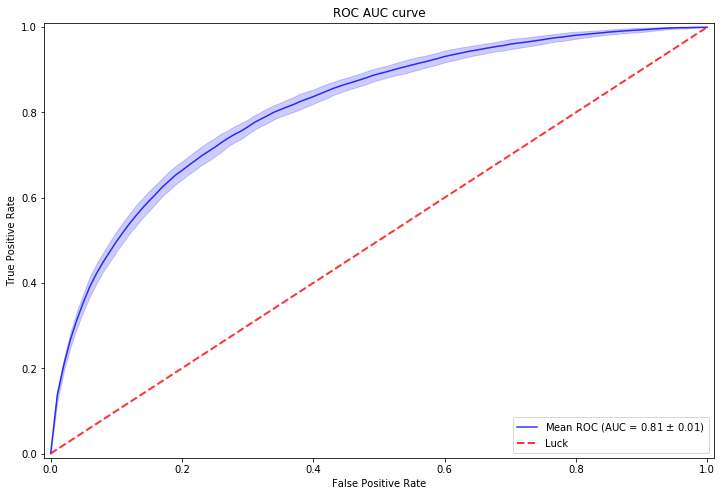

SHAP summary dot plot for selected feature number


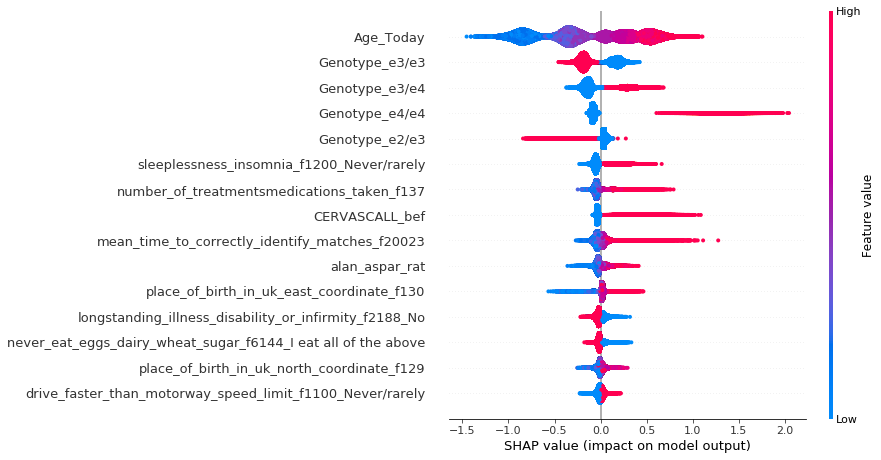

SHAP summary dot plot for 35 features


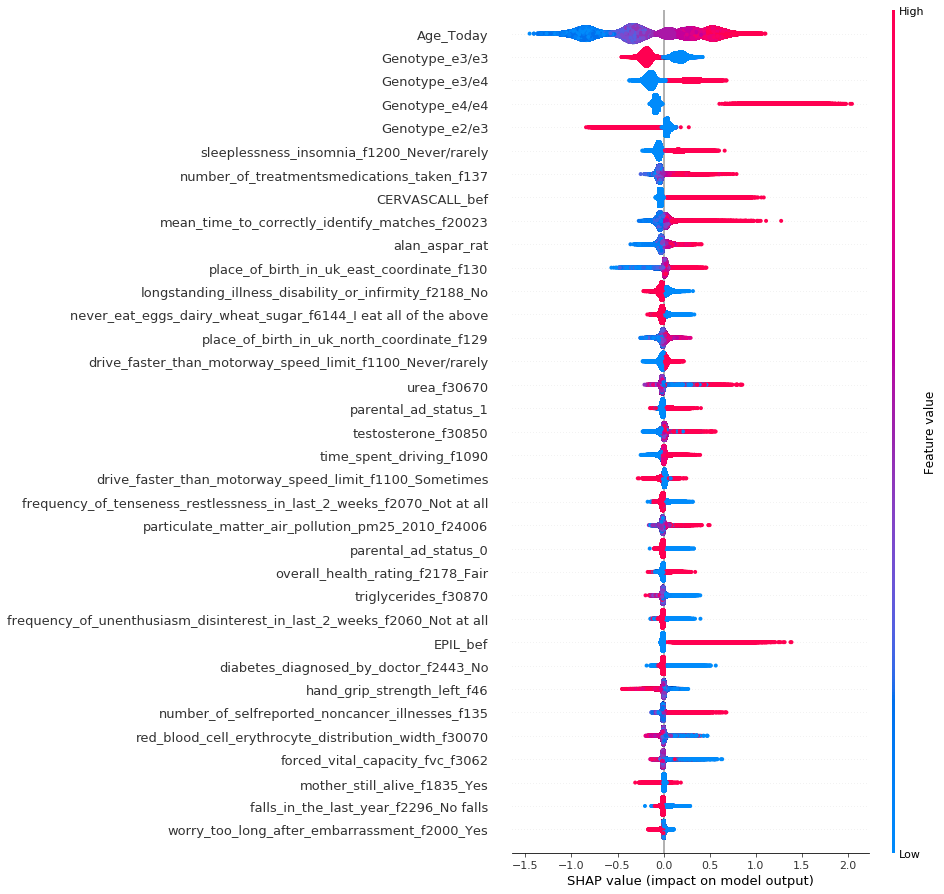

SHAP summary bar plot for selected feature number


invalid value encountered in true_divide
invalid value encountered in true_divide


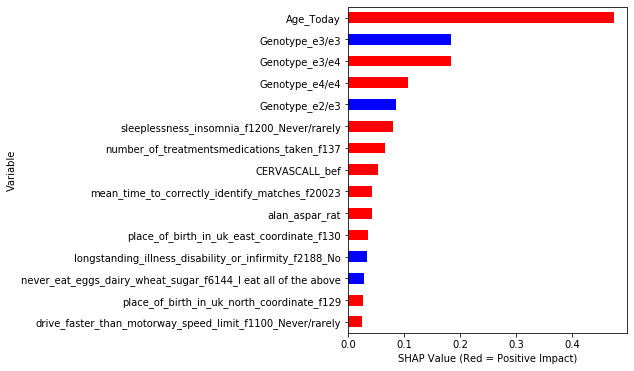

SHAP summary dot plot for 35 features


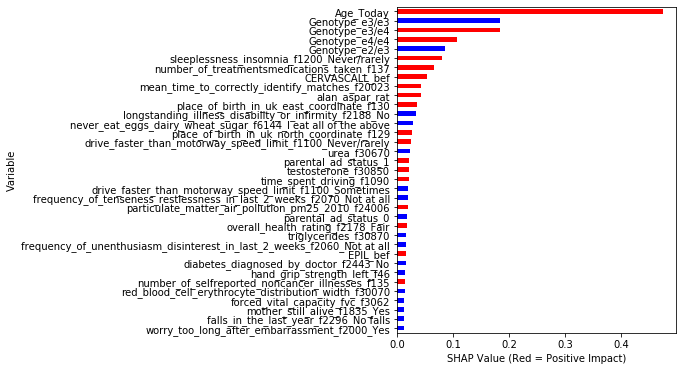

In [68]:

s_gfilt,score_gfilt=newmodelrun(AD_model_full_gfilt,dropvars=dropvars_gfilt,model=mod_xgb,depvar='AD',
                    reps=10,splits=5,rebalance=0,max_display=15,plot_type="dot")

In [65]:
print(AD_model_full_gfilt.shape)
print(AD_model_full70.shape)

(171670, 1625)
(209114, 1625)


iteration: 0



Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#deprecate-loc-reindex-listlike
using a dict on a Series for aggregation
is deprecated and will be removed in a future version. Use                 named aggregation instead.

    >>> grouper.agg(name_1=func_1, name_2=func_2)



iteration: 1
iteration: 2
iteration: 3
iteration: 4
iteration: 5
iteration: 6
iteration: 7
iteration: 8
iteration: 9
Accuracy : 0.9904
768.0
AUC Score (Train): 0.811725


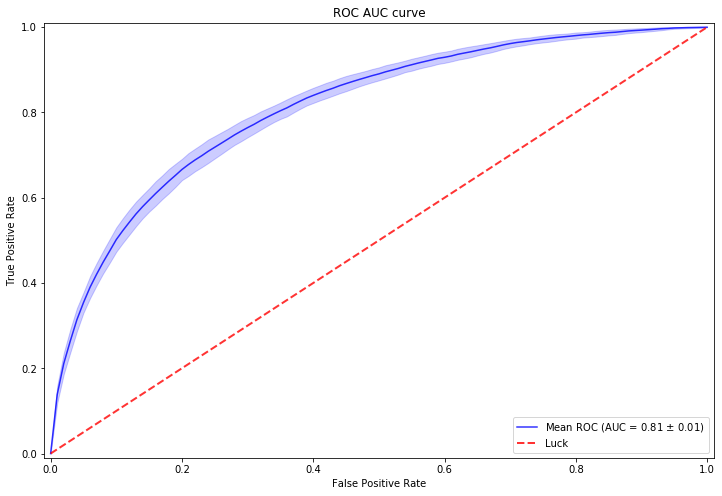

SHAP summary dot plot for selected feature number


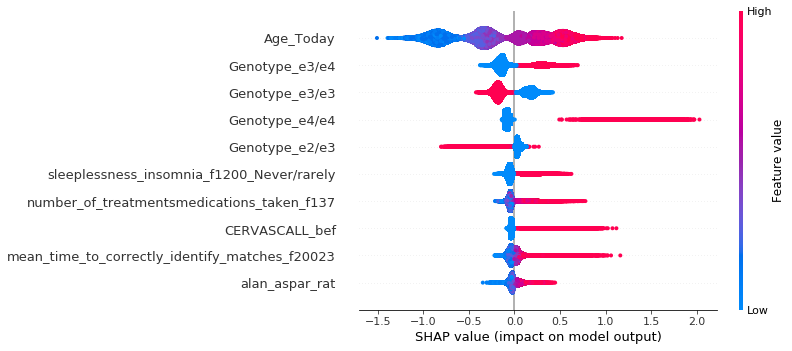

SHAP summary dot plot for 35 features


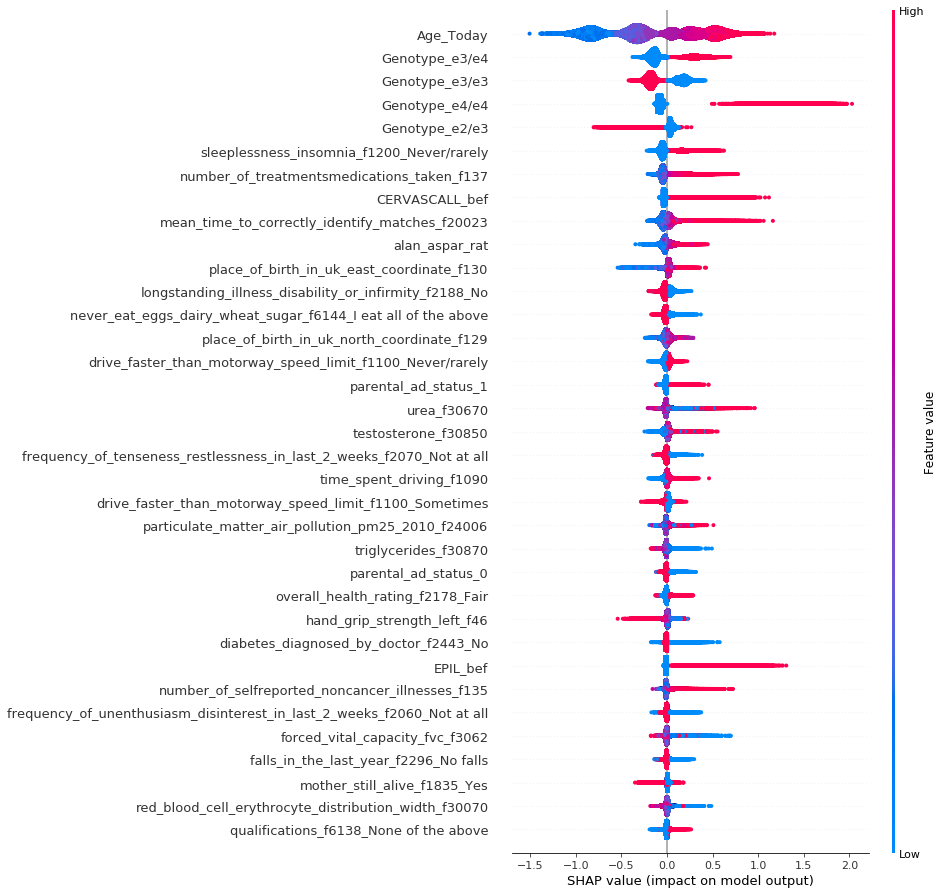

SHAP summary bar plot for selected feature number


invalid value encountered in true_divide
invalid value encountered in true_divide


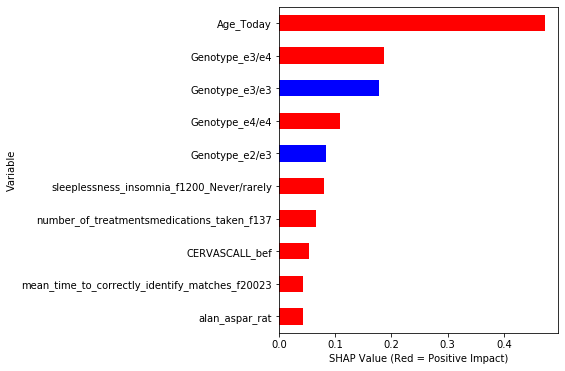

SHAP summary dot plot for 35 features


In [20]:
dropvars_gfilt=varstodrop(AD_model_full70,drpvars1,drvarsdef)
s_gfilt2,score_gfilt2=newmodelrun(AD_model_full_gfilt,dropvars=dropvars_gfilt,model=mod_xgb,depvar='AD',
                    reps=10,splits=5,rebalance=0,max_display=10,plot_type="dot",shap=1,plots=1)


In [34]:
modelscore_full_mod=runmodel(AD_model_full_modify,dropvars_modify,1,2,mod_xgb)


0
Iteration: 	1 / 100
Confirmed: 	0
Tentative: 	475
Rejected: 	0
Iteration: 	2 / 100
Confirmed: 	0
Tentative: 	475
Rejected: 	0
Iteration: 	3 / 100
Confirmed: 	0
Tentative: 	475
Rejected: 	0
Iteration: 	4 / 100
Confirmed: 	0
Tentative: 	475
Rejected: 	0
Iteration: 	5 / 100
Confirmed: 	0
Tentative: 	475
Rejected: 	0
Iteration: 	6 / 100
Confirmed: 	0
Tentative: 	475
Rejected: 	0
Iteration: 	7 / 100
Confirmed: 	0
Tentative: 	475
Rejected: 	0
Iteration: 	8 / 100
Confirmed: 	0
Tentative: 	28
Rejected: 	447
Iteration: 	9 / 100
Confirmed: 	5
Tentative: 	23
Rejected: 	447
Iteration: 	10 / 100
Confirmed: 	5
Tentative: 	23
Rejected: 	447
Iteration: 	11 / 100
Confirmed: 	5
Tentative: 	23
Rejected: 	447
Iteration: 	12 / 100
Confirmed: 	5
Tentative: 	9
Rejected: 	461
Iteration: 	13 / 100
Confirmed: 	5
Tentative: 	9
Rejected: 	461
Iteration: 	14 / 100
Confirmed: 	5
Tentative: 	9
Rejected: 	461
Iteration: 	15 / 100
Confirmed: 	5
Tentative: 	9
Rejected: 	461
Iteration: 	16 / 100
Confirmed: 	6
Tentativ

ValueError: feature_names mismatch: ['f0', 'f1', 'f2', 'f3', 'f4', 'f5', 'f6', 'f7', 'f8', 'f9', 'f10', 'f11', 'f12', 'f13', 'f14', 'f15', 'f16', 'f17'] ['number_of_daysweek_of_moderate_physical_activity_10_minutes_f884_-3.0', 'number_of_daysweek_of_moderate_physical_activity_10_minutes_f884_-1.0', 'number_of_daysweek_of_moderate_physical_activity_10_minutes_f884_0.0', 'number_of_daysweek_of_moderate_physical_activity_10_minutes_f884_1.0', 'number_of_daysweek_of_moderate_physical_activity_10_minutes_f884_2.0', 'number_of_daysweek_of_moderate_physical_activity_10_minutes_f884_3.0', 'number_of_daysweek_of_moderate_physical_activity_10_minutes_f884_4.0', 'number_of_daysweek_of_moderate_physical_activity_10_minutes_f884_5.0', 'number_of_daysweek_of_moderate_physical_activity_10_minutes_f884_6.0', 'number_of_daysweek_of_moderate_physical_activity_10_minutes_f884_7.0', 'number_of_daysweek_of_moderate_physical_activity_10_minutes_f884_Unknown', 'number_of_daysweek_of_vigorous_physical_activity_10_minutes_f904_-3.0', 'number_of_daysweek_of_vigorous_physical_activity_10_minutes_f904_-1.0', 'number_of_daysweek_of_vigorous_physical_activity_10_minutes_f904_0.0', 'number_of_daysweek_of_vigorous_physical_activity_10_minutes_f904_1.0', 'number_of_daysweek_of_vigorous_physical_activity_10_minutes_f904_2.0', 'number_of_daysweek_of_vigorous_physical_activity_10_minutes_f904_3.0', 'number_of_daysweek_of_vigorous_physical_activity_10_minutes_f904_4.0', 'number_of_daysweek_of_vigorous_physical_activity_10_minutes_f904_5.0', 'number_of_daysweek_of_vigorous_physical_activity_10_minutes_f904_6.0', 'number_of_daysweek_of_vigorous_physical_activity_10_minutes_f904_7.0', 'number_of_daysweek_of_vigorous_physical_activity_10_minutes_f904_Unknown', 'usual_walking_pace_f924_Brisk pace', 'usual_walking_pace_f924_None of the above', 'usual_walking_pace_f924_Prefer not to answer', 'usual_walking_pace_f924_Slow pace', 'usual_walking_pace_f924_Steady average pace', 'usual_walking_pace_f924_Unknown', 'frequency_of_stair_climbing_in_last_4_weeks_f943_1-5 times a day', 'frequency_of_stair_climbing_in_last_4_weeks_f943_11-15 times a day', 'frequency_of_stair_climbing_in_last_4_weeks_f943_16-20 times a day', 'frequency_of_stair_climbing_in_last_4_weeks_f943_6-10 times a day', 'frequency_of_stair_climbing_in_last_4_weeks_f943_Do not know', 'frequency_of_stair_climbing_in_last_4_weeks_f943_More than 20 times a day', 'frequency_of_stair_climbing_in_last_4_weeks_f943_None', 'frequency_of_stair_climbing_in_last_4_weeks_f943_Prefer not to answer', 'frequency_of_stair_climbing_in_last_4_weeks_f943_Unknown', 'frequency_of_friendfamily_visits_f1031_2-4 times a week', 'frequency_of_friendfamily_visits_f1031_About once a month', 'frequency_of_friendfamily_visits_f1031_About once a week', 'frequency_of_friendfamily_visits_f1031_Almost daily', 'frequency_of_friendfamily_visits_f1031_Do not know', 'frequency_of_friendfamily_visits_f1031_Never or almost never', 'frequency_of_friendfamily_visits_f1031_No friends/family outside household', 'frequency_of_friendfamily_visits_f1031_Once every few months', 'frequency_of_friendfamily_visits_f1031_Prefer not to answer', 'frequency_of_friendfamily_visits_f1031_Unknown', 'drive_faster_than_motorway_speed_limit_f1100_Do not drive on the motorway', 'drive_faster_than_motorway_speed_limit_f1100_Do not know', 'drive_faster_than_motorway_speed_limit_f1100_Most of the time', 'drive_faster_than_motorway_speed_limit_f1100_Never/rarely', 'drive_faster_than_motorway_speed_limit_f1100_Often', 'drive_faster_than_motorway_speed_limit_f1100_Prefer not to answer', 'drive_faster_than_motorway_speed_limit_f1100_Sometimes', 'drive_faster_than_motorway_speed_limit_f1100_Unknown', 'length_of_mobile_phone_use_f1110_Do not know', 'length_of_mobile_phone_use_f1110_Five to eight years', 'length_of_mobile_phone_use_f1110_More than eight years', 'length_of_mobile_phone_use_f1110_Never used mobile phone at least once per week', 'length_of_mobile_phone_use_f1110_One year or less', 'length_of_mobile_phone_use_f1110_Prefer not to answer', 'length_of_mobile_phone_use_f1110_Two to four years', 'length_of_mobile_phone_use_f1110_Unknown', 'weekly_usage_of_mobile_phone_in_last_3_months_f1120_1-3 hours', 'weekly_usage_of_mobile_phone_in_last_3_months_f1120_30-59 mins', 'weekly_usage_of_mobile_phone_in_last_3_months_f1120_4-6 hours', 'weekly_usage_of_mobile_phone_in_last_3_months_f1120_5-29 mins', 'weekly_usage_of_mobile_phone_in_last_3_months_f1120_Do not know', 'weekly_usage_of_mobile_phone_in_last_3_months_f1120_Less than 5mins', 'weekly_usage_of_mobile_phone_in_last_3_months_f1120_More than 6 hours', 'weekly_usage_of_mobile_phone_in_last_3_months_f1120_Prefer not to answer', 'weekly_usage_of_mobile_phone_in_last_3_months_f1120_Unknown', 'handsfree_devicespeakerphone_use_with_mobile_phone_in_last_3_month_f1130_About half the time', 'handsfree_devicespeakerphone_use_with_mobile_phone_in_last_3_month_f1130_Always or almost always', 'handsfree_devicespeakerphone_use_with_mobile_phone_in_last_3_month_f1130_Do not know', 'handsfree_devicespeakerphone_use_with_mobile_phone_in_last_3_month_f1130_Less than half the time', 'handsfree_devicespeakerphone_use_with_mobile_phone_in_last_3_month_f1130_More than half the time', 'handsfree_devicespeakerphone_use_with_mobile_phone_in_last_3_month_f1130_Never or almost never', 'handsfree_devicespeakerphone_use_with_mobile_phone_in_last_3_month_f1130_Prefer not to answer', 'handsfree_devicespeakerphone_use_with_mobile_phone_in_last_3_month_f1130_Unknown', 'difference_in_mobile_phone_use_compared_to_two_years_previously_f1140_Do not know', "difference_in_mobile_phone_use_compared_to_two_years_previously_f1140_I didn't use a mobile phone two years ago", 'difference_in_mobile_phone_use_compared_to_two_years_previously_f1140_No', 'difference_in_mobile_phone_use_compared_to_two_years_previously_f1140_Prefer not to answer', 'difference_in_mobile_phone_use_compared_to_two_years_previously_f1140_Unknown', 'difference_in_mobile_phone_use_compared_to_two_years_previously_f1140_Yes_ use is now less frequent', 'difference_in_mobile_phone_use_compared_to_two_years_previously_f1140_Yes_ use is now more frequent', 'usual_side_of_head_for_mobile_phone_use_f1150_Do not know', 'usual_side_of_head_for_mobile_phone_use_f1150_Equally left and right', 'usual_side_of_head_for_mobile_phone_use_f1150_Left', 'usual_side_of_head_for_mobile_phone_use_f1150_Prefer not to answer', 'usual_side_of_head_for_mobile_phone_use_f1150_Right', 'usual_side_of_head_for_mobile_phone_use_f1150_Unknown', 'getting_up_in_morning_f1170_Do not know', 'getting_up_in_morning_f1170_Fairly easy', 'getting_up_in_morning_f1170_Not at all easy', 'getting_up_in_morning_f1170_Not very easy', 'getting_up_in_morning_f1170_Prefer not to answer', 'getting_up_in_morning_f1170_Unknown', 'getting_up_in_morning_f1170_Very easy', "morningevening_person_chronotype_f1180_Definitely a 'morning' person", "morningevening_person_chronotype_f1180_Definitely an 'evening' person", 'morningevening_person_chronotype_f1180_Do not know', "morningevening_person_chronotype_f1180_More a 'morning' than 'evening' person", "morningevening_person_chronotype_f1180_More an 'evening' than a 'morning' person", 'morningevening_person_chronotype_f1180_Prefer not to answer', 'morningevening_person_chronotype_f1180_Unknown', 'nap_during_day_f1190_Never/rarely', 'nap_during_day_f1190_Prefer not to answer', 'nap_during_day_f1190_Sometimes', 'nap_during_day_f1190_Unknown', 'nap_during_day_f1190_Usually', 'sleeplessness_insomnia_f1200_Never/rarely', 'sleeplessness_insomnia_f1200_Prefer not to answer', 'sleeplessness_insomnia_f1200_Sometimes', 'sleeplessness_insomnia_f1200_Unknown', 'sleeplessness_insomnia_f1200_Usually', 'snoring_f1210_Do not know', 'snoring_f1210_No', 'snoring_f1210_Prefer not to answer', 'snoring_f1210_Unknown', 'snoring_f1210_Yes', 'current_tobacco_smoking_f1239_No', 'current_tobacco_smoking_f1239_Only occasionally', 'current_tobacco_smoking_f1239_Prefer not to answer', 'current_tobacco_smoking_f1239_Unknown', 'current_tobacco_smoking_f1239_Yes_ on most or all days', 'past_tobacco_smoking_f1249_I have never smoked', 'past_tobacco_smoking_f1249_Just tried once or twice', 'past_tobacco_smoking_f1249_Prefer not to answer', 'past_tobacco_smoking_f1249_Smoked occasionally', 'past_tobacco_smoking_f1249_Smoked on most or all days', 'past_tobacco_smoking_f1249_Unknown', 'smokingsmokers_in_household_f1259_No', 'smokingsmokers_in_household_f1259_Prefer not to answer', 'smokingsmokers_in_household_f1259_Unknown', 'smokingsmokers_in_household_f1259_Yes_ more than one household member smokes', 'smokingsmokers_in_household_f1259_Yes_ one household member smokes', 'oily_fish_intake_f1329_2-4 times a week', 'oily_fish_intake_f1329_5-6 times a week', 'oily_fish_intake_f1329_Do not know', 'oily_fish_intake_f1329_Less than once a week', 'oily_fish_intake_f1329_Never', 'oily_fish_intake_f1329_Once a week', 'oily_fish_intake_f1329_Once or more daily', 'oily_fish_intake_f1329_Prefer not to answer', 'oily_fish_intake_f1329_Unknown', 'nonoily_fish_intake_f1339_2-4 times a week', 'nonoily_fish_intake_f1339_5-6 times a week', 'nonoily_fish_intake_f1339_Do not know', 'nonoily_fish_intake_f1339_Less than once a week', 'nonoily_fish_intake_f1339_Never', 'nonoily_fish_intake_f1339_Once a week', 'nonoily_fish_intake_f1339_Once or more daily', 'nonoily_fish_intake_f1339_Prefer not to answer', 'nonoily_fish_intake_f1339_Unknown', 'processed_meat_intake_f1349_2-4 times a week', 'processed_meat_intake_f1349_5-6 times a week', 'processed_meat_intake_f1349_Do not know', 'processed_meat_intake_f1349_Less than once a week', 'processed_meat_intake_f1349_Never', 'processed_meat_intake_f1349_Once a week', 'processed_meat_intake_f1349_Once or more daily', 'processed_meat_intake_f1349_Prefer not to answer', 'processed_meat_intake_f1349_Unknown', 'poultry_intake_f1359_2-4 times a week', 'poultry_intake_f1359_5-6 times a week', 'poultry_intake_f1359_Do not know', 'poultry_intake_f1359_Less than once a week', 'poultry_intake_f1359_Never', 'poultry_intake_f1359_Once a week', 'poultry_intake_f1359_Once or more daily', 'poultry_intake_f1359_Prefer not to answer', 'poultry_intake_f1359_Unknown', 'lambmutton_intake_f1379_2-4 times a week', 'lambmutton_intake_f1379_5-6 times a week', 'lambmutton_intake_f1379_Do not know', 'lambmutton_intake_f1379_Less than once a week', 'lambmutton_intake_f1379_Never', 'lambmutton_intake_f1379_Once a week', 'lambmutton_intake_f1379_Once or more daily', 'lambmutton_intake_f1379_Prefer not to answer', 'lambmutton_intake_f1379_Unknown', 'pork_intake_f1389_2-4 times a week', 'pork_intake_f1389_5-6 times a week', 'pork_intake_f1389_Do not know', 'pork_intake_f1389_Less than once a week', 'pork_intake_f1389_Never', 'pork_intake_f1389_Once a week', 'pork_intake_f1389_Once or more daily', 'pork_intake_f1389_Prefer not to answer', 'pork_intake_f1389_Unknown', 'cheese_intake_f1408_2-4 times a week', 'cheese_intake_f1408_5-6 times a week', 'cheese_intake_f1408_Do not know', 'cheese_intake_f1408_Less than once a week', 'cheese_intake_f1408_Never', 'cheese_intake_f1408_Once a week', 'cheese_intake_f1408_Once or more daily', 'cheese_intake_f1408_Prefer not to answer', 'cheese_intake_f1408_Unknown', 'milk_type_used_f1418_Do not know', 'milk_type_used_f1418_Full cream', 'milk_type_used_f1418_Never/rarely have milk', 'milk_type_used_f1418_Other type of milk', 'milk_type_used_f1418_Prefer not to answer', 'milk_type_used_f1418_Semi-skimmed', 'milk_type_used_f1418_Skimmed', 'milk_type_used_f1418_Soya', 'milk_type_used_f1418_Unknown', 'spread_type_f1428_Butter/spreadable butter', 'spread_type_f1428_Do not know', 'spread_type_f1428_Flora Pro-Active/Benecol', 'spread_type_f1428_Never/rarely use spread', 'spread_type_f1428_Other type of spread/margarine', 'spread_type_f1428_Prefer not to answer', 'spread_type_f1428_Unknown', 'bread_type_f1448_Brown', 'bread_type_f1448_Do not know', 'bread_type_f1448_Other type of bread', 'bread_type_f1448_Prefer not to answer', 'bread_type_f1448_Unknown', 'bread_type_f1448_White', 'bread_type_f1448_Wholemeal or wholegrain', 'cereal_type_f1468_Biscuit cereal (e.g. Weetabix)', 'cereal_type_f1468_Bran cereal (e.g. All Bran_ Branflakes)', 'cereal_type_f1468_Do not know', 'cereal_type_f1468_Muesli', 'cereal_type_f1468_Oat cereal (e.g. Ready Brek_ porridge)', 'cereal_type_f1468_Other (e.g. Cornflakes_ Frosties)', 'cereal_type_f1468_Prefer not to answer', 'cereal_type_f1468_Unknown', 'salt_added_to_food_f1478_Always', 'salt_added_to_food_f1478_Never/rarely', 'salt_added_to_food_f1478_Prefer not to answer', 'salt_added_to_food_f1478_Sometimes', 'salt_added_to_food_f1478_Unknown', 'salt_added_to_food_f1478_Usually', 'hot_drink_temperature_f1518_Do not drink hot drinks', 'hot_drink_temperature_f1518_Hot', 'hot_drink_temperature_f1518_Prefer not to answer', 'hot_drink_temperature_f1518_Unknown', 'hot_drink_temperature_f1518_Very hot', 'hot_drink_temperature_f1518_Warm', 'major_dietary_changes_in_the_last_5_years_f1538_No', 'major_dietary_changes_in_the_last_5_years_f1538_Prefer not to answer', 'major_dietary_changes_in_the_last_5_years_f1538_Unknown', 'major_dietary_changes_in_the_last_5_years_f1538_Yes_ because of illness', 'major_dietary_changes_in_the_last_5_years_f1538_Yes_ because of other reasons', 'variation_in_diet_f1548_Do not know', 'variation_in_diet_f1548_Never/rarely', 'variation_in_diet_f1548_Often', 'variation_in_diet_f1548_Prefer not to answer', 'variation_in_diet_f1548_Sometimes', 'variation_in_diet_f1548_Unknown', 'alcohol_intake_frequency_f1558_Daily or almost daily', 'alcohol_intake_frequency_f1558_Never', 'alcohol_intake_frequency_f1558_Once or twice a week', 'alcohol_intake_frequency_f1558_One to three times a month', 'alcohol_intake_frequency_f1558_Prefer not to answer', 'alcohol_intake_frequency_f1558_Special occasions only', 'alcohol_intake_frequency_f1558_Three or four times a week', 'alcohol_intake_frequency_f1558_Unknown', 'alcohol_intake_versus_10_years_previously_f1628_About the same', 'alcohol_intake_versus_10_years_previously_f1628_Do not know', 'alcohol_intake_versus_10_years_previously_f1628_Less nowadays', 'alcohol_intake_versus_10_years_previously_f1628_More nowadays', 'alcohol_intake_versus_10_years_previously_f1628_Prefer not to answer', 'alcohol_intake_versus_10_years_previously_f1628_Unknown', 'breastfed_as_a_baby_f1677_Do not know', 'breastfed_as_a_baby_f1677_No', 'breastfed_as_a_baby_f1677_Prefer not to answer', 'breastfed_as_a_baby_f1677_Unknown', 'breastfed_as_a_baby_f1677_Yes', 'maternal_smoking_around_birth_f1787_Do not know', 'maternal_smoking_around_birth_f1787_No', 'maternal_smoking_around_birth_f1787_Prefer not to answer', 'maternal_smoking_around_birth_f1787_Unknown', 'maternal_smoking_around_birth_f1787_Yes', 'risk_taking_f2040_Do not know', 'risk_taking_f2040_No', 'risk_taking_f2040_Prefer not to answer', 'risk_taking_f2040_Unknown', 'risk_taking_f2040_Yes', 'frequency_of_depressed_mood_in_last_2_weeks_f2050_Do not know', 'frequency_of_depressed_mood_in_last_2_weeks_f2050_More than half the days', 'frequency_of_depressed_mood_in_last_2_weeks_f2050_Nearly every day', 'frequency_of_depressed_mood_in_last_2_weeks_f2050_Not at all', 'frequency_of_depressed_mood_in_last_2_weeks_f2050_Prefer not to answer', 'frequency_of_depressed_mood_in_last_2_weeks_f2050_Several days', 'frequency_of_depressed_mood_in_last_2_weeks_f2050_Unknown', 'frequency_of_unenthusiasm_disinterest_in_last_2_weeks_f2060_Do not know', 'frequency_of_unenthusiasm_disinterest_in_last_2_weeks_f2060_More than half the days', 'frequency_of_unenthusiasm_disinterest_in_last_2_weeks_f2060_Nearly every day', 'frequency_of_unenthusiasm_disinterest_in_last_2_weeks_f2060_Not at all', 'frequency_of_unenthusiasm_disinterest_in_last_2_weeks_f2060_Prefer not to answer', 'frequency_of_unenthusiasm_disinterest_in_last_2_weeks_f2060_Several days', 'frequency_of_unenthusiasm_disinterest_in_last_2_weeks_f2060_Unknown', 'frequency_of_tenseness_restlessness_in_last_2_weeks_f2070_Do not know', 'frequency_of_tenseness_restlessness_in_last_2_weeks_f2070_More than half the days', 'frequency_of_tenseness_restlessness_in_last_2_weeks_f2070_Nearly every day', 'frequency_of_tenseness_restlessness_in_last_2_weeks_f2070_Not at all', 'frequency_of_tenseness_restlessness_in_last_2_weeks_f2070_Prefer not to answer', 'frequency_of_tenseness_restlessness_in_last_2_weeks_f2070_Several days', 'frequency_of_tenseness_restlessness_in_last_2_weeks_f2070_Unknown', 'frequency_of_tiredness_lethargy_in_last_2_weeks_f2080_Do not know', 'frequency_of_tiredness_lethargy_in_last_2_weeks_f2080_More than half the days', 'frequency_of_tiredness_lethargy_in_last_2_weeks_f2080_Nearly every day', 'frequency_of_tiredness_lethargy_in_last_2_weeks_f2080_Not at all', 'frequency_of_tiredness_lethargy_in_last_2_weeks_f2080_Prefer not to answer', 'frequency_of_tiredness_lethargy_in_last_2_weeks_f2080_Several days', 'frequency_of_tiredness_lethargy_in_last_2_weeks_f2080_Unknown', 'seen_a_psychiatrist_for_nerves_anxiety_tension_or_depression_f2100_Do not know', 'seen_a_psychiatrist_for_nerves_anxiety_tension_or_depression_f2100_No', 'seen_a_psychiatrist_for_nerves_anxiety_tension_or_depression_f2100_Prefer not to answer', 'seen_a_psychiatrist_for_nerves_anxiety_tension_or_depression_f2100_Unknown', 'seen_a_psychiatrist_for_nerves_anxiety_tension_or_depression_f2100_Yes', 'able_to_confide_f2110_2-4 times a week', 'able_to_confide_f2110_About once a month', 'able_to_confide_f2110_About once a week', 'able_to_confide_f2110_Almost daily', 'able_to_confide_f2110_Do not know', 'able_to_confide_f2110_Never or almost never', 'able_to_confide_f2110_Once every few months', 'able_to_confide_f2110_Prefer not to answer', 'able_to_confide_f2110_Unknown', 'plays_computer_games_f2237_Never/rarely', 'plays_computer_games_f2237_Often', 'plays_computer_games_f2237_Prefer not to answer', 'plays_computer_games_f2237_Sometimes', 'plays_computer_games_f2237_Unknown', 'use_of_sunuv_protection_f2267_Always', 'use_of_sunuv_protection_f2267_Do not go out in sunshine', 'use_of_sunuv_protection_f2267_Do not know', 'use_of_sunuv_protection_f2267_Most of the time', 'use_of_sunuv_protection_f2267_Never/rarely', 'use_of_sunuv_protection_f2267_Prefer not to answer', 'use_of_sunuv_protection_f2267_Sometimes', 'use_of_sunuv_protection_f2267_Unknown', 'weight_change_compared_with_1_year_ago_f2306_Do not know', 'weight_change_compared_with_1_year_ago_f2306_No - weigh about the same', 'weight_change_compared_with_1_year_ago_f2306_Prefer not to answer', 'weight_change_compared_with_1_year_ago_f2306_Unknown', 'weight_change_compared_with_1_year_ago_f2306_Yes - gained weight', 'weight_change_compared_with_1_year_ago_f2306_Yes - lost weight', 'qualifications_f6138_A levels/AS levels or equivalent', 'qualifications_f6138_CSEs or equivalent', 'qualifications_f6138_College or University degree', 'qualifications_f6138_NVQ or HND or HNC or equivalent', 'qualifications_f6138_None of the above', 'qualifications_f6138_O levels/GCSEs or equivalent', 'qualifications_f6138_Other professional qualifications eg: nursing_ teaching', 'qualifications_f6138_Prefer not to answer', 'qualifications_f6138_Unknown', 'never_eat_eggs_dairy_wheat_sugar_f6144_Dairy products', 'never_eat_eggs_dairy_wheat_sugar_f6144_Eggs or foods containing eggs', 'never_eat_eggs_dairy_wheat_sugar_f6144_I eat all of the above', 'never_eat_eggs_dairy_wheat_sugar_f6144_Prefer not to answer', 'never_eat_eggs_dairy_wheat_sugar_f6144_Sugar or foods/drinks containing sugar', 'never_eat_eggs_dairy_wheat_sugar_f6144_Unknown', 'never_eat_eggs_dairy_wheat_sugar_f6144_Wheat products', 'types_of_transport_used_excluding_work_f6162_Car/motor vehicle', 'types_of_transport_used_excluding_work_f6162_Cycle', 'types_of_transport_used_excluding_work_f6162_None of the above', 'types_of_transport_used_excluding_work_f6162_Prefer not to answer', 'types_of_transport_used_excluding_work_f6162_Public transport', 'types_of_transport_used_excluding_work_f6162_Unknown', 'types_of_transport_used_excluding_work_f6162_Walk', 'types_of_physical_activity_in_last_4_weeks_f6164_Heavy DIY (eg: weeding_ lawn mowing_ carpentry_ digging)', 'types_of_physical_activity_in_last_4_weeks_f6164_Light DIY (eg: pruning_ watering the lawn)', 'types_of_physical_activity_in_last_4_weeks_f6164_None of the above', 'types_of_physical_activity_in_last_4_weeks_f6164_Other exercises (eg: swimming_ cycling_ keep fit_ bowling)', 'types_of_physical_activity_in_last_4_weeks_f6164_Prefer not to answer', 'types_of_physical_activity_in_last_4_weeks_f6164_Strenuous sports', 'types_of_physical_activity_in_last_4_weeks_f6164_Unknown', 'types_of_physical_activity_in_last_4_weeks_f6164_Walking for pleasure (not as a means of transport)', 'mineral_and_other_dietary_supplements_f6179_Calcium', 'mineral_and_other_dietary_supplements_f6179_Fish oil (including cod liver oil)', 'mineral_and_other_dietary_supplements_f6179_Glucosamine', 'mineral_and_other_dietary_supplements_f6179_Iron', 'mineral_and_other_dietary_supplements_f6179_None of the above', 'mineral_and_other_dietary_supplements_f6179_Prefer not to answer', 'mineral_and_other_dietary_supplements_f6179_Selenium', 'mineral_and_other_dietary_supplements_f6179_Unknown', 'mineral_and_other_dietary_supplements_f6179_Zinc', 'smoking_status_f20116_Current', 'smoking_status_f20116_Never', 'smoking_status_f20116_Prefer not to answer', 'smoking_status_f20116_Previous', 'smoking_status_f20116_Unknown', 'alcohol_drinker_status_f20117_Current', 'alcohol_drinker_status_f20117_Never', 'alcohol_drinker_status_f20117_Prefer not to answer', 'alcohol_drinker_status_f20117_Previous', 'alcohol_drinker_status_f20117_Unknown', 'ever_smoked_f20160_No', 'ever_smoked_f20160_Unknown', 'ever_smoked_f20160_Yes', 'above_moderatevigorous_recommendation_f22035_No', 'above_moderatevigorous_recommendation_f22035_Unknown', 'above_moderatevigorous_recommendation_f22035_Yes', 'above_moderatevigorouswalking_recommendation_f22036_No', 'above_moderatevigorouswalking_recommendation_f22036_Unknown', 'above_moderatevigorouswalking_recommendation_f22036_Yes', 'close_to_major_road_f24014_No', 'close_to_major_road_f24014_Unknown', 'close_to_major_road_f24014_Yes', 'Genotype_Unknown', 'Genotype_e1/e2', 'Genotype_e1/e4', 'Genotype_e2/e2', 'Genotype_e2/e3', 'Genotype_e2/e4', 'Genotype_e3/e3', 'Genotype_e3/e4', 'Genotype_e4/e4', 'eid', 'duration_of_walks_f874', 'duration_of_moderate_activity_f894', 'time_spend_outdoors_in_summer_f1050', 'time_spent_outdoors_in_winter_f1060', 'time_spent_watching_television_tv_f1070', 'time_spent_using_computer_f1080', 'time_spent_driving_f1090', 'sleep_duration_f1160', 'exposure_to_tobacco_smoke_at_home_f1269', 'exposure_to_tobacco_smoke_outside_home_f1279', 'salad_raw_vegetable_intake_f1299', 'fresh_fruit_intake_f1309', 'bread_intake_f1438', 'cereal_intake_f1458', 'tea_intake_f1488', 'coffee_intake_f1498', 'water_intake_f1528', 'frequency_of_solariumsunlamp_use_f2277', 'affymetrix_quality_control_metric_clustercr_f22025', 'affymetrix_quality_control_metric_dqc_f22026', 'summed_days_activity_f22033', 'summed_minutes_activity_f22034', 'met_minutes_per_week_for_walking_f22037', 'met_minutes_per_week_for_moderate_activity_f22038', 'met_minutes_per_week_for_vigorous_activity_f22039', 'summed_met_minutes_per_week_for_all_activity_f22040', 'nitrogen_dioxide_air_pollution_2010_f24003', 'nitrogen_oxides_air_pollution_2010_f24004', 'particulate_matter_air_pollution_pm10_2010_f24005', 'particulate_matter_air_pollution_pm25_2010_f24006', 'particulate_matter_air_pollution_pm25_absorbance_2010_f24007', 'particulate_matter_air_pollution_2510um_2010_f24008', 'traffic_intensity_on_the_nearest_road_f24009', 'inverse_distance_to_the_nearest_road_f24010', 'traffic_intensity_on_the_nearest_major_road_f24011', 'inverse_distance_to_the_nearest_major_road_f24012', 'total_traffic_load_on_major_roads_f24013', 'sum_of_road_length_of_major_roads_within_100m_f24015', 'nitrogen_dioxide_air_pollution_2005_f24016', 'nitrogen_dioxide_air_pollution_2006_f24017', 'nitrogen_dioxide_air_pollution_2007_f24018', 'particulate_matter_air_pollution_pm10_2007_f24019', 'average_daytime_sound_level_of_noise_pollution_f24020', 'average_evening_sound_level_of_noise_pollution_f24021', 'average_nighttime_sound_level_of_noise_pollution_f24022', 'average_16hour_sound_level_of_noise_pollution_f24023', 'average_24hour_sound_level_of_noise_pollution_f24024', 'Age_Today', 'EPIL_bef', 'DIAB_bef', 'CERVASC_bef', 'CERVASCALL_bef', 'STROKE_bef', 'EPIL', 'DIAB', 'CERVASC', 'CELIAC', 'PD']
expected f4, f2, f10, f9, f8, f16, f14, f3, f5, f13, f1, f15, f7, f17, f0, f6, f12, f11 in input data
training data did not have the following fields: usual_side_of_head_for_mobile_phone_use_f1150_Prefer not to answer, particulate_matter_air_pollution_pm10_2007_f24019, processed_meat_intake_f1349_Do not know, current_tobacco_smoking_f1239_Prefer not to answer, alcohol_intake_versus_10_years_previously_f1628_More nowadays, frequency_of_depressed_mood_in_last_2_weeks_f2050_Nearly every day, frequency_of_friendfamily_visits_f1031_About once a week, seen_a_psychiatrist_for_nerves_anxiety_tension_or_depression_f2100_Prefer not to answer, able_to_confide_f2110_About once a week, getting_up_in_morning_f1170_Very easy, milk_type_used_f1418_Unknown, salt_added_to_food_f1478_Always, average_16hour_sound_level_of_noise_pollution_f24023, sleep_duration_f1160, number_of_daysweek_of_moderate_physical_activity_10_minutes_f884_0.0, major_dietary_changes_in_the_last_5_years_f1538_Unknown, oily_fish_intake_f1329_Unknown, weekly_usage_of_mobile_phone_in_last_3_months_f1120_Do not know, types_of_physical_activity_in_last_4_weeks_f6164_Prefer not to answer, use_of_sunuv_protection_f2267_Sometimes, poultry_intake_f1359_5-6 times a week, weekly_usage_of_mobile_phone_in_last_3_months_f1120_30-59 mins, salt_added_to_food_f1478_Prefer not to answer, frequency_of_unenthusiasm_disinterest_in_last_2_weeks_f2060_Several days, able_to_confide_f2110_Unknown, qualifications_f6138_None of the above, bread_type_f1448_Unknown, length_of_mobile_phone_use_f1110_Do not know, processed_meat_intake_f1349_Once or more daily, oily_fish_intake_f1329_Less than once a week, particulate_matter_air_pollution_2510um_2010_f24008, cereal_type_f1468_Muesli, cheese_intake_f1408_Less than once a week, mineral_and_other_dietary_supplements_f6179_Unknown, cereal_intake_f1458, usual_side_of_head_for_mobile_phone_use_f1150_Right, oily_fish_intake_f1329_Prefer not to answer, bread_type_f1448_White, use_of_sunuv_protection_f2267_Most of the time, frequency_of_stair_climbing_in_last_4_weeks_f943_11-15 times a day, morningevening_person_chronotype_f1180_More an 'evening' than a 'morning' person, nap_during_day_f1190_Prefer not to answer, current_tobacco_smoking_f1239_Unknown, milk_type_used_f1418_Full cream, usual_side_of_head_for_mobile_phone_use_f1150_Left, pork_intake_f1389_2-4 times a week, frequency_of_depressed_mood_in_last_2_weeks_f2050_Not at all, drive_faster_than_motorway_speed_limit_f1100_Prefer not to answer, never_eat_eggs_dairy_wheat_sugar_f6144_Eggs or foods containing eggs, frequency_of_tiredness_lethargy_in_last_2_weeks_f2080_Prefer not to answer, frequency_of_depressed_mood_in_last_2_weeks_f2050_Unknown, number_of_daysweek_of_vigorous_physical_activity_10_minutes_f904_3.0, cheese_intake_f1408_5-6 times a week, weight_change_compared_with_1_year_ago_f2306_Do not know, alcohol_drinker_status_f20117_Current, frequency_of_tenseness_restlessness_in_last_2_weeks_f2070_Nearly every day, met_minutes_per_week_for_vigorous_activity_f22039, number_of_daysweek_of_vigorous_physical_activity_10_minutes_f904_4.0, pork_intake_f1389_Once a week, number_of_daysweek_of_moderate_physical_activity_10_minutes_f884_-1.0, never_eat_eggs_dairy_wheat_sugar_f6144_Wheat products, frequency_of_stair_climbing_in_last_4_weeks_f943_More than 20 times a day, frequency_of_unenthusiasm_disinterest_in_last_2_weeks_f2060_More than half the days, able_to_confide_f2110_Never or almost never, risk_taking_f2040_Unknown, types_of_transport_used_excluding_work_f6162_Public transport, milk_type_used_f1418_Soya, types_of_physical_activity_in_last_4_weeks_f6164_None of the above, types_of_physical_activity_in_last_4_weeks_f6164_Unknown, CERVASCALL_bef, lambmutton_intake_f1379_5-6 times a week, past_tobacco_smoking_f1249_Unknown, Genotype_e2/e4, pork_intake_f1389_Once or more daily, types_of_transport_used_excluding_work_f6162_Car/motor vehicle, frequency_of_friendfamily_visits_f1031_2-4 times a week, sum_of_road_length_of_major_roads_within_100m_f24015, weekly_usage_of_mobile_phone_in_last_3_months_f1120_Unknown, cereal_type_f1468_Do not know, frequency_of_depressed_mood_in_last_2_weeks_f2050_Prefer not to answer, difference_in_mobile_phone_use_compared_to_two_years_previously_f1140_Unknown, lambmutton_intake_f1379_Once a week, types_of_transport_used_excluding_work_f6162_Prefer not to answer, types_of_transport_used_excluding_work_f6162_Cycle, processed_meat_intake_f1349_Never, Genotype_e1/e2, frequency_of_friendfamily_visits_f1031_About once a month, morningevening_person_chronotype_f1180_Do not know, nap_during_day_f1190_Usually, nonoily_fish_intake_f1339_Prefer not to answer, snoring_f1210_Do not know, poultry_intake_f1359_Once a week, alcohol_drinker_status_f20117_Prefer not to answer, handsfree_devicespeakerphone_use_with_mobile_phone_in_last_3_month_f1130_Always or almost always, smokingsmokers_in_household_f1259_Yes_ more than one household member smokes, frequency_of_tenseness_restlessness_in_last_2_weeks_f2070_More than half the days, never_eat_eggs_dairy_wheat_sugar_f6144_Unknown, nap_during_day_f1190_Sometimes, drive_faster_than_motorway_speed_limit_f1100_Do not know, sleeplessness_insomnia_f1200_Prefer not to answer, variation_in_diet_f1548_Never/rarely, weight_change_compared_with_1_year_ago_f2306_Yes - lost weight, number_of_daysweek_of_moderate_physical_activity_10_minutes_f884_7.0, traffic_intensity_on_the_nearest_road_f24009, time_spend_outdoors_in_summer_f1050, frequency_of_tenseness_restlessness_in_last_2_weeks_f2070_Prefer not to answer, difference_in_mobile_phone_use_compared_to_two_years_previously_f1140_I didn't use a mobile phone two years ago, Genotype_e2/e2, DIAB_bef, alcohol_intake_frequency_f1558_Prefer not to answer, oily_fish_intake_f1329_5-6 times a week, variation_in_diet_f1548_Unknown, morningevening_person_chronotype_f1180_More a 'morning' than 'evening' person, above_moderatevigorouswalking_recommendation_f22036_No, difference_in_mobile_phone_use_compared_to_two_years_previously_f1140_Yes_ use is now less frequent, alcohol_intake_frequency_f1558_Never, cereal_type_f1468_Prefer not to answer, types_of_physical_activity_in_last_4_weeks_f6164_Walking for pleasure (not as a means of transport), alcohol_intake_frequency_f1558_Unknown, frequency_of_stair_climbing_in_last_4_weeks_f943_1-5 times a day, affymetrix_quality_control_metric_clustercr_f22025, alcohol_intake_frequency_f1558_Once or twice a week, spread_type_f1428_Do not know, frequency_of_friendfamily_visits_f1031_Almost daily, handsfree_devicespeakerphone_use_with_mobile_phone_in_last_3_month_f1130_Do not know, number_of_daysweek_of_vigorous_physical_activity_10_minutes_f904_Unknown, nonoily_fish_intake_f1339_2-4 times a week, variation_in_diet_f1548_Prefer not to answer, frequency_of_friendfamily_visits_f1031_Prefer not to answer, breastfed_as_a_baby_f1677_Prefer not to answer, drive_faster_than_motorway_speed_limit_f1100_Most of the time, cheese_intake_f1408_Do not know, CERVASC_bef, number_of_daysweek_of_moderate_physical_activity_10_minutes_f884_Unknown, able_to_confide_f2110_2-4 times a week, duration_of_walks_f874, spread_type_f1428_Prefer not to answer, EPIL_bef, alcohol_intake_frequency_f1558_Three or four times a week, bread_type_f1448_Do not know, qualifications_f6138_Other professional qualifications eg: nursing_ teaching, breastfed_as_a_baby_f1677_No, time_spent_using_computer_f1080, frequency_of_stair_climbing_in_last_4_weeks_f943_16-20 times a day, milk_type_used_f1418_Skimmed, time_spent_watching_television_tv_f1070, weight_change_compared_with_1_year_ago_f2306_Prefer not to answer, Genotype_e4/e4, length_of_mobile_phone_use_f1110_Unknown, current_tobacco_smoking_f1239_Only occasionally, frequency_of_tiredness_lethargy_in_last_2_weeks_f2080_Nearly every day, alcohol_intake_versus_10_years_previously_f1628_Unknown, handsfree_devicespeakerphone_use_with_mobile_phone_in_last_3_month_f1130_Never or almost never, pork_intake_f1389_Prefer not to answer, milk_type_used_f1418_Do not know, processed_meat_intake_f1349_Prefer not to answer, never_eat_eggs_dairy_wheat_sugar_f6144_Sugar or foods/drinks containing sugar, weekly_usage_of_mobile_phone_in_last_3_months_f1120_1-3 hours, mineral_and_other_dietary_supplements_f6179_Prefer not to answer, number_of_daysweek_of_vigorous_physical_activity_10_minutes_f904_6.0, handsfree_devicespeakerphone_use_with_mobile_phone_in_last_3_month_f1130_Less than half the time, cheese_intake_f1408_Unknown, lambmutton_intake_f1379_Less than once a week, types_of_transport_used_excluding_work_f6162_None of the above, drive_faster_than_motorway_speed_limit_f1100_Sometimes, morningevening_person_chronotype_f1180_Definitely a 'morning' person, past_tobacco_smoking_f1249_I have never smoked, usual_walking_pace_f924_Slow pace, able_to_confide_f2110_Do not know, types_of_physical_activity_in_last_4_weeks_f6164_Heavy DIY (eg: weeding_ lawn mowing_ carpentry_ digging), salt_added_to_food_f1478_Never/rarely, summed_met_minutes_per_week_for_all_activity_f22040, smokingsmokers_in_household_f1259_Unknown, number_of_daysweek_of_vigorous_physical_activity_10_minutes_f904_7.0, risk_taking_f2040_Yes, use_of_sunuv_protection_f2267_Prefer not to answer, usual_side_of_head_for_mobile_phone_use_f1150_Equally left and right, smoking_status_f20116_Unknown, never_eat_eggs_dairy_wheat_sugar_f6144_Prefer not to answer, mineral_and_other_dietary_supplements_f6179_None of the above, frequency_of_depressed_mood_in_last_2_weeks_f2050_Several days, nitrogen_dioxide_air_pollution_2007_f24018, cheese_intake_f1408_Once a week, bread_type_f1448_Other type of bread, frequency_of_tiredness_lethargy_in_last_2_weeks_f2080_Several days, use_of_sunuv_protection_f2267_Always, difference_in_mobile_phone_use_compared_to_two_years_previously_f1140_Do not know, Genotype_e3/e3, frequency_of_friendfamily_visits_f1031_Once every few months, average_evening_sound_level_of_noise_pollution_f24021, cheese_intake_f1408_Prefer not to answer, variation_in_diet_f1548_Sometimes, DIAB, mineral_and_other_dietary_supplements_f6179_Fish oil (including cod liver oil), poultry_intake_f1359_Prefer not to answer, alcohol_intake_frequency_f1558_Daily or almost daily, frequency_of_friendfamily_visits_f1031_No friends/family outside household, ever_smoked_f20160_No, CERVASC, frequency_of_stair_climbing_in_last_4_weeks_f943_6-10 times a day, snoring_f1210_Yes, handsfree_devicespeakerphone_use_with_mobile_phone_in_last_3_month_f1130_Prefer not to answer, past_tobacco_smoking_f1249_Prefer not to answer, past_tobacco_smoking_f1249_Just tried once or twice, number_of_daysweek_of_moderate_physical_activity_10_minutes_f884_4.0, snoring_f1210_No, time_spent_outdoors_in_winter_f1060, affymetrix_quality_control_metric_dqc_f22026, breastfed_as_a_baby_f1677_Unknown, Age_Today, risk_taking_f2040_No, exposure_to_tobacco_smoke_at_home_f1269, STROKE_bef, frequency_of_unenthusiasm_disinterest_in_last_2_weeks_f2060_Unknown, able_to_confide_f2110_Almost daily, smoking_status_f20116_Current, pork_intake_f1389_Less than once a week, maternal_smoking_around_birth_f1787_Do not know, EPIL, qualifications_f6138_O levels/GCSEs or equivalent, frequency_of_tiredness_lethargy_in_last_2_weeks_f2080_More than half the days, types_of_physical_activity_in_last_4_weeks_f6164_Strenuous sports, number_of_daysweek_of_vigorous_physical_activity_10_minutes_f904_-1.0, traffic_intensity_on_the_nearest_major_road_f24011, able_to_confide_f2110_Once every few months, milk_type_used_f1418_Semi-skimmed, bread_type_f1448_Brown, nitrogen_dioxide_air_pollution_2006_f24017, drive_faster_than_motorway_speed_limit_f1100_Often, frequency_of_friendfamily_visits_f1031_Never or almost never, number_of_daysweek_of_moderate_physical_activity_10_minutes_f884_1.0, cereal_type_f1468_Other (e.g. Cornflakes_ Frosties), frequency_of_stair_climbing_in_last_4_weeks_f943_Unknown, close_to_major_road_f24014_Yes, time_spent_driving_f1090, past_tobacco_smoking_f1249_Smoked occasionally, frequency_of_unenthusiasm_disinterest_in_last_2_weeks_f2060_Prefer not to answer, difference_in_mobile_phone_use_compared_to_two_years_previously_f1140_Prefer not to answer, weight_change_compared_with_1_year_ago_f2306_Unknown, lambmutton_intake_f1379_2-4 times a week, particulate_matter_air_pollution_pm25_2010_f24006, above_moderatevigorous_recommendation_f22035_No, seen_a_psychiatrist_for_nerves_anxiety_tension_or_depression_f2100_Unknown, nonoily_fish_intake_f1339_Less than once a week, usual_walking_pace_f924_None of the above, usual_walking_pace_f924_Steady average pace, maternal_smoking_around_birth_f1787_Yes, ever_smoked_f20160_Yes, lambmutton_intake_f1379_Unknown, seen_a_psychiatrist_for_nerves_anxiety_tension_or_depression_f2100_Do not know, maternal_smoking_around_birth_f1787_Unknown, plays_computer_games_f2237_Sometimes, Genotype_Unknown, seen_a_psychiatrist_for_nerves_anxiety_tension_or_depression_f2100_Yes, alcohol_drinker_status_f20117_Previous, major_dietary_changes_in_the_last_5_years_f1538_No, handsfree_devicespeakerphone_use_with_mobile_phone_in_last_3_month_f1130_About half the time, length_of_mobile_phone_use_f1110_Two to four years, lambmutton_intake_f1379_Do not know, weekly_usage_of_mobile_phone_in_last_3_months_f1120_Less than 5mins, cereal_type_f1468_Biscuit cereal (e.g. Weetabix), mineral_and_other_dietary_supplements_f6179_Selenium, able_to_confide_f2110_Prefer not to answer, weekly_usage_of_mobile_phone_in_last_3_months_f1120_4-6 hours, snoring_f1210_Prefer not to answer, weight_change_compared_with_1_year_ago_f2306_Yes - gained weight, eid, spread_type_f1428_Never/rarely use spread, bread_type_f1448_Wholemeal or wholegrain, processed_meat_intake_f1349_2-4 times a week, above_moderatevigorous_recommendation_f22035_Yes, exposure_to_tobacco_smoke_outside_home_f1279, number_of_daysweek_of_vigorous_physical_activity_10_minutes_f904_0.0, frequency_of_depressed_mood_in_last_2_weeks_f2050_Do not know, milk_type_used_f1418_Other type of milk, salt_added_to_food_f1478_Unknown, close_to_major_road_f24014_No, handsfree_devicespeakerphone_use_with_mobile_phone_in_last_3_month_f1130_Unknown, frequency_of_tenseness_restlessness_in_last_2_weeks_f2070_Unknown, variation_in_diet_f1548_Do not know, hot_drink_temperature_f1518_Warm, major_dietary_changes_in_the_last_5_years_f1538_Yes_ because of illness, smoking_status_f20116_Never, nonoily_fish_intake_f1339_Once a week, morningevening_person_chronotype_f1180_Prefer not to answer, alcohol_intake_versus_10_years_previously_f1628_Prefer not to answer, use_of_sunuv_protection_f2267_Never/rarely, plays_computer_games_f2237_Unknown, sleeplessness_insomnia_f1200_Sometimes, spread_type_f1428_Other type of spread/margarine, oily_fish_intake_f1329_2-4 times a week, pork_intake_f1389_Never, current_tobacco_smoking_f1239_Yes_ on most or all days, drive_faster_than_motorway_speed_limit_f1100_Unknown, never_eat_eggs_dairy_wheat_sugar_f6144_I eat all of the above, poultry_intake_f1359_2-4 times a week, nap_during_day_f1190_Never/rarely, inverse_distance_to_the_nearest_road_f24010, spread_type_f1428_Flora Pro-Active/Benecol, use_of_sunuv_protection_f2267_Unknown, mineral_and_other_dietary_supplements_f6179_Iron, nonoily_fish_intake_f1339_Do not know, number_of_daysweek_of_vigorous_physical_activity_10_minutes_f904_2.0, weekly_usage_of_mobile_phone_in_last_3_months_f1120_Prefer not to answer, number_of_daysweek_of_moderate_physical_activity_10_minutes_f884_5.0, usual_walking_pace_f924_Prefer not to answer, current_tobacco_smoking_f1239_No, cheese_intake_f1408_Never, ever_smoked_f20160_Unknown, alcohol_intake_versus_10_years_previously_f1628_Less nowadays, qualifications_f6138_CSEs or equivalent, mineral_and_other_dietary_supplements_f6179_Calcium, frequency_of_tenseness_restlessness_in_last_2_weeks_f2070_Do not know, processed_meat_intake_f1349_5-6 times a week, coffee_intake_f1498, number_of_daysweek_of_moderate_physical_activity_10_minutes_f884_6.0, snoring_f1210_Unknown, cereal_type_f1468_Oat cereal (e.g. Ready Brek_ porridge), usual_side_of_head_for_mobile_phone_use_f1150_Unknown, length_of_mobile_phone_use_f1110_One year or less, salt_added_to_food_f1478_Sometimes, hot_drink_temperature_f1518_Hot, processed_meat_intake_f1349_Once a week, number_of_daysweek_of_vigorous_physical_activity_10_minutes_f904_1.0, lambmutton_intake_f1379_Once or more daily, types_of_transport_used_excluding_work_f6162_Unknown, sleeplessness_insomnia_f1200_Never/rarely, alcohol_drinker_status_f20117_Unknown, alcohol_intake_versus_10_years_previously_f1628_Do not know, met_minutes_per_week_for_walking_f22037, nap_during_day_f1190_Unknown, morningevening_person_chronotype_f1180_Unknown, smoking_status_f20116_Previous, summed_days_activity_f22033, Genotype_e3/e4, plays_computer_games_f2237_Never/rarely, spread_type_f1428_Butter/spreadable butter, difference_in_mobile_phone_use_compared_to_two_years_previously_f1140_Yes_ use is now more frequent, nitrogen_dioxide_air_pollution_2005_f24016, Genotype_e1/e4, cheese_intake_f1408_2-4 times a week, getting_up_in_morning_f1170_Not very easy, frequency_of_friendfamily_visits_f1031_Unknown, types_of_physical_activity_in_last_4_weeks_f6164_Light DIY (eg: pruning_ watering the lawn), usual_walking_pace_f924_Brisk pace, bread_type_f1448_Prefer not to answer, mineral_and_other_dietary_supplements_f6179_Zinc, sleeplessness_insomnia_f1200_Unknown, above_moderatevigorouswalking_recommendation_f22036_Yes, getting_up_in_morning_f1170_Prefer not to answer, frequency_of_friendfamily_visits_f1031_Do not know, length_of_mobile_phone_use_f1110_Five to eight years, maternal_smoking_around_birth_f1787_No, tea_intake_f1488, alcohol_drinker_status_f20117_Never, inverse_distance_to_the_nearest_major_road_f24012, oily_fish_intake_f1329_Once or more daily, number_of_daysweek_of_moderate_physical_activity_10_minutes_f884_-3.0, use_of_sunuv_protection_f2267_Do not know, milk_type_used_f1418_Prefer not to answer, nonoily_fish_intake_f1339_Once or more daily, types_of_physical_activity_in_last_4_weeks_f6164_Other exercises (eg: swimming_ cycling_ keep fit_ bowling), nonoily_fish_intake_f1339_Never, smoking_status_f20116_Prefer not to answer, oily_fish_intake_f1329_Do not know, smokingsmokers_in_household_f1259_Yes_ one household member smokes, getting_up_in_morning_f1170_Unknown, close_to_major_road_f24014_Unknown, poultry_intake_f1359_Unknown, CELIAC, sleeplessness_insomnia_f1200_Usually, alcohol_intake_frequency_f1558_One to three times a month, particulate_matter_air_pollution_pm25_absorbance_2010_f24007, nonoily_fish_intake_f1339_Unknown, frequency_of_tiredness_lethargy_in_last_2_weeks_f2080_Unknown, variation_in_diet_f1548_Often, fresh_fruit_intake_f1309, frequency_of_tiredness_lethargy_in_last_2_weeks_f2080_Not at all, frequency_of_stair_climbing_in_last_4_weeks_f943_None, average_nighttime_sound_level_of_noise_pollution_f24022, frequency_of_depressed_mood_in_last_2_weeks_f2050_More than half the days, qualifications_f6138_NVQ or HND or HNC or equivalent, qualifications_f6138_Unknown, PD, salt_added_to_food_f1478_Usually, length_of_mobile_phone_use_f1110_More than eight years, major_dietary_changes_in_the_last_5_years_f1538_Prefer not to answer, number_of_daysweek_of_vigorous_physical_activity_10_minutes_f904_-3.0, frequency_of_stair_climbing_in_last_4_weeks_f943_Do not know, total_traffic_load_on_major_roads_f24013, frequency_of_unenthusiasm_disinterest_in_last_2_weeks_f2060_Nearly every day, oily_fish_intake_f1329_Never, difference_in_mobile_phone_use_compared_to_two_years_previously_f1140_No, pork_intake_f1389_5-6 times a week, use_of_sunuv_protection_f2267_Do not go out in sunshine, Genotype_e2/e3, major_dietary_changes_in_the_last_5_years_f1538_Yes_ because of other reasons, cereal_type_f1468_Bran cereal (e.g. All Bran_ Branflakes), never_eat_eggs_dairy_wheat_sugar_f6144_Dairy products, lambmutton_intake_f1379_Never, hot_drink_temperature_f1518_Prefer not to answer, pork_intake_f1389_Do not know, met_minutes_per_week_for_moderate_activity_f22038, nitrogen_oxides_air_pollution_2010_f24004, plays_computer_games_f2237_Prefer not to answer, getting_up_in_morning_f1170_Fairly easy, alcohol_intake_versus_10_years_previously_f1628_About the same, water_intake_f1528, seen_a_psychiatrist_for_nerves_anxiety_tension_or_depression_f2100_No, hot_drink_temperature_f1518_Do not drink hot drinks, usual_side_of_head_for_mobile_phone_use_f1150_Do not know, drive_faster_than_motorway_speed_limit_f1100_Do not drive on the motorway, breastfed_as_a_baby_f1677_Do not know, drive_faster_than_motorway_speed_limit_f1100_Never/rarely, types_of_transport_used_excluding_work_f6162_Walk, lambmutton_intake_f1379_Prefer not to answer, pork_intake_f1389_Unknown, plays_computer_games_f2237_Often, morningevening_person_chronotype_f1180_Definitely an 'evening' person, getting_up_in_morning_f1170_Not at all easy, oily_fish_intake_f1329_Once a week, qualifications_f6138_A levels/AS levels or equivalent, smokingsmokers_in_household_f1259_Prefer not to answer, number_of_daysweek_of_moderate_physical_activity_10_minutes_f884_2.0, frequency_of_tenseness_restlessness_in_last_2_weeks_f2070_Not at all, frequency_of_stair_climbing_in_last_4_weeks_f943_Prefer not to answer, past_tobacco_smoking_f1249_Smoked on most or all days, risk_taking_f2040_Prefer not to answer, cereal_type_f1468_Unknown, weekly_usage_of_mobile_phone_in_last_3_months_f1120_More than 6 hours, processed_meat_intake_f1349_Less than once a week, above_moderatevigorous_recommendation_f22035_Unknown, salad_raw_vegetable_intake_f1299, hot_drink_temperature_f1518_Very hot, hot_drink_temperature_f1518_Unknown, handsfree_devicespeakerphone_use_with_mobile_phone_in_last_3_month_f1130_More than half the time, nonoily_fish_intake_f1339_5-6 times a week, poultry_intake_f1359_Less than once a week, frequency_of_unenthusiasm_disinterest_in_last_2_weeks_f2060_Not at all, nitrogen_dioxide_air_pollution_2010_f24003, number_of_daysweek_of_vigorous_physical_activity_10_minutes_f904_5.0, qualifications_f6138_College or University degree, poultry_intake_f1359_Once or more daily, frequency_of_solariumsunlamp_use_f2277, weekly_usage_of_mobile_phone_in_last_3_months_f1120_5-29 mins, frequency_of_tenseness_restlessness_in_last_2_weeks_f2070_Several days, length_of_mobile_phone_use_f1110_Prefer not to answer, frequency_of_unenthusiasm_disinterest_in_last_2_weeks_f2060_Do not know, length_of_mobile_phone_use_f1110_Never used mobile phone at least once per week, frequency_of_tiredness_lethargy_in_last_2_weeks_f2080_Do not know, alcohol_intake_frequency_f1558_Special occasions only, risk_taking_f2040_Do not know, able_to_confide_f2110_About once a month, cheese_intake_f1408_Once or more daily, usual_walking_pace_f924_Unknown, poultry_intake_f1359_Never, processed_meat_intake_f1349_Unknown, breastfed_as_a_baby_f1677_Yes, number_of_daysweek_of_moderate_physical_activity_10_minutes_f884_3.0, above_moderatevigorouswalking_recommendation_f22036_Unknown, summed_minutes_activity_f22034, duration_of_moderate_activity_f894, qualifications_f6138_Prefer not to answer, smokingsmokers_in_household_f1259_No, mineral_and_other_dietary_supplements_f6179_Glucosamine, spread_type_f1428_Unknown, particulate_matter_air_pollution_pm10_2010_f24005, bread_intake_f1438, milk_type_used_f1418_Never/rarely have milk, average_24hour_sound_level_of_noise_pollution_f24024, weight_change_compared_with_1_year_ago_f2306_No - weigh about the same, getting_up_in_morning_f1170_Do not know, maternal_smoking_around_birth_f1787_Prefer not to answer, average_daytime_sound_level_of_noise_pollution_f24020, poultry_intake_f1359_Do not know

0



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


5
0
5
0
5
AUC Score (Train): 0.843377


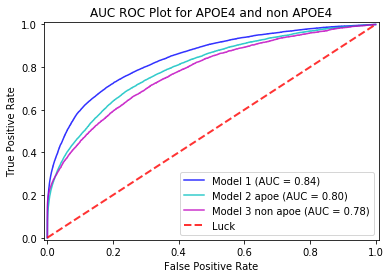

In [24]:



modelscore_full_mod=runmodel(AD_model_full_modify,dropvars_modify,10,5,mod_xgb)
modelscore_apoe_mod=runmodel(AD_model_full_mod_apoe,dropvars_modify,10,3,mod_xgb)
modelscore_nonapoe_mod=runmodel(AD_model_full_mod_nonapoe,dropvars_modify,10,3,mod_xgb)

plot_ROCAUC_mult(modelscore_full_mod['AD'], modelscore_full_mod['risk'],modelscore_apoe_mod['AD'],
                 modelscore_apoe_mod['risk'],
                 modelscore_nonapoe_mod['AD'],
                 modelscore_nonapoe_mod['risk'],'AUC ROC Plot for APOE4 and non APOE4')

In [33]:
dropvars_gfilt=varstodrop(AD_model_full_gfilt,drpvars1,drvarsdef)

AD_model_full_gfilt_apoe=maskapoedf(AD_model_full_gfilt,apoe=1)
AD_model_full_gfilt_nonapoe=maskapoedf(AD_model_full_gfilt,apoe=0)

modelscore_full=runmodel(AD_model_full_gfilt,dropvars_gfilt,10,5,mod_xgb)
modelscore_apoe=runmodel(AD_model_full_gfilt_apoe,dropvars_gfilt,10,3,mod_xgb)
modelscore_nonapoe=runmodel(AD_model_full_gfilt_nonapoe,dropvars_gfilt,10,3,mod_xgb)

plot_ROCAUC_mult(modelscore_full['AD'], modelscore_full['risk'],modelscore_apoe['AD'],
                 modelscore_apoe['risk'],
                 modelscore_nonapoe['AD'],
                 modelscore_nonapoe['risk'],'AUC ROC Plot for APOE4 and non APOE4')

0



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


KeyboardInterrupt: 

iteration: 0



Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#deprecate-loc-reindex-listlike
using a dict on a Series for aggregation
is deprecated and will be removed in a future version. Use                 named aggregation instead.

    >>> grouper.agg(name_1=func_1, name_2=func_2)



iteration: 1
iteration: 2
iteration: 3
iteration: 4
iteration: 5
iteration: 6
iteration: 7
iteration: 8
iteration: 9
Accuracy : 0.9784
525.0
AUC Score (Train): 0.765062


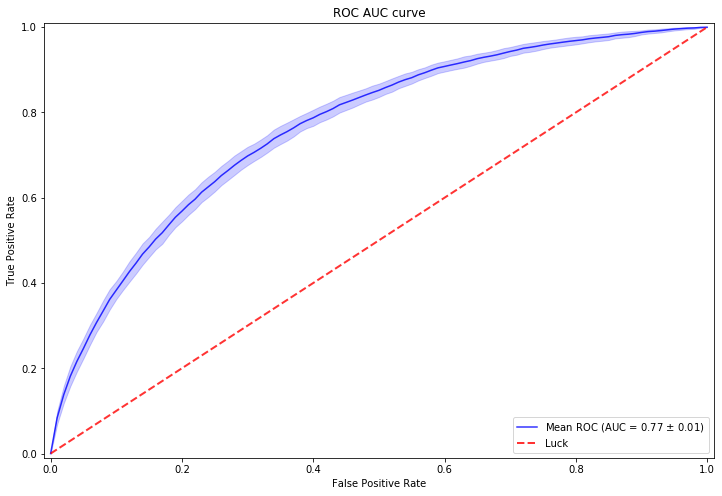

SHAP summary dot plot for selected feature number


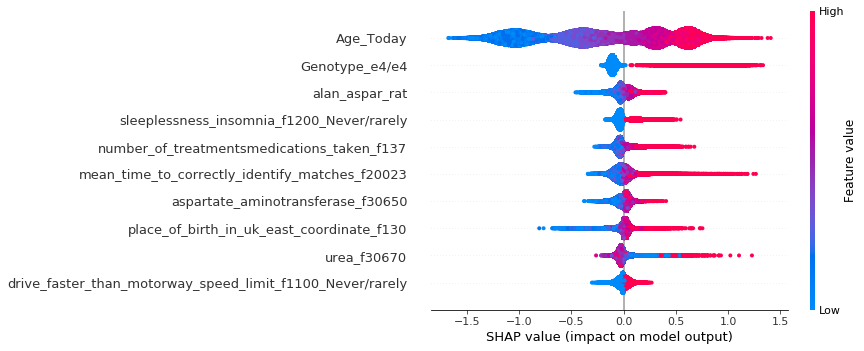

SHAP summary dot plot for 35 features


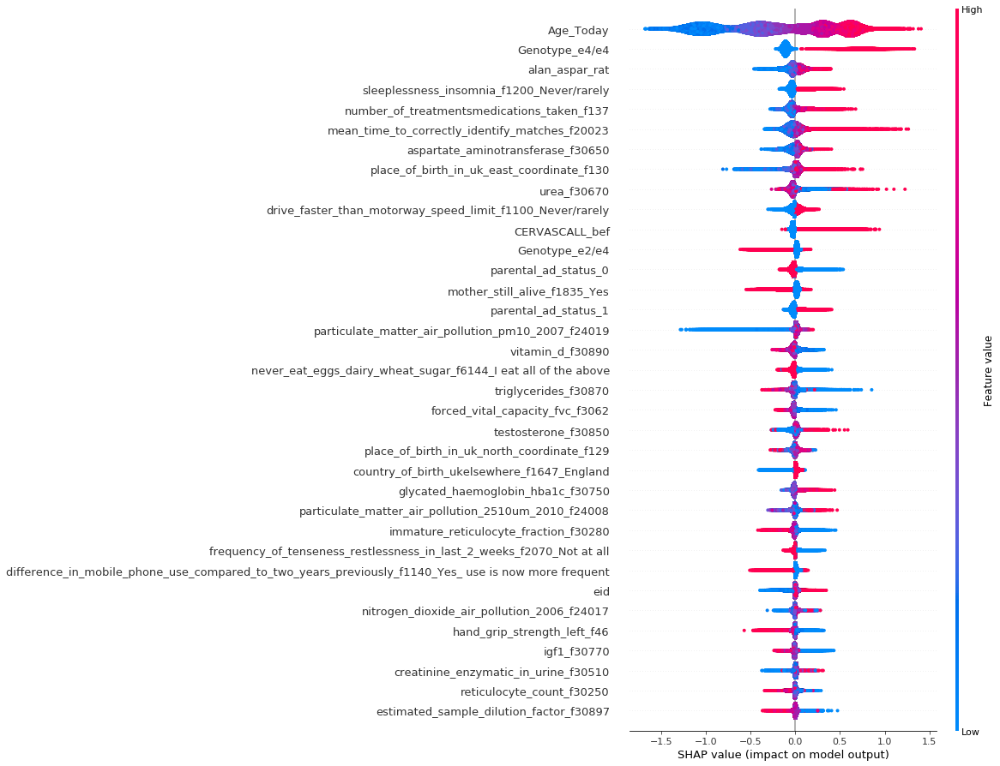

SHAP summary bar plot for selected feature number


invalid value encountered in true_divide
invalid value encountered in true_divide


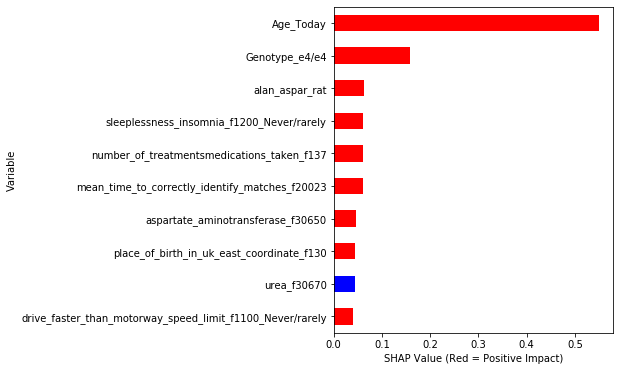

SHAP summary dot plot for 35 features


In [19]:
AD_model_full_gfilt_apoe=maskapoedf(AD_model_full_gfilt,apoe=1)
AD_model_full_gfilt_nonapoe=maskapoedf(AD_model_full_gfilt,apoe=0)

s_gfilt_apoe2,score_gfilt_apoe2=newmodelrun(AD_model_full_gfilt_apoe,dropvars=dropvars_gfilt,model=mod_xgb,depvar='AD',
                    reps=10,splits=3,rebalance=0,max_display=10,plot_type="dot",shap=1,plots=1)


iteration: 0



Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#deprecate-loc-reindex-listlike
using a dict on a Series for aggregation
is deprecated and will be removed in a future version. Use                 named aggregation instead.

    >>> grouper.agg(name_1=func_1, name_2=func_2)



iteration: 1
iteration: 2
iteration: 3
iteration: 4
iteration: 5
iteration: 6
iteration: 7
iteration: 8
iteration: 9
Accuracy : 0.9951
7.0
AUC Score (Train): 0.727179


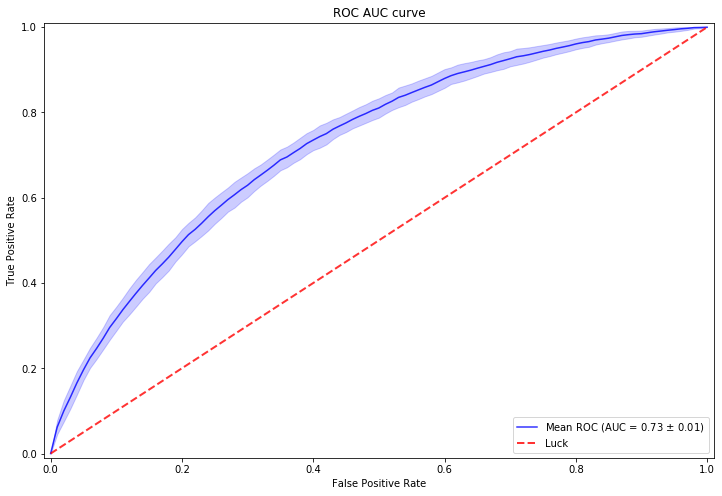

SHAP summary dot plot for selected feature number


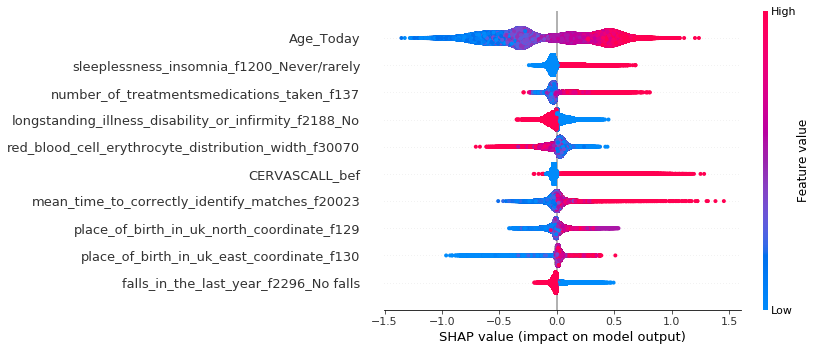

SHAP summary dot plot for 35 features


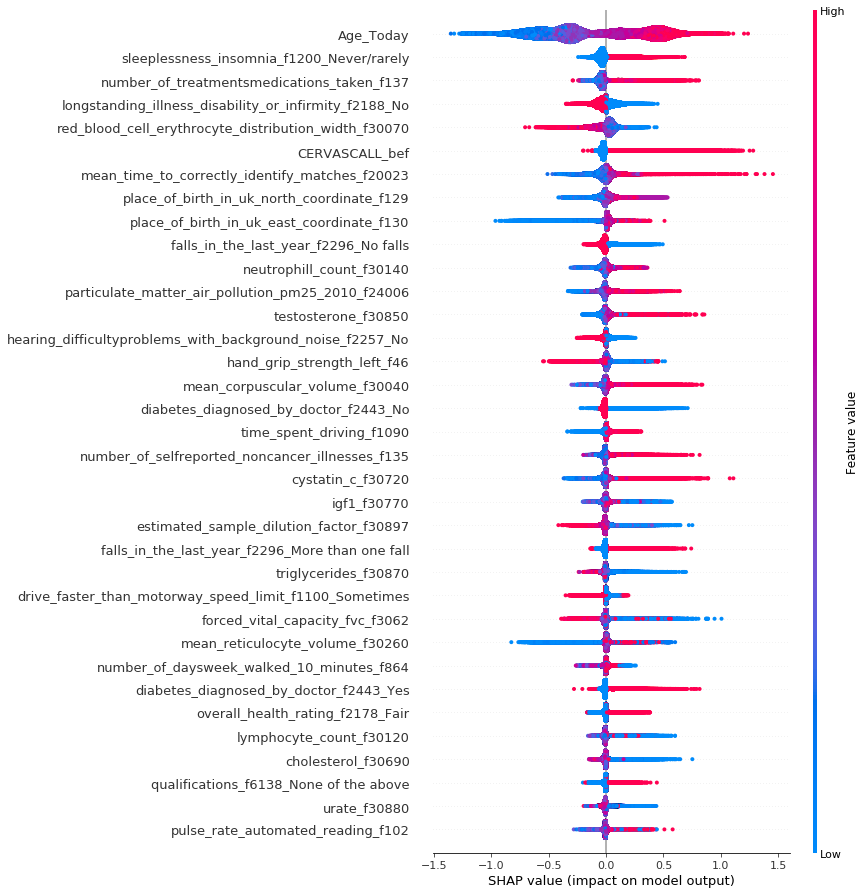

SHAP summary bar plot for selected feature number


invalid value encountered in true_divide
invalid value encountered in true_divide


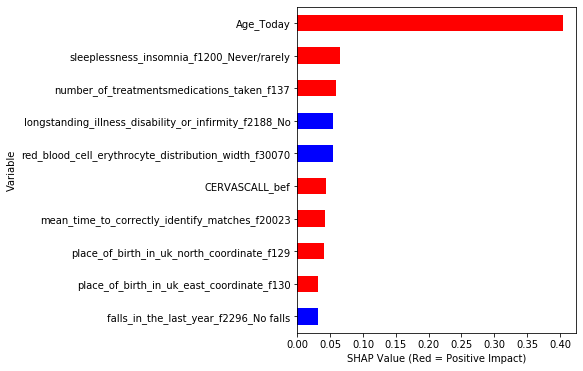

SHAP summary dot plot for 35 features


In [21]:
s_gfilt_napoe2,score_gfilt_napoe2=newmodelrun(AD_model_full_gfilt_nonapoe,dropvars=dropvars_gfilt,model=mod_xgb,depvar='AD',
                    reps=10,splits=3,rebalance=0,max_display=10,plot_type="dot",shap=1,plots=1)


In [133]:
dropvars_gfilt=varstodrop(AD_model_full_gfilt,drpvars1,drvarsdef)
modelscore=runmodel(AD_model_full_gfilt,dropvars_gfilt,10,5,mod_xgb)
modelscore.to_pickle('%s%s' % (path,'modelscore.p'))

0



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1
2
3
4
5
6
7
8
9


In [129]:
modelscore=pd.DataFrame(modelscore.groupby('eid')['risk'].mean()).reset_index()
modelscore.columns=['eid','risk']
modelscore=pd.merge(AD_model_full_gfilt,modelscore,on='eid',how='inner')
modelscore.shape
modelscore.groupby('Genotype_e4/e4')['risk'].mean()

(171670, 1626)

In [94]:
check=score_df(train_g,test_g,dropvars_gfilt,model=mod_xgb,dropcolyn=1)

In [51]:
filtcols=np.append(np.asarray(s_gfilt2['column_name'].head(20)),'AD')
AD_model_full_gfilt_tp=AD_model_full_gfilt[filtcols]
#

In [ ]:


dropvars_gfilt=varstodrop(AD_model_full_gfilt,drpvars1,drvarsdef)
score_gfilt2=newmodelrun(AD_model_full_gfilt,dropvars=dropvars_gfilt,model=mod_xgb,depvar='AD',
                    reps=1,splits=2,rebalance=0,max_display=15,plot_type="dot",shap=0)


iteration: 0


using a dict on a Series for aggregation
is deprecated and will be removed in a future version. Use                 named aggregation instead.

    >>> grouper.agg(name_1=func_1, name_2=func_2)



Accuracy : 0.9902
73.0
AUC Score (Train): 0.786885


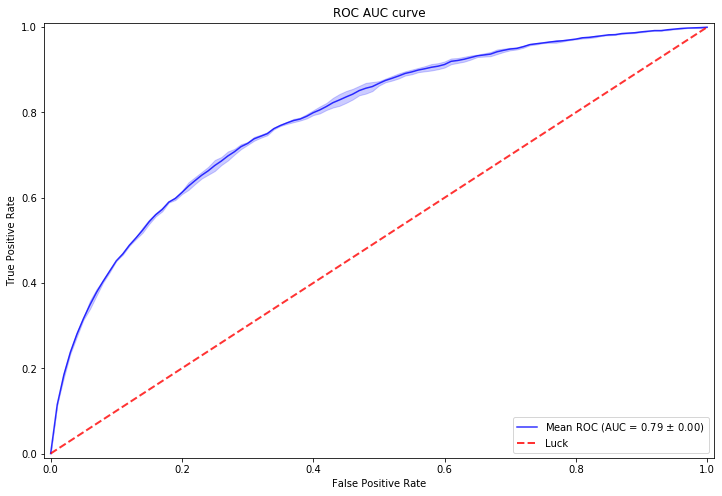

In [18]:
dropvars_modify=varstodrop(AD_model_full_modify,drpvars_mod,drvarsdef)
score_temp=newmodelrun(AD_model_full_modify,dropvars=dropvars_modify,model=mod_xgb,depvar='AD',
                    reps=1,splits=2,rebalance=0,max_display=15,plot_type="dot",shap=0)

In [71]:
score_gfilt.to_pickle('%s%s' % (path,'ADScore_gfilt.p'))

iteration: 0


using a dict on a Series for aggregation
is deprecated and will be removed in a future version. Use                 named aggregation instead.

    >>> grouper.agg(name_1=func_1, name_2=func_2)



iteration: 1
iteration: 2
iteration: 3
iteration: 4
Accuracy : 0.9902
407.0
AUC Score (Train): 0.789585


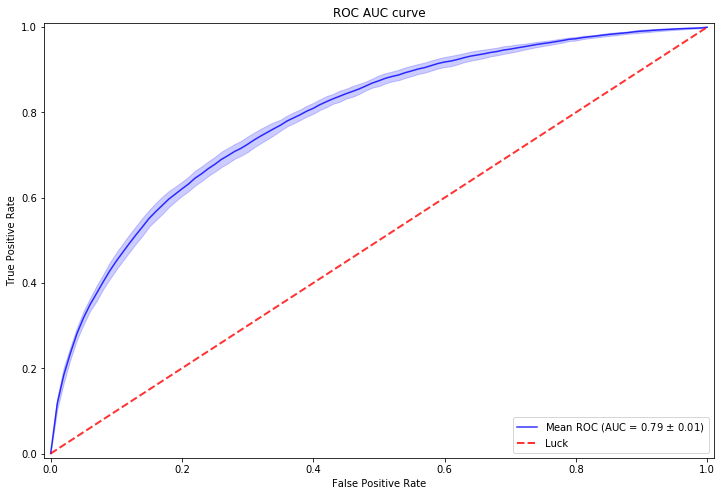

SHAP summary dot plot for selected feature number


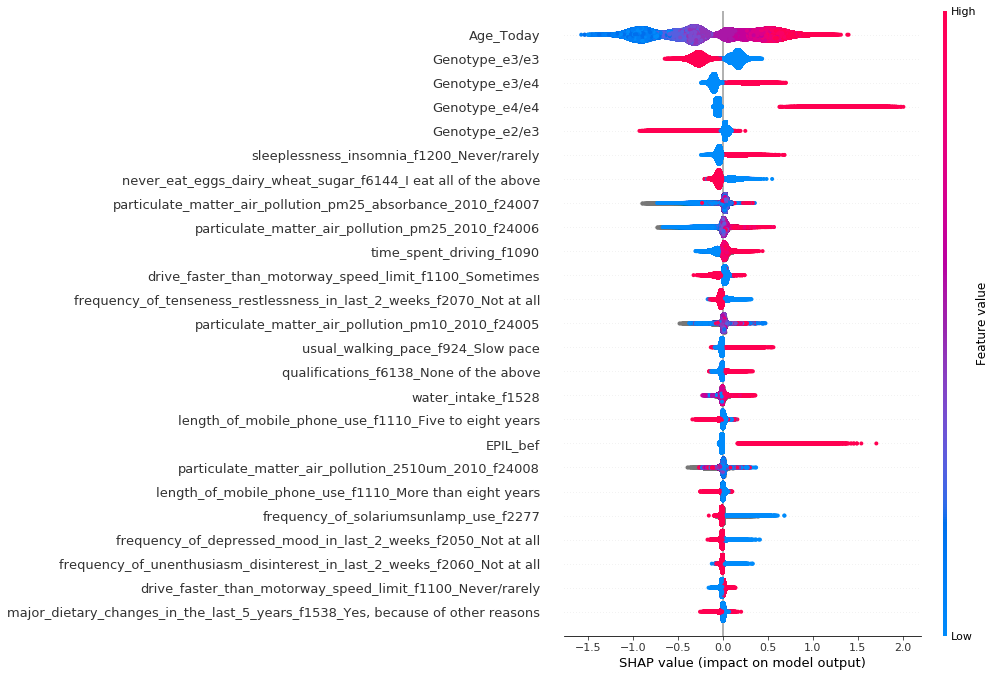

SHAP summary dot plot for 35 features


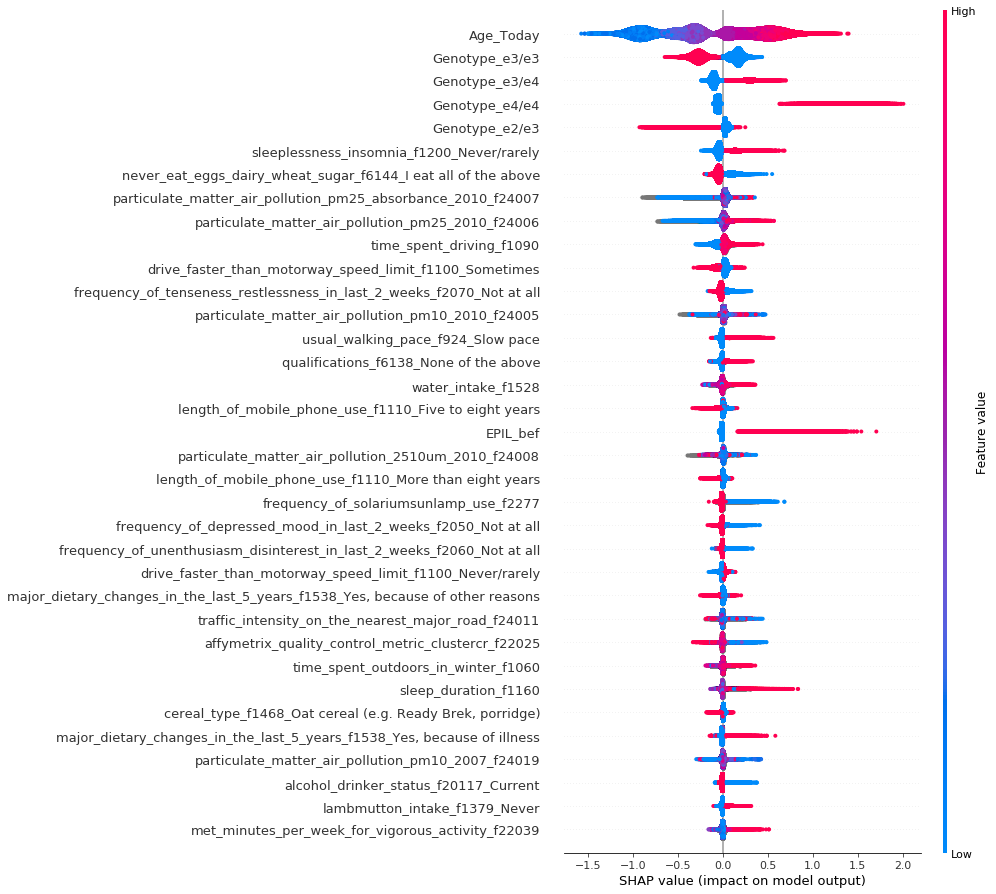

SHAP summary bar plot for selected feature number


invalid value encountered in true_divide
invalid value encountered in true_divide


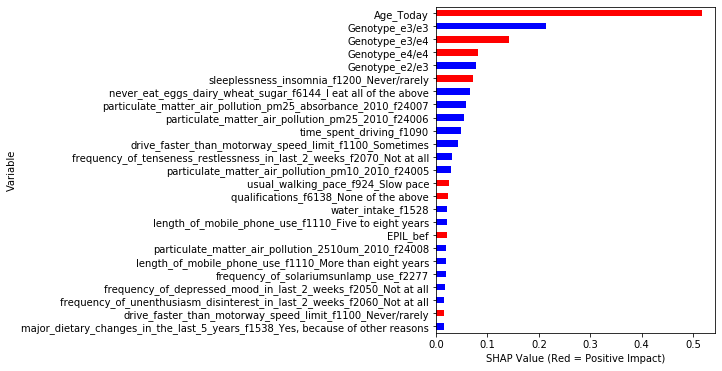

SHAP summary dot plot for 35 features


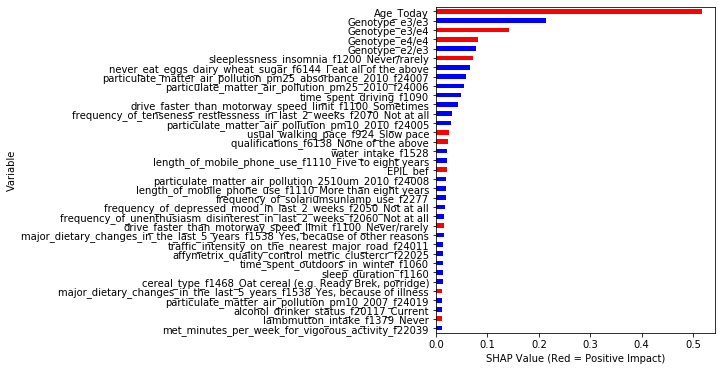

In [40]:
s_rbn_modif,score_rbn_modif=newmodelrun(AD_model_full_modify,dropvars=dropvars_modify,model=mod_xgb,depvar='AD',
                    reps=5,splits=3,rebalance=0,max_display=25,plot_type="dot")


In [23]:
score_rbn_modif.to_pickle('%s%s' % (path,'score_rbn_modif_A.p'))

In [12]:
AD_modify_APOE=maskapoedf(df=AD_model_full_modify,apoe=1)
AD_modify_non_APOE=maskapoedf(df=AD_model_full_modify,apoe=0)

iteration: 0



Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#deprecate-loc-reindex-listlike
using a dict on a Series for aggregation
is deprecated and will be removed in a future version. Use                 named aggregation instead.

    >>> grouper.agg(name_1=func_1, name_2=func_2)



iteration: 1
iteration: 2
iteration: 3
iteration: 4
Accuracy : 0.9786
153.0
AUC Score (Train): 0.725503


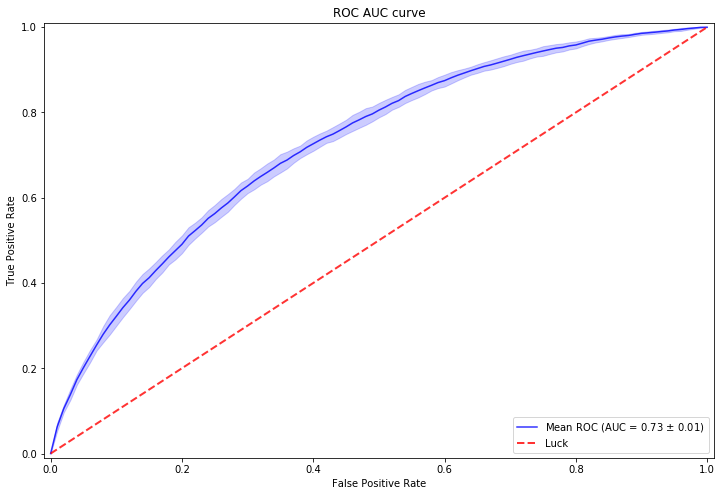

SHAP summary dot plot for selected feature number


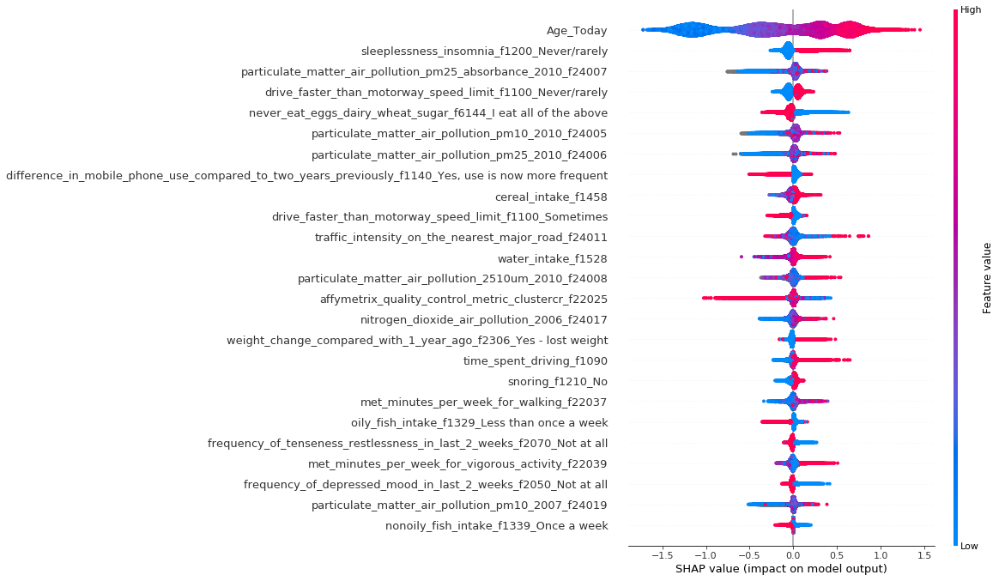

SHAP summary dot plot for 35 features


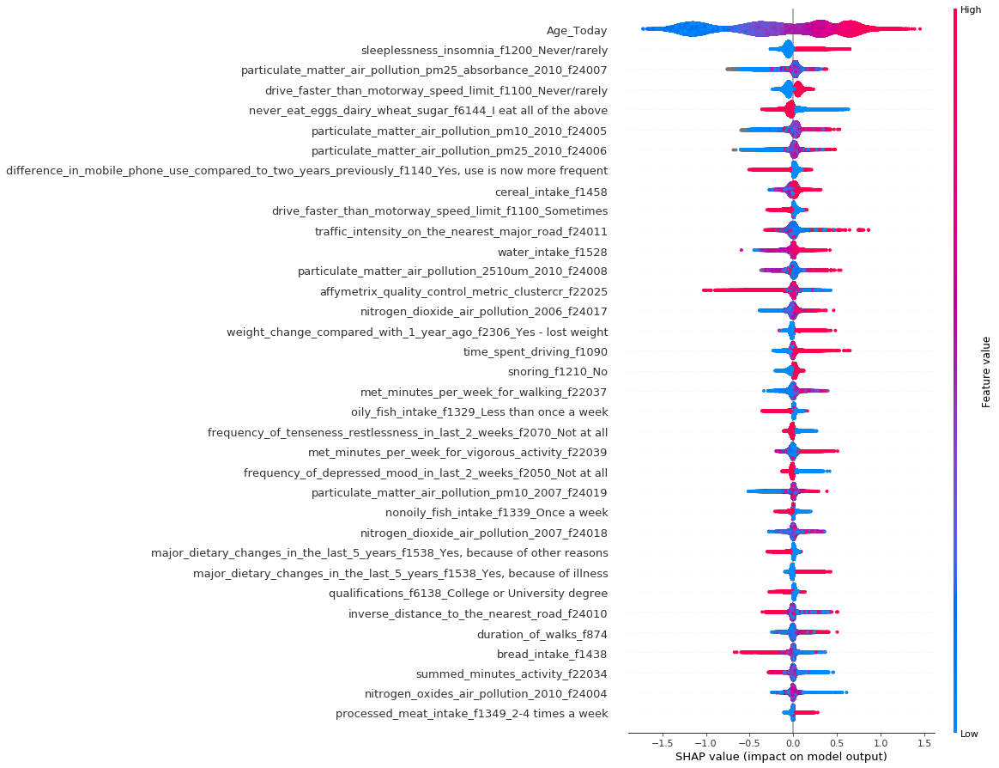

SHAP summary bar plot for selected feature number


invalid value encountered in true_divide
invalid value encountered in true_divide


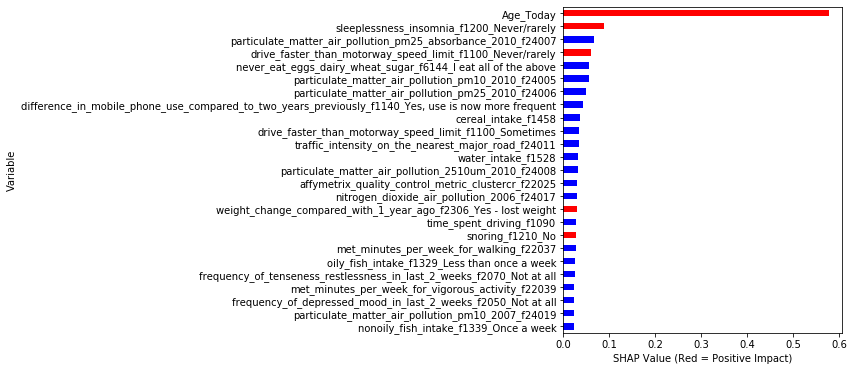

SHAP summary dot plot for 35 features


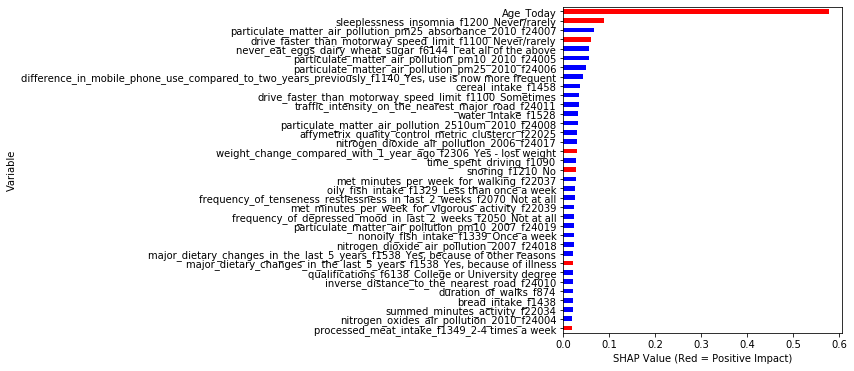

In [57]:
cols_drop2=[col for col in AD_modify_APOE.columns if 'Genotype' not in col or 'Unknown' in col]
s_rbn_modif_A,score_rbn_modif_A=newmodelrun(AD_modify_APOE[cols_drop2],dropvars=dropvars_modify,model=mod_xgb,depvar='AD',
                    reps=5,splits=3,rebalance=0,max_display=25,plot_type="dot")

iteration: 0



Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#deprecate-loc-reindex-listlike
using a dict on a Series for aggregation
is deprecated and will be removed in a future version. Use                 named aggregation instead.

    >>> grouper.agg(name_1=func_1, name_2=func_2)



iteration: 1
iteration: 2
iteration: 3
iteration: 4
iteration: 5
iteration: 6
iteration: 7
iteration: 8
iteration: 9
Accuracy : 0.9951
7.0
AUC Score (Train): 0.698989


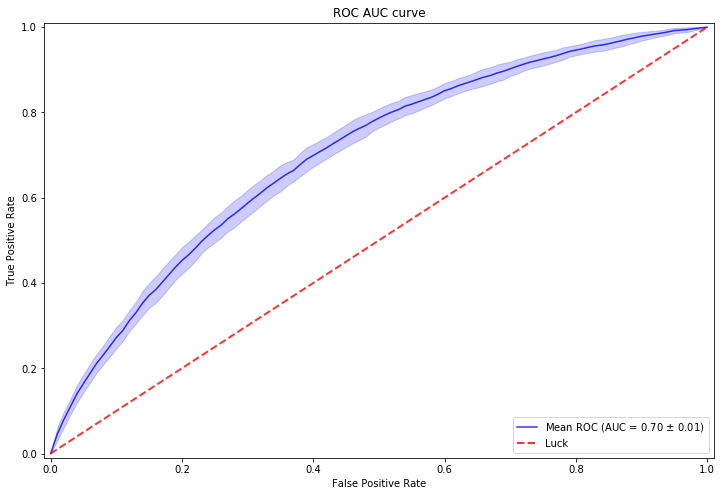

SHAP summary dot plot for selected feature number


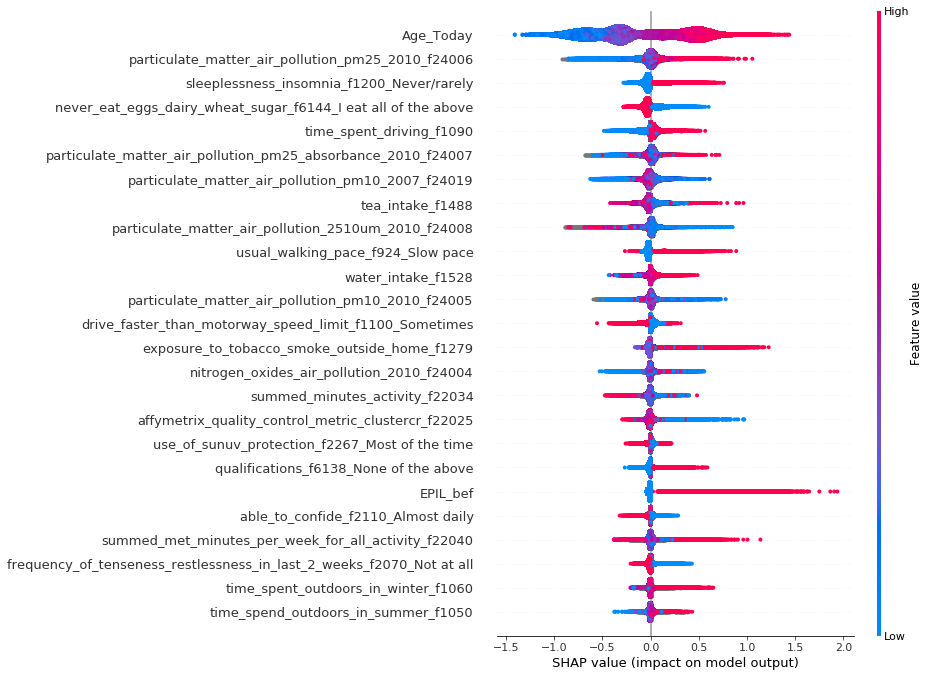

SHAP summary dot plot for 35 features


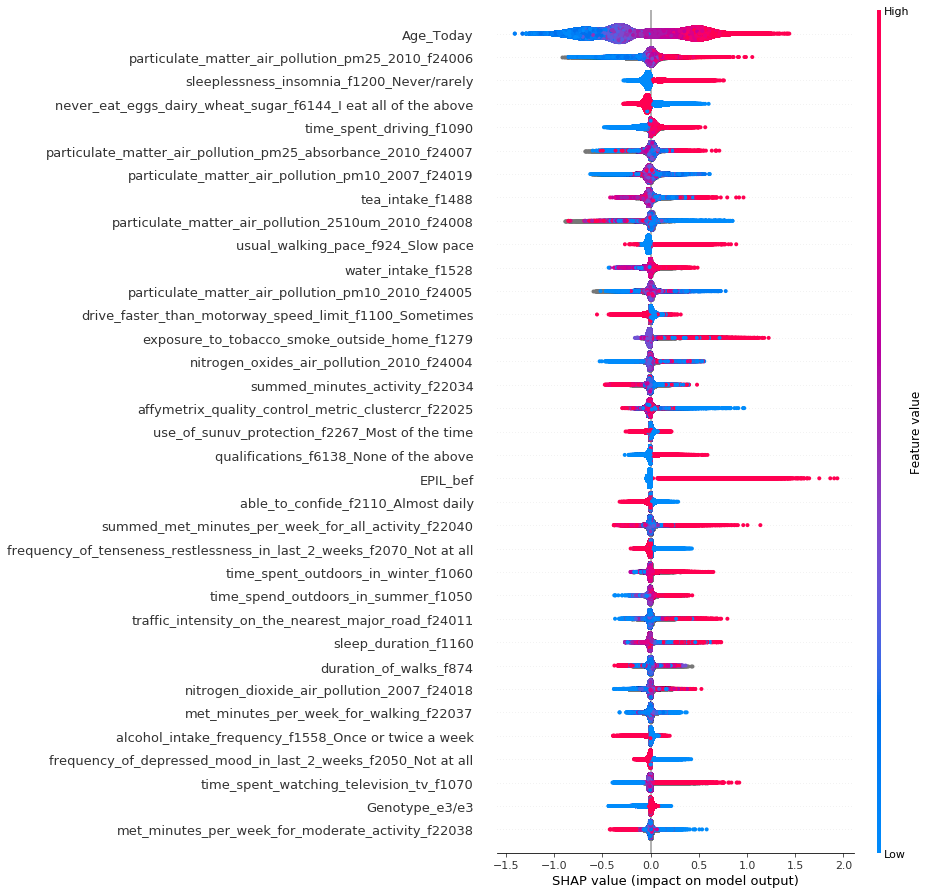

SHAP summary bar plot for selected feature number


invalid value encountered in true_divide
invalid value encountered in true_divide


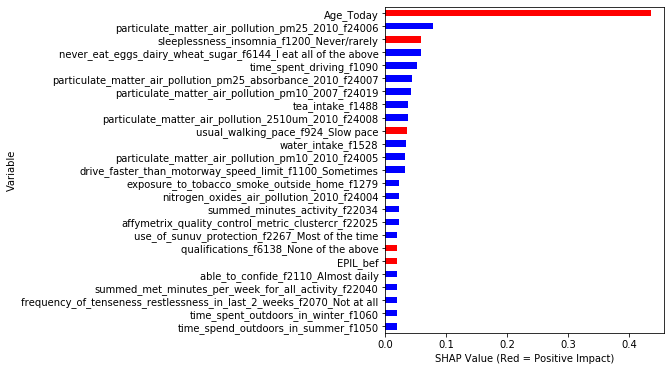

SHAP summary dot plot for 35 features


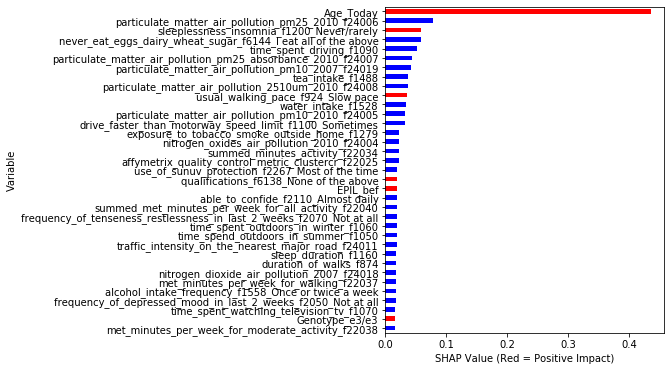

In [51]:
s_rbn_modif_nA=newmodelrun(AD_modify_non_APOE,dropvars=dropvars_modify,model=mod_xgb,depvar='AD',
                    reps=10,splits=3,rebalance=0,max_display=25,plot_type="dot")

In [85]:
shap_amt=0.6
mask_shap_rbn=(s_rbn_modif['mean_shap_imp'].cumsum()<shap_amt*s_rbn_modif['mean_shap_imp'].sum())
mask_shap_rbn_nA=(s_rbn_modif_nA['mean_shap_imp'].cumsum()<shap_amt*s_rbn_modif_nA['mean_shap_imp'].sum())
mask_shap_rbn_A=(s_rbn_modif_A['mean_shap_imp'].cumsum()<shap_amt*s_rbn_modif_A['mean_shap_imp'].sum())

s_rbn_modif_nA_s=s_rbn_modif_nA[mask_shap_rbn_nA]
s_rbn_modif_A_s=s_rbn_modif_A[mask_shap_rbn_A]
s_rbn_modif_s=s_rbn_modif[mask_shap_rbn]

In [16]:
#np.unique(np.concatenate([np.asarray(s_rbn_modif_s['column_name'].head(15)),
#                   np.asarray(s_rbn_modif_A_s['column_name'].head(15)),
#                         np.asarray(s_rbn_modif_nA_s['column_name'].head(15))]))

iteration: 0
iteration: 1
iteration: 2
iteration: 3
iteration: 4
iteration: 5
iteration: 6
iteration: 7
iteration: 8
iteration: 9
Accuracy : 0.9902
703.0
AUC Score (Train): 0.787414


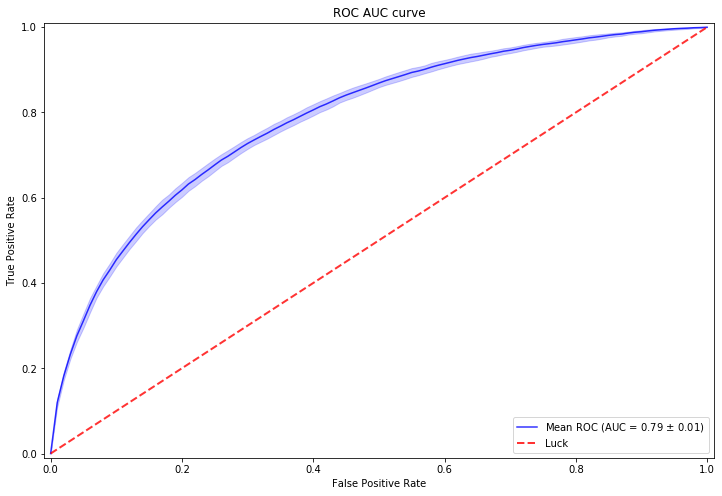

SHAP summary dot plot for selected feature number


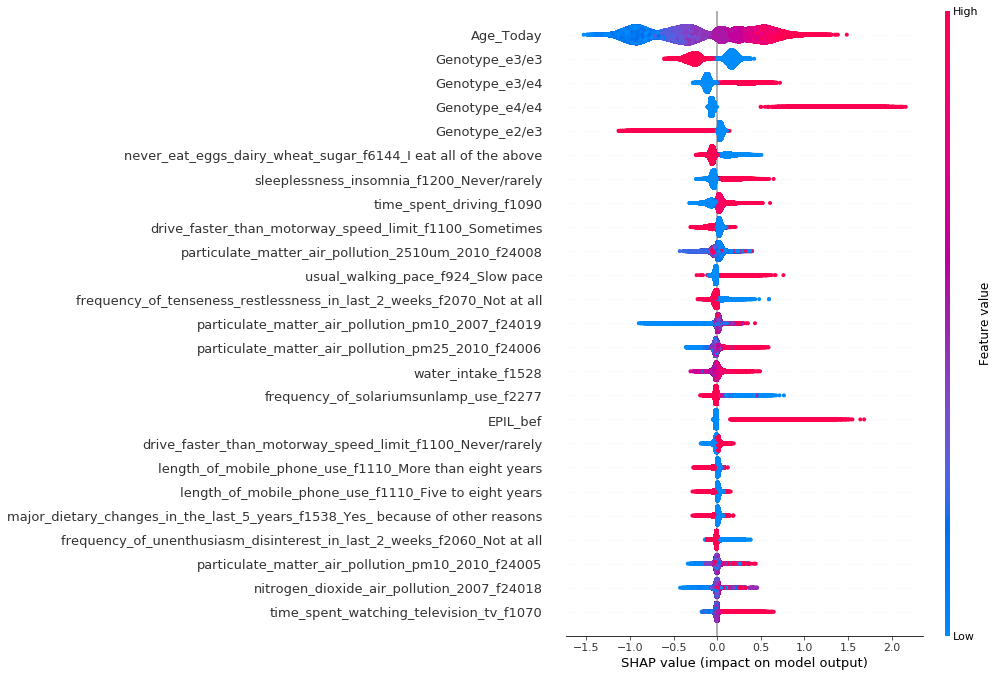

SHAP summary dot plot for 35 features


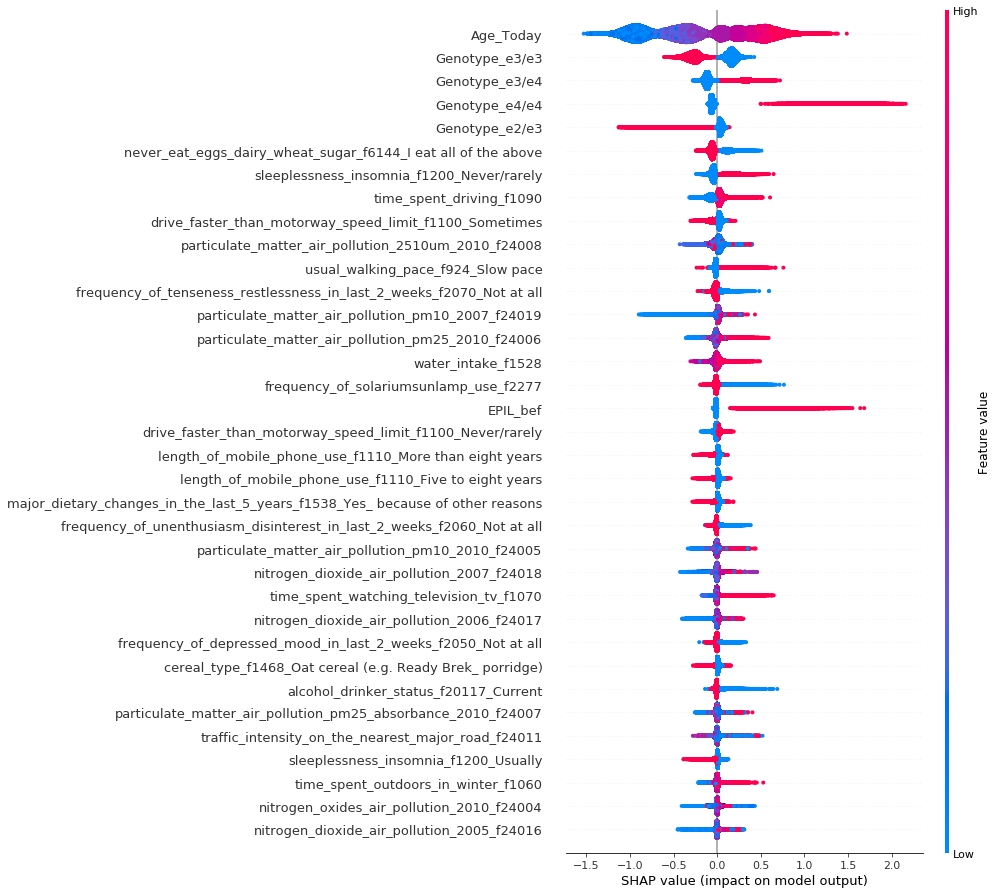

SHAP summary bar plot for selected feature number


invalid value encountered in true_divide
invalid value encountered in true_divide


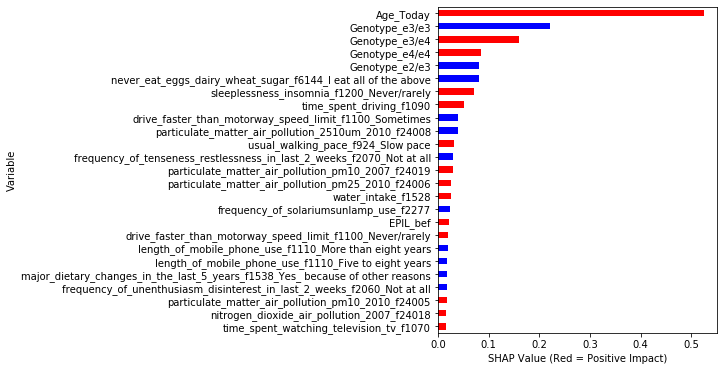

SHAP summary dot plot for 35 features


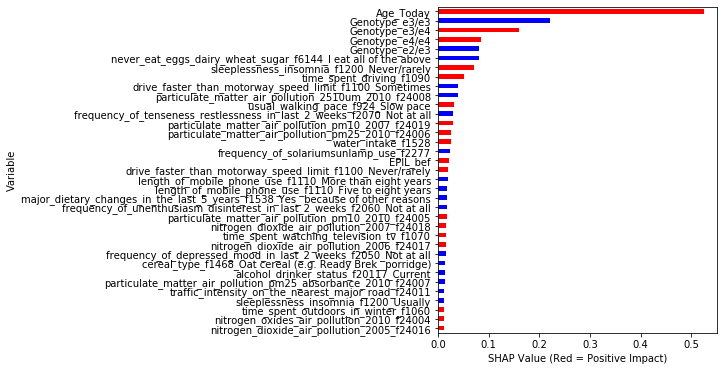

In [69]:
s_rbn_modif=newmodelrun(AD_model_full_modify,dropvars=dropvars_modify,model=mod_xgb,depvar='AD',
                    reps=10,splits=3,rebalance=0,max_display=25,plot_type="dot")

iteration: 0



Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#deprecate-loc-reindex-listlike


iteration: 1
iteration: 2
iteration: 3
iteration: 4
iteration: 5
iteration: 6
iteration: 7
iteration: 8
iteration: 9
Accuracy : 0.6975
15932.0
AUC Score (Train): 0.763411


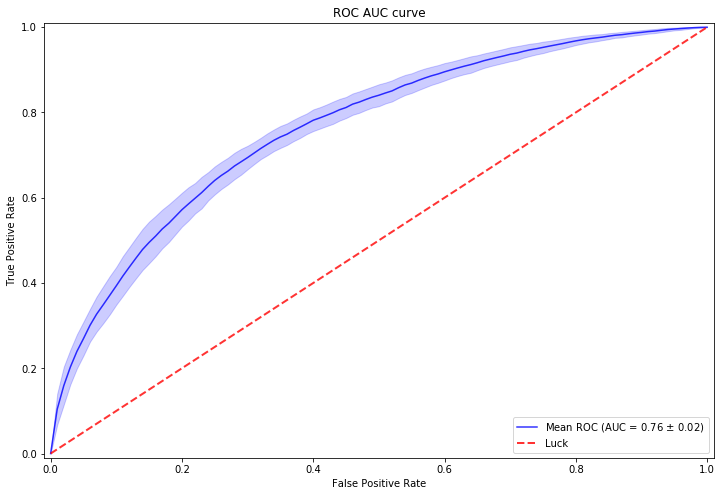

SHAP summary dot plot for selected feature number


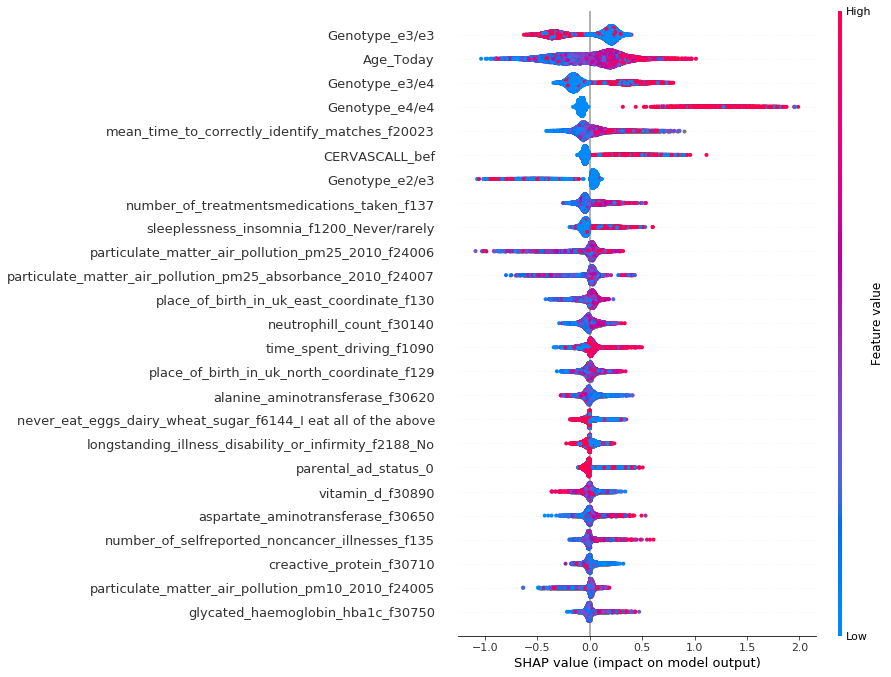

SHAP summary dot plot for 35 features


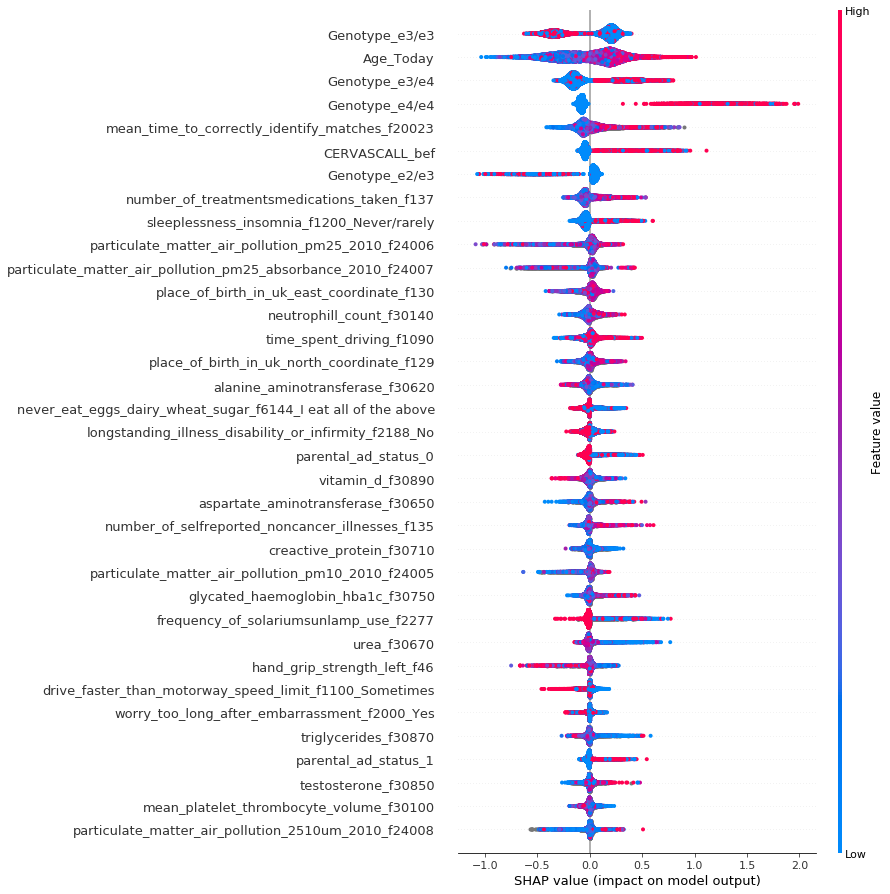

SHAP summary bar plot for selected feature number


invalid value encountered in true_divide
invalid value encountered in true_divide


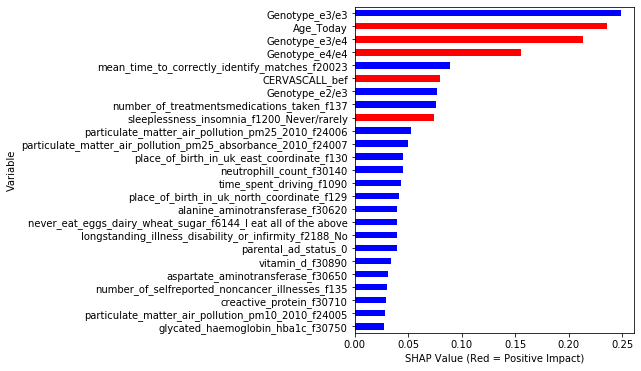

SHAP summary dot plot for 35 features


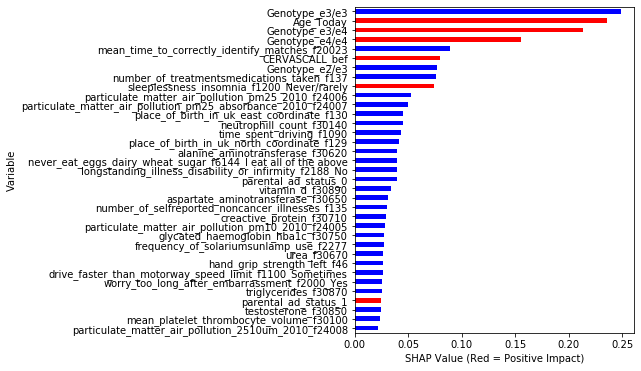

In [30]:
dropvars_full70=varstodrop(AD_model_full70,drpvars1,drvarsdef)
shapsum_nonrebal=newmodelrun(AD_model_full70,dropvars=dropvars_full70,model=mod_xgb_rebal,depvar='AD',
                    reps=10,splits=4,rebalance=1,max_display=25,plot_type="dot")

iteration: 0


using a dict on a Series for aggregation
is deprecated and will be removed in a future version. Use                 named aggregation instead.

    >>> grouper.agg(name_1=func_1, name_2=func_2)



Accuracy : 0.9902
72.0
AUC Score (Train): 0.808778


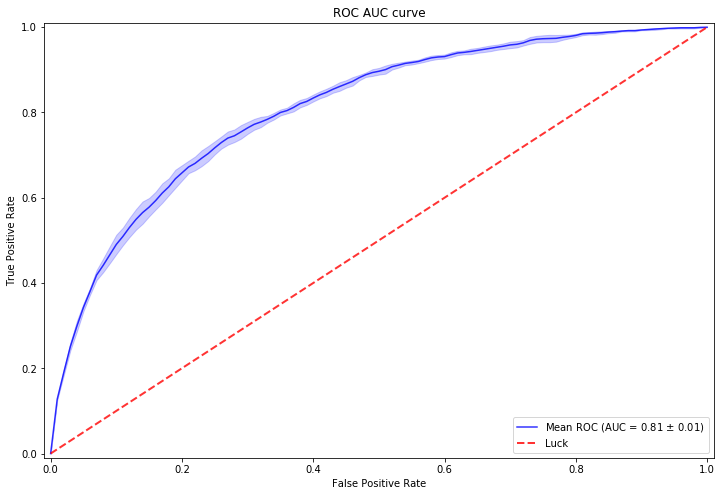

SHAP summary dot plot for selected feature number


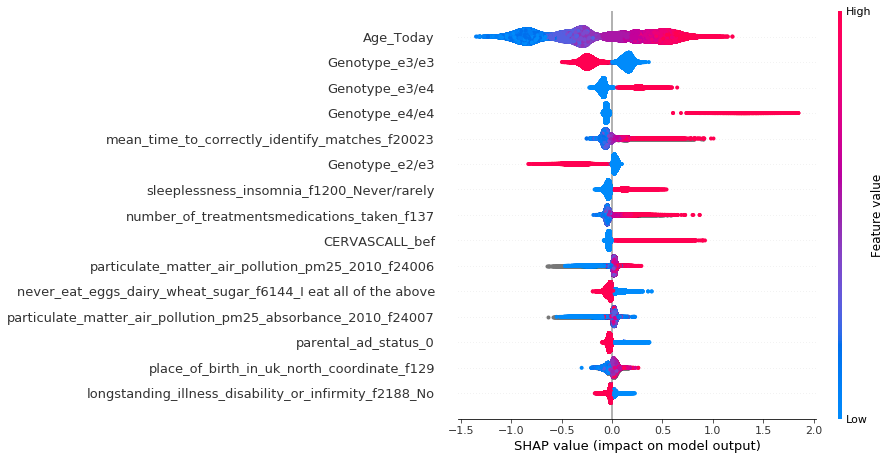

SHAP summary dot plot for 35 features


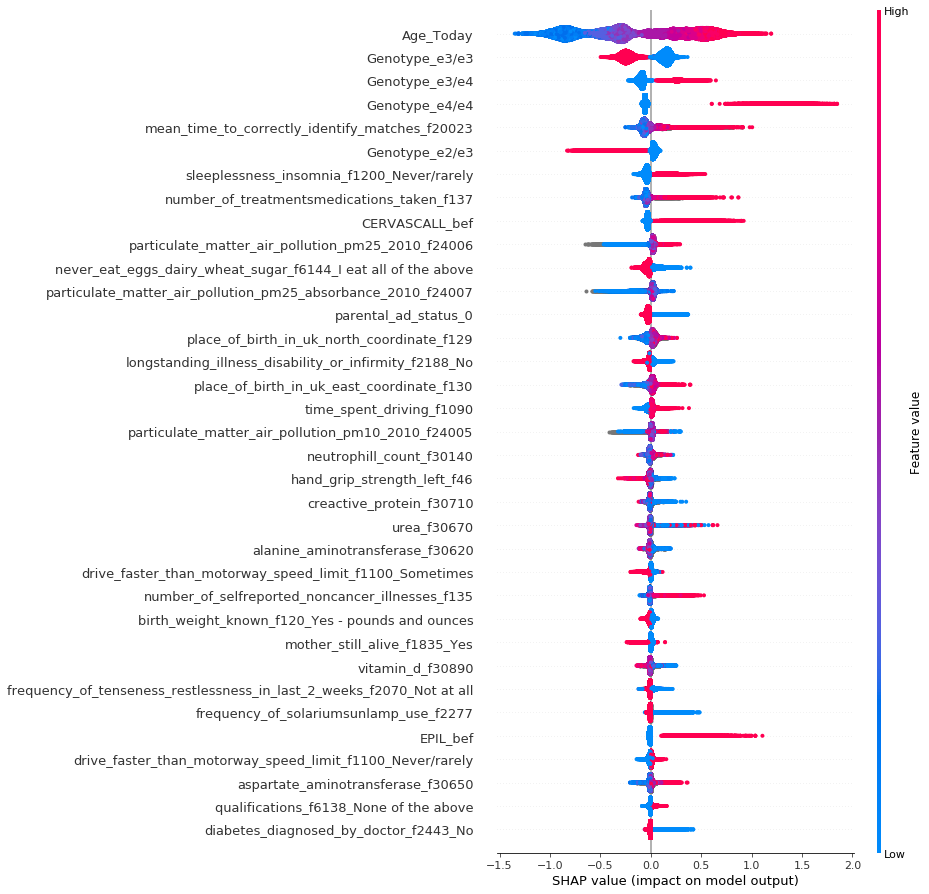

SHAP summary bar plot for selected feature number


invalid value encountered in true_divide
invalid value encountered in true_divide


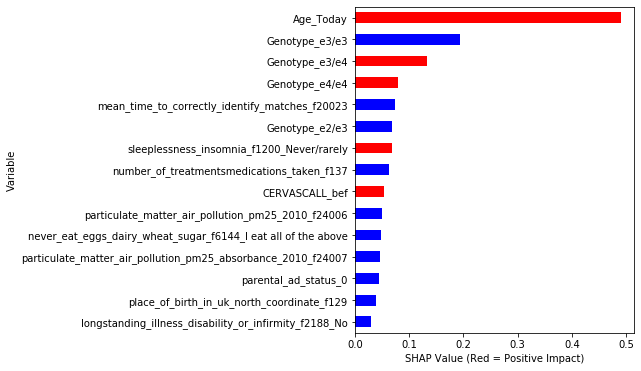

SHAP summary dot plot for 35 features


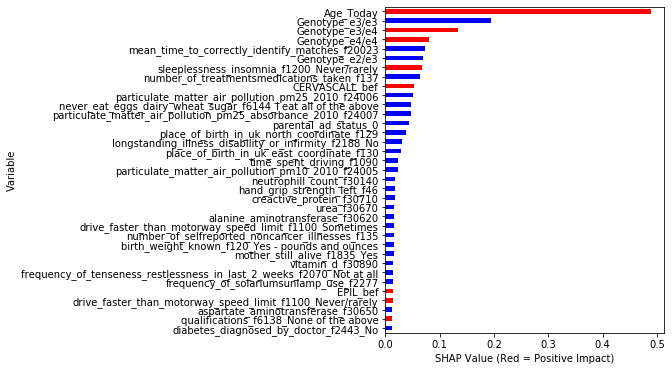

In [19]:
dropvars_full70=varstodrop(AD_model_full70,drpvars1,drvarsdef)
shapsum_nonrebal,score_rebal=newmodelrun(AD_model_full70,dropvars=dropvars_full70,model=mod_xgb,depvar='AD',
                    reps=1,splits=4,rebalance=0,max_display=15,plot_type="dot")

In [20]:
score_rebal.to_pickle('%s%s' % (path,'score_rebal.p'))

iteration: 0
Accuracy : 0.9853
56.0
AUC Score (Train): 0.773348


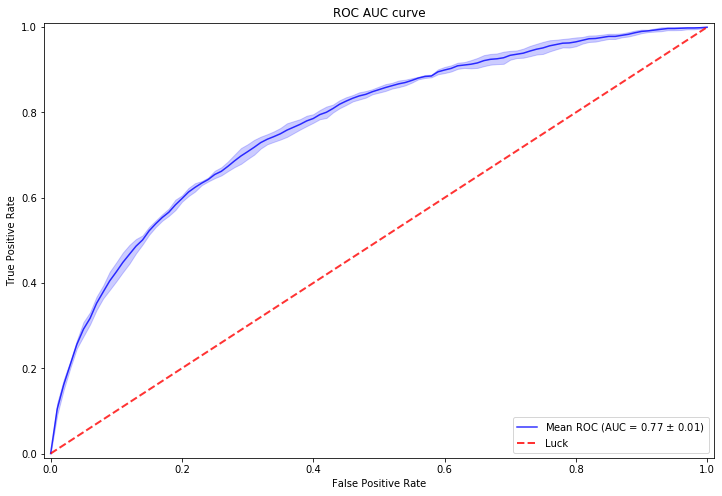

SHAP summary dot plot for selected feature number


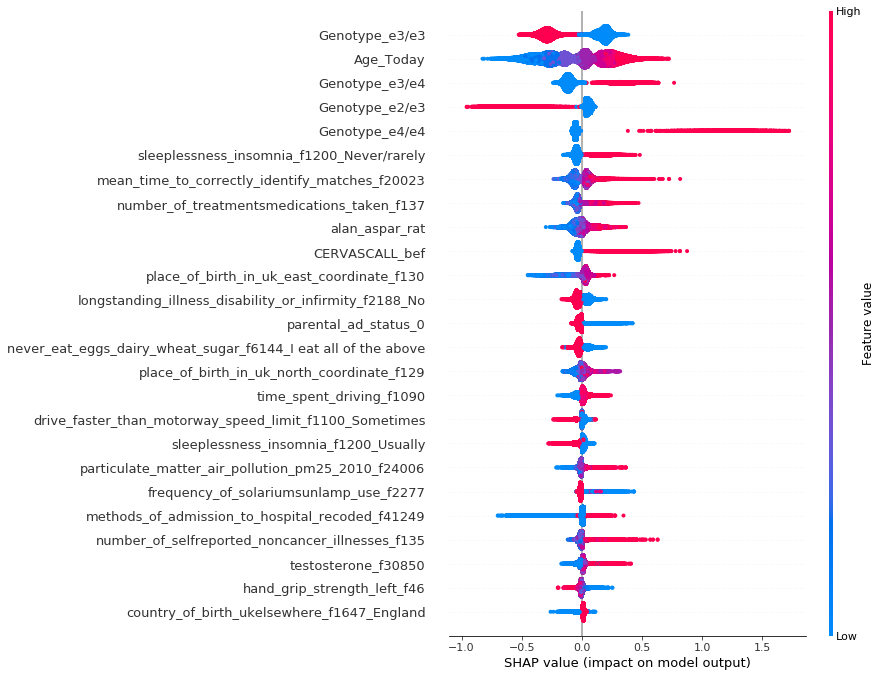

SHAP summary dot plot for 35 features


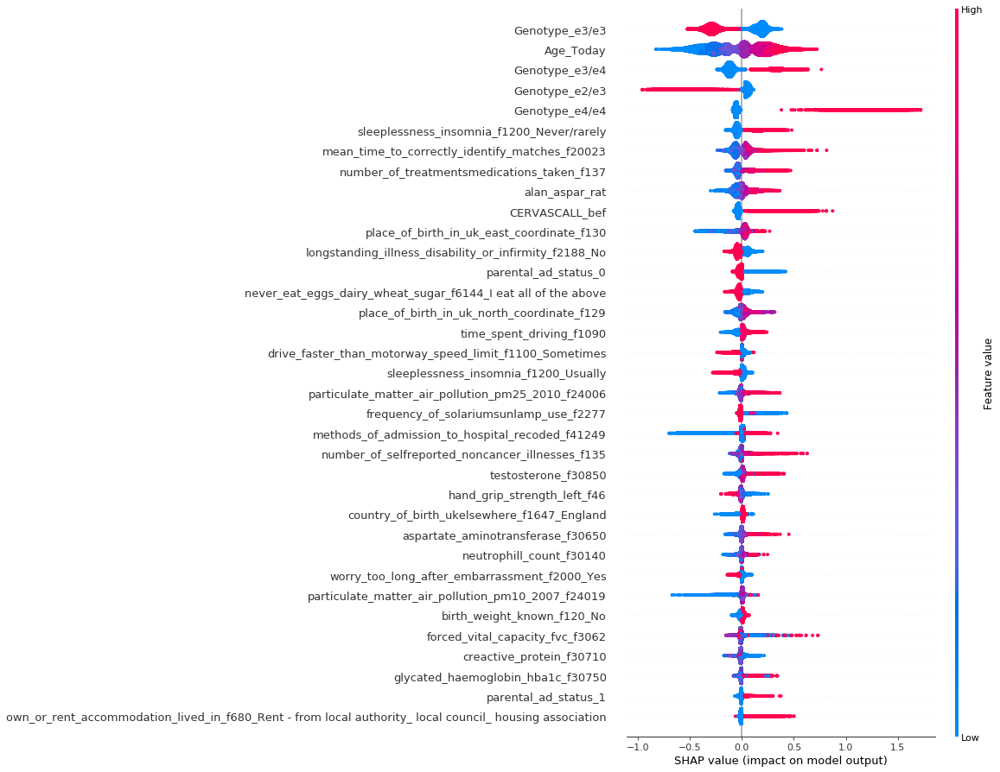

SHAP summary bar plot for selected feature number


invalid value encountered in true_divide
invalid value encountered in true_divide


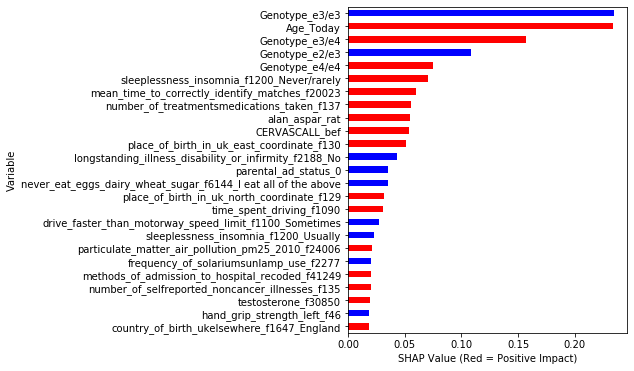

SHAP summary dot plot for 35 features


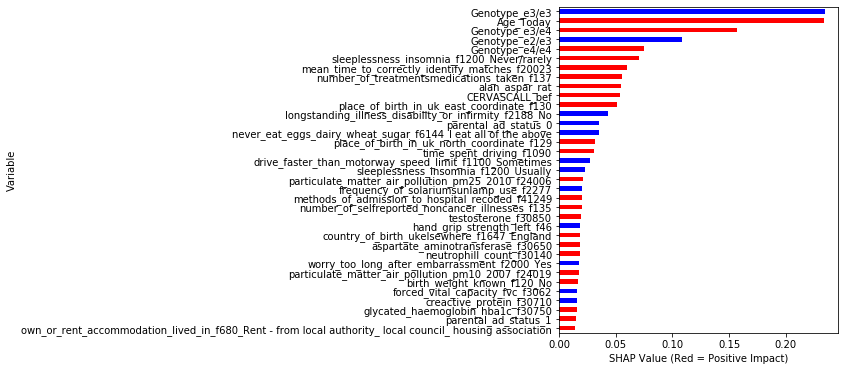

In [21]:
dropvars_full75=varstodrop(AD_model_full75,drpvars1,drvarsdef)
shapsum_nonrebal=newmodelrun(AD_model_full75,dropvars=dropvars_full75,model=mod_xgb,depvar='AD',
                    reps=1,splits=4,rebalance=0,max_display=25,plot_type="dot")

iteration: 0
iteration: 1
iteration: 2
iteration: 3
iteration: 4
iteration: 5
iteration: 6
iteration: 7
iteration: 8
iteration: 9
iteration: 10
iteration: 11
iteration: 12
iteration: 13
iteration: 14
iteration: 15
iteration: 16
iteration: 17
iteration: 18
iteration: 19
iteration: 20
iteration: 21
iteration: 22
iteration: 23
iteration: 24
iteration: 25
iteration: 26
iteration: 27
iteration: 28
iteration: 29
iteration: 30
iteration: 31
iteration: 32
iteration: 33
iteration: 34
iteration: 35
iteration: 36
iteration: 37
iteration: 38
iteration: 39
iteration: 40
iteration: 41
iteration: 42
iteration: 43
iteration: 44
iteration: 45
iteration: 46
iteration: 47
iteration: 48
iteration: 49
Accuracy : 0.9902
3775.0
AUC Score (Train): 0.808602


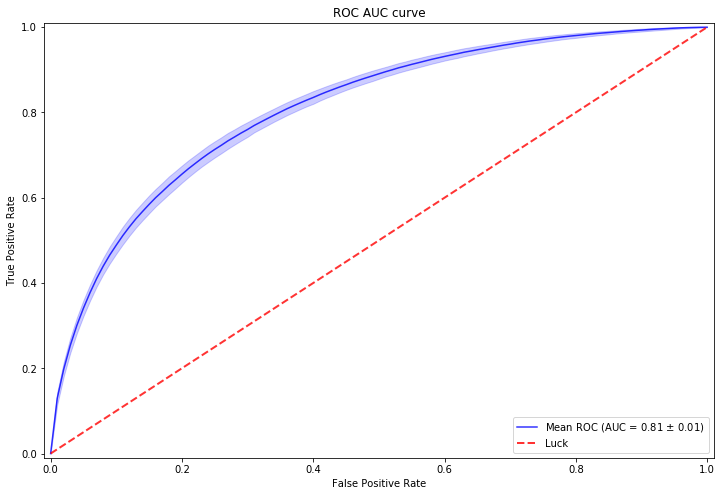

SHAP summary dot plot for selected feature number


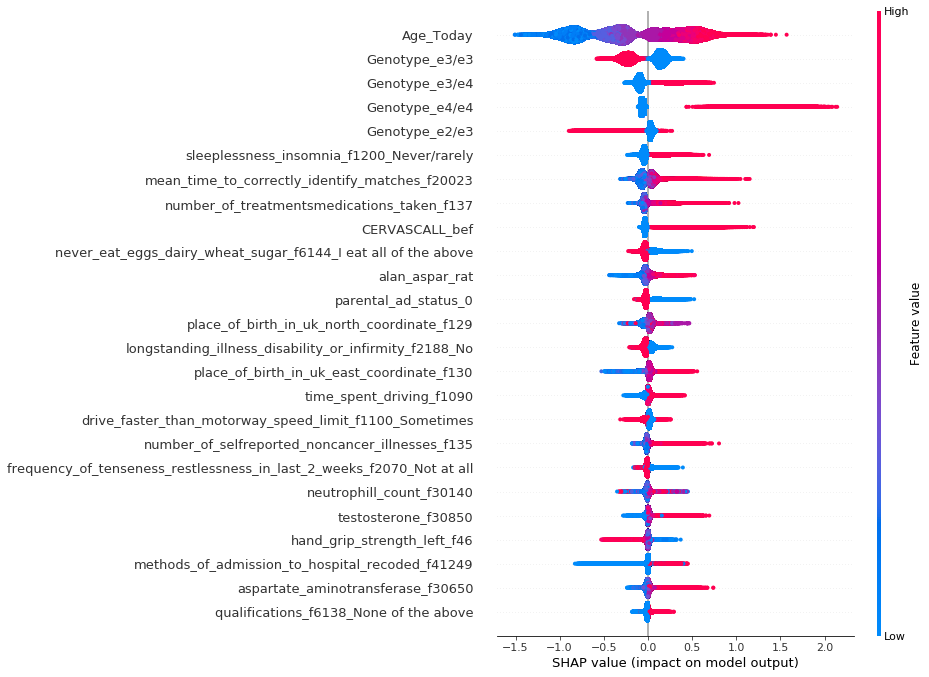

SHAP summary dot plot for 35 features


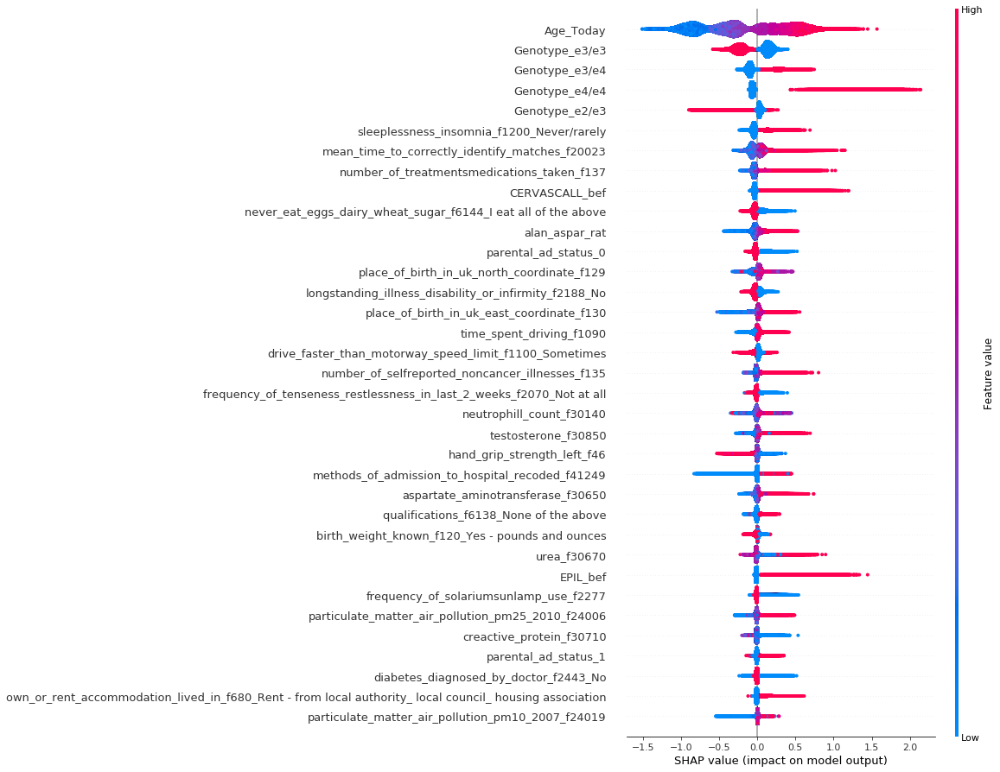

SHAP summary bar plot for selected feature number


In [ ]:
dropvars_full=varstodrop(AD_model_full_mod,drpvars1,drvarsdef)
shapsum_nonrebal=newmodelrun(AD_model_full_mod,dropvars=dropvars_full,model=mod_xgb,depvar='AD',
                    reps=50,splits=4,rebalance=0,max_display=25,plot_type="dot")

iteration: 0
iteration: 1
iteration: 2
iteration: 3
iteration: 4
iteration: 5
iteration: 6
iteration: 7
iteration: 8
iteration: 9
iteration: 10
iteration: 11
iteration: 12
iteration: 13
iteration: 14
iteration: 15
iteration: 16
iteration: 17
iteration: 18
iteration: 19
iteration: 20
iteration: 21
iteration: 22
iteration: 23
iteration: 24
Accuracy : 0.9902
1787.0
AUC Score (Train): 0.807005


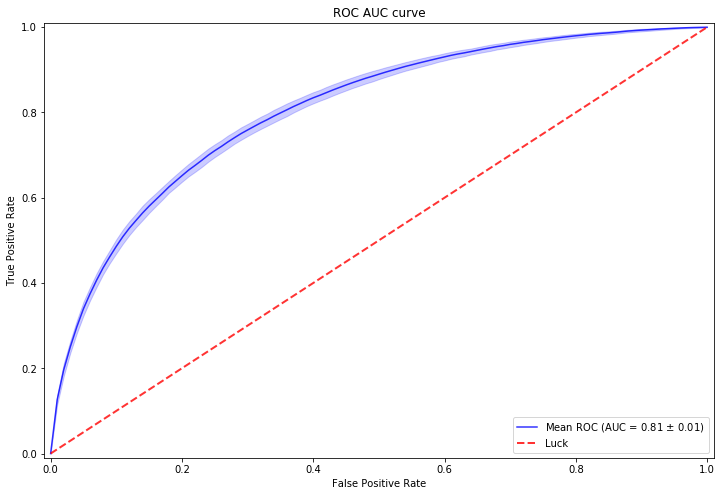

SHAP summary dot plot for selected feature number


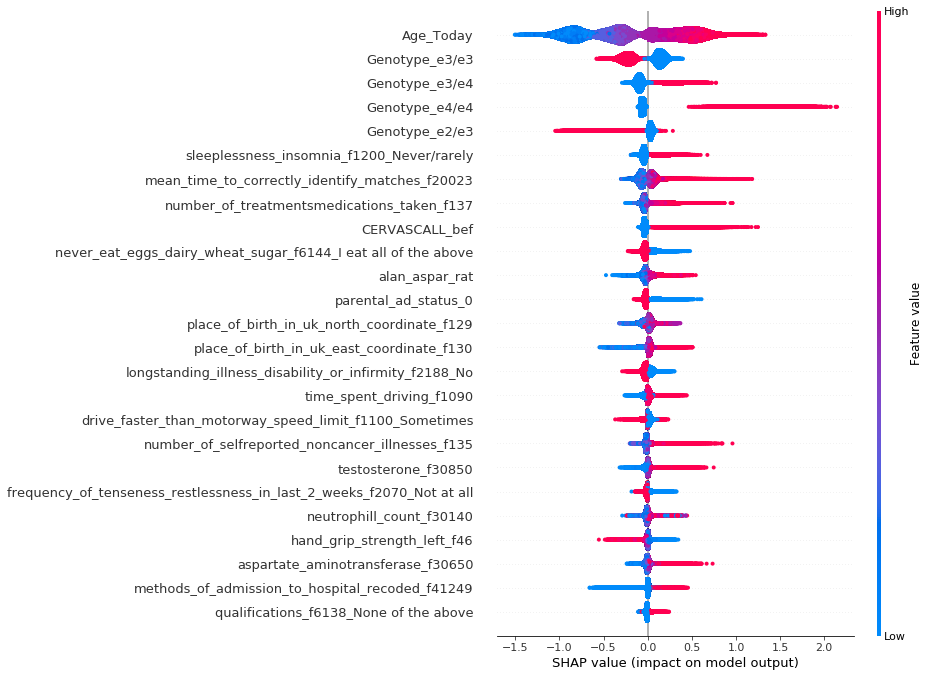

SHAP summary dot plot for 35 features


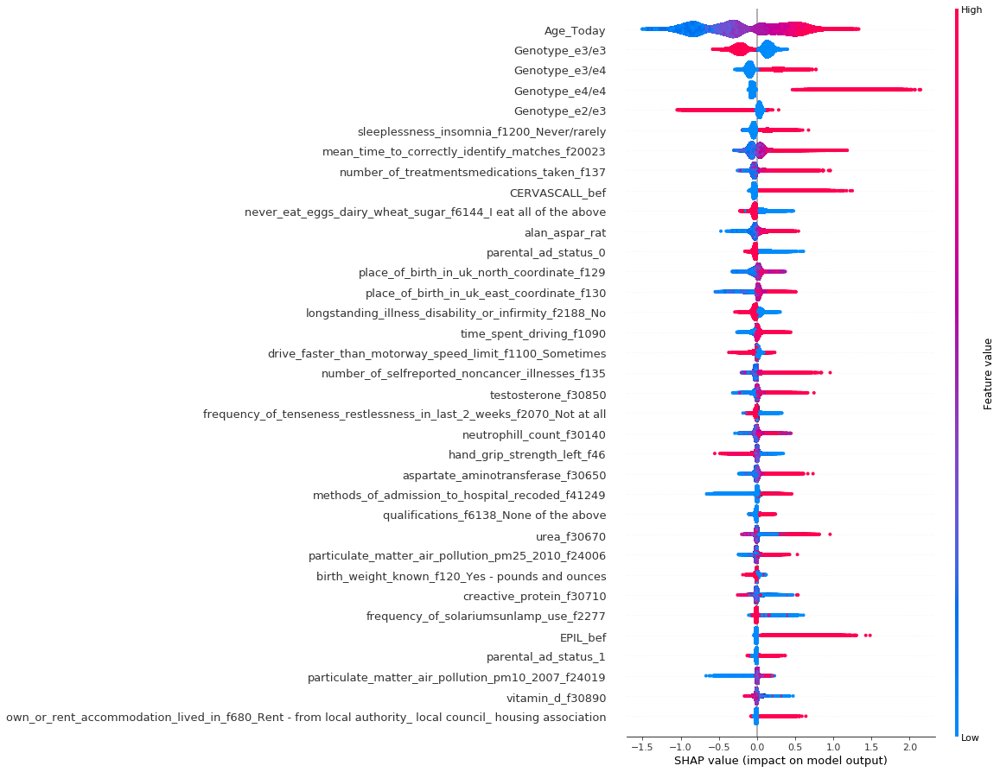

SHAP summary bar plot for selected feature number


invalid value encountered in true_divide
invalid value encountered in true_divide


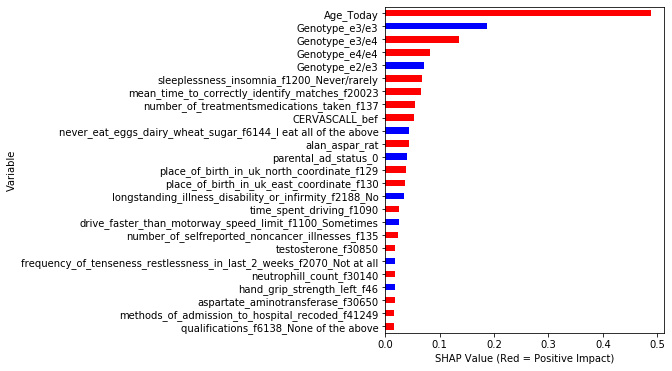

SHAP summary dot plot for 35 features


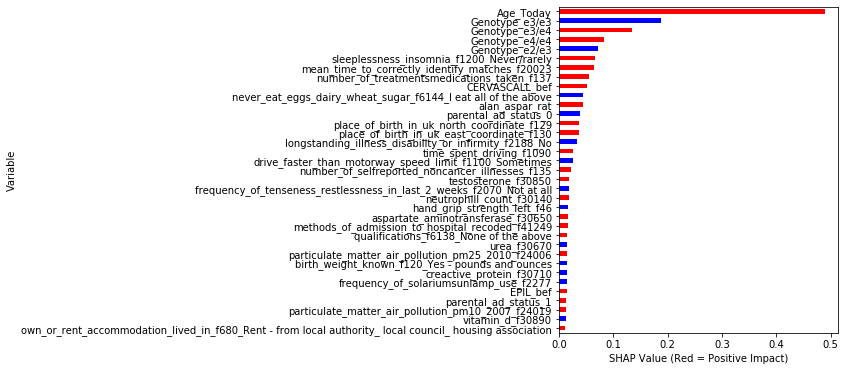

In [125]:
dropvars_full=varstodrop(AD_model_full_mod,drpvars1,drvarsdef)
shapsum_nonrebal=newmodelrun(AD_model_full_mod,dropvars=dropvars_full,model=mod_xgb,depvar='AD',
                    reps=25,splits=3,rebalance=0,max_display=25,plot_type="dot")

iteration: 0
iteration: 2
iteration: 3
iteration: 4
iteration: 5
iteration: 6
iteration: 7
iteration: 8
iteration: 9
Accuracy : 0.9903
666.0
AUC Score (Train): 0.807343


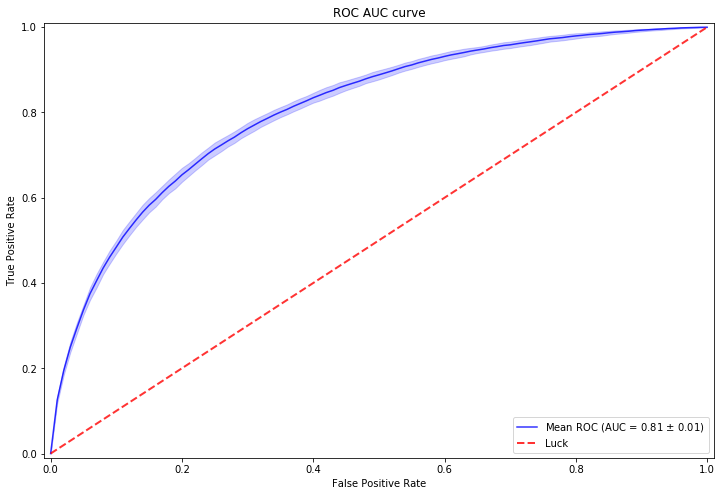

SHAP summary dot plot for selected feature number


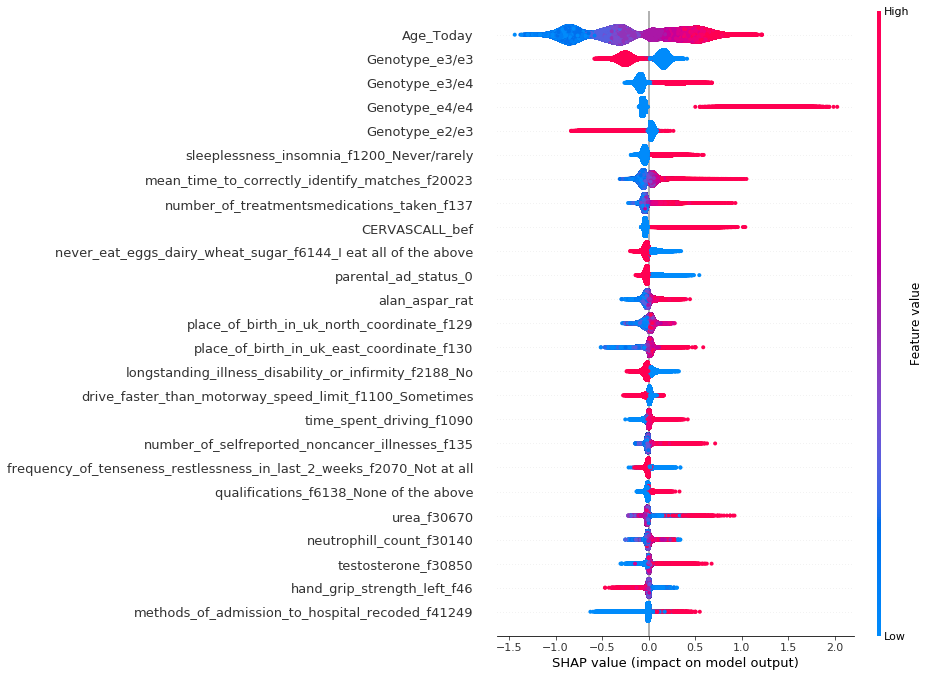

SHAP summary dot plot for 35 features


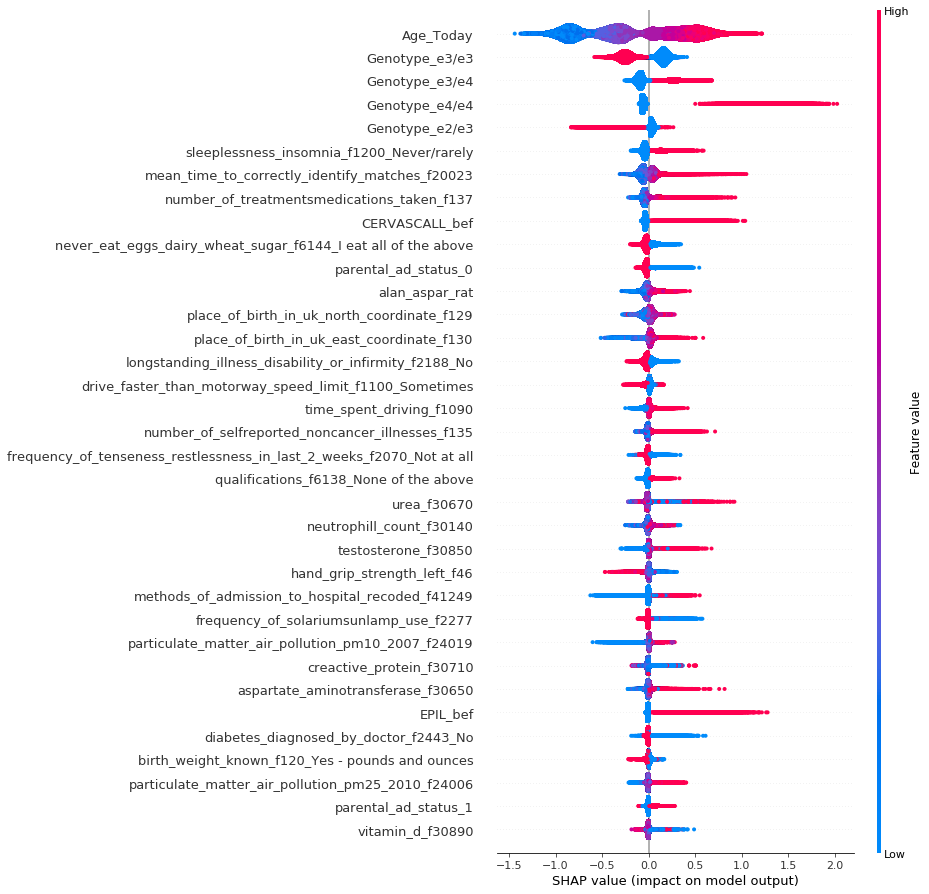

SHAP summary bar plot for selected feature number


invalid value encountered in true_divide
invalid value encountered in true_divide


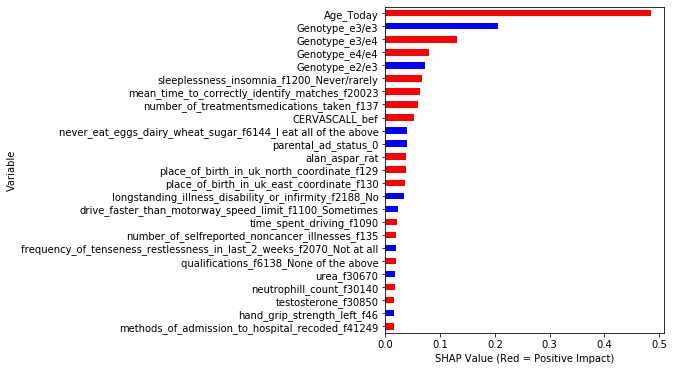

SHAP summary dot plot for 35 features


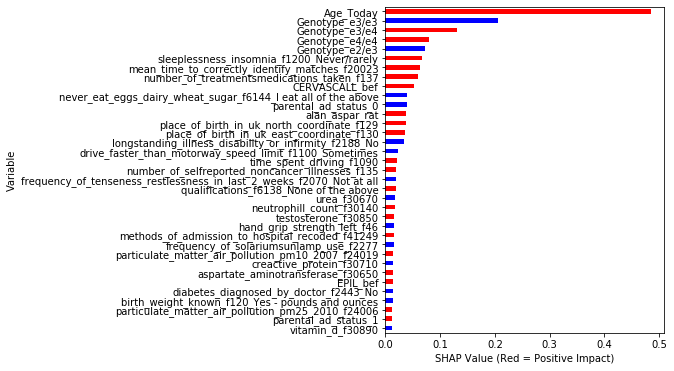

In [33]:
dropvars_full=varstodrop(AD_model_full_mod,drpvars1,drvarsdef)
shapsum_nonrebal=newmodelrun(AD_model_full_mod,dropvars=dropvars_full,model=mod_xgb,depvar='AD',
                    reps=10,splits=3,rebalance=0,max_display=25,plot_type="dot")

iteration: 0
iteration: 1
iteration: 2
iteration: 3
iteration: 4
iteration: 5
iteration: 6
iteration: 8
iteration: 9
Accuracy : 0.9904
1.0
AUC Score (Train): 0.802582


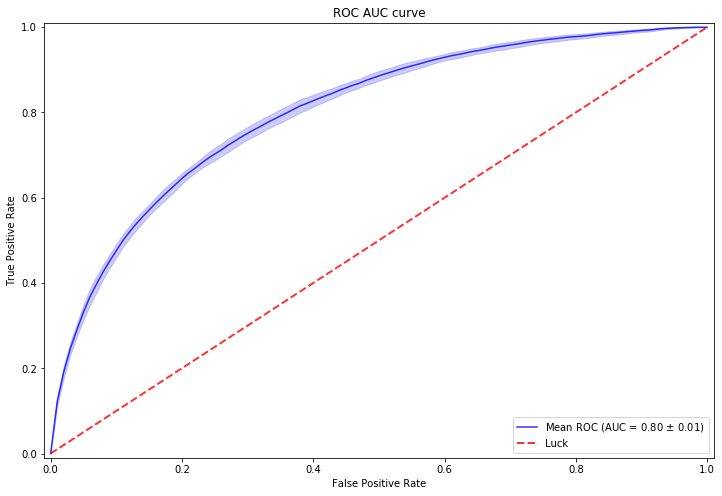

SHAP summary dot plot for selected feature number


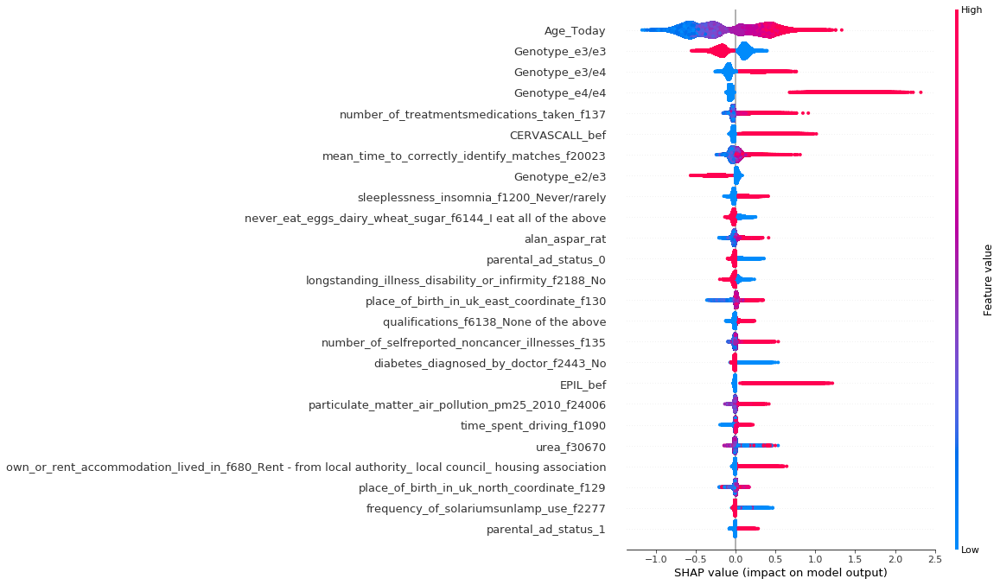

SHAP summary dot plot for 35 features


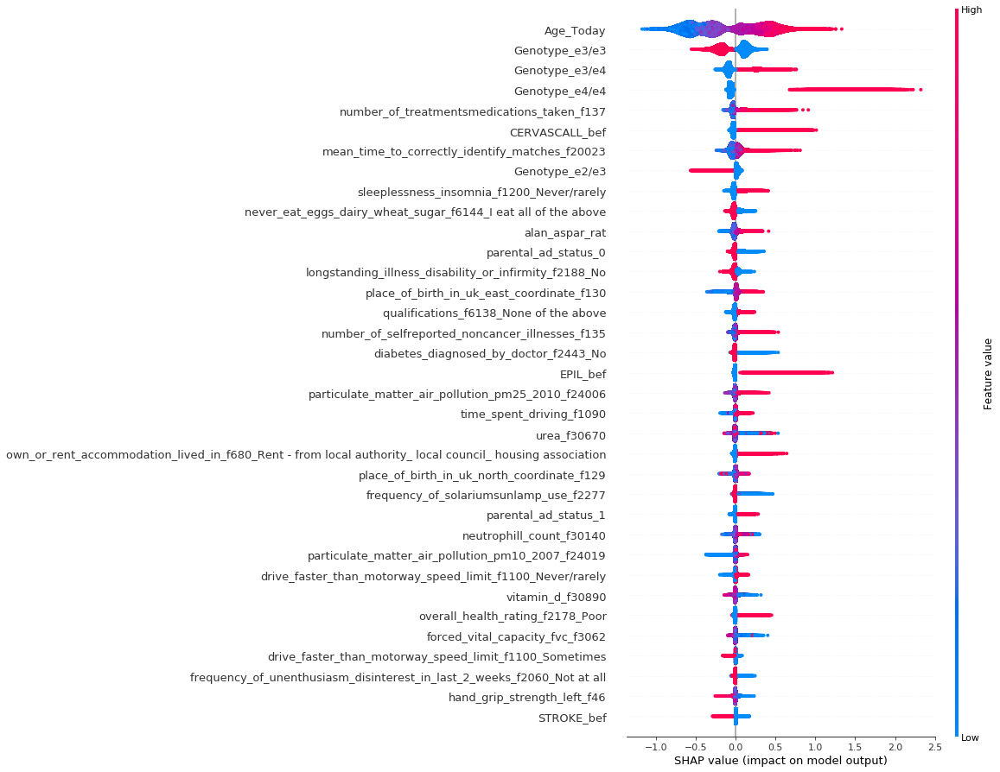

SHAP summary bar plot for selected feature number


invalid value encountered in true_divide
invalid value encountered in true_divide


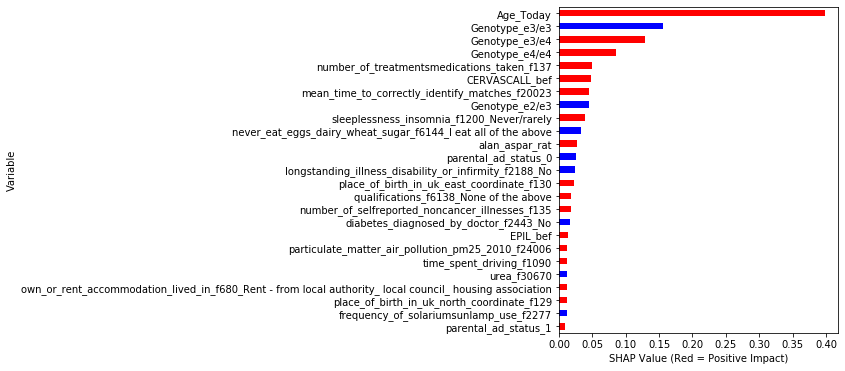

SHAP summary dot plot for 35 features


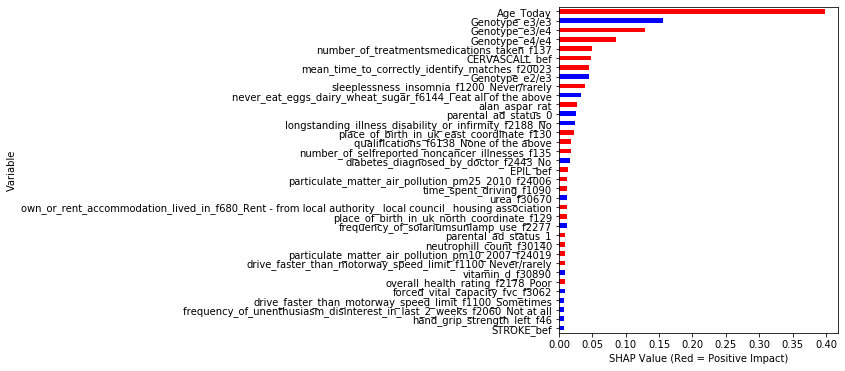

In [16]:
dropvars_full=varstodrop(AD_model_full_mod,drpvars1,drvarsdef)
shapsum_nonrebal=newmodelrun(AD_model_full_mod,dropvars=dropvars_full,model=mod_xgb,depvar='AD',
                    reps=10,splits=3,rebalance=0,max_display=25,plot_type="dot")

In [43]:
modfull=mod_xgb.fit(AD_model_full_mod.drop(columns=dropvars_full),AD_model_full_mod['AD'])
AD_model_full_preds=AD_model_full_mod.copy()
AD_model_full_preds['risk_score']=modfull.predict_proba(AD_model_full_mod.drop(columns=dropvars_full))[:, 1].tolist()

In [46]:
AD_model_full_preds[['eid','risk_score']].to_csv('%s%s' % (path,'AD_model_full_risk_scores.csv'))

In [61]:

def shapcutoff(df,perc=0.75):
    df2=df.copy()
    shapperc=df2['mean_shap_imp'].sum()*perc
    df2['cum_shap']=df2['mean_shap_imp'].cumsum()
    mask_perc_shap=(df2['cum_shap']<shapperc)
    print(df2[mask_perc_shap].shape[0])
    return df2[mask_perc_shap]

In [62]:
shapcutoff(non_apoefeat,perc=0.75)

#non_apoefeat

NameError: name 'non_apoefeat' is not defined

In [69]:
shap90perc=shapsum_nonrebal['mean_shap_imp'].sum()*0.75
shapsum_nonrebal['cum_shap']=shapsum_nonrebal['mean_shap_imp'].cumsum()
mask_90pshap=(shapsum_nonrebal['cum_shap']<shap90perc)
shapsum_nonrebal[mask_90pshap].shape[0]

37

iteration: 0



Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#deprecate-loc-reindex-listlike


iteration: 1
iteration: 2
iteration: 3
iteration: 4
iteration: 5
iteration: 6
iteration: 7
iteration: 8
iteration: 9
iteration: 10
iteration: 11
iteration: 12
iteration: 13
iteration: 14
iteration: 15
iteration: 16
iteration: 17
iteration: 18
iteration: 19
iteration: 20
iteration: 21
iteration: 22
iteration: 23
iteration: 24
iteration: 25
iteration: 26
iteration: 27
iteration: 28
iteration: 29
iteration: 30
iteration: 31
iteration: 32
iteration: 33
iteration: 34
iteration: 35
iteration: 36
iteration: 37
iteration: 54
iteration: 55
iteration: 56
iteration: 57
iteration: 58
iteration: 59
iteration: 60
iteration: 61
iteration: 62
iteration: 63
iteration: 64
iteration: 65
iteration: 66
iteration: 67
iteration: 68
iteration: 69
iteration: 70
iteration: 71
iteration: 72
iteration: 73
iteration: 74
iteration: 75
iteration: 76
iteration: 77
iteration: 78
iteration: 79
iteration: 80
iteration: 81
iteration: 82
iteration: 83
iteration: 84
iteration: 85
iteration: 86
iteration: 87
iteration: 88
i

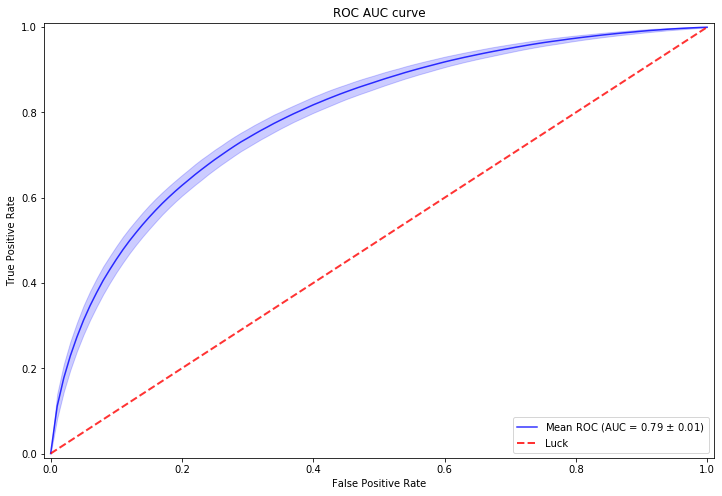

SHAP summary dot plot for selected feature number


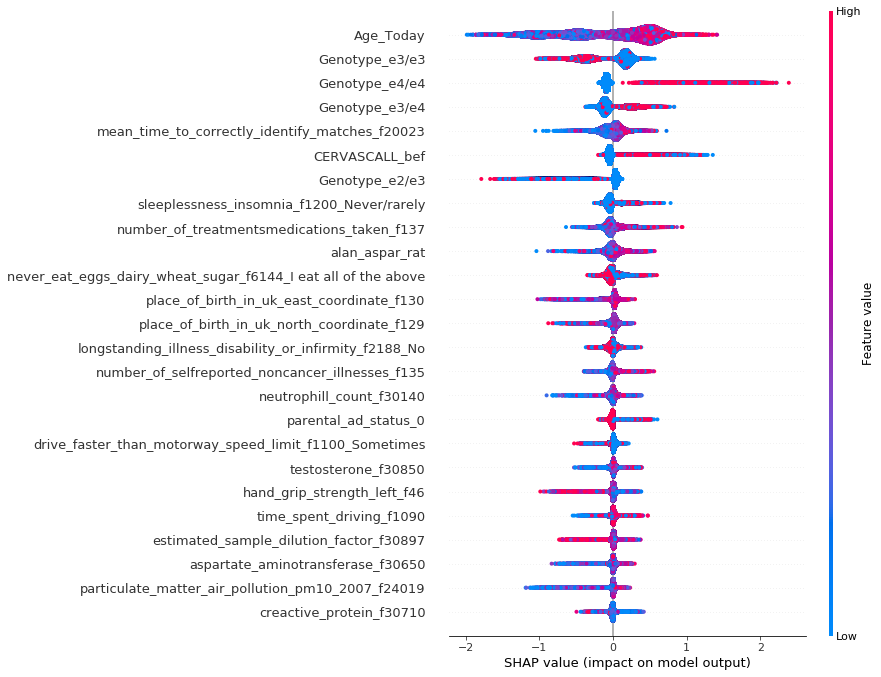

SHAP summary dot plot for 35 features


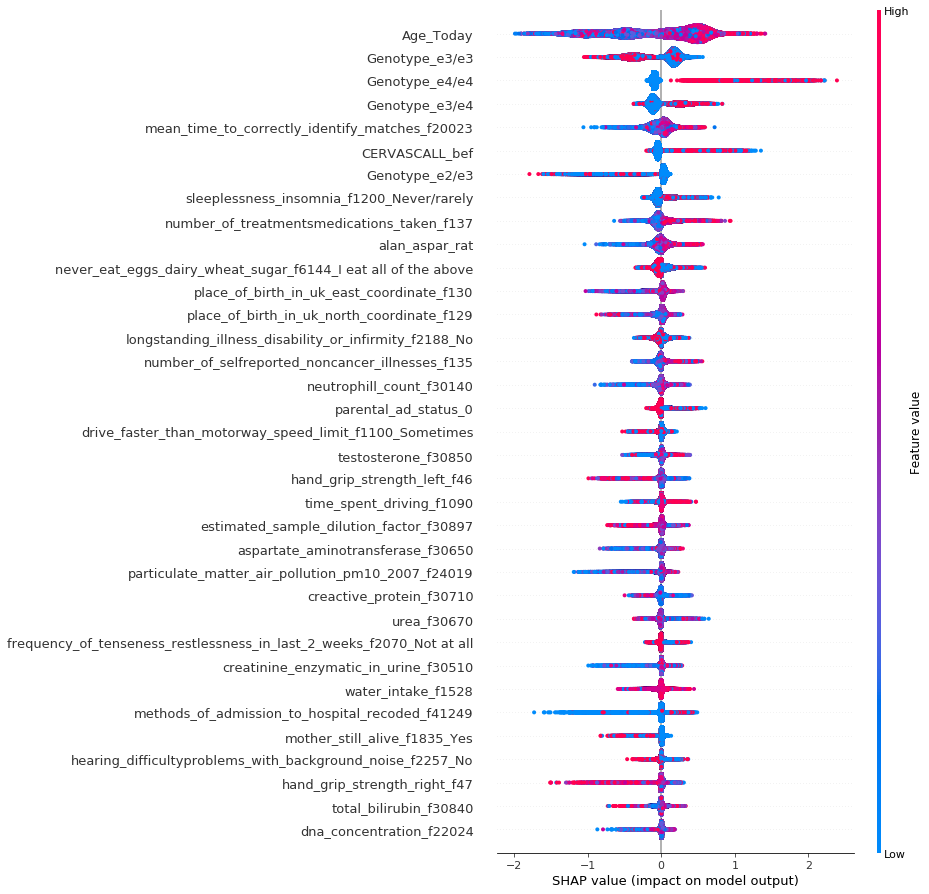

SHAP summary bar plot for selected feature number


invalid value encountered in true_divide
invalid value encountered in true_divide


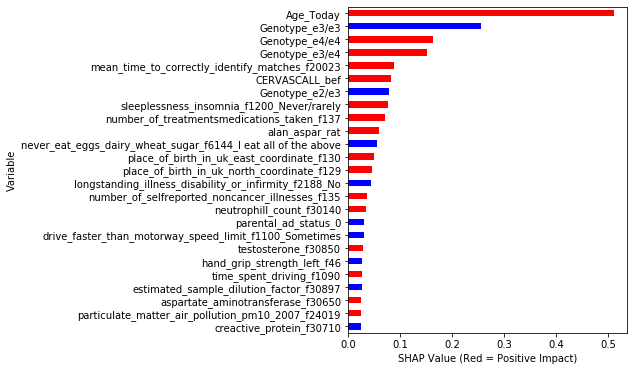

SHAP summary dot plot for 35 features


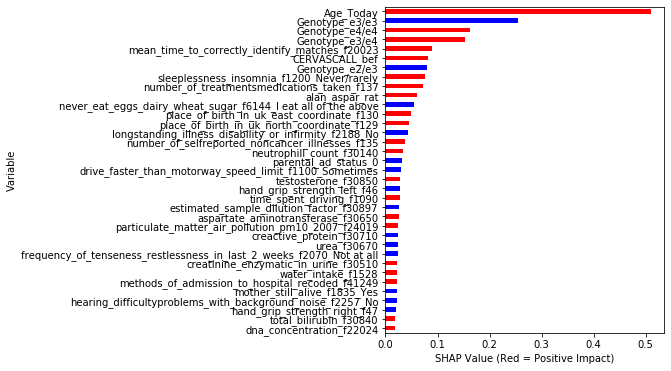

In [126]:
dropvars_full=varstodrop(AD_model_full_mod,drpvars1,drvarsdef)
shapsum_rebal=newmodelrun(AD_model_full_mod,dropvars=dropvars_full,model=mod_xgb,depvar='AD',
                    reps=200,splits=3,rebalance=1,max_display=25,plot_type="dot")

In [13]:
shapsum_rebal.to_csv("shapsum_rebal.csv")
shapsum_rebal=pd.read_csv("shapsum_rebal.csv")

In [ ]:
shapsum_fullmod=newmodelrun(AD_model_full,dropvars=dropvars_full,model=mod_xgb,depvar='AD',reps=5,splits=3,rebalance=0)
#

In [ ]:
shapsum_fullmod.head()

In [7]:
#shapsum.to_csv("shapsum.csv")
shapsum=pd.read_csv("shapsum.csv")

In [8]:
shapsum.head(10)

,Unnamed: 0,column_name,mean_shap_imp,std_shap_imp,min_rank,max_rank,mean_rank,median_rank,std_rank
0,0,Age_Today,0.358989,0.007956,0,0,0.00,0,0.000000
1,9,Genotype_e3/e3,0.163161,0.011091,1,2,1.08,1,0.276887
2,10,Genotype_e3/e4,0.138316,0.008254,1,2,1.92,2,0.276887
3,11,Genotype_e4/e4,0.085373,0.003112,3,3,3.00,3,0.000000
4,734,number_of_treatmentsmedications_taken_f137,0.055377,0.008601,4,9,5.32,5,1.405940
5,611,mean_time_to_correctly_identify_matches_f20023,0.054197,0.010974,4,10,5.80,6,1.755942
6,7,Genotype_e2/e3,0.049633,0.005148,4,10,6.60,7,1.732051
7,2,CERVASCALL_bef,0.047005,0.005479,4,10,6.96,7,1.593738
8,944,sleeplessness_insomnia_f1200_Never/rarely,0.046918,0.009784,4,10,6.92,7,1.998333
9,693,never_eat_eggs_dairy_wheat_sugar_f6144_I eat a...,0.038510,0.007695,6,12,8.96,9,1.428286


In [67]:
cols=np.append(shapsum_rebal['column_name'].head(100),'AD')

AD_modelanalyse=AD_model_full[cols]
AD_modelanalyse['Genotype']='Non APOE4'
AD_modelanalyse['Genotype'][apoemask]='APOE4'
AD_modelanalyse.to_csv('AD_model_full_shap.csv')


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [10]:
AD_model_full['eid']

0         1000014
1         1000030
2         1000041
3         1000113
4         1000146
           ...   
209109    6024577
209110    6024709
209111    6024800
209112    6024875
209113    6024904
Name: eid, Length: 209114, dtype: object

In [35]:
#AD_model_feat=newfeats(AD_model_full,shapsum_rebal)
AD_model_full['eid']=AD_model_full['eid'].astype(int)
apoemask=(AD_model_full['Genotype_e3/e4']==1)|(AD_model_full['Genotype_e4/e4']==1)|\
(AD_model_full['Genotype_e2/e4']==1)|(AD_model_full['Genotype_e1/e4']==1)

non_apoemask=(AD_model_full['Genotype_e2/e3']==1)|(AD_model_full['Genotype_e3/e3']==1)|\
(AD_model_full['Genotype_e1/e2']==1)|(AD_model_full['Genotype_e2/e2']==1)

APOE_model_feat=newfeats(AD_model_full[apoemask],shapsum_rebal,feats=50)
nonAPOE_model_feat=newfeats(AD_model_full[non_apoemask],shapsum_rebal,feats=50)

genos2=[

 'Genotype_e2/e3',
 'Genotype_e3/e3',
 'Genotype_e3/e4',
 'Genotype_e4/e4']

'''
int_var_set=['sleeplessness_insomnia_f1200_Never/rarely','CERVASCALL_bef',
             'mean_time_to_correctly_identify_matches_f20023',
            'number_of_treatmentsmedications_taken_f137','particulate_matter_air_pollution_pm25_2010_f24006',
            'time_spent_using_computer_f1080']

for var_1 in int_var_set:
    AD_model_full_ints=int_vars(AD_model_feat,var_1,vars=genos2)

print("Interaction variables")
shapsumfeat=newmodelrun(AD_model_full_ints,dropvars=['eid','AD','Genotype_e2/e3','Genotype_e3/e3','Genotype_e3/e4',\
'Genotype_e4/e4'],model=mod_xgb,depvar='AD',reps=5,splits=2,rebalance=1)
'''



NameError: name 'shapsum_rebal' is not defined

APOE model on selected features
iteration: 0
iteration: 1
iteration: 2
iteration: 3
iteration: 4
iteration: 5
iteration: 6
iteration: 7
iteration: 8
iteration: 9
iteration: 10
iteration: 11
iteration: 12
iteration: 13
iteration: 14
iteration: 15
iteration: 16
iteration: 17
iteration: 18
iteration: 19
iteration: 20
iteration: 21
iteration: 22
iteration: 23
iteration: 24
iteration: 25
iteration: 26
iteration: 27
iteration: 28
iteration: 29
iteration: 30
iteration: 31
iteration: 32
iteration: 33
iteration: 34
iteration: 35
iteration: 36
iteration: 37
iteration: 38
iteration: 39
iteration: 40
iteration: 41
iteration: 42
iteration: 43
iteration: 44
iteration: 45
iteration: 46
iteration: 47
iteration: 48
iteration: 49
iteration: 50
iteration: 51
iteration: 52
iteration: 53
iteration: 54
iteration: 55
iteration: 56
iteration: 57
iteration: 58
iteration: 59
iteration: 60
iteration: 61
iteration: 62
iteration: 63
iteration: 64
iteration: 65
iteration: 66
iteration: 67
iteration: 68
iteration: 6

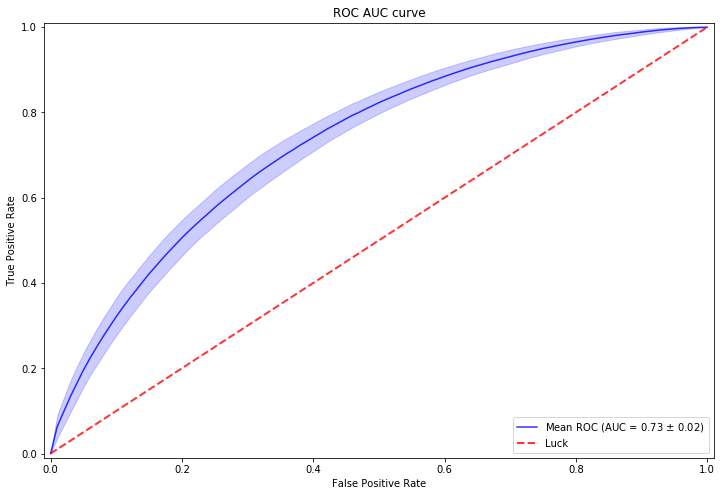

SHAP summary dot plot for selected feature number


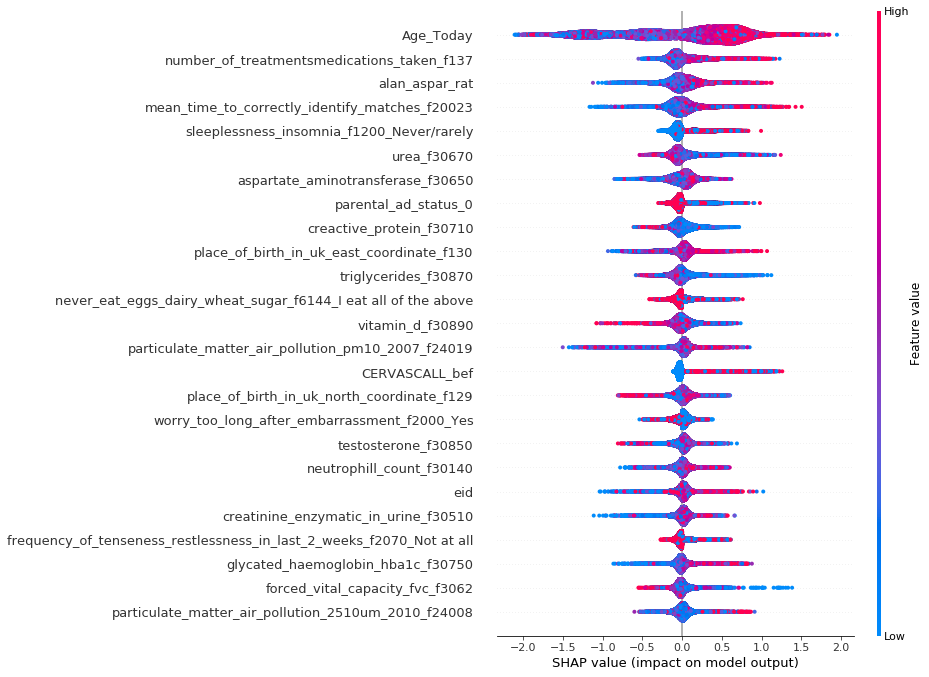

SHAP summary dot plot for 35 features


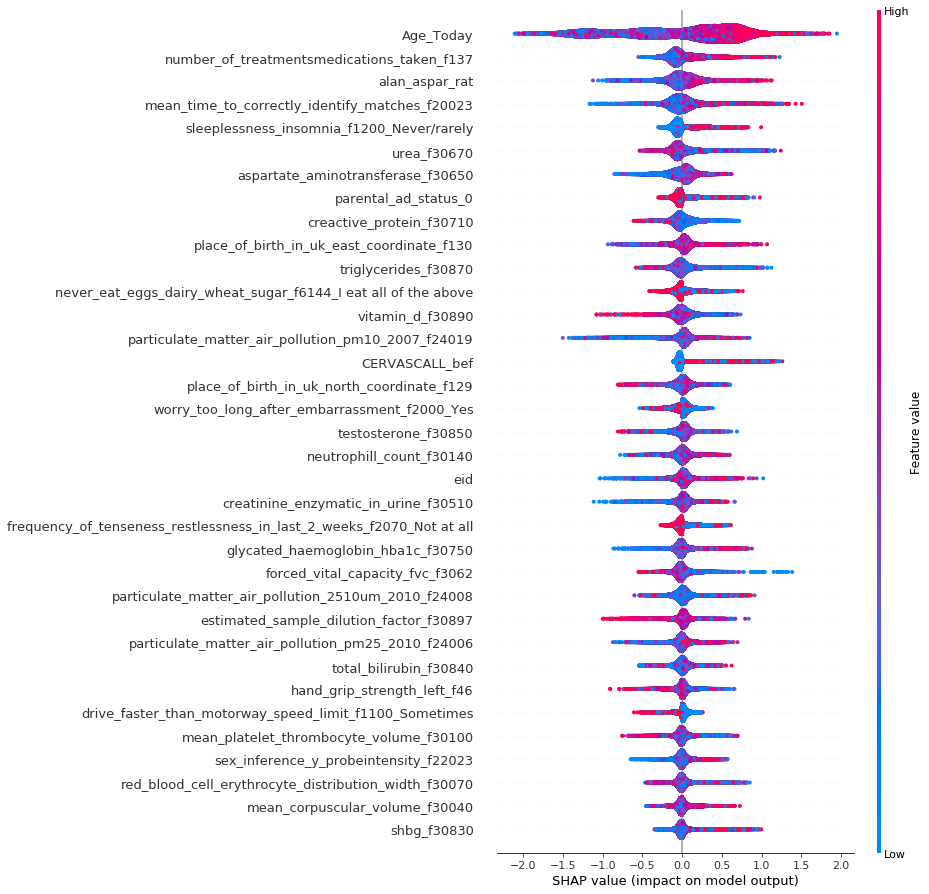

SHAP summary bar plot for selected feature number


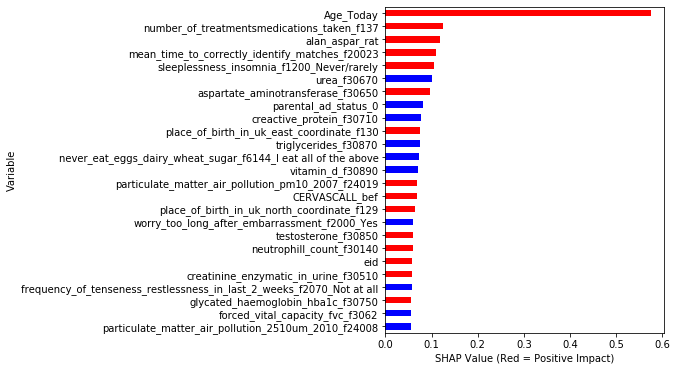

SHAP summary dot plot for 35 features


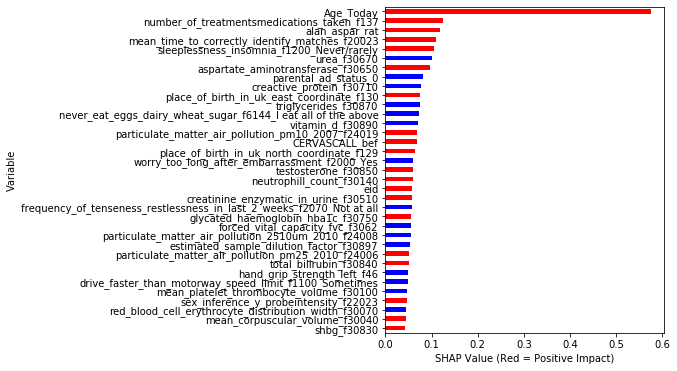

In [92]:
print("APOE model on selected features")

apoefeat=newmodelrun(APOE_model_feat,dropvars=['AD','Genotype_e2/e3','Genotype_e3/e3','Genotype_e3/e4',\
'Genotype_e4/e4'],model=mod_xgb,depvar='AD',reps=200,splits=3,rebalance=1,max_display=25)


In [34]:
print("non APOE model on selected features")

non_apoefeat=newmodelrun(nonAPOE_model_feat,dropvars=['AD','Genotype_e2/e3','Genotype_e3/e3','Genotype_e3/e4',\
'Genotype_e4/e4'],model=mod_xgb,depvar='AD',reps=200,splits=2,rebalance=1,max_display=25)


non APOE model on selected features


NameError: name 'nonAPOE_model_feat' is not defined

In [ ]:
APOE_model_feat_full=newfeats(AD_model_full[apoemask],shapsum_rebal,feats=max)
nonAPOE_model_feat_full=newfeats(AD_model_full[non_apoemask],shapsum_rebal,feats=max)


In [ ]:
print("APOE model on all features")

apoefeat_full=newmodelrun(APOE_model_feat_full,dropvars=['AD','Genotype_e2/e3','Genotype_e3/e3','Genotype_e3/e4',\
'Genotype_e4/e4'],model=mod_xgb,depvar='AD',reps=5,splits=3,rebalance=1,max_display=25)


In [ ]:
print("non APOE model on all features")

non_apoefeat_full=newmodelrun(nonAPOE_model_feat_full,dropvars=['AD','Genotype_e2/e3','Genotype_e3/e3','Genotype_e3/e4',\
'Genotype_e4/e4'],model=mod_xgb,depvar='AD',reps=5,splits=3,rebalance=1,max_display=25)


In [17]:
APOE_model_feat_norebal=newfeats(AD_model_full[apoemask],shapsum_nonrebal,feats=50)
nonAPOE_model_feat_norebal=newfeats(AD_model_full[non_apoemask],shapsum_nonrebal,feats=50)


APOE model on selected features
iteration: 0



Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#deprecate-loc-reindex-listlike


iteration: 1
iteration: 2
iteration: 3
iteration: 4
iteration: 5
iteration: 6
iteration: 7
iteration: 8
iteration: 9
iteration: 10
iteration: 11
iteration: 12
iteration: 13
iteration: 14
iteration: 15
iteration: 16
iteration: 17
iteration: 18
iteration: 19
iteration: 20
iteration: 21
iteration: 22
iteration: 23
iteration: 24
iteration: 25
iteration: 26
iteration: 27
iteration: 28
iteration: 29
iteration: 30
iteration: 31
iteration: 32
iteration: 33
iteration: 34
iteration: 35
iteration: 36
iteration: 37
iteration: 38
iteration: 39
iteration: 40
iteration: 41
iteration: 42
iteration: 43
iteration: 44
iteration: 45
iteration: 46
iteration: 47
iteration: 48
iteration: 49
Accuracy : 0.675
52628.0
AUC Score (Train): 0.736772


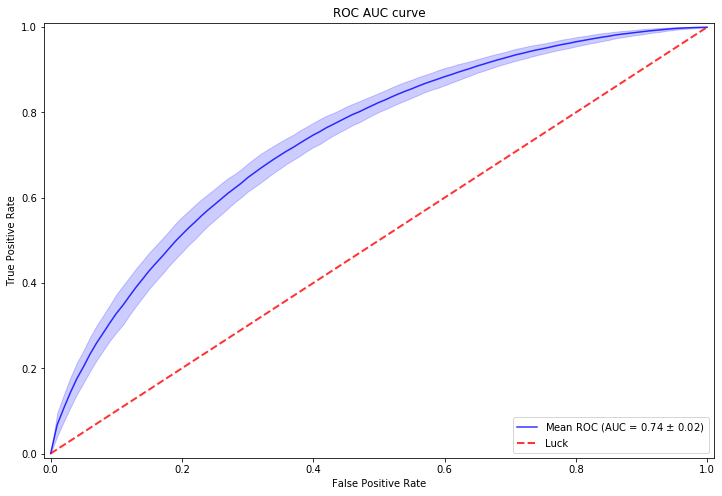

SHAP summary dot plot for selected feature number


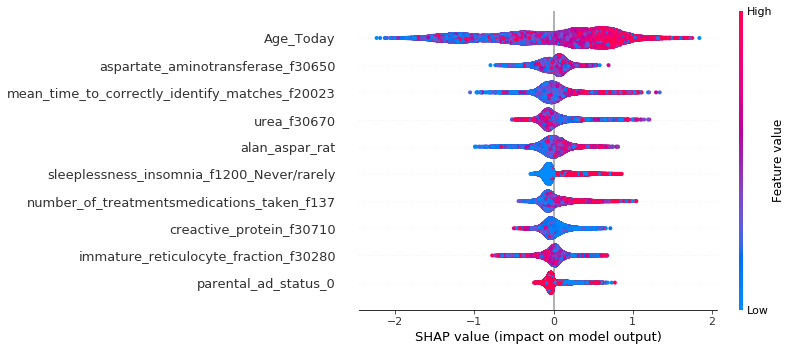

SHAP summary dot plot for 35 features


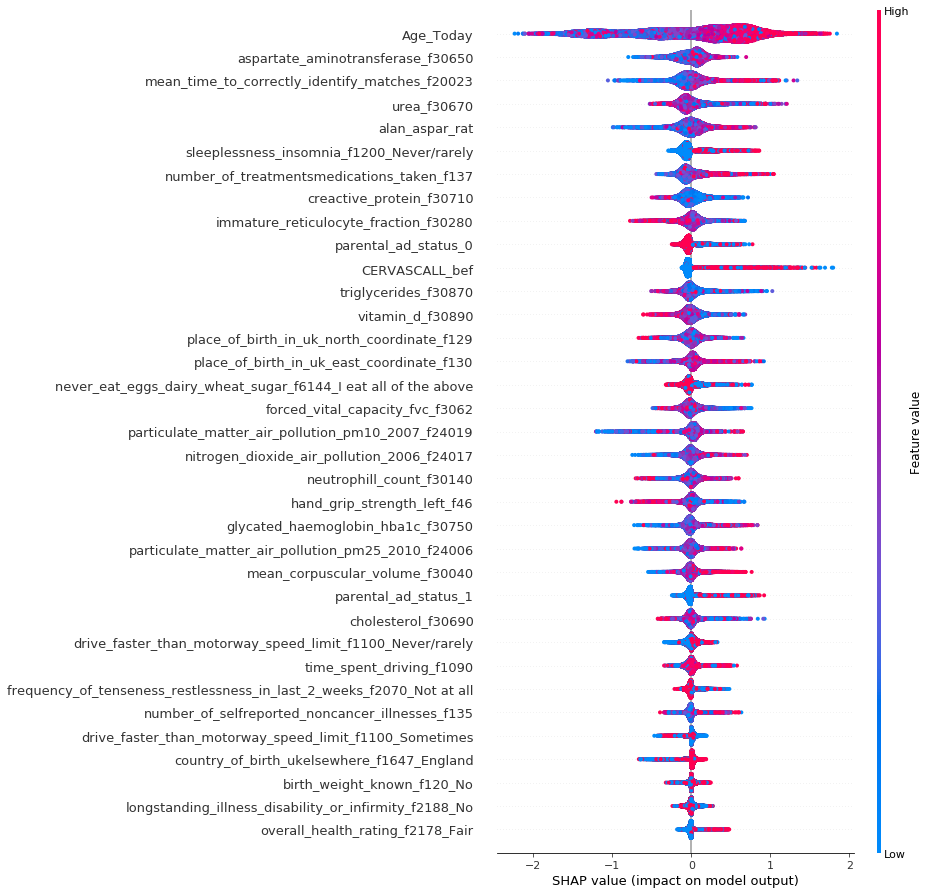

SHAP summary bar plot for selected feature number


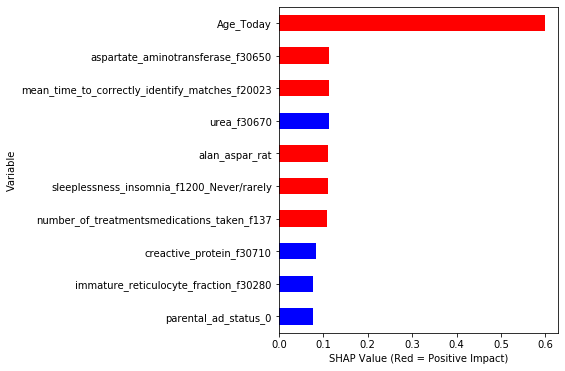

SHAP summary dot plot for 35 features


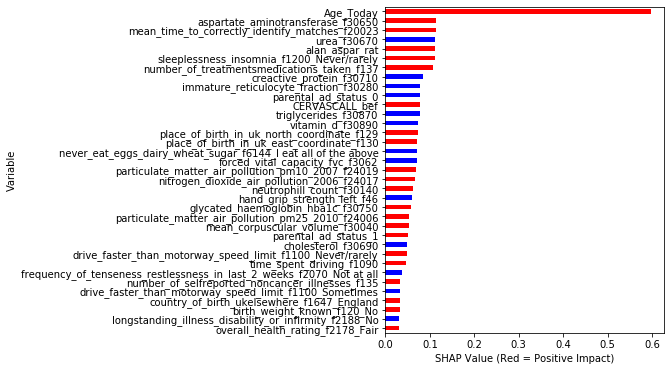

non APOE model on selected features
iteration: 0



Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#deprecate-loc-reindex-listlike


iteration: 1
iteration: 2
iteration: 3
iteration: 4
iteration: 5
iteration: 6
iteration: 7
iteration: 8
iteration: 9
iteration: 10
iteration: 11
iteration: 12
iteration: 13
iteration: 14
iteration: 15
iteration: 16
iteration: 17
iteration: 18
iteration: 19
iteration: 20
iteration: 21
iteration: 22
iteration: 23
iteration: 24
iteration: 25
iteration: 26
iteration: 27
iteration: 28
iteration: 29
iteration: 30
iteration: 31
iteration: 32
iteration: 33
iteration: 34
iteration: 35
iteration: 36
iteration: 37
iteration: 38
iteration: 39
iteration: 40
iteration: 41
iteration: 42
iteration: 43
iteration: 44
iteration: 45
iteration: 46
iteration: 47
iteration: 48
iteration: 49
Accuracy : 0.6604
29717.0
AUC Score (Train): 0.720399


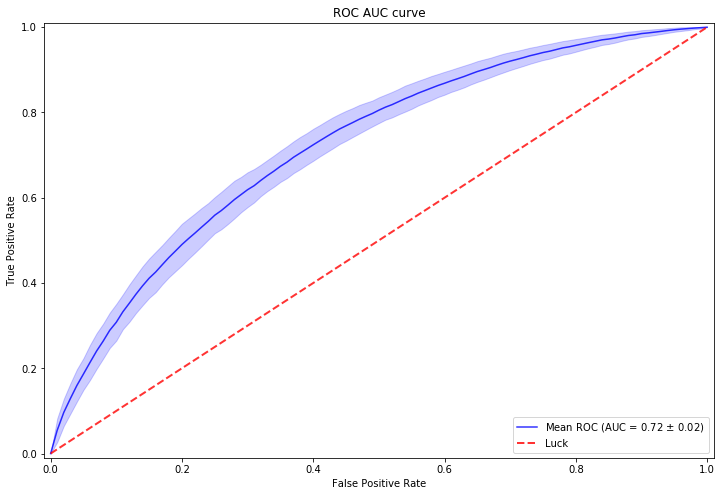

SHAP summary dot plot for selected feature number


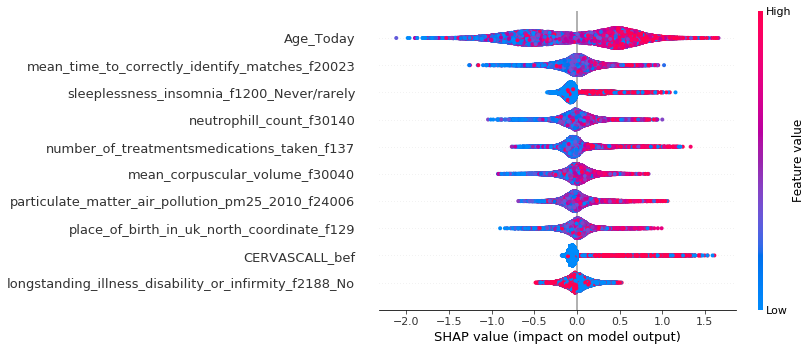

SHAP summary dot plot for 35 features


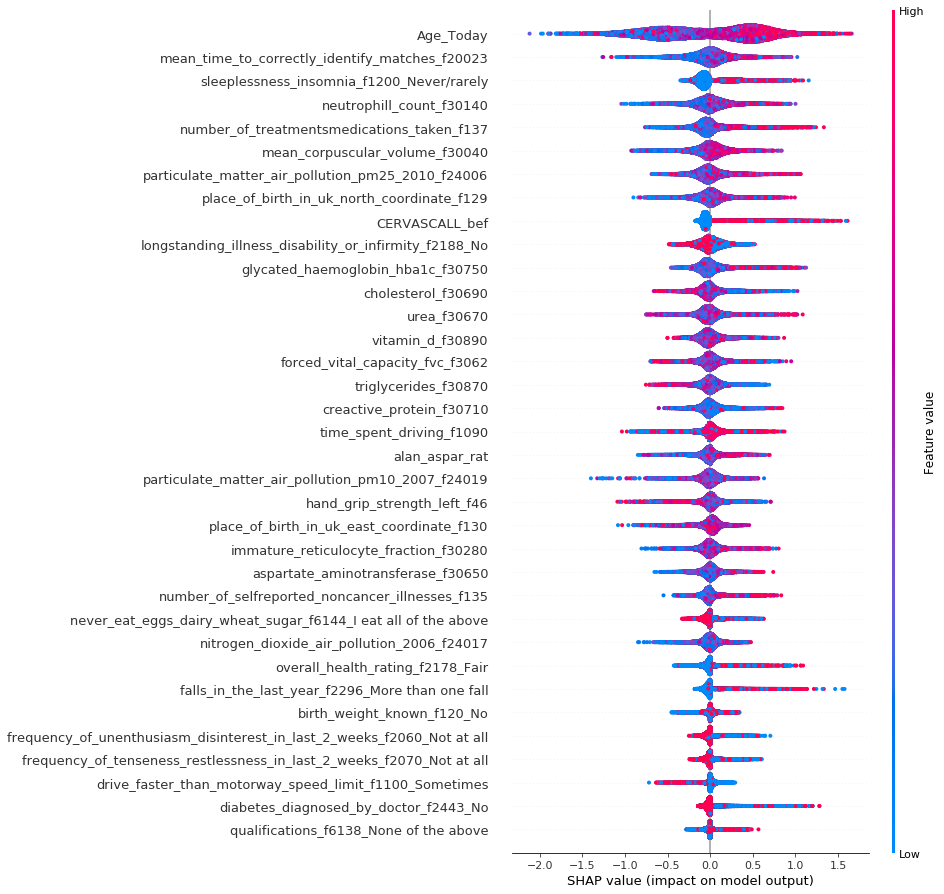

SHAP summary bar plot for selected feature number


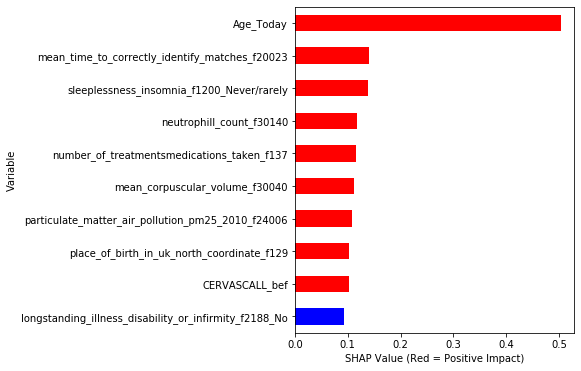

SHAP summary dot plot for 35 features


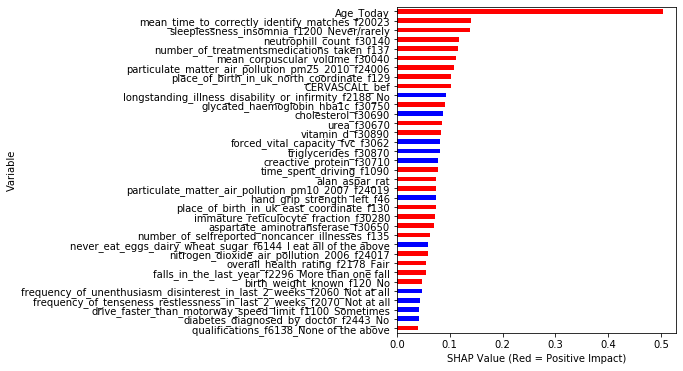

In [23]:
print("APOE model on selected features")

apoefeat=newmodelrun(APOE_model_feat_norebal,dropvars=['eid','AD','Genotype_e2/e3','Genotype_e3/e3','Genotype_e3/e4',\
'Genotype_e4/e4'],model=mod_xgb,depvar='AD',reps=50,splits=3,rebalance=1,max_display=10)

print("non APOE model on selected features")

non_apoefeat=newmodelrun(nonAPOE_model_feat_norebal,dropvars=['eid','AD','Genotype_e2/e3','Genotype_e3/e3','Genotype_e3/e4',\
'Genotype_e4/e4'],model=mod_xgb,depvar='AD',reps=50,splits=2,rebalance=1,max_display=10)


In [25]:
non_apoefeat['column_name'].head(10)

0                                             Age_Today
24       mean_time_to_correctly_identify_matches_f20023
41            sleeplessness_insomnia_f1200_Never/rarely
25                             neutrophill_count_f30140
30           number_of_treatmentsmedications_taken_f137
23                       mean_corpuscular_volume_f30040
37    particulate_matter_air_pollution_pm25_2010_f24006
1                                        CERVASCALL_bef
39           place_of_birth_in_uk_north_coordinate_f129
22    longstanding_illness_disability_or_infirmity_f...
Name: column_name, dtype: object

48
43


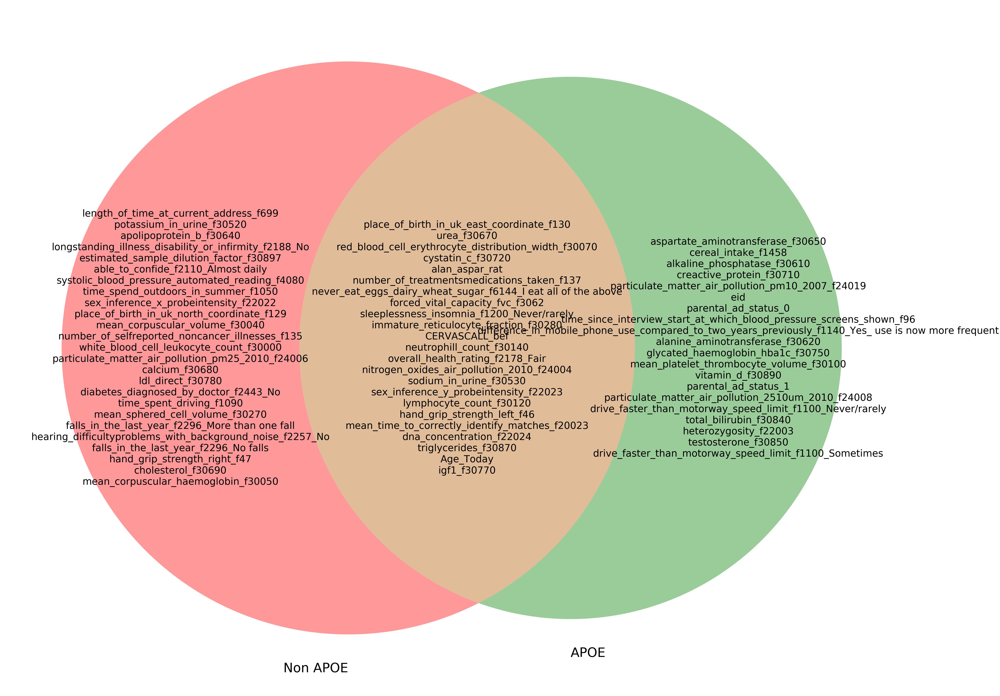

In [89]:
import matplotlib.pyplot as plt
from matplotlib_venn import venn2

set1 = set(shapcutoff(non_apoefeat,0.5)['column_name'])
set2 = set(shapcutoff(apoefeat,0.5)['column_name'])

#set3 = set(['C', 'D',' E', 'F', 'G'])
plt.figure(figsize=(100,100))
venn1 = venn2([set1, set2], ('Non APOE', 'APOE'))


venn1.get_label_by_id('100').set_fontsize(60)
venn1.get_label_by_id('110').set_fontsize(60)
venn1.get_label_by_id('010').set_fontsize(60)

venn1.get_label_by_id('100').set_text('\n'.join(set1-set2))
venn1.get_label_by_id('110').set_text('\n'.join(set1&set2))
venn1.get_label_by_id('010').set_text('\n'.join(set2-set1))

for t in venn1.set_labels: t.set_fontsize(80)
    

plt.show()

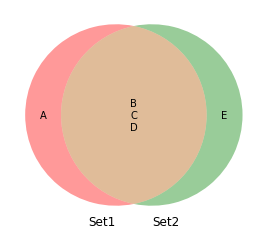

In [52]:
import matplotlib.pyplot as plt
from matplotlib_venn import venn2

set1 = set(['A', 'B', 'C', 'D'])
set2 = set(['B', 'C', 'D', 'E'])
#set3 = set(['C', 'D',' E', 'F', 'G'])

venn1 = venn2([set1, set2], ('Set1', 'Set2'))

venn1.get_label_by_id('100').set_text('\n'.join(set1-set2))
venn1.get_label_by_id('110').set_text('\n'.join(set1&set2))
venn1.get_label_by_id('010').set_text('\n'.join(set2-set1))

plt.show()


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#deprecate-loc-reindex-listlike


Accuracy : 0.678
79418.0
AUC Score (Train): 0.738724


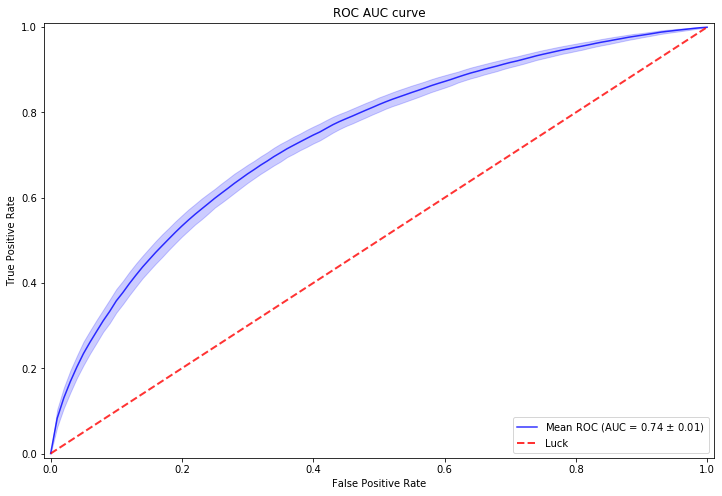

SHAP summary dot plot for selected feature number


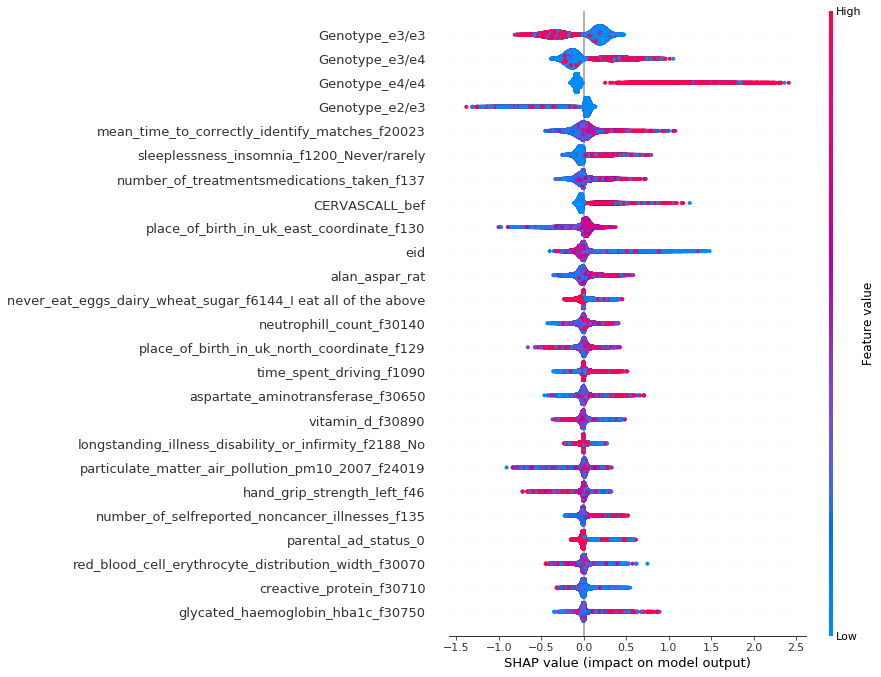

SHAP summary dot plot for 35 features


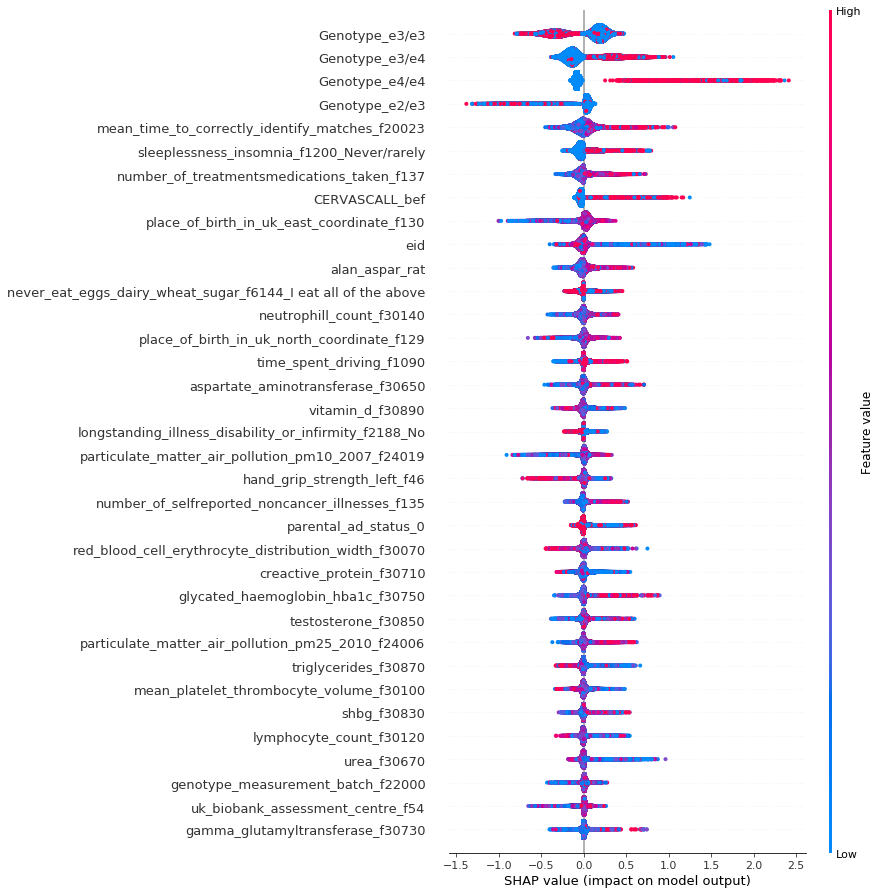

SHAP summary bar plot for selected feature number


invalid value encountered in true_divide
invalid value encountered in true_divide


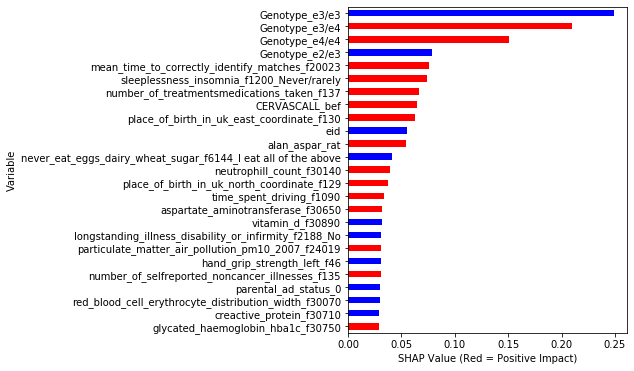

SHAP summary dot plot for 35 features


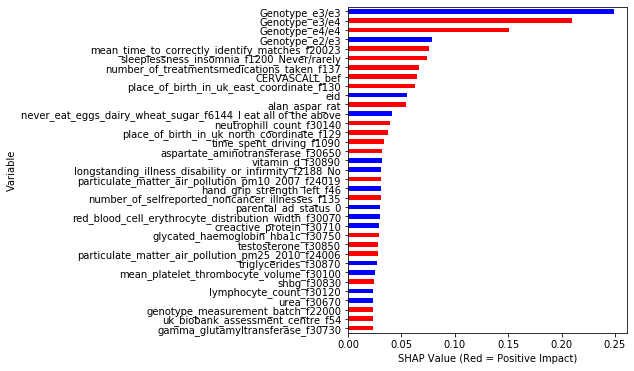

In [82]:
AD_model_age['AD'].value_counts()

dropvars_full=varstodrop(AD_model_age,drpvars1,drvarsdef)
#AD_model_full=replace_genotype(AD_model_full,gen_lkup,genotypes)
AD_model_age=replacenullsmean(AD_model_age)
AD_model_age['alan_aspar_rat']=round((AD_model_age['aspartate_aminotransferase_f30650']\
                                  /AD_model_age['alanine_aminotransferase_f30620']),1)
AD_model_age=col_spec_chars(AD_model_age)
dropvars_full=varstodrop(AD_model_age,drpvars1,drvarsdef)
shapsum_rebal_age=newmodelrun(AD_model_age,dropvars=np.append(dropvars_full,'set'),model=mod_xgb,depvar='AD',
                    reps=2,splits=5,rebalance=0,max_display=25,plot_type="dot")
#

In [46]:
np.asarray(apoefeat['column_name'].head(20))

array(['Age_Today', 'sleeplessness_insomnia_f1200_Never/rarely',
       'number_of_treatmentsmedications_taken_f137',
       'parental_ad_status_0',
       'mean_time_to_correctly_identify_matches_f20023',
       'aspartate_aminotransferase_f30650', 'alan_aspar_rat',
       'urea_f30670', 'creactive_protein_f30710',
       'never_eat_eggs_dairy_wheat_sugar_f6144_I eat all of the above',
       'triglycerides_f30870', 'CERVASCALL_bef',
       'particulate_matter_air_pollution_pm25_2010_f24006',
       'place_of_birth_in_uk_east_coordinate_f130', 'vitamin_d_f30890',
       'drive_faster_than_motorway_speed_limit_f1100_Sometimes',
       'particulate_matter_air_pollution_pm10_2007_f24019',
       'place_of_birth_in_uk_north_coordinate_f129',
       'glycated_haemoglobin_hba1c_f30750',
       'forced_vital_capacity_fvc_f3062'], dtype=object)

In [59]:
import seaborn as sns
for var in np.asarray(apoefeat['column_name'].head(20)):
    if APOE_model_feat[var].dtype=='float64':
        print(var)
        sns.displot(APOE_model_feat, x=var, hue="AD")
        #APOE_model_feat.groupby([var])['AD'].mean().plot(kind='dist')
        plt.show()
        

Age_Today


AttributeError: module 'seaborn' has no attribute 'displot'

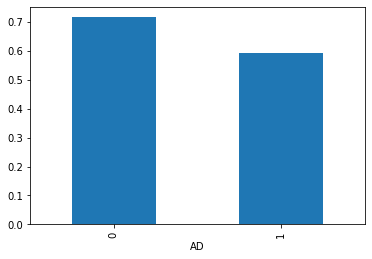

In [51]:
AD_model_full.groupby(['AD'])['never_eat_eggs_dairy_wheat_sugar_f6144_I eat all of the above'].mean().plot(kind='bar')
nonAPOE_model_feat.groupby(['AD'])['alan_aspar_rat'].mean().plot(kind='bar')

Accuracy : 0.9904
0.0
AUC Score (Train): 0.803935


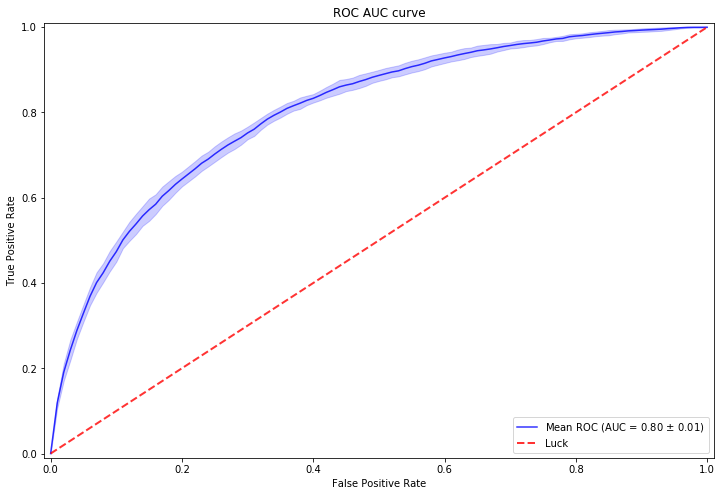

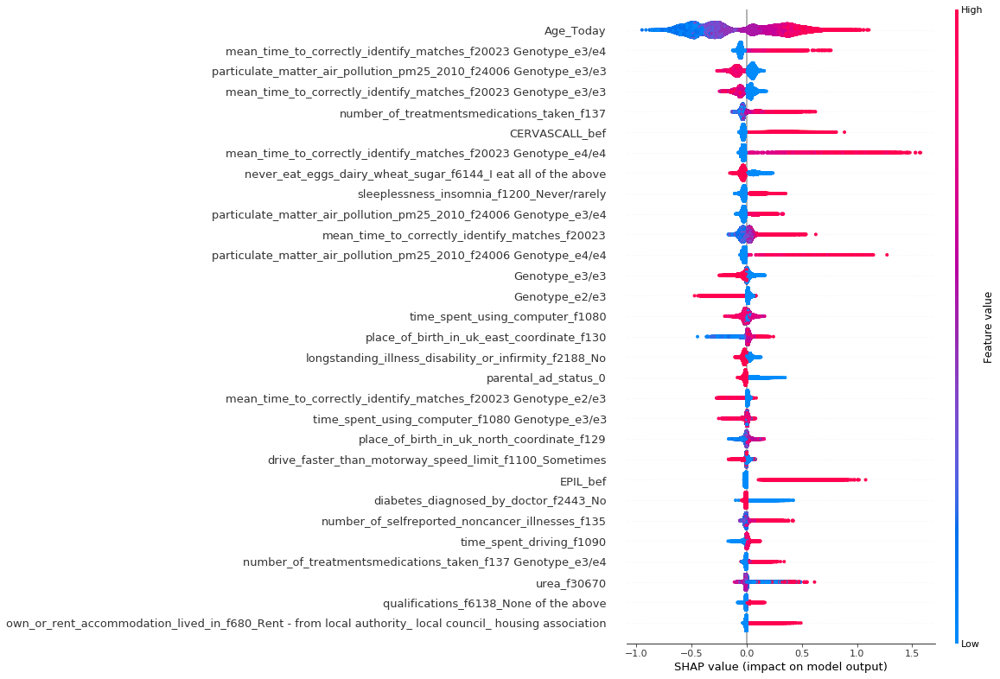

In [13]:
AD_model_full['AD'].value_counts()
dropvars_full=varstodrop(AD_model_full,drpvars1,drvarsdef)
#AD_model_full=replace_genotype(AD_model_full,gen_lkup,genotypes)
AD_model_full=replacenullsmean(AD_model_full)
AD_model_full=col_spec_chars(AD_model_full)
#AD_model_full=int_vars(AD_model_full,'Age_Today',genos)
#AD_model_full=int_vars(AD_model_full,'CERVASCALL_bef',genos)
# create dropvars
dropvars_full=varstodrop(AD_model_full,drpvars1,drvarsdef)
#dropvars_full=varstodrop(AD_model_full,'AD',drvarsdef)

shapsum=newmodelrun(AD_model_full,dropvars=dropvars_full,model=mod_xgb,depvar='AD',reps=2,splits=5,rebalance=0)
#models_out=kfoldvalidation(X,y,model,splits=5)

Accuracy : 0.9856
1.0
AUC Score (Train): 0.773266


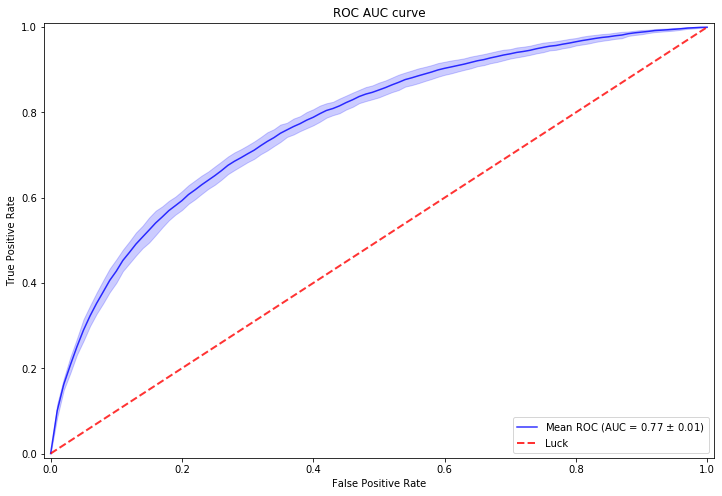

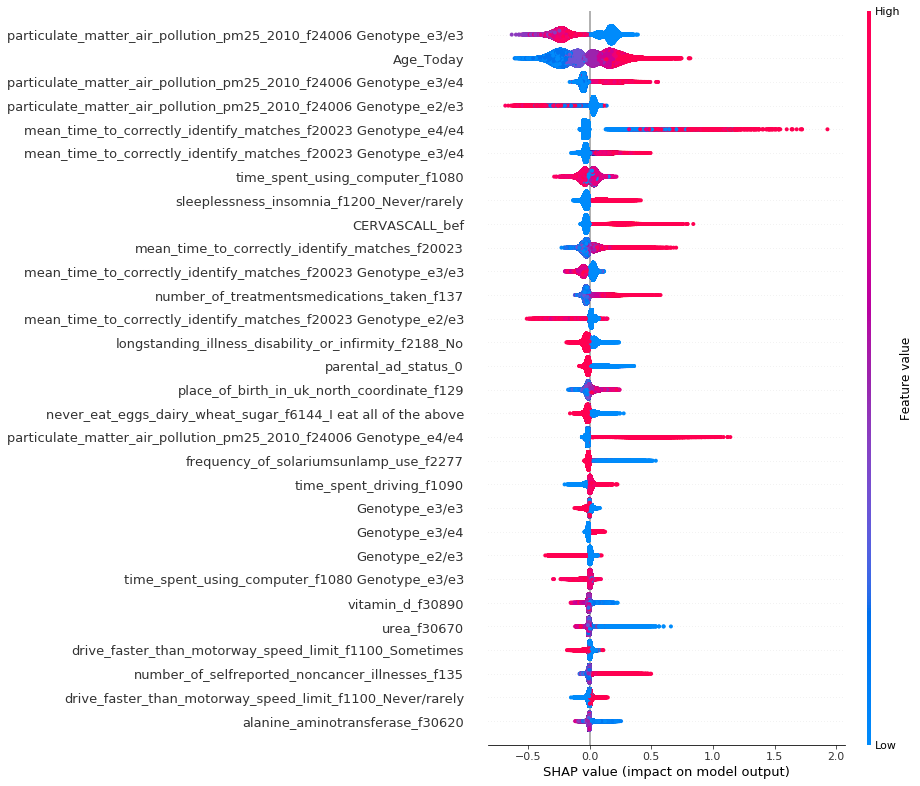

In [8]:
shapsum=newmodelrun(AD_model_full,dropvars=dropvars_full,model=mod_xgb,depvar='AD',reps=5,splits=5,rebalance=0)


#### Gridsearch

In [240]:


config = dict(scale_pos_weight = 1,subsample = 0.8, min_child_weight = 5, max_depth = 5, gamma= 2, 
              colsample_bytree= 0.6,smote=1)

mod_xgb=XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
           colsample_bynode=1, learning_rate=0.1,
           max_delta_step=0,  missing=None,
           n_estimators=60, n_jobs=4, nthread=4, objective='binary:logistic',
           random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=config['scale_pos_weight'],
           min_child_weight=config['min_child_weight'],
           gamma=config['gamma'], colsample_bytree=config['colsample_bytree'],max_depth=config['max_depth'],
           seed=42, silent=None, subsample=1, verbosity=1)


In [238]:
cols=[col for col in AD_model_full.columns if col in np.asarray(shapsum.head(20)['column_name']) or col=="AD" or col=='eid']

from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import StratifiedKFold
X=AD_model_full[cols].drop(columns="AD")
Y=AD_model_full['AD']
# A parameter grid for XGBoost
params = {
        'min_child_weight': [1, 5, 10],
        'gamma': [0.5, 1, 1.5, 2, 5],
        'subsample': [0.6, 0.8, 1.0],
        #'colsample_bytree': [0.6, 0.8, 1.0],
        'max_depth': [3, 4, 5],
        'scale_pos_weight' :[1,6,25]
        }

#xgb = XGBClassifier(learning_rate=0.02, n_estimators=600, objective='binary:logistic',
#                    silent=True, nthread=1)


folds = 3
param_comb = 5

skf = StratifiedKFold(n_splits=folds, shuffle = True, random_state = 1001)

random_search = RandomizedSearchCV(mod_xgb, param_distributions=params, n_iter=param_comb, scoring='roc_auc', n_jobs=4, cv=skf.split(X,Y), verbose=3, random_state=1001 )
random_search.fit(X, Y)

#newmodelrun(AD_model_full[cols],dropvars="AD",model=mod_xgb,depvar='AD',reps=1,splits=5)

Fitting 3 folds for each of 5 candidates, totalling 15 fits


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  15 out of  15 | elapsed:    8.5s finished


RandomizedSearchCV(cv=<generator object _BaseKFold.split at 0x7fd94d13acd0>,
                   error_score=nan,
                   estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                                           colsample_bylevel=1,
                                           colsample_bynode=1,
                                           colsample_bytree=0.6, gamma=5,
                                           learning_rate=0.1, max_delta_step=0,
                                           max_depth=5, min_child_weight=5,
                                           missing=None, n_estimators=60,
                                           n_jobs=4, nthread=4,
                                           objective='binary:logist...
                                           reg_lambda=1, scale_pos_weight=1,
                                           seed=42, silent=None, subsample=1,
                                           verbosity=1),
                   iid='deprecat

In [239]:
print('\n All results:')
print(random_search.cv_results_)
print('\n Best estimator:')
print(random_search.best_estimator_)
print('\n Best normalized gini score for %d-fold search with %d parameter combinations:' % (folds, param_comb))
print(random_search.best_score_ * 2 - 1)
print('\n Best hyperparameters:')
print(random_search.best_params_)
results = pd.DataFrame(random_search.cv_results_)
results.to_csv('xgb-random-grid-search-results-01.csv', index=False)



 All results:
{'mean_fit_time': array([1.58775091, 1.34685389, 1.09836451, 1.20762618, 1.47692378]), 'std_fit_time': array([0.13723585, 0.15353373, 0.07679243, 0.09053018, 0.01533651]), 'mean_score_time': array([0.05361501, 0.03871028, 0.03705692, 0.04242301, 0.03864487]), 'std_score_time': array([0.00289347, 0.00577175, 0.00258465, 0.00125392, 0.00257106]), 'param_subsample': masked_array(data=[1.0, 0.6, 0.8, 1.0, 0.8],
             mask=[False, False, False, False, False],
       fill_value='?',
            dtype=object), 'param_scale_pos_weight': masked_array(data=[6, 1, 6, 6, 1],
             mask=[False, False, False, False, False],
       fill_value='?',
            dtype=object), 'param_min_child_weight': masked_array(data=[1, 10, 10, 10, 5],
             mask=[False, False, False, False, False],
       fill_value='?',
            dtype=object), 'param_max_depth': masked_array(data=[5, 4, 3, 4, 5],
             mask=[False, False, False, False, False],
       fill_value='?',
  

In [30]:
genotypes[4]

'Genotype_e2/e4'

In [32]:
AD_model_full_geno=replace_genotype(AD_model_full,gen_lkup,genotypes)
#AD_model_full_geno['Genotype']=AD_model_full_geno['Genotype'].apply(lambda x:genotypes[x])
AD_model_full_geno['Genotype'].value_counts()

0    113049
Name: Genotype, dtype: int64

In [ ]:


dropvars_full=varstodrop(AD_model_full,drpvarsapoe,drvarsdef)
mask_apoe=((AD_model_full["Genotype_e3/e4"]==1))
AD_model_full[mask_apoe]['AD'].sum()
shapsumAPOE=newmodelrun(AD_model_full[mask_apoe],dropvars=dropvars_full,model=mod_xgb,depvar='AD',reps=1,splits=2)



Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#deprecate-loc-reindex-listlike


Accuracy : 0.9718
0.0
AUC Score (Train): 0.665029


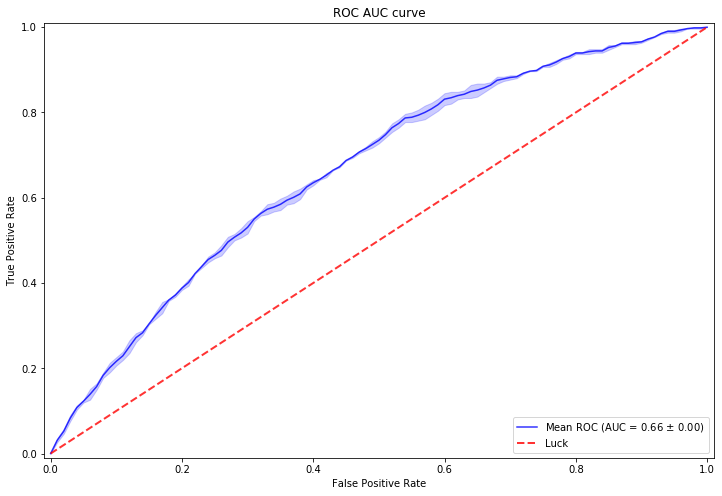

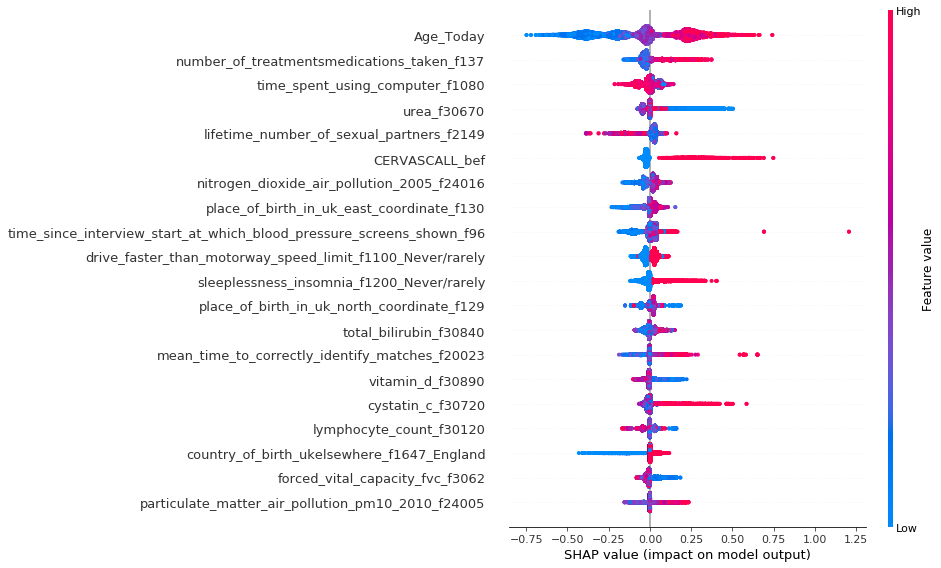

In [214]:
#mask_apoe=((AD_model_full["Genotype_e3/e4"]==1)|(AD_model_full["Genotype_e4/e4"]==1))
dropvars_full=varstodrop(AD_model_full,drpvarsapoe,drvarsdef)
mask_apoe=((AD_model_full["Genotype_e3/e4"]==1)|(AD_model_full["Genotype_e4/e4"]==1))
AD_model_full[mask_apoe]['AD'].sum()
shapsumAPOE=newmodelrun(AD_model_full[mask_apoe],dropvars=dropvars_full,model=mod_xgb,depvar='AD',reps=1,splits=2)


In [56]:
ukb_tp0=pd.read_pickle('%s%s' % (path,'ukb_tp0.p'))
ukb_tp0=ukb_tp0[(ukb_tp0['eid'].isin(AD_model_full['eid']))]

In [9]:
AD_model_redfeat=AD_model_full[np.append(['AD'],cols)]
AD_model_redfeat2=AD_model_full[np.append(['AD','eid'],cols)]


In [86]:
#rerun model with top features and take interaction values for partial dependence

X=AD_model_redfeat.drop(columns='AD')
y=AD_model_redfeat['AD']
mod_xgb.fit(X, y)
y_pred = mod_xgb.predict(X)

explainer = shap.TreeExplainer(mod_xgb)
shap_interaction_values = explainer.shap_interaction_values(X)



KeyboardInterrupt: 

In [ ]:
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
clf = SVC(gamma='auto',probability=True)
newmodelrun(AD_model_redfeat2,dropvars='AD',model=clf,depvar='AD',reps=1,splits=3,shap=0)


Accuracy : 0.9856
1.0
AUC Score (Train): 0.747370


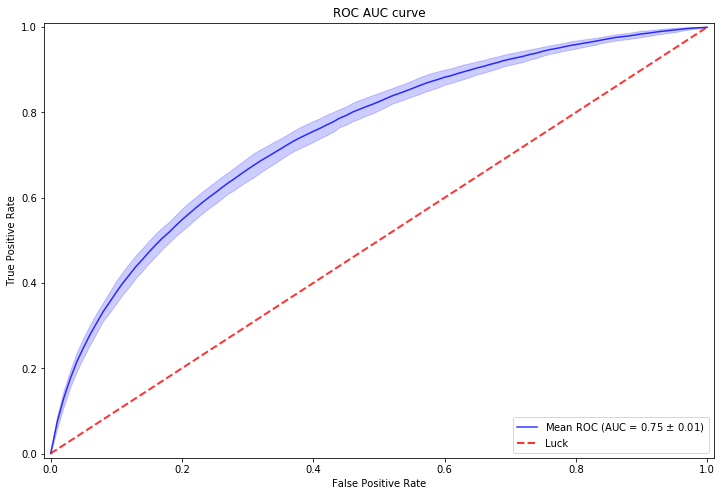

In [14]:
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression(random_state=0)
model_rf = RandomForestClassifier(max_depth=6, random_state=0, n_estimators=10)
newmodelrun(AD_model_redfeat2,dropvars='AD',model=model_rf,depvar='AD',reps=10,splits=5,shap=0)


Accuracy : 0.9856
0.0
AUC Score (Train): 0.710914


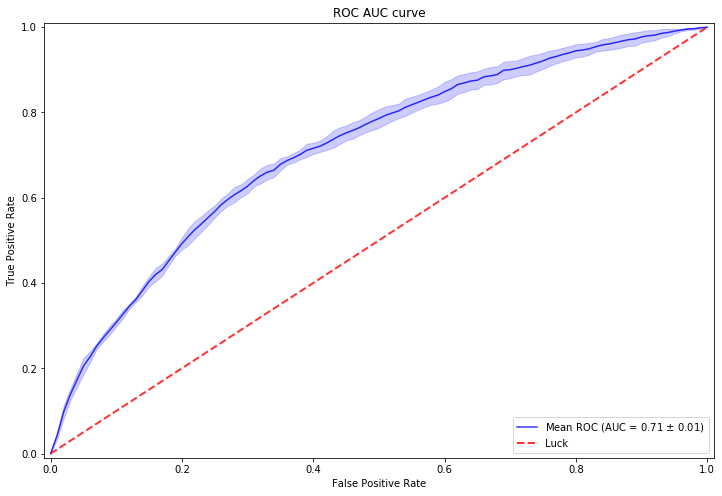

In [10]:
from sklearn.ensemble import RandomForestClassifier
# The target variable is 'quality'.



newmodelrun(AD_model_full,dropvars=dropvars_full,model=model_rf,depvar='AD',reps=1,splits=5,shap=0)



In [60]:
def inter_vals(col1,col2,y=y,intvalues=shap_interaction_values,df=X):
    col1_ind=np.where(df.columns==col1)[0][0]
    #print(col1_ind)
    col2_ind=np.where(df.columns==col2)[0][0]
    #print(col2_ind)
    vals=intvalues[:,col1_ind,col2_ind]
    df=pd.DataFrame({'col1':col1,'col2':col2,'AD':y,'int_vals':vals},index=None)
    return df
    

In [61]:
df_full=pd.DataFrame([])
for col in X.columns:
    for col1 in X.columns:
        if col!=col1:
            df=inter_vals(col,col1,y)
            df_full=pd.concat([df_full,df],axis=0)


In [77]:
datasorted=pd.DataFrame(df_full.groupby(['AD','col1','col2']).agg({'int_vals':['mean','median','std']})).reset_index()
datasorted.columns=['AD','col1','col2','mean_intval','median_intval','std_intval']

In [81]:
datasorted.sort_values(by='mean_intval',ascending=False,inplace=True)

In [82]:
datasorted.head(20)

,AD,col1,col2,mean_intval,median_intval,std_intval
479,1,Genotype_e4/e4,Genotype_e3/e4,0.006029,-0.001131,0.013350
460,1,Genotype_e3/e4,Genotype_e4/e4,0.006029,-0.001131,0.013350
456,1,Genotype_e3/e4,Age_Today,0.005118,0.001206,0.020374
383,1,Age_Today,Genotype_e3/e4,0.005118,0.001205,0.020374
488,1,Genotype_e4/e4,particulate_matter_air_pollution_pm10_2007_f24019,0.004140,0.000289,0.025798
651,1,particulate_matter_air_pollution_pm10_2007_f24019,Genotype_e4/e4,0.004140,0.000289,0.025798
708,1,sleeplessness_insomnia_f1200_Never/rarely,Genotype_e4/e4,0.003919,0.000594,0.033560
491,1,Genotype_e4/e4,sleeplessness_insomnia_f1200_Never/rarely,0.003919,0.000594,0.033560
489,1,Genotype_e4/e4,particulate_matter_air_pollution_pm25_2010_f24006,0.003435,0.000473,0.023613
670,1,particulate_matter_air_pollution_pm25_2010_f24006,Genotype_e4/e4,0.003435,0.000473,0.023613


In [62]:
import seaborn as sns

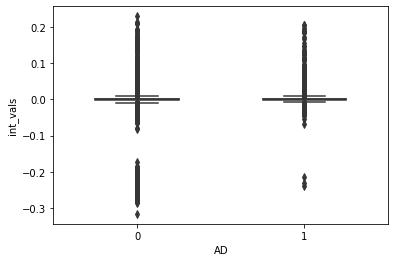

In [72]:
maskcols=(df_full['col1']=="Genotype_e4/e4")&(df_full['col2']=='particulate_matter_air_pollution_pm10_2007_f24019')

bplot = sns.boxplot(y='int_vals', x='AD', 
                 data=df_full[maskcols], 
                 width=0.5,
                 palette="colorblind")

In [66]:

def createpdpplots(df,colsel,shap_interaction_values=shap_interaction_values,numfeats=20):

    tmp = np.abs(shap_interaction_values).mean(0)
    for i in range(tmp.shape[0]):
        tmp[i,i] = 0
    inds = np.argsort(-tmp.mean(0))[:numfeats]
    print(colsel)
    
    for col in df.columns[inds]:
        print(col)
        for col1 in df.columns[inds]:
            if col!=col1 and col1==colsel:
                shap.dependence_plot((col,col1), shap_interaction_values, df,
                                            interaction_index=None,show=False)
                plt.show()
                
    return tmp


Index(['drive_faster_than_motorway_speed_limit_f1100_Sometimes',
       'sleeplessness_insomnia_f1200_Never/rarely',
       'longstanding_illness_disability_or_infirmity_f2188_No',
       'diabetes_diagnosed_by_doctor_f2443_No',
       'never_eat_eggs_dairy_wheat_sugar_f6144_I eat all of the above',
       'parental_ad_status_0', 'Genotype_e2/e3', 'Genotype_e3/e3',
       'Genotype_e3/e4', 'Genotype_e4/e4',
       'place_of_birth_in_uk_east_coordinate_f130',
       'number_of_treatmentsmedications_taken_f137',
       'time_spent_using_computer_f1080',
       'frequency_of_solariumsunlamp_use_f2277',
       'mean_time_to_correctly_identify_matches_f20023',
       'particulate_matter_air_pollution_pm25_2010_f24006', 'Age_Today',
       'CERVASCALL_bef', 'Age_Today Genotype_e3/e4',
       'Age_Today Genotype_e4/e4'],
      dtype='object')

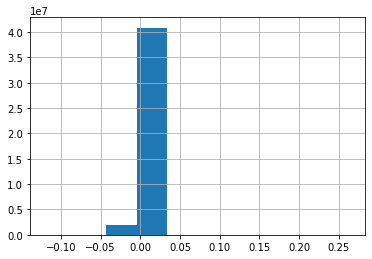

In [47]:
df_full['int_vals'].hist()

In [37]:
shap_interaction_values.sum()

-19581.732

In [22]:
np.where(X.columns=='mean_time_to_correctly_identify_matches_f20023')[0][0]

14

In [15]:
shap_interaction_values.shape

(113049, 20, 20)

In [18]:
shap_interaction_values[:,4,4]

array([ 0.056855  ,  0.05654752, -0.02842671, ...,  0.05612386,
        0.06161024, -0.02838041], dtype=float32)

In [75]:
findcols(AD_model_redfeat,'Genotype')

['Genotype']

In [ ]:
shapsum=newmodelrun(AD_model_redfeat,dropvars='AD',model=mod_xgb,depvar='AD',reps=1,splits=5)


In [70]:
shap_interaction_values.shape

(114305, 20, 20)

particulate_matter_air_pollution_pm25_2010_f24006
Genotype


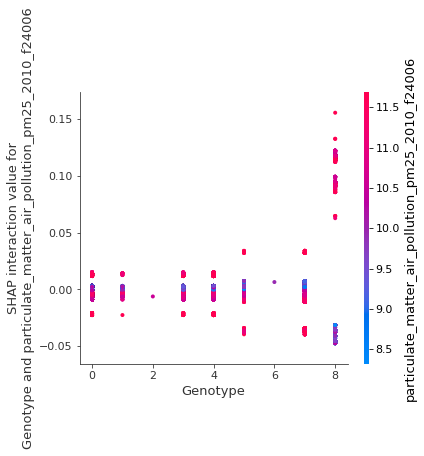

Age_Today


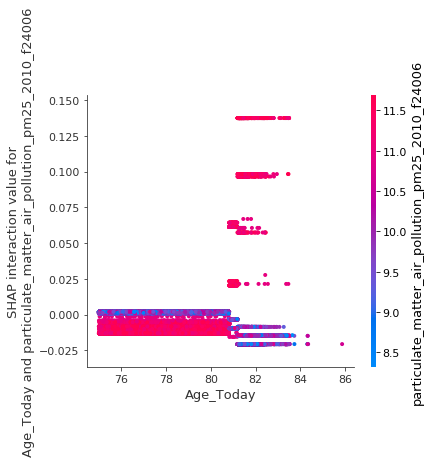

time_spent_using_computer_f1080


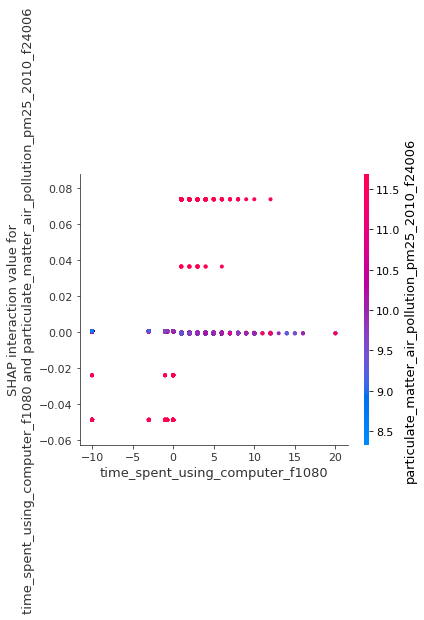

never_eat_eggs_dairy_wheat_sugar_f6144_I eat all of the above


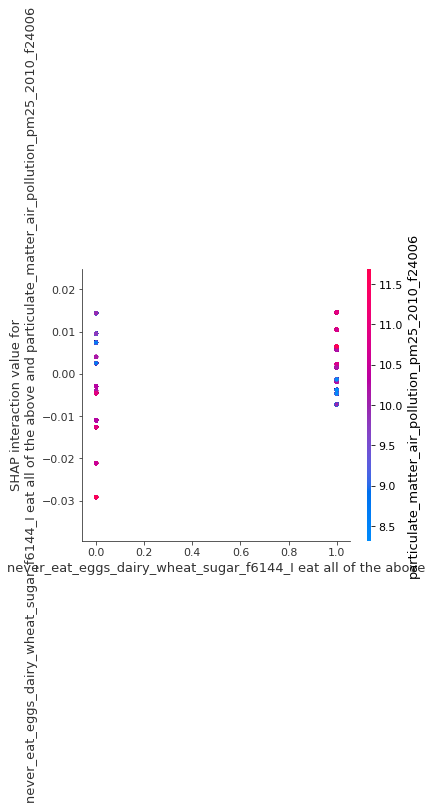

DIAB_bef


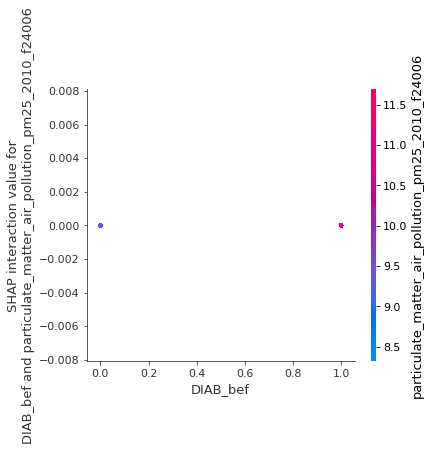

mean_time_to_correctly_identify_matches_f20023


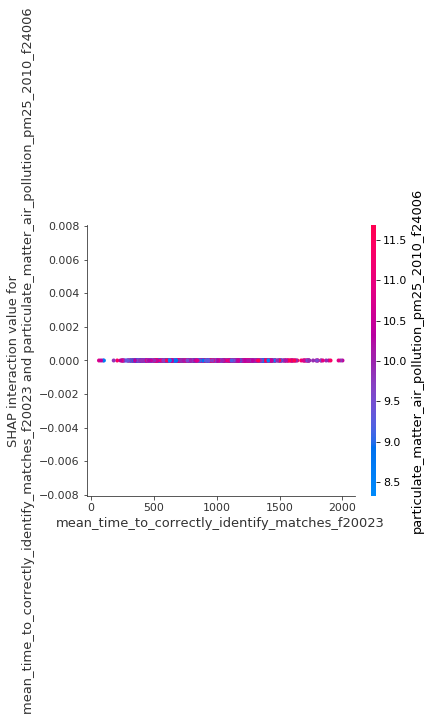

mothers_age_at_death_f3526


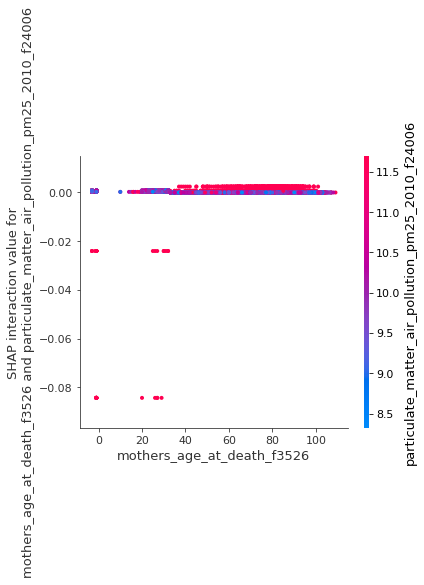

diabetes_diagnosed_by_doctor_f2443_Yes


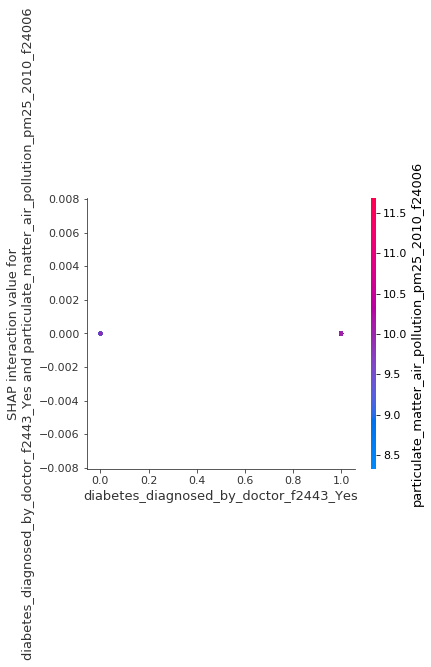

place_of_birth_in_uk_east_coordinate_f130


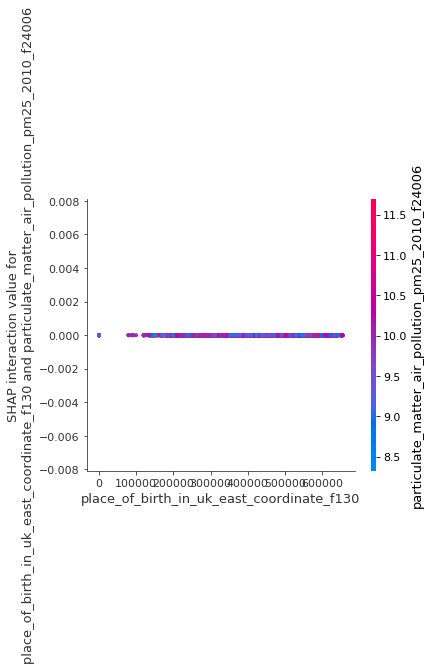

number_of_treatmentsmedications_taken_f137


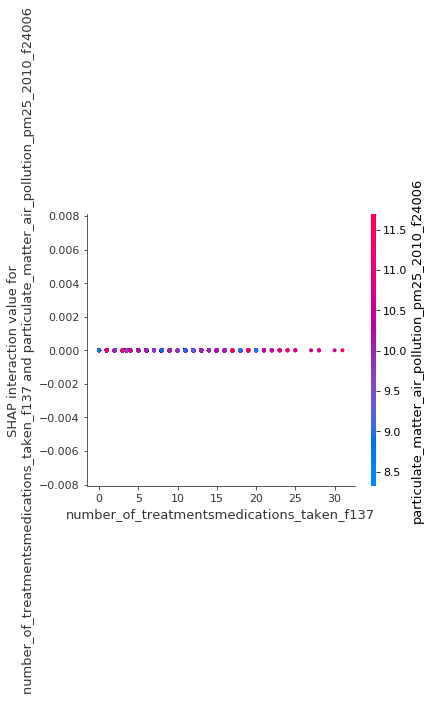

parental_ad_status_0


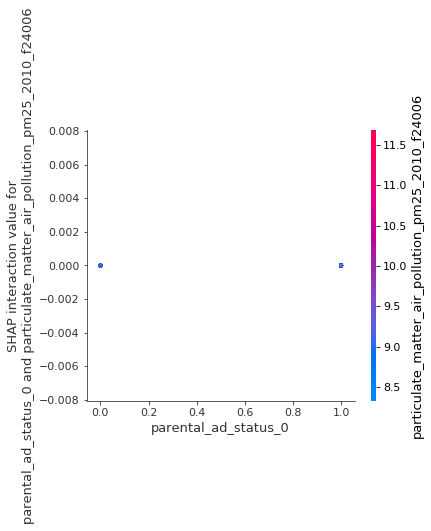

sleeplessness_insomnia_f1200_Never/rarely


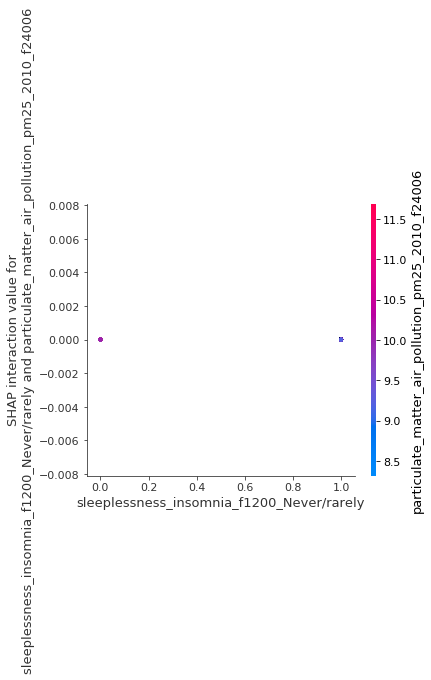

ever_had_samesex_intercourse_f2159_No


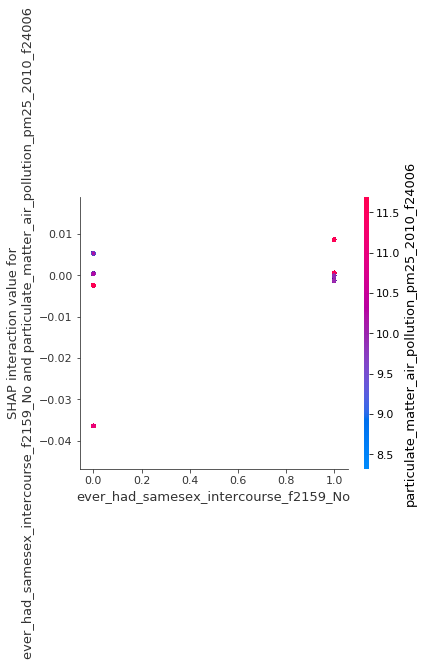

carer_support_indicators_f41214_No


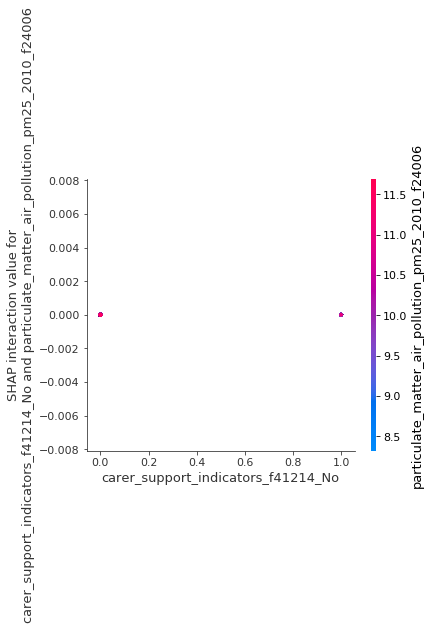

longstanding_illness_disability_or_infirmity_f2188_No


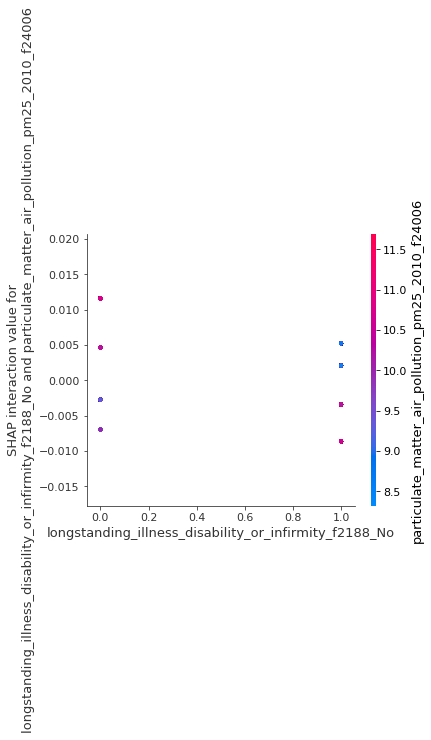

CERVASC_bef


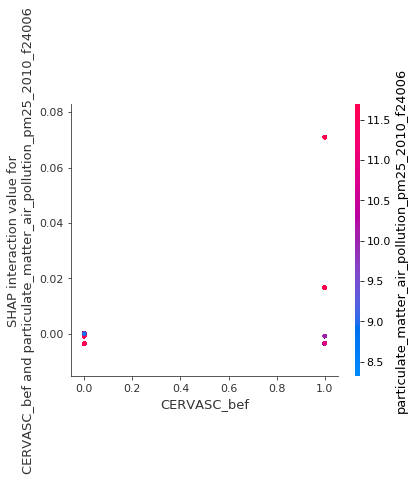

particulate_matter_air_pollution_pm25_2010_f24006
frequency_of_solariumsunlamp_use_f2277


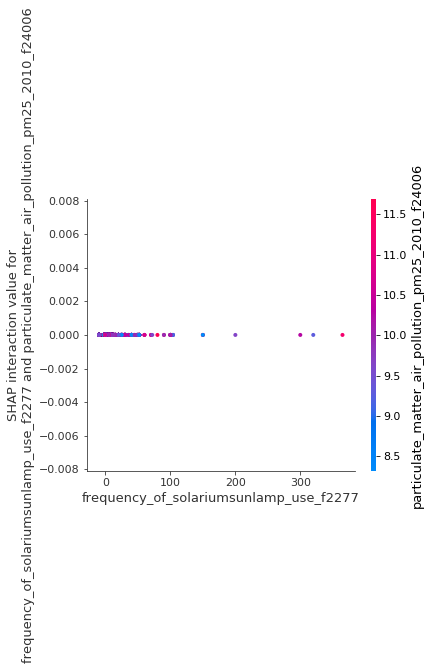

year_of_birth_f34


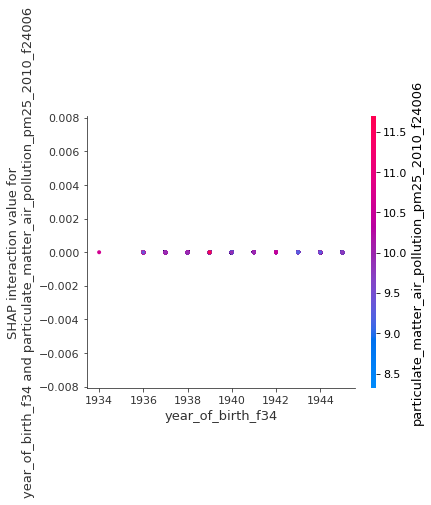

diabetes_diagnosed_by_doctor_f2443_No


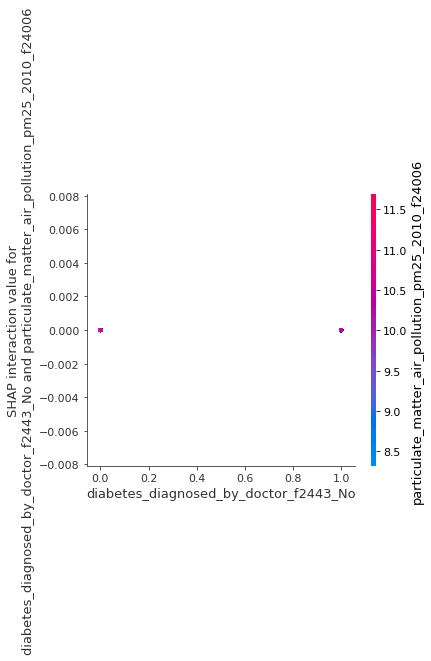

array([[0.00000000e+00, 0.00000000e+00, 3.23843746e-03, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 1.51669688e-03, 4.25787224e-03, 7.69933732e-03,
        0.00000000e+00, 1.63493468e-03, 9.16642079e-04, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 7.20276556e-04, 7.91533291e-03],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 8.67091352e-04,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        1.92805659e-03, 4.91928263e-03, 0.00000000e+00, 0.00000000e+00,
        5.44516661e-04, 1.13383750e-03, 6.96729496e-03, 2.24274292e-04,
        3.92203080e-03, 0.00000000e+00, 2.30427700e-04, 6.89240405e-03],
       [3.23843746e-03, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 5.66332182e-03, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 2.9794

In [67]:
createpdpplots(X,'particulate_matter_air_pollution_pm25_2010_f24006')

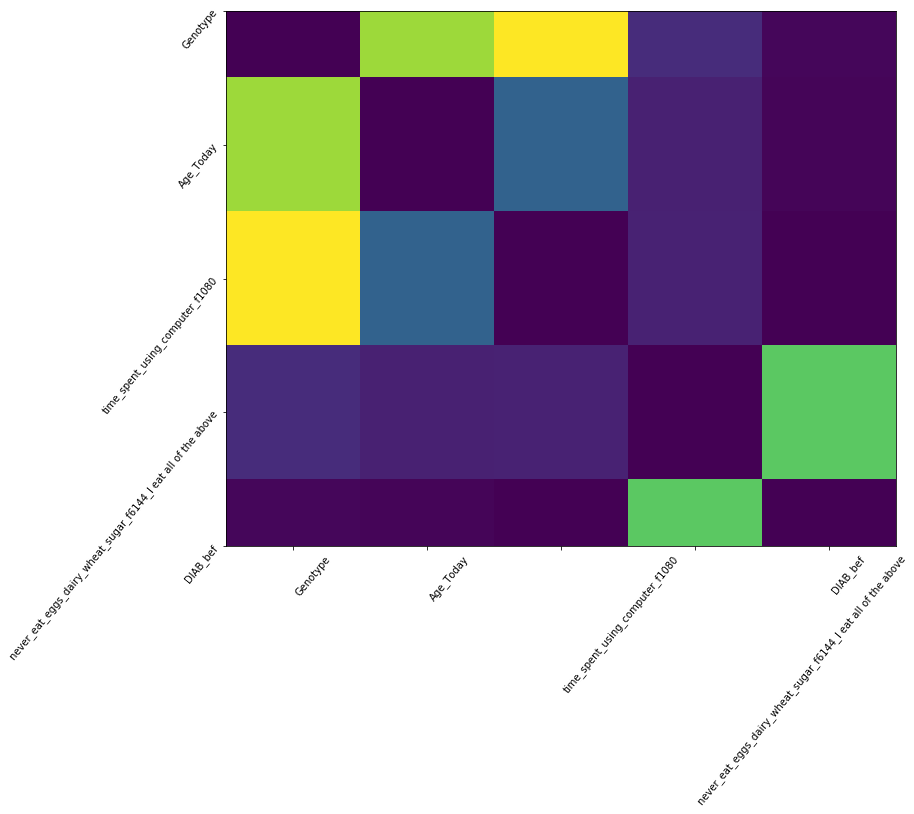

In [51]:
tmp = np.abs(shap_interaction_values).mean(0)
for i in range(tmp.shape[0]):
    tmp[i,i] = 0
inds = np.argsort(-tmp.mean(0))[:5]
tmp2 = tmp[inds,:][:,inds]
plt.figure(figsize=(12,12))
plt.imshow(tmp2)
plt.yticks(range(tmp2.shape[0]), X.columns[inds], rotation=50.4, horizontalalignment="right")
plt.xticks(range(tmp2.shape[0]), X.columns[inds], rotation=50.4, horizontalalignment="left")
#pl.gca().xaxis.tick_top()
plt.show()

sleeplessness_insomnia_f1200


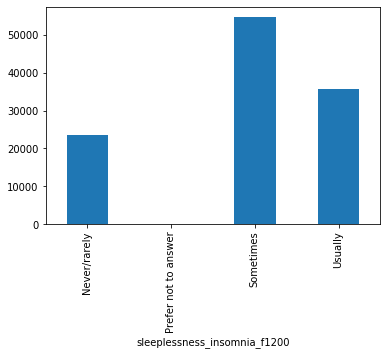

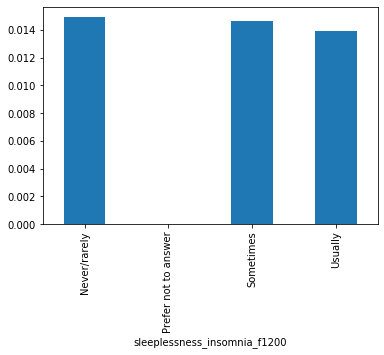

ever_had_samesex_intercourse_f2159


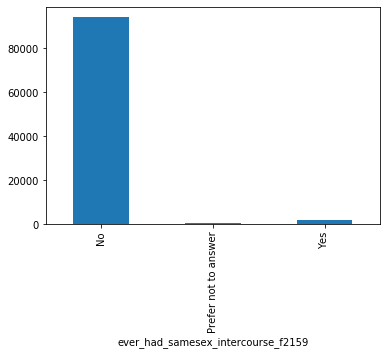

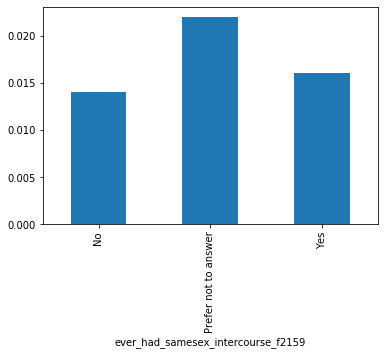

longstanding_illness_disability_or_infirmity_f2188


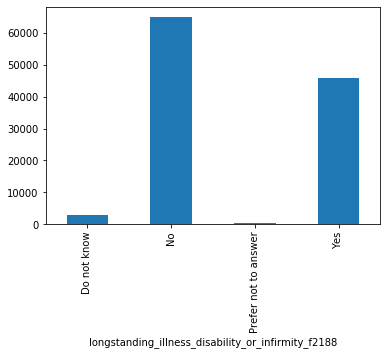

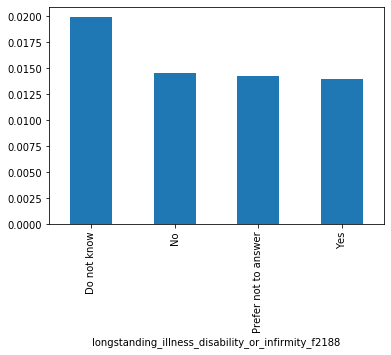

diabetes_diagnosed_by_doctor_f2443


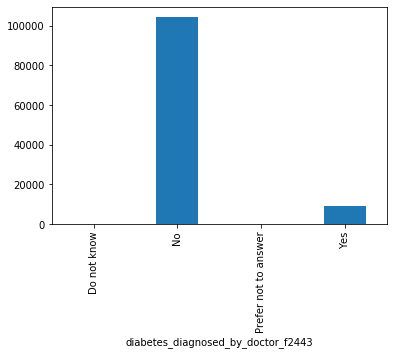

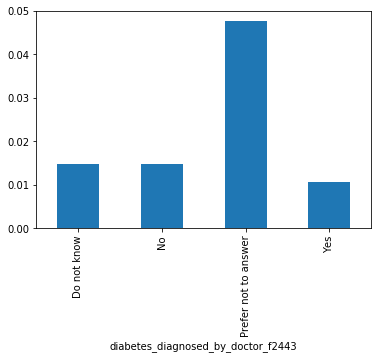

never_eat_eggs_dairy_wheat_sugar_f6144


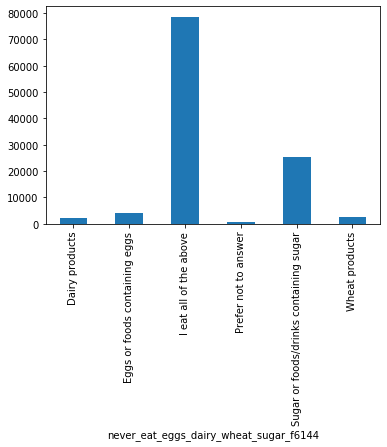

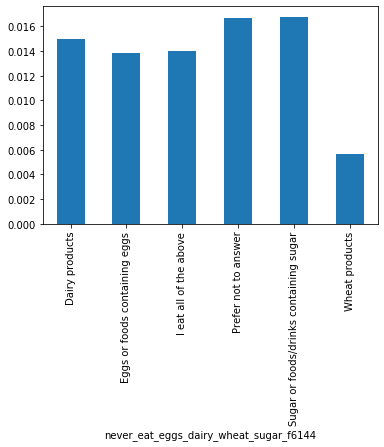

parental_ad_status


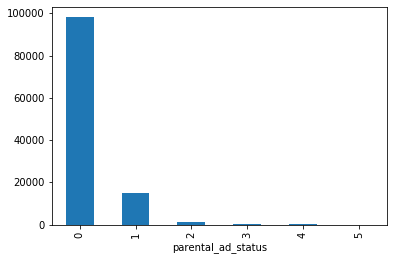

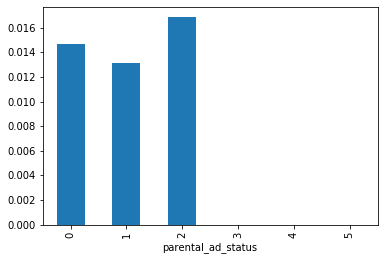

Genotype


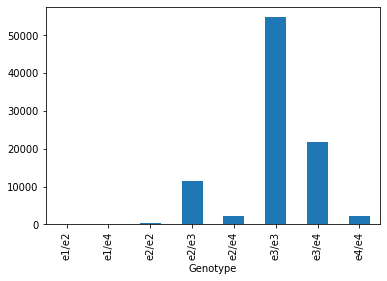

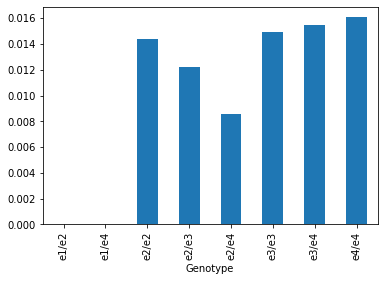

In [25]:
df=ukb_tp0_o75_dis[np.append(colstopfeats,'AD')]
for col in df.columns:
    if col!="AD" and df[col].dtype!='float64':
        print(col)
        df.groupby([col])['AD'].size().plot(kind='bar')
        plt.show()
        df.groupby([col])['AD'].mean().plot(kind='bar')
        plt.show()

In [8]:
for col in shapsum.head(15)['colum_name']:
    for col2 in ukb_tp0_o75_dis.columns:
        if re.search()

,column_name,mean_shap_imp,std_shap_imp,min_rank,max_rank,mean_rank,median_rank,std_rank
6,Genotype,0.389513,0.012320,0,0,0.0,0,0.000000
0,Age_Today,0.114255,0.008990,1,1,1.0,1,0.000000
1110,time_spent_using_computer_f1080,0.049318,0.007895,2,6,3.8,4,1.788854
3,CERVASC_bef,0.040118,0.004733,4,8,5.4,5,1.673320
783,never_eat_eggs_dairy_wheat_sugar_f6144_I eat a...,0.039432,0.017392,2,9,6.0,7,2.645751


In [48]:

AD_modelage=pd.read_pickle('%s%s' % (path,'AD_modelage.p'))


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Accuracy : 0.9655
0.0
AUC Score (Train): 0.746148


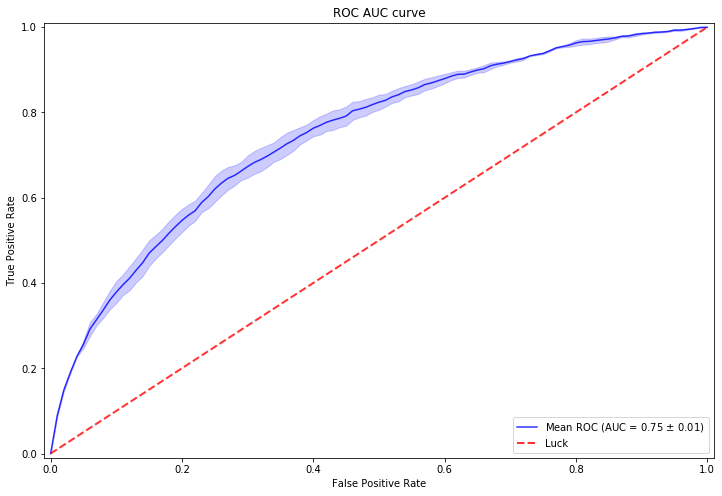

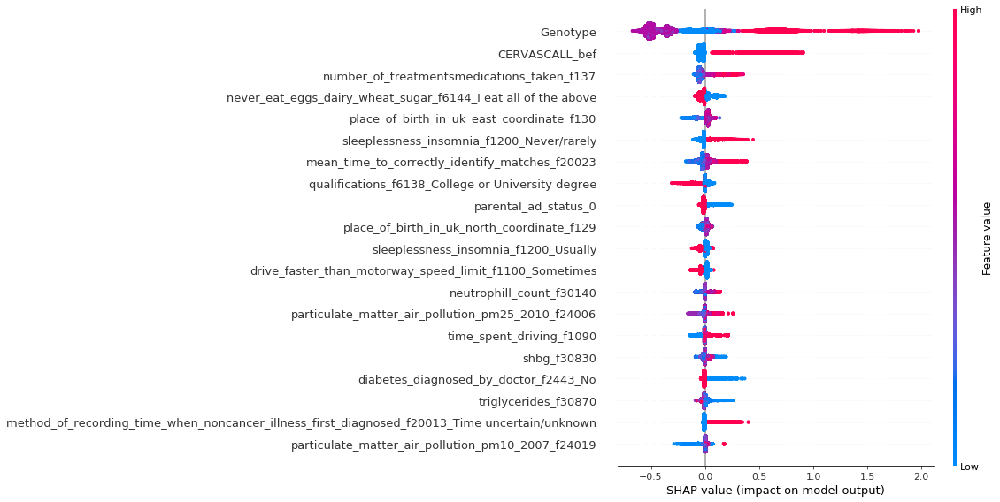

In [34]:
AD_modelage=replace_genotype(AD_modelage,gen_lkup,genotypes)
AD_modelage=replacenullsmean(AD_modelage)
AD_modelage=col_spec_chars(AD_modelage)


dropvars_full=varstodrop(AD_modelage,drpvars1,drvarsdef)
newmodelrun(AD_modelage,dropvars=dropvars_full,model=mod_xgb,depvar='AD',reps=1,splits=2)


In [35]:
#AD_model_full=replace_genotype(AD_model_full,gen_lkup,genotypes)
#AD_model_full=replacenullsmean(AD_model_full)
#AD_model_full=col_spec_chars(AD_model_full)

In [50]:
#ukb_tp0=pd.read_pickle('%s%s' % (path,'ukb_tp0.p'))
ukb_tp0_o75=ukb_tp0[(ukb_tp0['eid'].isin(AD_model_full['eid']))]
findcols(ukb_tp0_o75,'sleeplessness')

['sleeplessness_insomnia_f1200']

In [23]:
X.values

array([[1., 0., 0., ..., 0., 0., 4.],
       [1., 0., 0., ..., 0., 0., 4.],
       [1., 0., 0., ..., 0., 0., 7.],
       ...,
       [1., 0., 1., ..., 0., 0., 0.],
       [0., 1., 1., ..., 0., 0., 0.],
       [1., 0., 1., ..., 0., 0., 0.]])

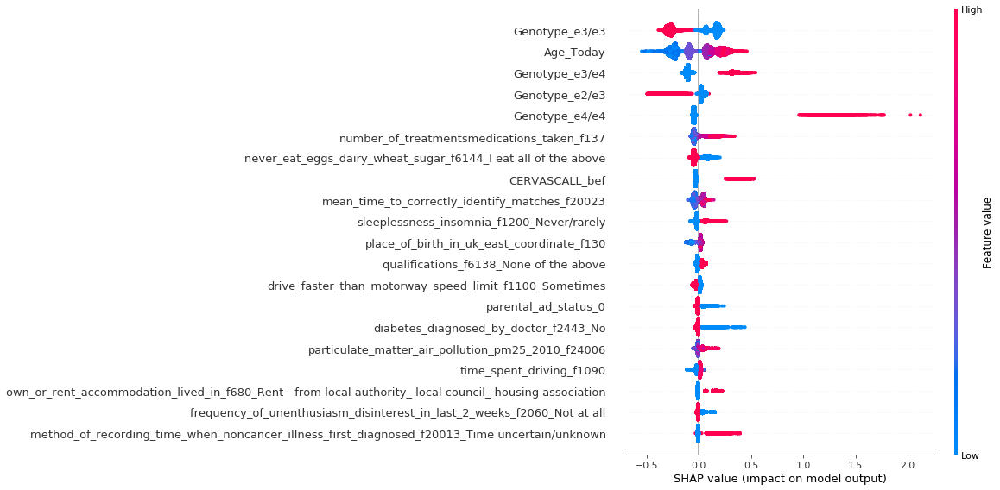

In [38]:
dropvars_full=varstodrop(AD_model_full,drpvars1,drvarsdef)
X=AD_model_full.drop(columns=dropvars_full)
y=AD_model_full['AD']
mod_xgb_fitted=mod_xgb.fit(X.values,y,eval_metric="mlogloss")
explainer = shap.TreeExplainer(mod_xgb_fitted)
shap_values = explainer.shap_values(X.values)
shap.summary_plot(shap_values, X,feature_names=X.columns)

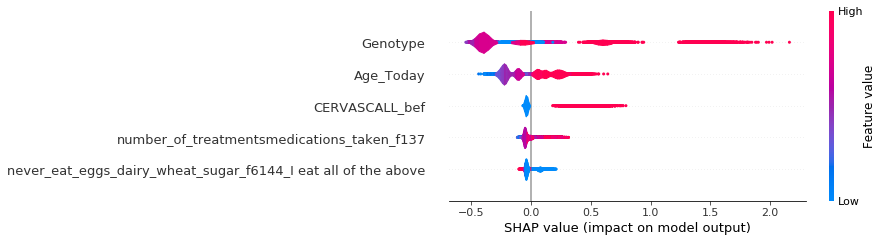

In [28]:
shap.summary_plot(shap_values, X,plot_type='violin',max_display=5)

In [29]:
shap.summary_plot(shap_values[0], X,plot_type='bar',max_display=5)

AssertionError: Summary plots need a matrix of shap_values, not a vector.

In [10]:
shap_interaction_values = explainer.shap_interaction_values(X[['Genotype','Age_Today']].sample(20))

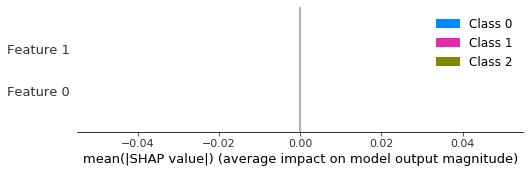

In [18]:
import numpy as np
from xgboost import XGBClassifier
import shap

X = np.array([[1, 2], [3, 4], [5, 6], [7, 8], [9, 10]])
y = np.array(["A", "B", "C", "A", "B"])

model = XGBClassifier()
model.fit(X, y, eval_metric="mlogloss")
y_pred = model.predict(X)

explainer = shap.TreeExplainer(model)
shap_interaction_values = explainer.shap_interaction_values(X[['Genotype','Age_Today']].sample(20))

shap_values = explainer.shap_values(X)
shap.summary_plot(shap_values, X, plot_type="bar")

In [132]:
df1=pd.DataFrame(shap_values,columns=X.columns)
for col in df1.columns:
    if col!='eid':
        df1[col]=abs(df1[col])
df1=df1[[col for col in df1.columns if col!='eid']]
df1.columns=[col+" shap" for col in df1.columns]
df1['eid']=X['eid']
df1=pd.merge(X,df1,on='eid',how='left')
df1['Genotype_name']=df1['Genotype'].map(gen_lkup_rev)

In [136]:
def shapaverage(df,groupbyvar,measurevar,genotypes=genotypes):
    print(measurevar)
    mask=(df[groupbyvar].isin(genotypes))
    df2=df[mask]
    df2.groupby(groupbyvar)[measurevar].mean().plot(kind='barh')
    plt.Title='fff'
    plt.show()
genotypes=['Genotype_e4/e4','Genotype_e3/e4','Genotype_e3/e3','Genotype_e2/e3']    

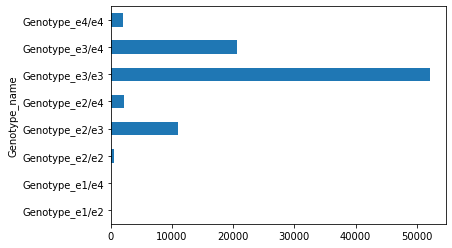

number_of_treatmentsmedications_taken_f137 shap


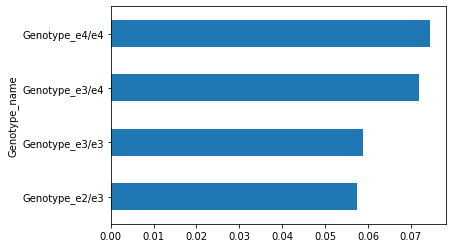

CERVASCALL_bef shap


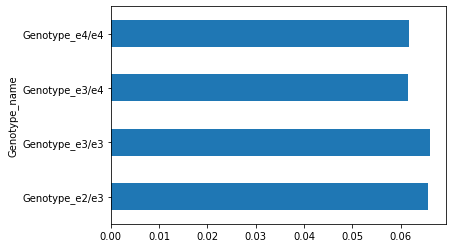

mean_time_to_correctly_identify_matches_f20023 shap


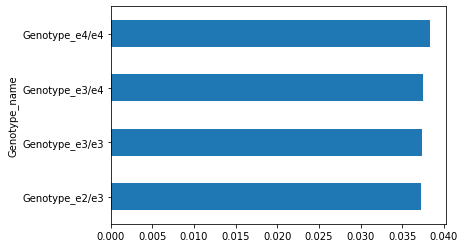

diabetes_diagnosed_by_doctor_f2443_No shap


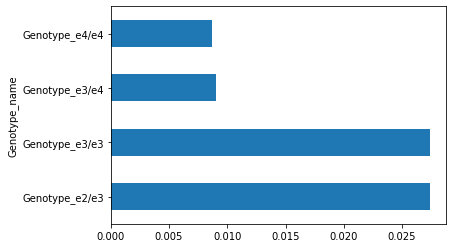

particulate_matter_air_pollution_pm25_2010_f24006 shap


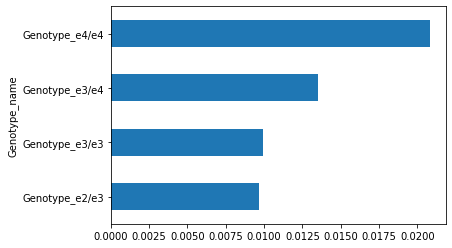

parental_ad_status_0 shap


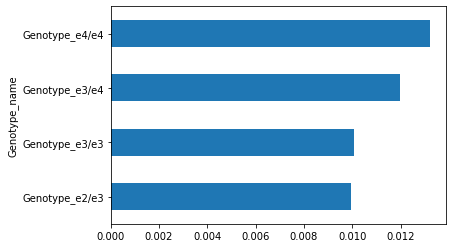

overall_health_rating_f2178_Poor shap


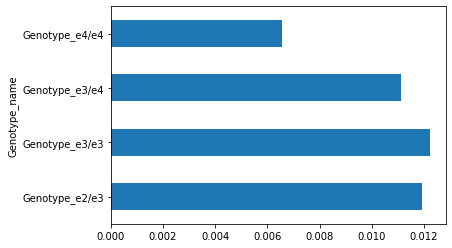

In [137]:
df1.groupby('Genotype_name').size().plot(kind='barh')
plt.show()
shapaverage(df1,'Genotype_name','number_of_treatmentsmedications_taken_f137 shap',genotypes)
shapaverage(df1,'Genotype_name','CERVASCALL_bef shap',genotypes)
shapaverage(df1,'Genotype_name','mean_time_to_correctly_identify_matches_f20023 shap',genotypes)
shapaverage(df1,'Genotype_name','diabetes_diagnosed_by_doctor_f2443_No shap',genotypes)
shapaverage(df1,'Genotype_name','particulate_matter_air_pollution_pm25_2010_f24006 shap',genotypes)
shapaverage(df1,'Genotype_name','parental_ad_status_0 shap',genotypes)
shapaverage(df1,'Genotype_name','overall_health_rating_f2178_Poor shap',genotypes)





In [ ]:
'diabetes_diagnosed_by_doctor_f2443_No shap'

In [18]:
createpdpplots(X.sample(2000),'Genotype',explainer,numfeats=10)

KeyboardInterrupt: 

In [23]:
mod_xgb=XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
           colsample_bynode=1, colsample_bytree=1, gamma=0, learning_rate=0.1,
           max_delta_step=0, max_depth=config['max_depth'], min_child_weight=1, missing=None,
           n_estimators=60, n_jobs=4, nthread=4, objective='binary:logistic',
           random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=config['scale_pos_weight'],
           seed=42, silent=None, subsample=1, verbosity=1)

In [24]:
dropvars_full=varstodrop(AD_model_full,drpvars1,drvarsdef)

In [25]:
X = AD_model_full.drop(columns=dropvars_full)
y = AD_model_full['AD']

In [26]:
X.columns=X.columns.str.replace(',','')
X.columns=X.columns.str.replace('<','')
X.columns=X.columns.str.replace('>','')
X.columns=X.columns.str.replace('[','')
X.columns=X.columns.str.replace(']','')

In [17]:
gen_lkup={'Genotype_e1/e2':1,"Genotype_e2/e2":2,"Genotype_e2/e3":3,"Genotype_e3/e3":4,
          "Genotype_e1/e4":5,"Genotype_e2/e4":5,"Genotype_e3/e4":7,"Genotype_e4/e4":8}



In [27]:
X1=X.copy()
X1['AD']=AD_model_full['AD']


X1['Genotype']=0
for col in X1.columns:
    
    if 'Genotype' in col and col!='Genotype':
        #print(X1['Genotype'].value_counts())
        #print(col)
        mask_col=(X1[col]==1)
        X1['Genotype'][mask_col]=dictlkup[col]

colsfilt=[col for col in X1.columns if ('Genotype' not in col or col=='Genotype') and col!="AD"]
colsfiltAD=[col for col in X1.columns if ('Genotype' not in col or col=='Genotype') or col=='AD']

#### Model AUC ROC

#### Model interpretation

#### Interaction Interpretation

In [ ]:
explainer=shap.TreeExplainer(mod_xgb)


In [28]:
X1['Genotype'].value_counts()

4    52128
7    20666
0    19305
3    11039
5     2216
8     2034
2      495
1        1
Name: Genotype, dtype: int64

In [29]:
colsfilt=[col for col in X1.columns if ('Genotype' not in col or col=='Genotype') and col!="AD"]
colsfiltAD=[col for col in X1.columns if ('Genotype' not in col or col=='Genotype') or col=='AD']

In [30]:
X2=X1[colsfiltAD]
X1=X1[colsfilt]


In [31]:
mod_xgb.fit(X1,y)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=60, n_jobs=4,
              nthread=4, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=42,
              silent=None, subsample=1, verbosity=1)

In [32]:
import shap
explainer=shap.TreeExplainer(mod_xgb)

In [33]:
shap.dependence_plot(("Age_Today", "Genotype"), shap_interaction_values, X1.iloc[:2000,:],interaction_index=None)

NameError: name 'shap_interaction_values' is not defined

In [ ]:
tmp = np.abs(shap_interaction_values).mean(0)
for i in range(tmp.shape[0]):
    tmp[i,i] = 0
inds = np.argsort(-tmp.mean(0))[:10]
tmp2 = tmp[inds,:][:,inds]
print(X1.columns[inds])


  

In [34]:
def createpdpplots(df,colsel,numfeats=10):

    shap_interaction_values = explainer.shap_interaction_values(df)

    tmp = np.abs(shap_interaction_values).mean(0)
    for i in range(tmp.shape[0]):
        tmp[i,i] = 0
    inds = np.argsort(-tmp.mean(0))[:numfeats]
    for col in df.columns[inds]:
        for col1 in df.columns[inds]:
            if col!=col1 and col1==colsel:
                shap.dependence_plot((col,col1), shap_interaction_values, df,
                                            interaction_index=None,show=False)
                plt.show()


In [ ]:
createpdpplots(X1,'Genotype',6)

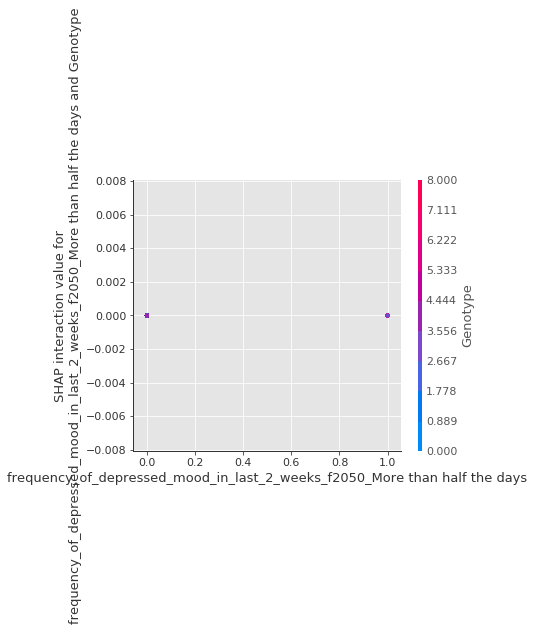

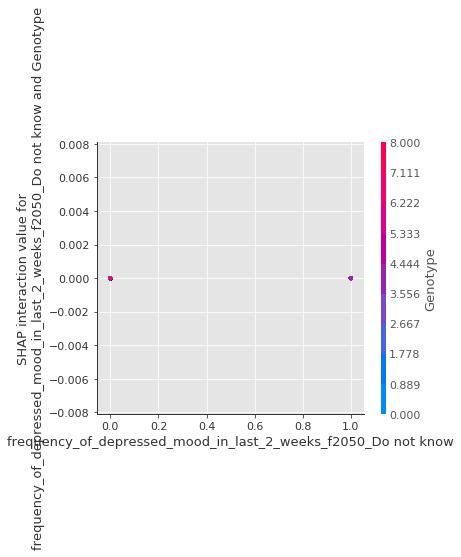

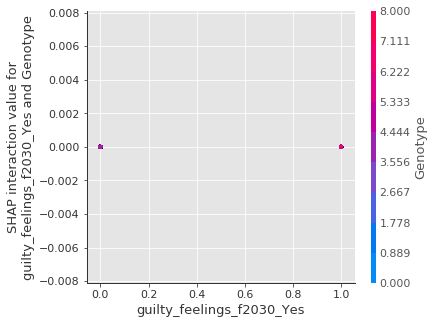

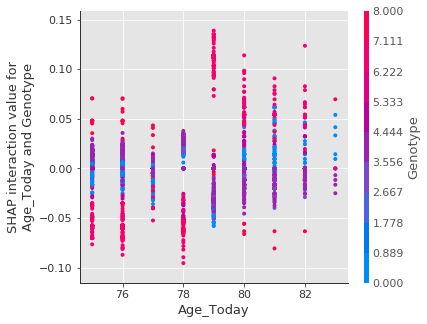

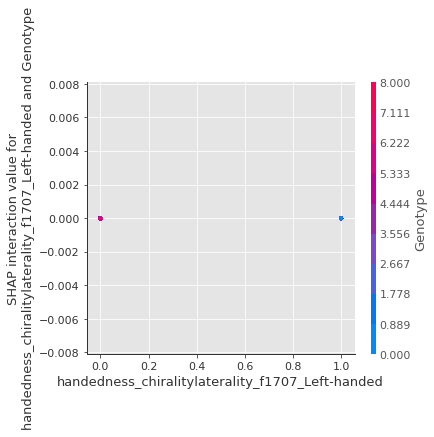

In [35]:
createpdpplots(X1.sample(5000),'Genotype',6)

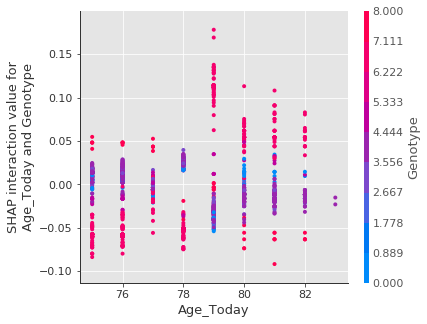

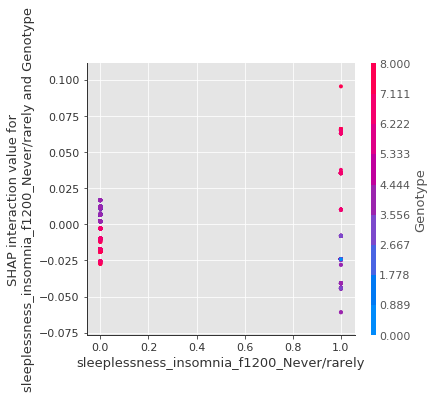

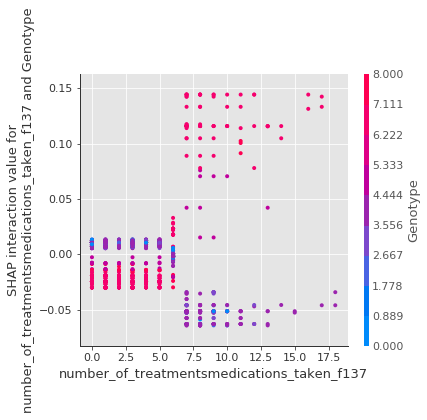

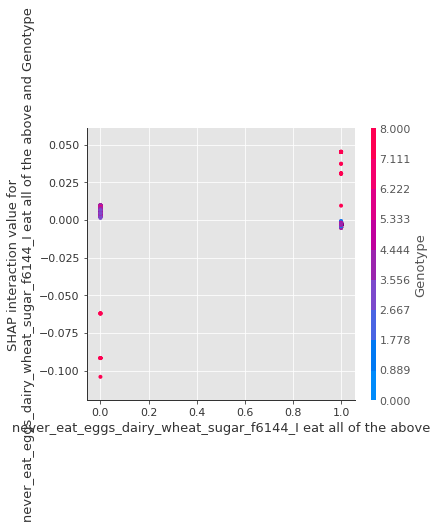

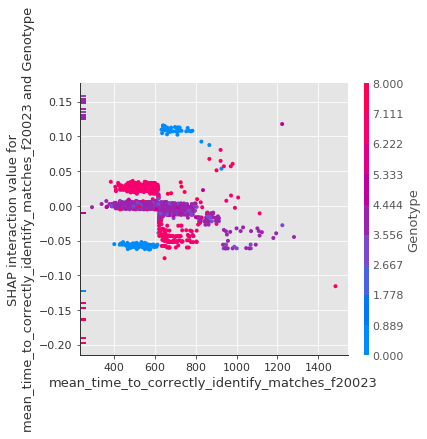

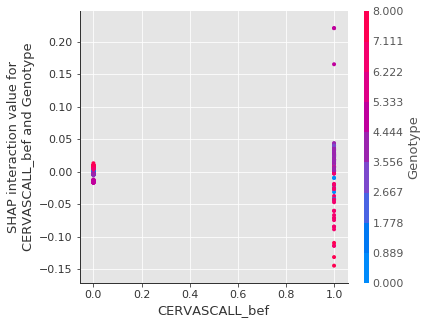

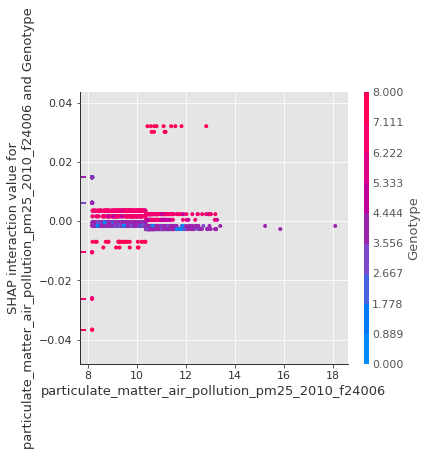

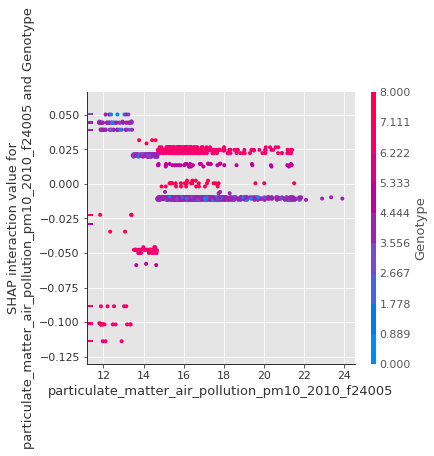

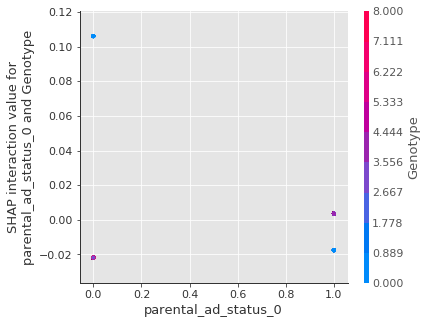

In [83]:
from matplotlib.backends.backend_pdf import PdfPages
import matplotlib.pyplot as plt

# Create the PdfPages object to which we will save the pages:
# The with statement makes sure that the PdfPages object is closed properly at
# the end of the block, even if an Exception occurs.
for col in X1.columns[inds]:
    for col1 in X1.columns[inds]:
        if col!=col1 and col1=='Genotype':
            shap.dependence_plot((col,col1), shap_interaction_values, X1.iloc[:2000,:],
                                        interaction_index=None,show=False)

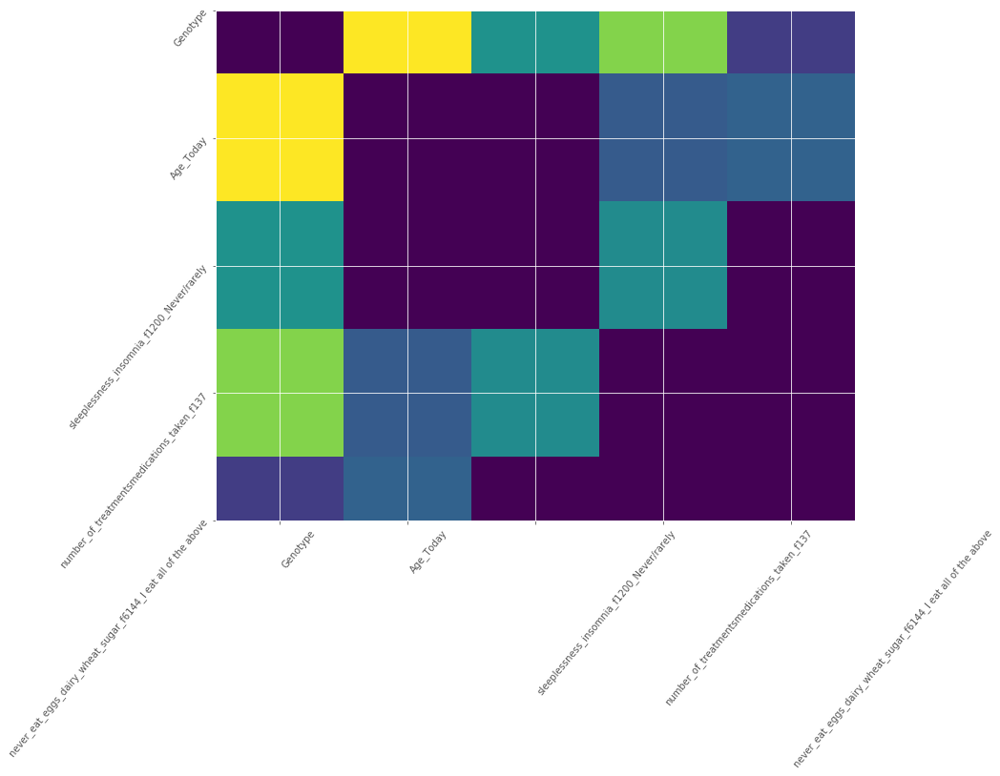

In [62]:
tmp = np.abs(shap_interaction_values).mean(0)
for i in range(tmp.shape[0]):
    tmp[i,i] = 0
inds = np.argsort(-tmp.mean(0))[:5]
tmp2 = tmp[inds,:][:,inds]
pl.figure(figsize=(12,12))
pl.imshow(tmp2)
pl.yticks(range(tmp2.shape[0]), X1.columns[inds], rotation=50.4, horizontalalignment="right")
pl.xticks(range(tmp2.shape[0]), X1.columns[inds], rotation=50.4, horizontalalignment="left")
#pl.gca().xaxis.tick_top()
pl.show()

<Figure size 1440x1440 with 0 Axes>

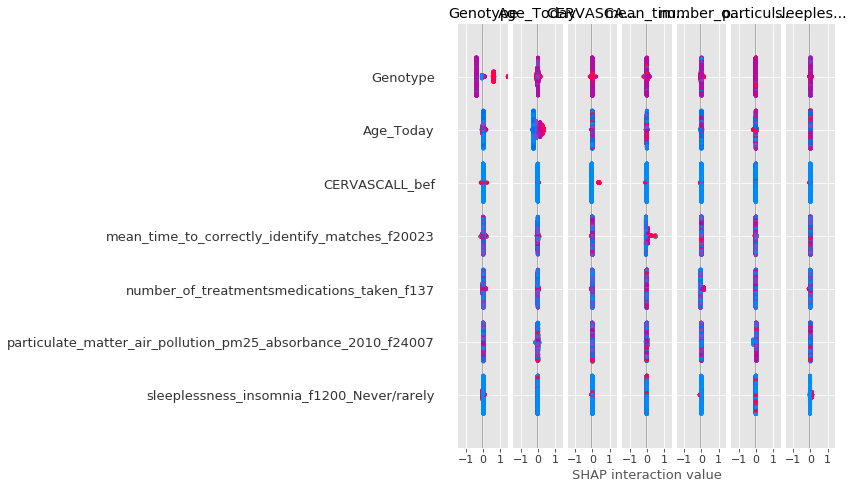

In [60]:
plt.figure(figsize=(20,20))
shap.summary_plot(shap_interaction_values, X1.iloc[:2000,:])

In [ ]:
shap_values = explainer.shap_values(X1)

KeyboardInterrupt: 

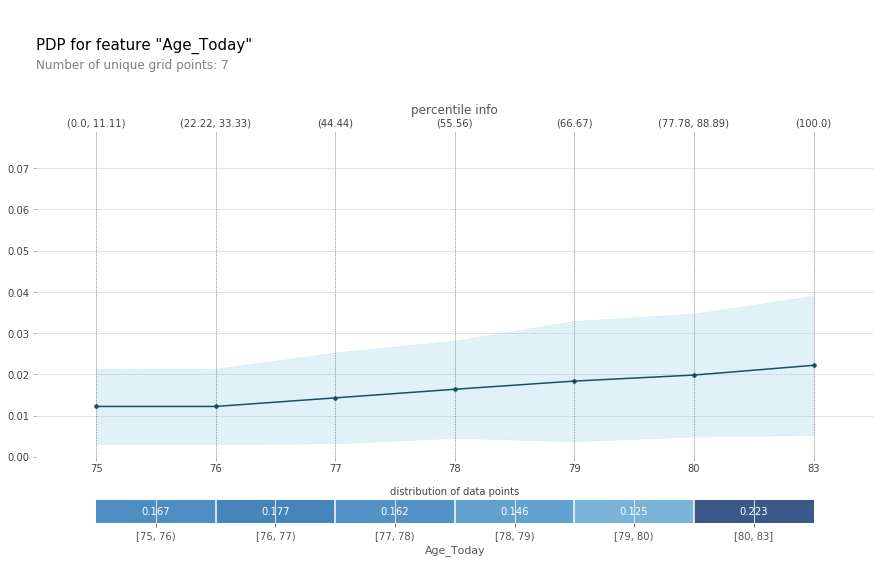

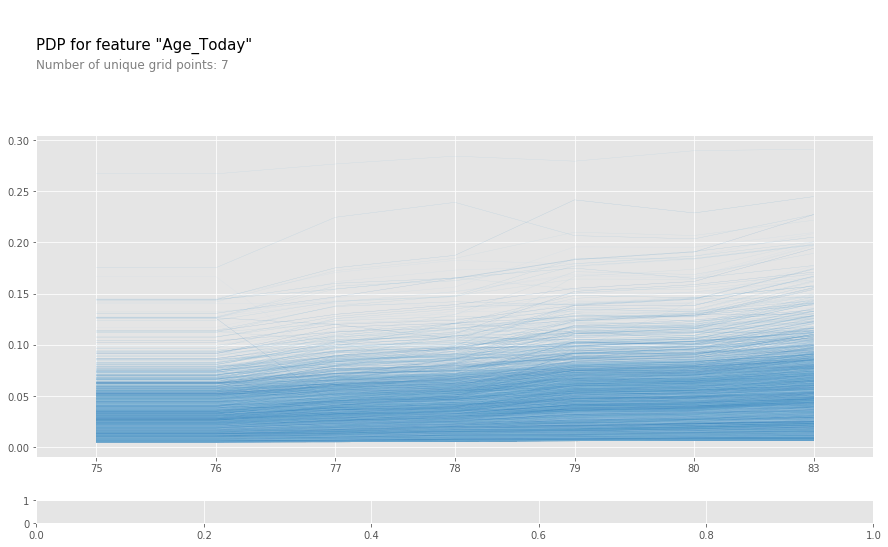

In [46]:
from pdpbox import pdp, info_plots
pdp_age = pdp.pdp_isolate(
    model=mod_xgb, dataset=X1, model_features=X1.columns, feature='Age_Today'
)
#PDP Plot
fig, axes = pdp.pdp_plot(pdp_age, 'Age_Today', plot_lines=False, center=False, frac_to_plot=0.5, plot_pts_dist=True,x_quantile=True, show_percentile=True)
#ICE Plot
fig, axes = pdp.pdp_plot(pdp_age, 'Age_Today', plot_lines=True, center=False, frac_to_plot=0.5, plot_pts_dist=True,x_quantile=True, show_percentile=True)
plt.show()

In [ ]:
import shap
explainer=shap.TreeExplainer(mod_xgb)
#
shap_values = explainer.shap_values(X1)

In [ ]:
findcols(X1,'pollution')

In [ ]:
shap.summary_plot(shap_values, X1)

In [ ]:
shap_interaction_values.shape

In [ ]:
shap.dependence_plot(("Age_Today", "Genotype"), shap_interaction_values, X1.iloc[:2000,:],interaction_index=None)

AssertionError: 'shap_values' must have the same number of columns as 'features'!

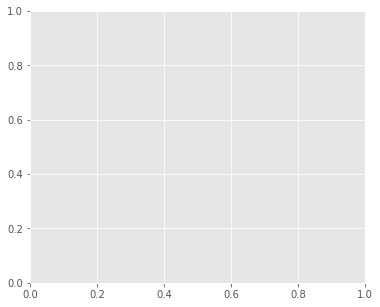

In [47]:
shap.dependence_plot(("CERVASCALL_bef", "Genotype"), shap_interaction_values, X1.iloc[:2000,:],interaction_index=None)

AssertionError: 'shap_values' must have the same number of columns as 'features'!

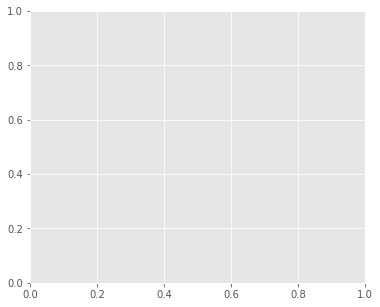

In [48]:
shap.dependence_plot(('particulate_matter_air_pollution_pm25_2010_f24006', "Genotype"), shap_interaction_values, X1.iloc[:2000,:],interaction_index=None)

<Figure size 864x864 with 0 Axes>

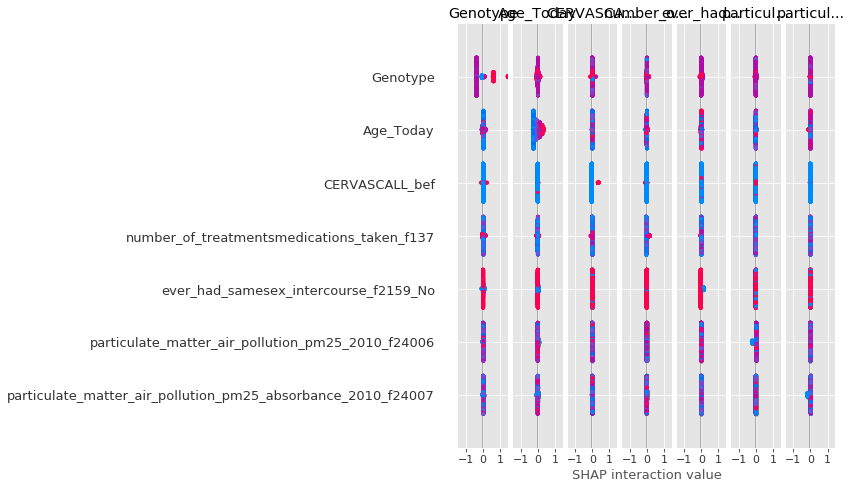

In [35]:
plt.figure(figsize=(12,12))
shap.summary_plot(shap_interaction_values, X1.iloc[:2000,:])

In [28]:
tmp = np.abs(shap_interaction_values).mean(0)
tmp

array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.        , 0.        , 0.        , ..., 0.0086102 , 0.        ,
        0.00078321],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.00078322, 0.        ,
        0.43560284]], dtype=float32)

In [29]:
tmp.shape

(1175, 1175)

In [30]:
shap_interaction_values.shape

(2000, 1175, 1175)

In [31]:
tmp.shape[0]

1175

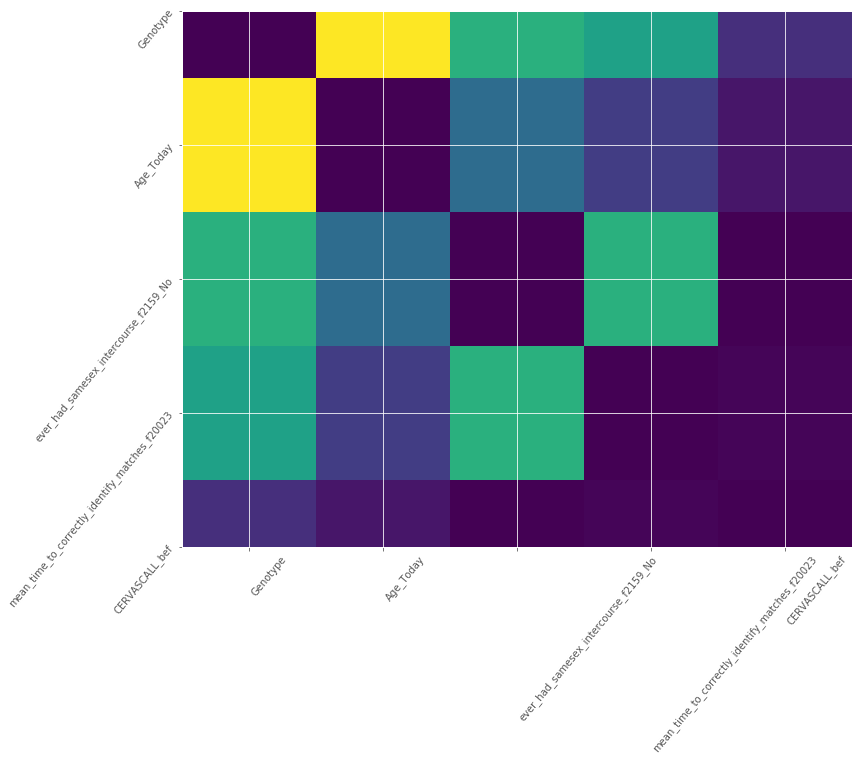

In [33]:
features_set=('Genotype_e3/e4', 'Age_Today')
def pdpplot_3d(df=X,features=features_set,model=mod_xgb):
    fig = plt.figure()
    print(features)

    features = features_set
    pdp, axes = partial_dependence(model, df, features=features,
                                   grid_resolution=20)
    XX, YY = np.meshgrid(axes[0], axes[1])
    Z = pdp[0].T
    ax = Axes3D(fig)
    surf = ax.plot_surface(XX, YY, Z, rstride=1, cstride=1,
                           cmap=plt.cm.BuPu, edgecolor='k')
    ax.set_xlabel(features[0])
    ax.set_ylabel(features[1])
    ax.set_zlabel('Partial dependence')
    #  pretty init view
    ax.view_init(elev=22, azim=122)
    plt.colorbar(surf)
    plt.suptitle('Partial dependence of age and genotype')
    plt.subplots_adjust(top=0.9)

    plt.show()
    

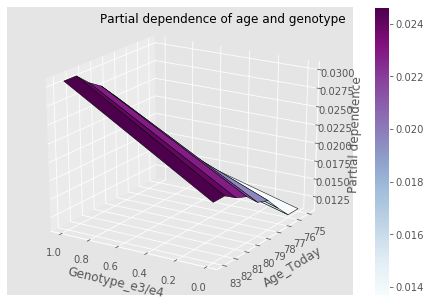

In [109]:
pdpplot_3d()

In [121]:
pdpplot_3d(df=X1,features=('Genotype','Age_Today'))

('Genotype', 'Age_Today')


ValueError: A given column is not a column of the dataframe

<Figure size 432x288 with 0 Axes>

In [13]:
findcols(X,'pollution')

['nitrogen_dioxide_air_pollution_2010_f24003',
 'nitrogen_oxides_air_pollution_2010_f24004',
 'particulate_matter_air_pollution_pm10_2010_f24005',
 'particulate_matter_air_pollution_pm25_2010_f24006',
 'particulate_matter_air_pollution_pm25_absorbance_2010_f24007',
 'particulate_matter_air_pollution_2510um_2010_f24008',
 'nitrogen_dioxide_air_pollution_2005_f24016',
 'nitrogen_dioxide_air_pollution_2006_f24017',
 'nitrogen_dioxide_air_pollution_2007_f24018',
 'particulate_matter_air_pollution_pm10_2007_f24019']

In [32]:
X['sex_f31_Male'].dtype=='uint8'

True

In [34]:

def replacenullsmean(df):
    for col in df.columns:
        nullmask=(df[col].isna())
        df[col][nullmask]=df[col][~nullmask].mean()
    return df

X2=replacenullsmean(X)

In [37]:
from pdpbox import pdp, get_dataset, info_plots
def pdpcontour(df,features,model=mod_xgb):
    inter1 = pdp.pdp_interact(model=mod_xgb, dataset=df, model_features=df.columns,features=features)
    fig, axes = pdp.pdp_interact_plot(\
    pdp_interact_out=inter1, feature_names=features,plot_type='contour', x_quantile=True, plot_pdp=True)

    

findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.


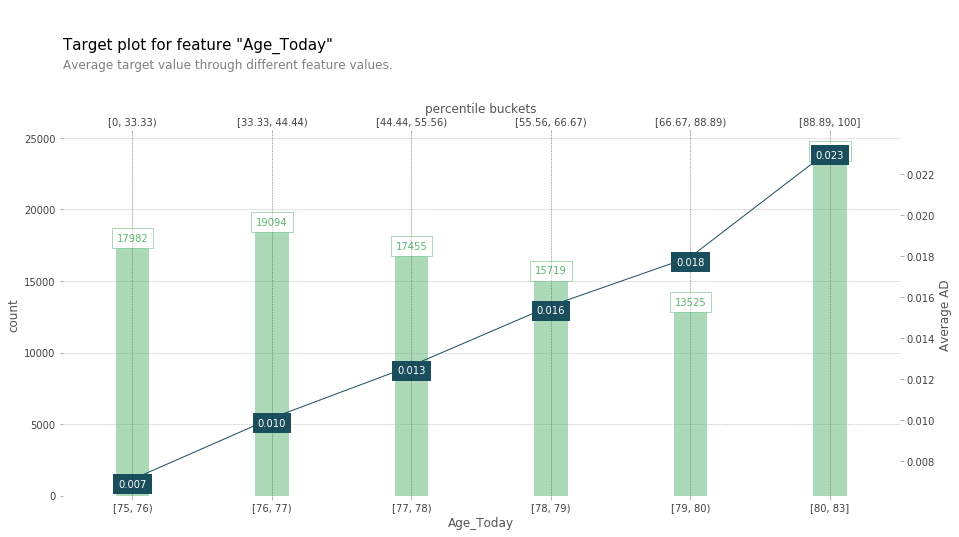

In [50]:
fig, axes, summary_df = info_plots.target_plot(df=X1, feature='Age_Today', feature_name='Age_Today', target='AD', show_percentile=True)


In [67]:
dictlkup['Genotype_e1/e2']

1

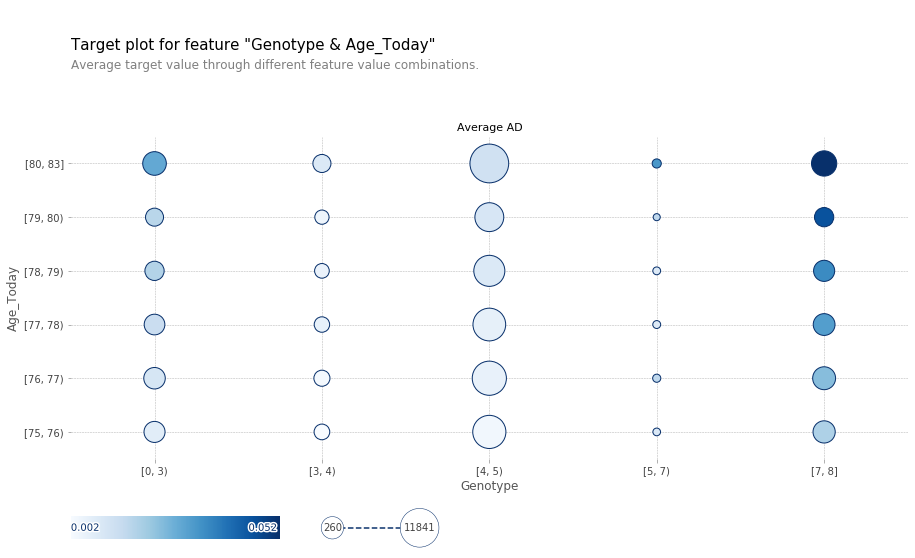

In [74]:
fig, axes, summary_df = info_plots.target_plot_interact(\
df=X1, features=['Genotype', 'Age_Today'], feature_names=['Genotype', 'Age_Today'], target='AD'\
)

TypeError: clabel() got an unexpected keyword argument 'contour_label_fontsize'

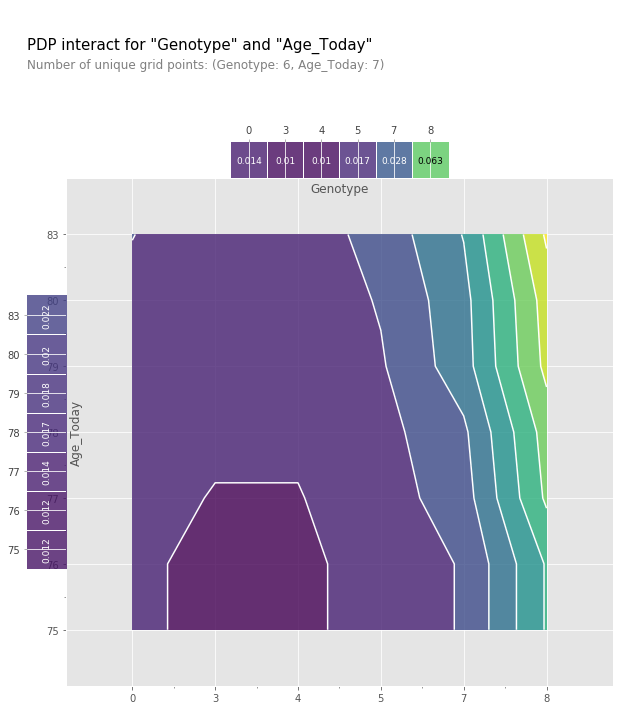

In [122]:
pdpcontour(X1,['Genotype', 'Age_Today'],model=mod_xgb)

In [79]:
pdpcontour(X1,['Genotype', 'particulate_matter_air_pollution_pm25_2010_f24006'],model=mod_xgb)

ValueError: feature_names may not contain [, ] or <

TypeError: clabel() got an unexpected keyword argument 'contour_label_fontsize'

findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.


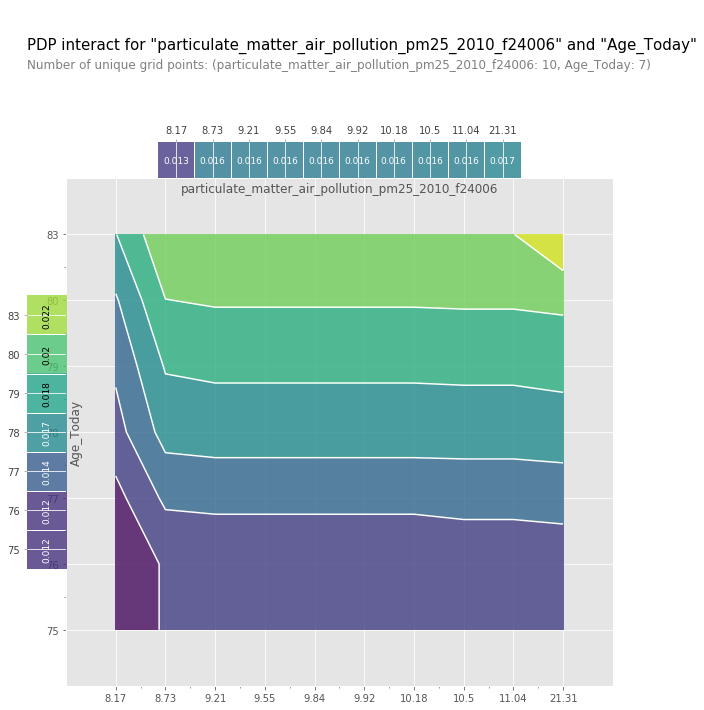

In [36]:


inter1 = pdp.pdp_interact(model=mod_xgb, dataset=X2, model_features=X.columns,features=['particulate_matter_air_pollution_pm25_2010_f24006', 'Age_Today'])
 
fig, axes = pdp.pdp_interact_plot(\
pdp_interact_out=inter1, feature_names=['particulate_matter_air_pollution_pm25_2010_f24006', 'Age_Today'],
                                  plot_type='contour', x_quantile=True, plot_pdp=True)

In [42]:
inter1.describe()

AttributeError: 'PDPInteract' object has no attribute 'describe'